In [4]:
!pip install tensorboardX

     |████████████████████████████████| 204kB 3.3MB/s 


# Importing dependencies

In [0]:
import torchvision
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
from torch.autograd.variable import Variable
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
import imageio


# Data Loading 

## Initalizing constants

In [0]:
batch_size = 100
img_size = 28 * 28
channel = 1
img = 28

In [0]:
transform = torchvision.transforms.Compose([
                                            transforms.ToTensor(),
                                            transforms.Normalize((0.5,), (0.5,))
                                            ])

In [0]:
dataset_train = torchvision.datasets.MNIST(root="./data", 
                                           train=True, 
                                           download=True, 
                                           transform=transform)

In [0]:
dataset_test = torchvision.datasets.MNIST(root='./data', 
                                          train=False, 
                                          download=True,
                                          transform=transform)

In [11]:
print(f'The length of training dataset : {len(dataset_train)}')
print(f'The length of testing dataset : {len(dataset_test)}')

The length of training dataset : 60000
The length of testing dataset : 10000


## Concatenating train and test dataset

In [12]:
dataset = dataset_test + dataset_train
print(f'Length of complete dataset : {len(dataset)}')

Length of complete dataset : 70000


In [14]:
dataloader = torch.utils.data.DataLoader(dataset, 
                                         batch_size = batch_size, 
                                         shuffle=True)

num_batches = len(dataloader)
print(f'Number of batches is : {num_batches}')

Number of batches is : 700


# Helper functions



In [0]:
def images_to_vector(images):
  '''
  Flatten image
  '''
  return images.view(images.size(0), img_size)

def vector_to_image(vectors):
  '''
  Convert vector to 2-d image
  '''
  return vectors.view(vectors.size(0), channel, img, img)


In [0]:
def noise(size):
  '''
  Generate 1-d vector of guassian sampled random values
  '''
  return Variable(torch.randn(size, 100))
  

In [0]:
def ones_target(size):
  '''
  Real images  = 1
  '''
  return Variable(torch.ones(size, 1))

def zeros_target(size):
  '''
  Fake images = 0
  '''
  return Variable(torch.zeros(size, 1))


# Discriminator

In [0]:
class DiscriminatorNetwork(torch.nn.Module):
  '''
  A 3 hidden layer discriminative neural network
  '''
  def __init__(self):
    super(DiscriminatorNetwork, self).__init__()
    img_size = 784           #(28 * 28)
    out = 1

    self.hidden1 = nn.Sequential(
                                nn.Linear(img_size, 1024),
                                nn.LeakyReLU(0.2),
                                nn.Dropout(0.3)
                  )
    
    self.hidden2 = nn.Sequential(
                                nn.Linear(1024, 512),
                                nn.LeakyReLU(0.2),
                                nn.Dropout(0.3)
    )

    self.hidden3 = nn.Sequential(
                                nn.Linear(512, 256),
                                nn.LeakyReLU(0.2),
                                nn.Dropout(0.3)
    )

    self.output = nn.Sequential(
                                nn.Linear(256, out),
                                nn.Sigmoid()
    )
  
  def forward(self, x):
    x = self.hidden1(x)
    x = self.hidden2(x)
    x = self.hidden3(x)
    x = self.output(x)
    return x

discriminator = DiscriminatorNetwork()    


# Generator

In [0]:
class GeneratorNetwork(torch.nn.Module):
  '''
  A 3 hidden layer generative neural network
  '''

  def __init__(self):
    super(GeneratorNetwork, self).__init__()
    features = 100
    out = 784

    self.hidden1 = nn.Sequential(
                                nn.Linear(features, 256),
                                nn.LeakyReLU(0.2)
    )

    self.hidden2 = nn.Sequential(
                                nn.Linear(256, 512),
                                nn.LeakyReLU(0.2)
    )

    self.hidden3 = nn.Sequential(
                                nn.Linear(512, 1024),
                                nn.LeakyReLU(0.2)
    )

    self.output = nn.Sequential(
                                nn.Linear(1024, out),
                                nn.Tanh()
    )

  
  def forward(self, x):
    x = self.hidden1(x)
    x = self.hidden2(x)
    x = self.hidden3(x)
    x = self.output(x)
    return x


generator = GeneratorNetwork()


In [0]:
dis_optimizer = optim.Adam(discriminator.parameters(), lr = 0.0002)
gen_optimizer = optim.Adam(generator.parameters(), lr = 0.0002)

# Loss function

In [0]:
loss = nn.BCELoss()

In [0]:
def train_discriminator(optimizer, real_data, fake_data):
  N = real_data.size(0)
  optimizer.zero_grad()

  # Train on real data
  prediction_real = discriminator(real_data)
  error_real = loss(prediction_real, ones_target(N))
  error_real.backward()

  # Train on fake data
  prediction_fake = discriminator(fake_data)
  error_fake = loss(prediction_fake, zeros_target(N))
  error_fake.backward()

  optimizer.step()

  return error_real + error_fake, prediction_real, prediction_fake

In [0]:
def train_generator(optimizer, fake_data):
  N = fake_data.size(0)
  optimizer.zero_grad()

  #sample noise and generate fake data
  prediction = discriminator(fake_data)

  #calculate error and backpropogate
  error = loss(prediction, ones_target(N))
  error.backward()

  #update weights with gradient
  optimizer.step()

  return error

In [0]:
test_samples = 16
test_noise = noise(test_samples)

# Training DCGAN

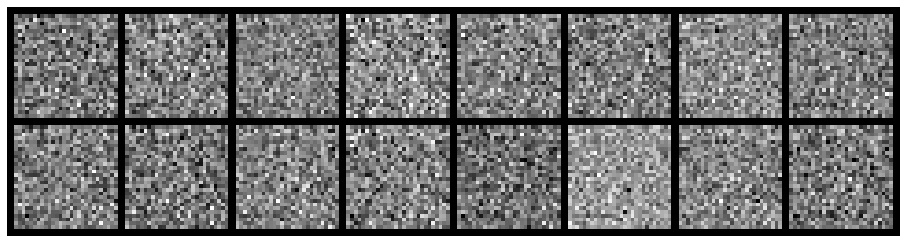

Epoch: [0/100], Batch Num: [0/700]
Discriminator Loss: 1.3755, Generator Loss: 0.6799
D(x): 0.5130, D(G(z)): 0.5072


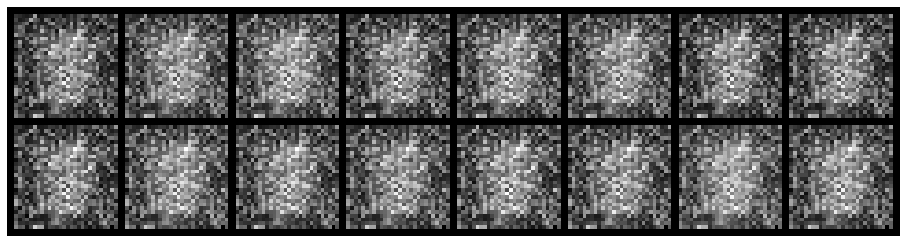

Epoch: [0/100], Batch Num: [100/700]
Discriminator Loss: 2.4014, Generator Loss: 0.1712
D(x): 0.6124, D(G(z)): 0.8147


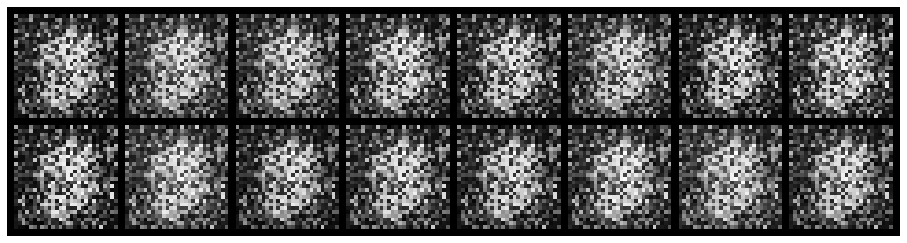

Epoch: [0/100], Batch Num: [200/700]
Discriminator Loss: 0.4222, Generator Loss: 4.6251
D(x): 0.8638, D(G(z)): 0.2045


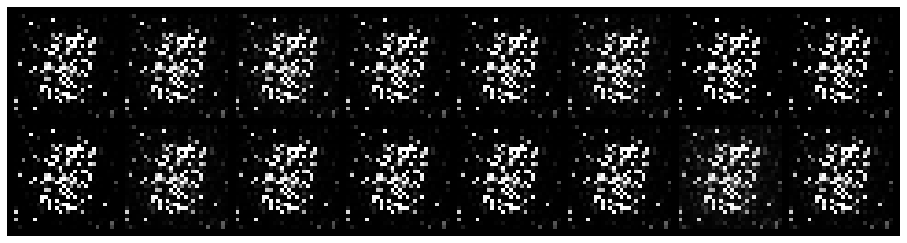

Epoch: [0/100], Batch Num: [300/700]
Discriminator Loss: 0.1438, Generator Loss: 5.5595
D(x): 0.9493, D(G(z)): 0.0621


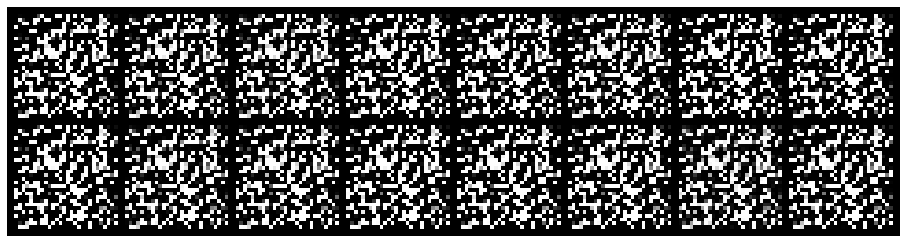

Epoch: [0/100], Batch Num: [400/700]
Discriminator Loss: 0.0100, Generator Loss: 9.6622
D(x): 0.9908, D(G(z)): 0.0006


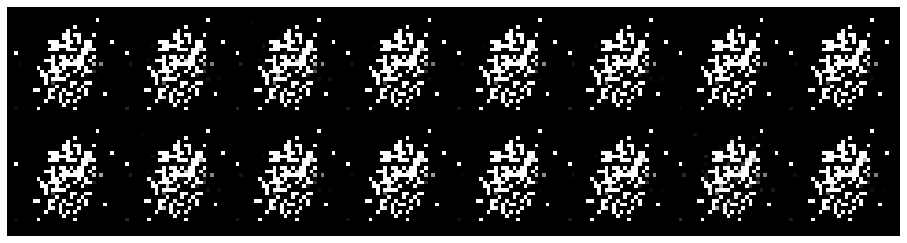

Epoch: [0/100], Batch Num: [500/700]
Discriminator Loss: 0.0765, Generator Loss: 6.8630
D(x): 0.9533, D(G(z)): 0.0081


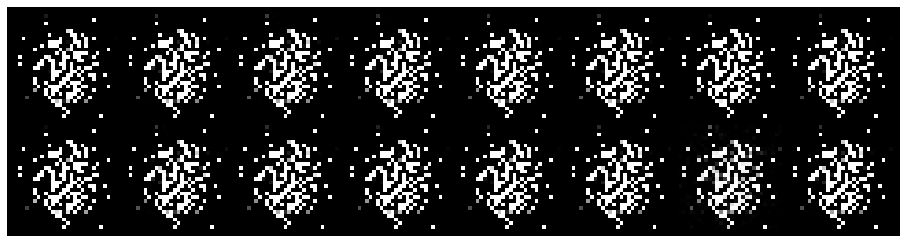

Epoch: [0/100], Batch Num: [600/700]
Discriminator Loss: 0.0462, Generator Loss: 8.9042
D(x): 0.9879, D(G(z)): 0.0144


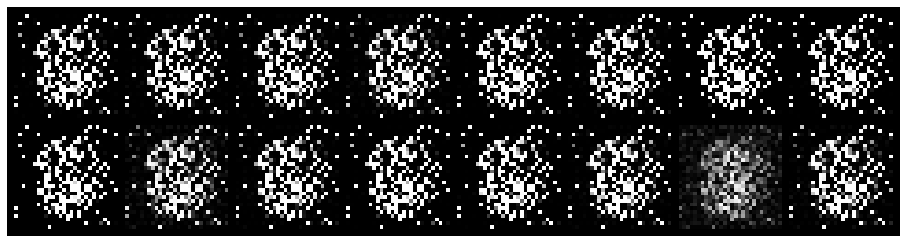

Epoch: [1/100], Batch Num: [0/700]
Discriminator Loss: 0.0300, Generator Loss: 10.0532
D(x): 0.9842, D(G(z)): 0.0112


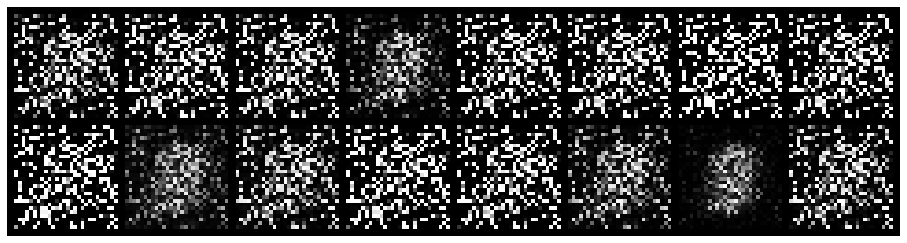

Epoch: [1/100], Batch Num: [100/700]
Discriminator Loss: 0.1591, Generator Loss: 12.1445
D(x): 0.9286, D(G(z)): 0.0463


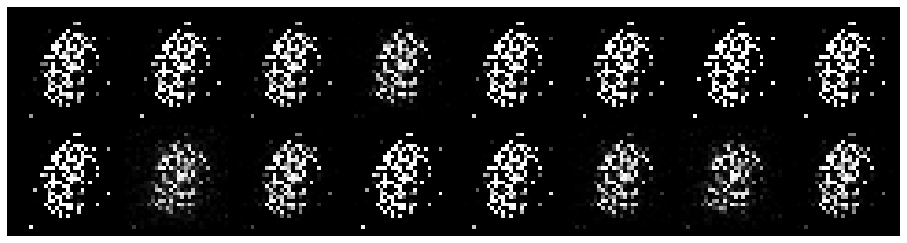

Epoch: [1/100], Batch Num: [200/700]
Discriminator Loss: 0.2146, Generator Loss: 12.0160
D(x): 0.9044, D(G(z)): 0.0506


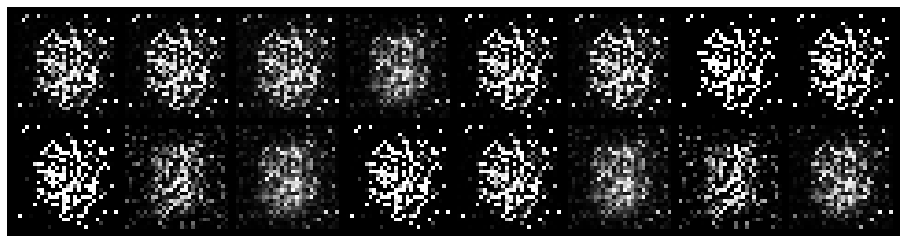

Epoch: [1/100], Batch Num: [300/700]
Discriminator Loss: 0.1445, Generator Loss: 6.9874
D(x): 0.9465, D(G(z)): 0.0519


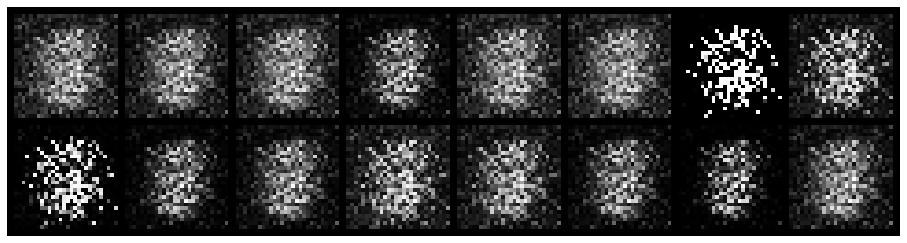

Epoch: [1/100], Batch Num: [400/700]
Discriminator Loss: 0.3478, Generator Loss: 7.6136
D(x): 0.8279, D(G(z)): 0.0703


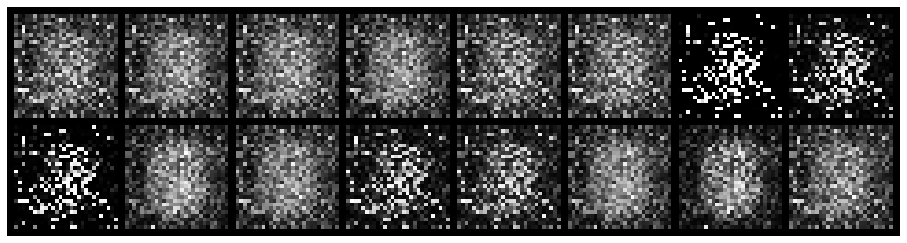

Epoch: [1/100], Batch Num: [500/700]
Discriminator Loss: 0.3074, Generator Loss: 9.6118
D(x): 0.9014, D(G(z)): 0.1019


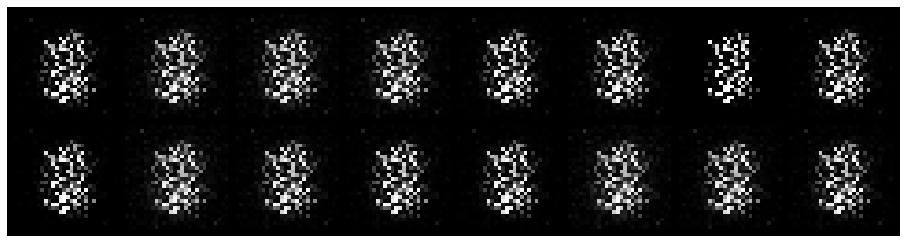

Epoch: [1/100], Batch Num: [600/700]
Discriminator Loss: 0.1058, Generator Loss: 9.6463
D(x): 0.9712, D(G(z)): 0.0386


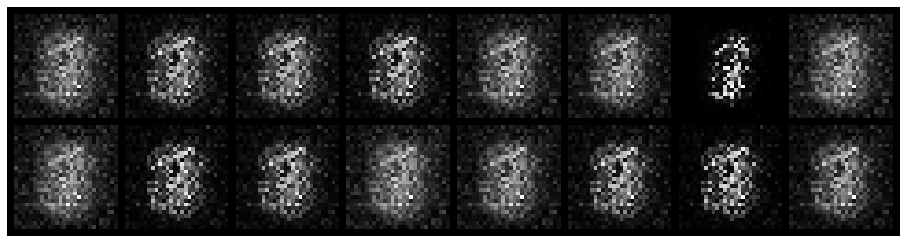

Epoch: [2/100], Batch Num: [0/700]
Discriminator Loss: 0.4975, Generator Loss: 7.4341
D(x): 0.8174, D(G(z)): 0.1311


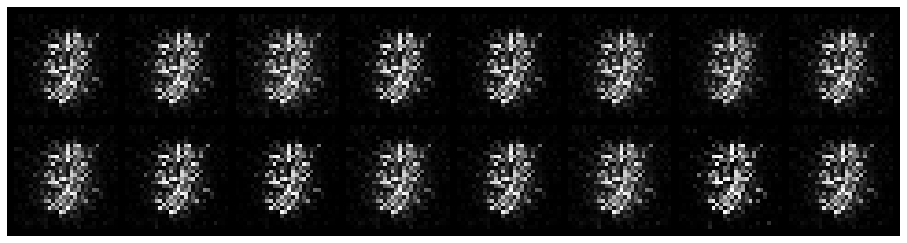

Epoch: [2/100], Batch Num: [100/700]
Discriminator Loss: 0.2223, Generator Loss: 3.6756
D(x): 0.8875, D(G(z)): 0.0784


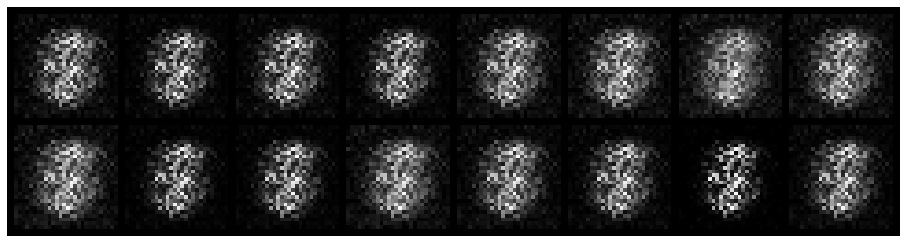

Epoch: [2/100], Batch Num: [200/700]
Discriminator Loss: 1.2155, Generator Loss: 1.8117
D(x): 0.6873, D(G(z)): 0.3956


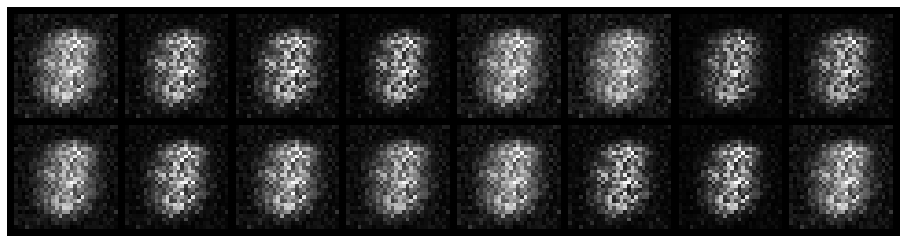

Epoch: [2/100], Batch Num: [300/700]
Discriminator Loss: 0.8228, Generator Loss: 2.8562
D(x): 0.7461, D(G(z)): 0.2579


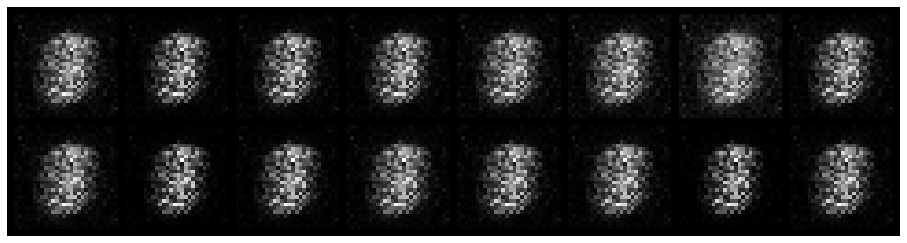

Epoch: [2/100], Batch Num: [400/700]
Discriminator Loss: 0.9442, Generator Loss: 2.4406
D(x): 0.6388, D(G(z)): 0.1662


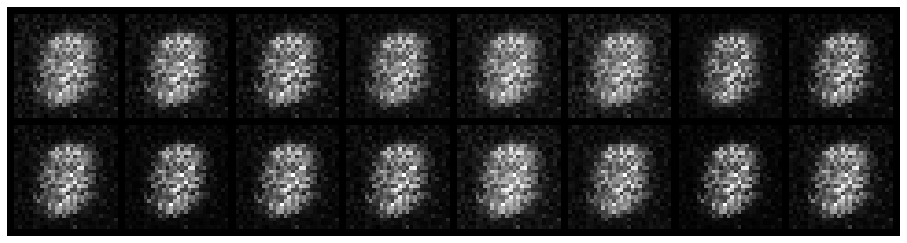

Epoch: [2/100], Batch Num: [500/700]
Discriminator Loss: 0.6017, Generator Loss: 3.5675
D(x): 0.8520, D(G(z)): 0.2204


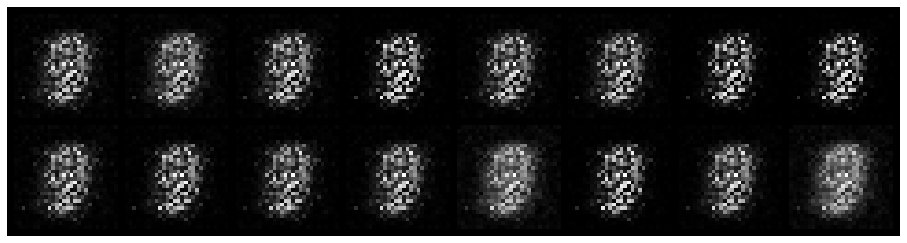

Epoch: [2/100], Batch Num: [600/700]
Discriminator Loss: 0.5646, Generator Loss: 3.8531
D(x): 0.8280, D(G(z)): 0.1936


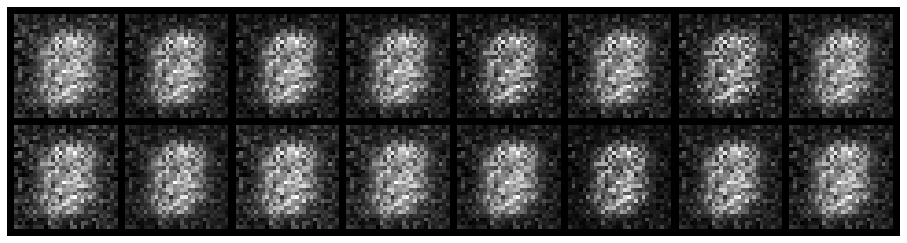

Epoch: [3/100], Batch Num: [0/700]
Discriminator Loss: 1.0227, Generator Loss: 1.2866
D(x): 0.7034, D(G(z)): 0.3991


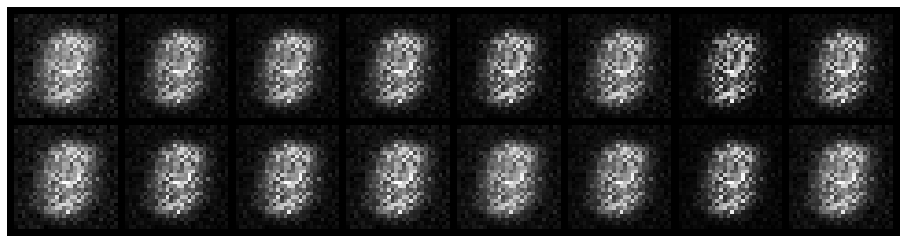

Epoch: [3/100], Batch Num: [100/700]
Discriminator Loss: 0.9956, Generator Loss: 1.2762
D(x): 0.7414, D(G(z)): 0.4199


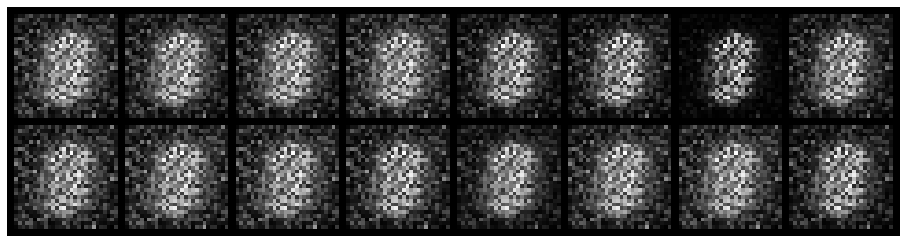

Epoch: [3/100], Batch Num: [200/700]
Discriminator Loss: 0.5116, Generator Loss: 3.0282
D(x): 0.8606, D(G(z)): 0.2193


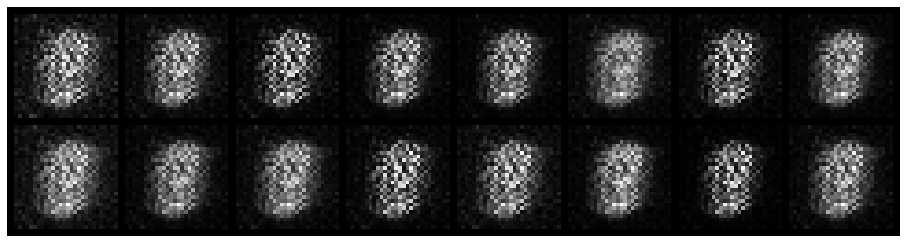

Epoch: [3/100], Batch Num: [300/700]
Discriminator Loss: 1.2435, Generator Loss: 1.7211
D(x): 0.6242, D(G(z)): 0.4007


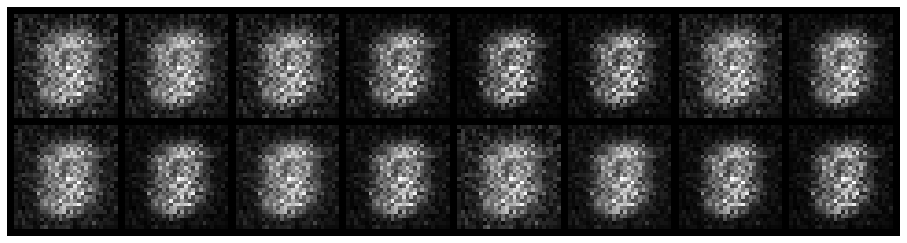

Epoch: [3/100], Batch Num: [400/700]
Discriminator Loss: 0.4931, Generator Loss: 2.4726
D(x): 0.8940, D(G(z)): 0.2642


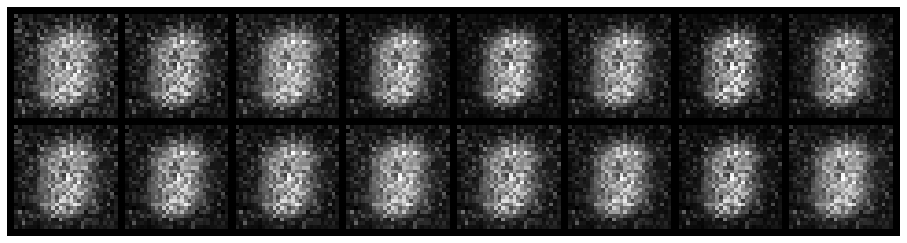

Epoch: [3/100], Batch Num: [500/700]
Discriminator Loss: 0.6790, Generator Loss: 2.9421
D(x): 0.8397, D(G(z)): 0.2626


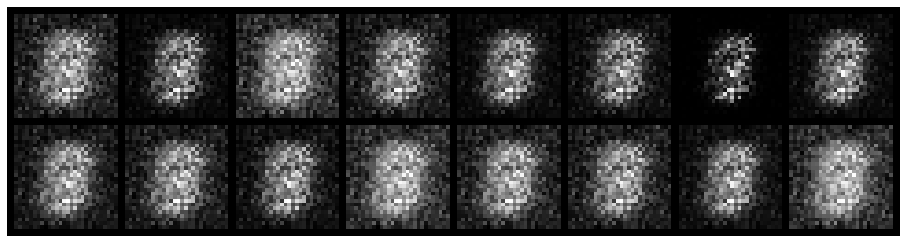

Epoch: [3/100], Batch Num: [600/700]
Discriminator Loss: 0.7365, Generator Loss: 2.0715
D(x): 0.8299, D(G(z)): 0.2702


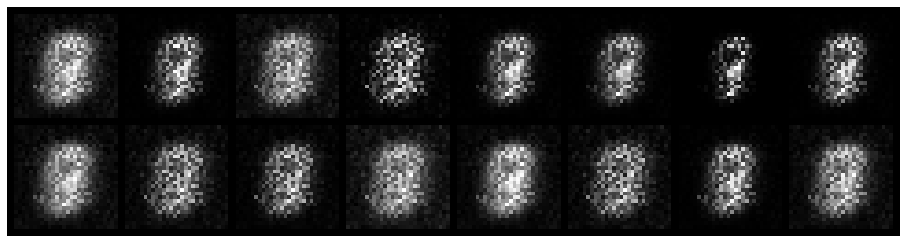

Epoch: [4/100], Batch Num: [0/700]
Discriminator Loss: 0.7586, Generator Loss: 2.6320
D(x): 0.7518, D(G(z)): 0.1857


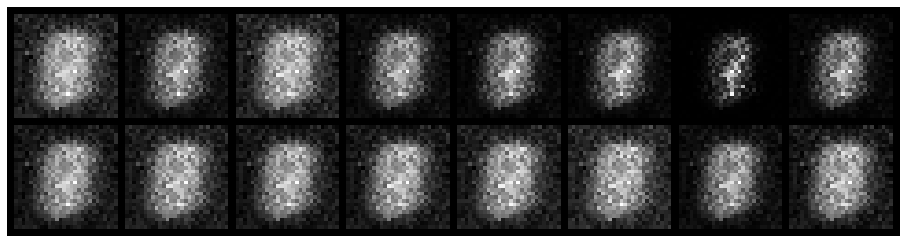

Epoch: [4/100], Batch Num: [100/700]
Discriminator Loss: 0.4468, Generator Loss: 2.4712
D(x): 0.8569, D(G(z)): 0.1750


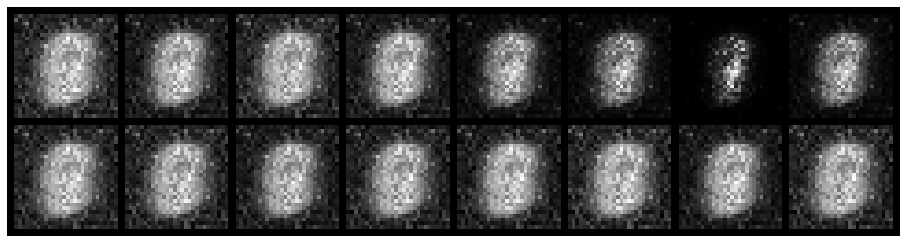

Epoch: [4/100], Batch Num: [200/700]
Discriminator Loss: 0.2980, Generator Loss: 2.8344
D(x): 0.9254, D(G(z)): 0.1283


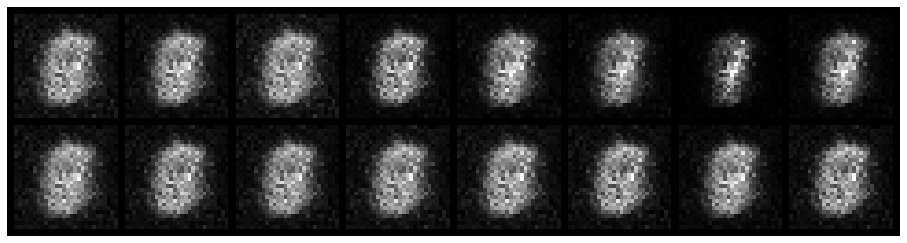

Epoch: [4/100], Batch Num: [300/700]
Discriminator Loss: 0.2038, Generator Loss: 3.4176
D(x): 0.9462, D(G(z)): 0.0997


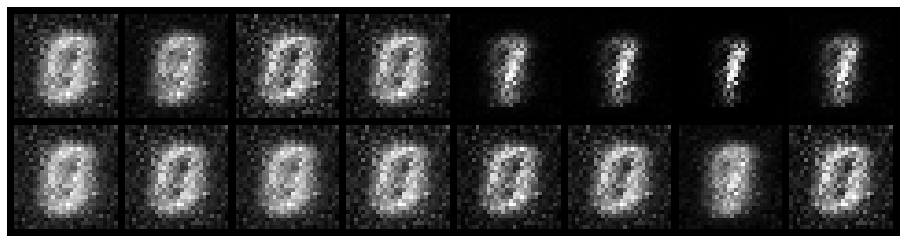

Epoch: [4/100], Batch Num: [400/700]
Discriminator Loss: 0.2931, Generator Loss: 3.4840
D(x): 0.9255, D(G(z)): 0.0661


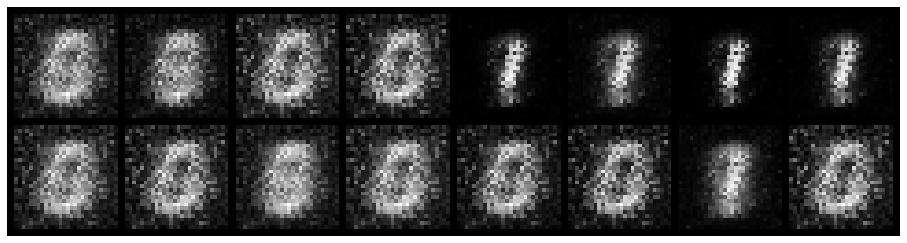

Epoch: [4/100], Batch Num: [500/700]
Discriminator Loss: 0.2288, Generator Loss: 3.3656
D(x): 0.9655, D(G(z)): 0.1233


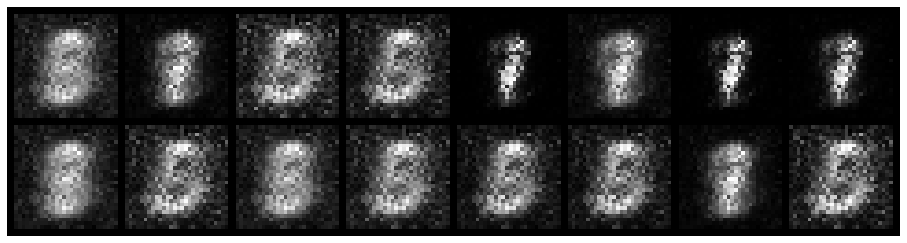

Epoch: [4/100], Batch Num: [600/700]
Discriminator Loss: 0.4803, Generator Loss: 4.9092
D(x): 0.8785, D(G(z)): 0.0389


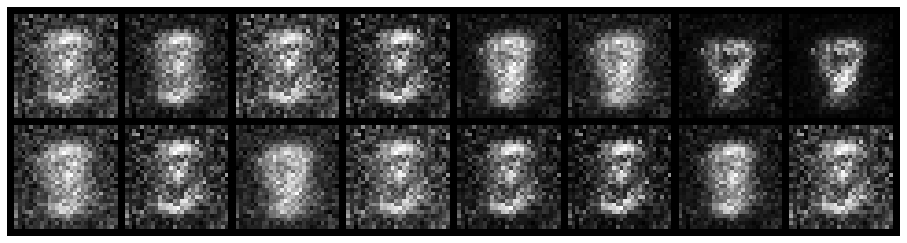

Epoch: [5/100], Batch Num: [0/700]
Discriminator Loss: 0.1467, Generator Loss: 4.5746
D(x): 0.9540, D(G(z)): 0.0572


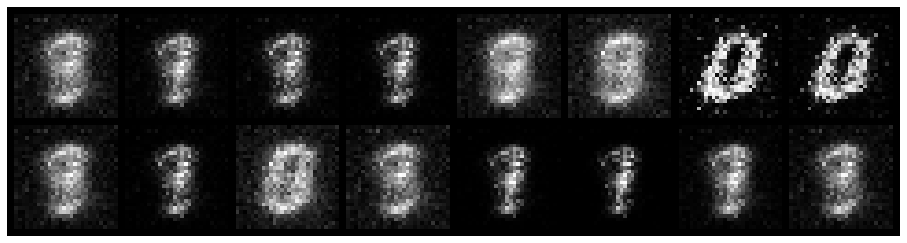

Epoch: [5/100], Batch Num: [100/700]
Discriminator Loss: 0.6770, Generator Loss: 3.8174
D(x): 0.8228, D(G(z)): 0.1740


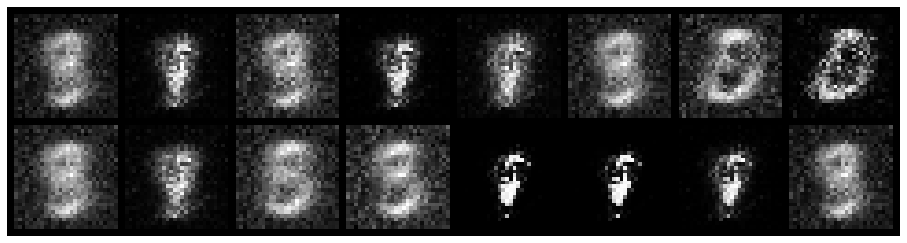

Epoch: [5/100], Batch Num: [200/700]
Discriminator Loss: 0.4547, Generator Loss: 4.5341
D(x): 0.8375, D(G(z)): 0.0615


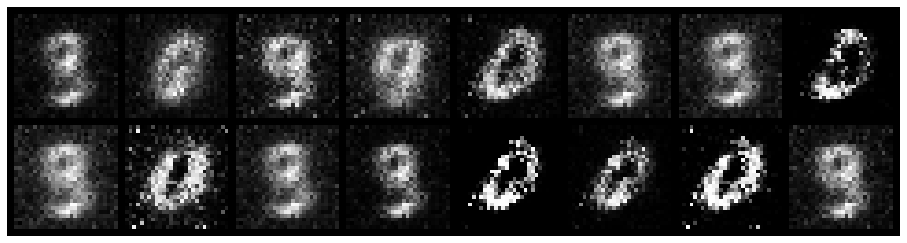

Epoch: [5/100], Batch Num: [300/700]
Discriminator Loss: 0.4629, Generator Loss: 4.6448
D(x): 0.9323, D(G(z)): 0.2109


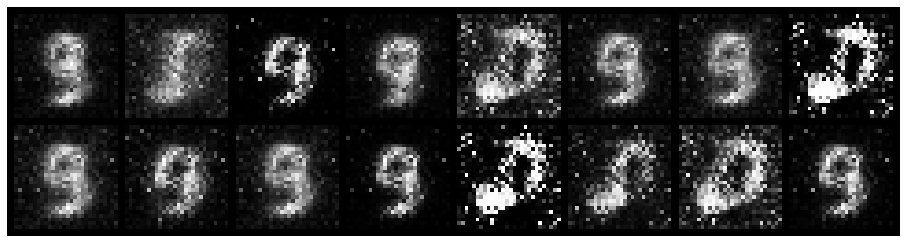

Epoch: [5/100], Batch Num: [400/700]
Discriminator Loss: 0.4009, Generator Loss: 2.3738
D(x): 0.9371, D(G(z)): 0.1866


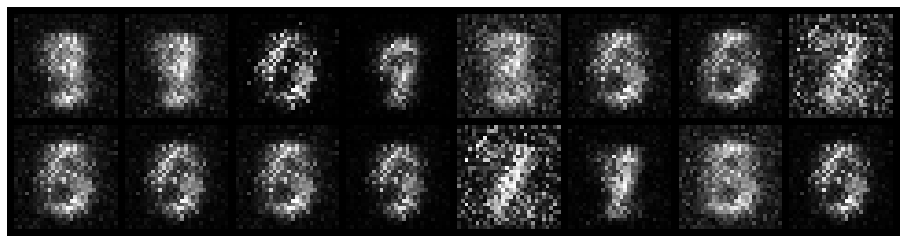

Epoch: [5/100], Batch Num: [500/700]
Discriminator Loss: 0.1430, Generator Loss: 5.0619
D(x): 0.9332, D(G(z)): 0.0303


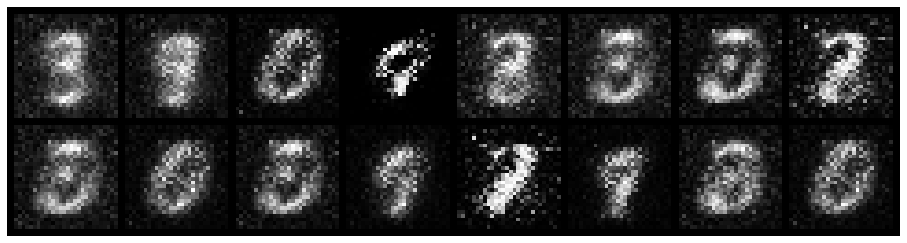

Epoch: [5/100], Batch Num: [600/700]
Discriminator Loss: 0.2830, Generator Loss: 5.0441
D(x): 0.9277, D(G(z)): 0.1397


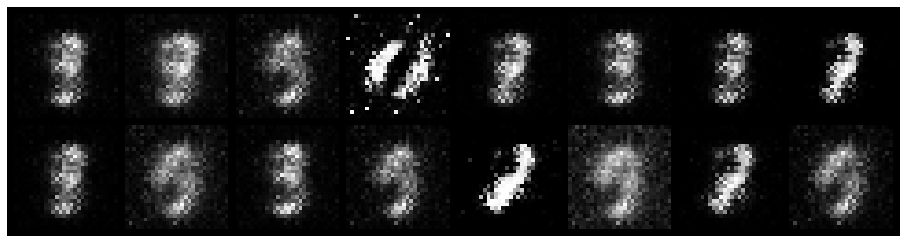

Epoch: [6/100], Batch Num: [0/700]
Discriminator Loss: 0.6448, Generator Loss: 2.7731
D(x): 0.7688, D(G(z)): 0.1083


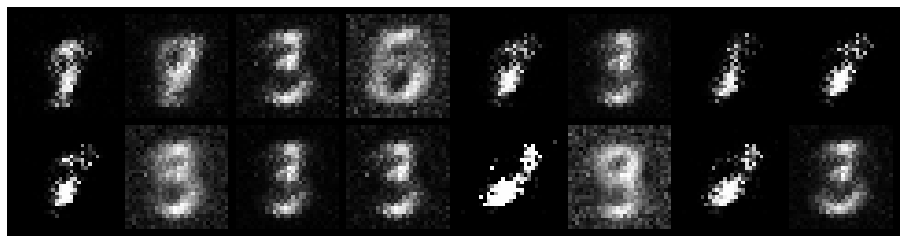

Epoch: [6/100], Batch Num: [100/700]
Discriminator Loss: 0.3868, Generator Loss: 3.0409
D(x): 0.8825, D(G(z)): 0.1192


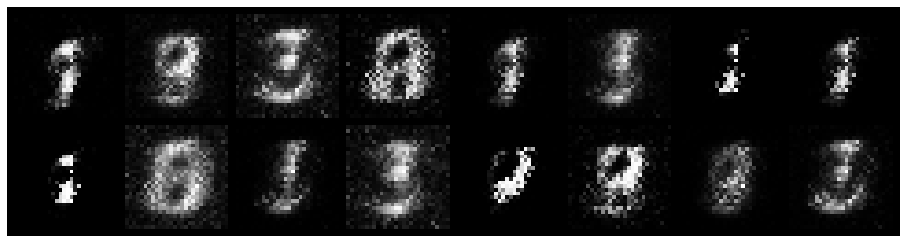

Epoch: [6/100], Batch Num: [200/700]
Discriminator Loss: 0.3839, Generator Loss: 2.8973
D(x): 0.9011, D(G(z)): 0.1316


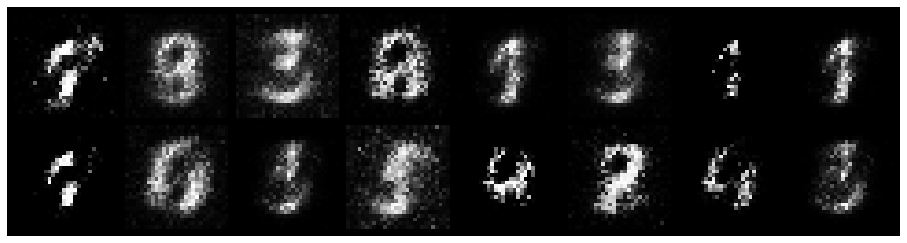

Epoch: [6/100], Batch Num: [300/700]
Discriminator Loss: 0.5347, Generator Loss: 2.9719
D(x): 0.8417, D(G(z)): 0.1998


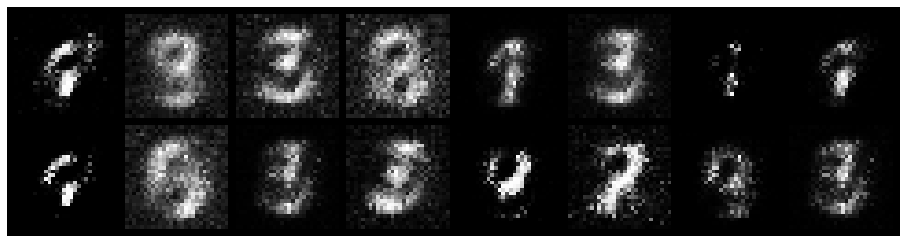

Epoch: [6/100], Batch Num: [400/700]
Discriminator Loss: 0.3525, Generator Loss: 3.3094
D(x): 0.8614, D(G(z)): 0.1192


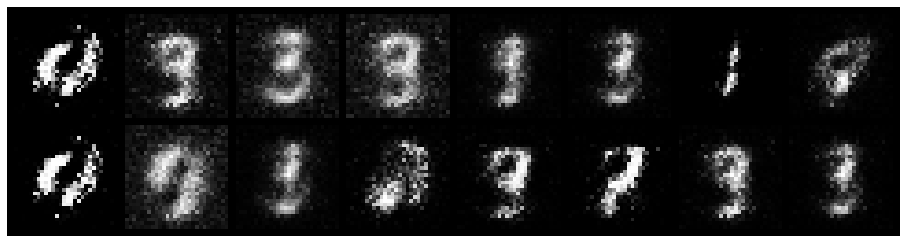

Epoch: [6/100], Batch Num: [500/700]
Discriminator Loss: 0.4048, Generator Loss: 3.9259
D(x): 0.8702, D(G(z)): 0.0682


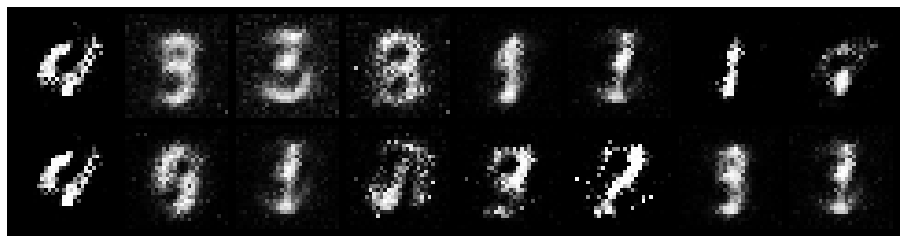

Epoch: [6/100], Batch Num: [600/700]
Discriminator Loss: 0.3463, Generator Loss: 3.0697
D(x): 0.9059, D(G(z)): 0.0777


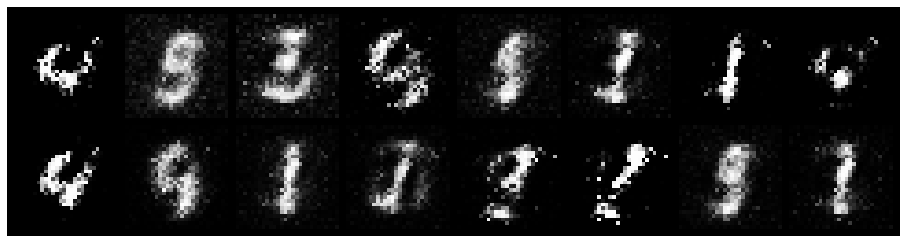

Epoch: [7/100], Batch Num: [0/700]
Discriminator Loss: 0.5467, Generator Loss: 2.6798
D(x): 0.8016, D(G(z)): 0.1425


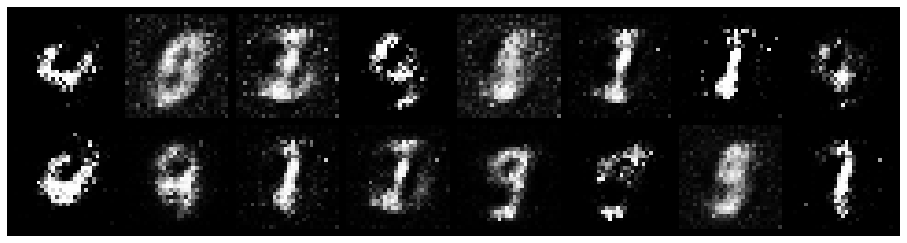

Epoch: [7/100], Batch Num: [100/700]
Discriminator Loss: 0.3871, Generator Loss: 3.6347
D(x): 0.8854, D(G(z)): 0.1330


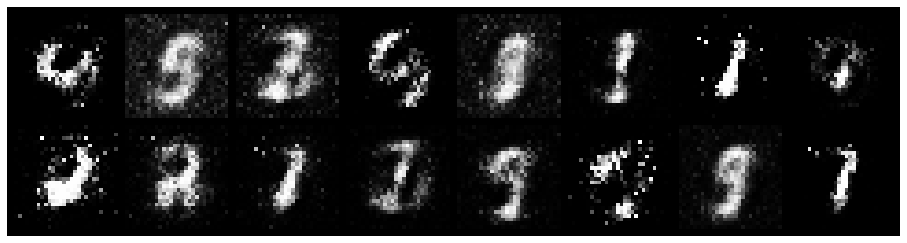

Epoch: [7/100], Batch Num: [200/700]
Discriminator Loss: 0.3053, Generator Loss: 3.5381
D(x): 0.9332, D(G(z)): 0.1373


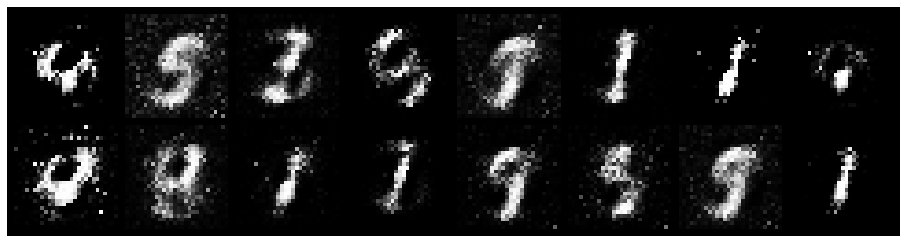

Epoch: [7/100], Batch Num: [300/700]
Discriminator Loss: 0.2976, Generator Loss: 3.1741
D(x): 0.9535, D(G(z)): 0.1517


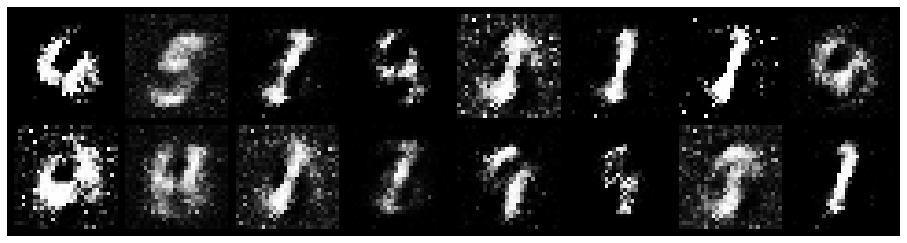

Epoch: [7/100], Batch Num: [400/700]
Discriminator Loss: 0.6791, Generator Loss: 2.6351
D(x): 0.7987, D(G(z)): 0.1780


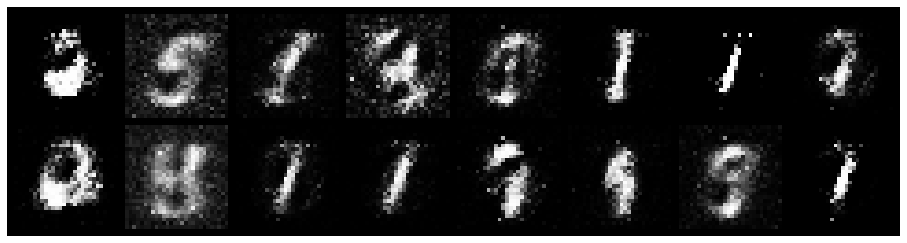

Epoch: [7/100], Batch Num: [500/700]
Discriminator Loss: 0.7674, Generator Loss: 2.7976
D(x): 0.6796, D(G(z)): 0.0815


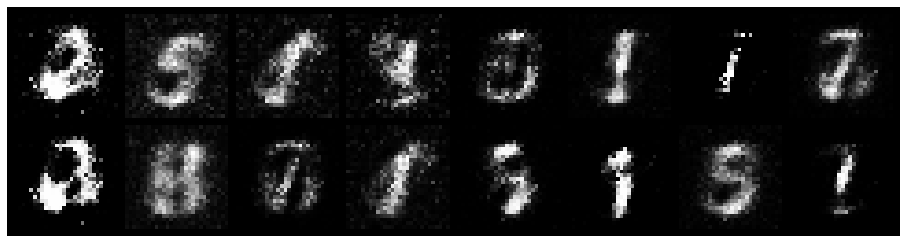

Epoch: [7/100], Batch Num: [600/700]
Discriminator Loss: 0.4316, Generator Loss: 2.6806
D(x): 0.8284, D(G(z)): 0.1313


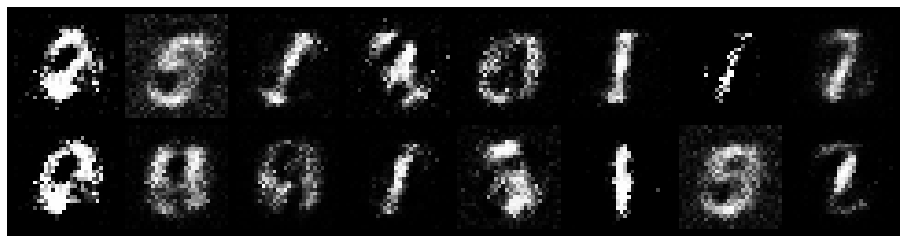

Epoch: [8/100], Batch Num: [0/700]
Discriminator Loss: 0.5666, Generator Loss: 1.8224
D(x): 0.7991, D(G(z)): 0.1566


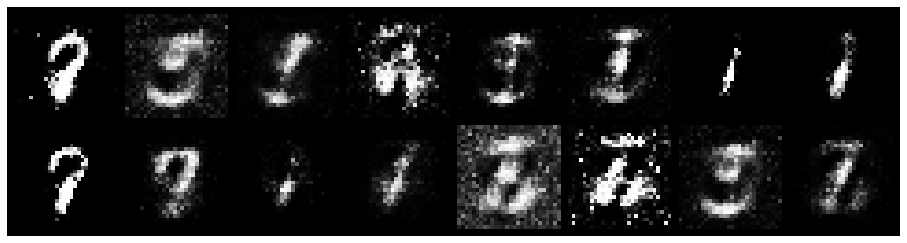

Epoch: [8/100], Batch Num: [100/700]
Discriminator Loss: 0.5792, Generator Loss: 3.0557
D(x): 0.8840, D(G(z)): 0.2012


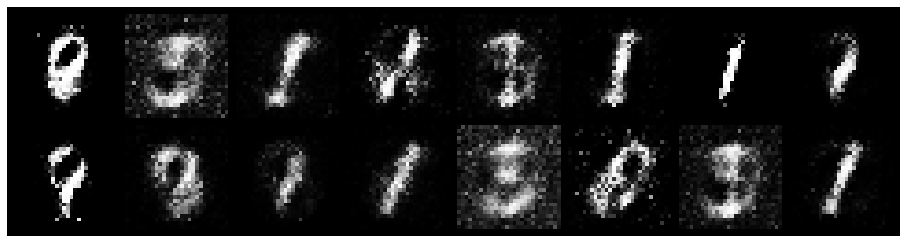

Epoch: [8/100], Batch Num: [200/700]
Discriminator Loss: 0.4041, Generator Loss: 3.2181
D(x): 0.8973, D(G(z)): 0.1417


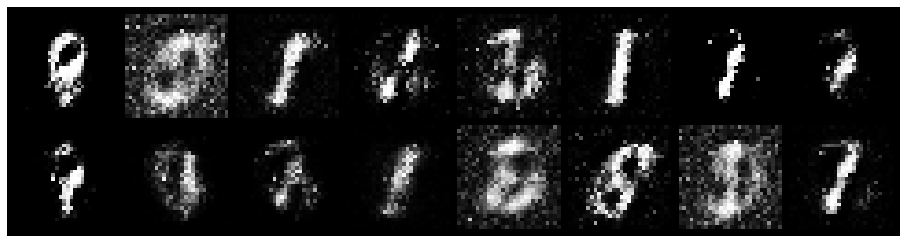

Epoch: [8/100], Batch Num: [300/700]
Discriminator Loss: 0.4613, Generator Loss: 3.1502
D(x): 0.8519, D(G(z)): 0.1575


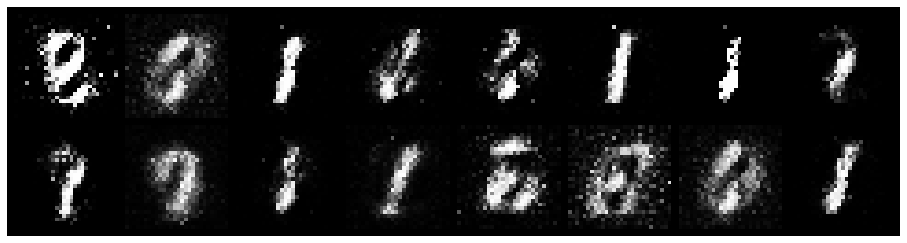

Epoch: [8/100], Batch Num: [400/700]
Discriminator Loss: 0.8014, Generator Loss: 2.1712
D(x): 0.7680, D(G(z)): 0.2497


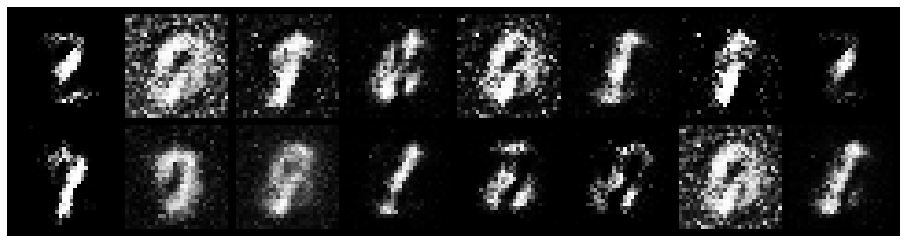

Epoch: [8/100], Batch Num: [500/700]
Discriminator Loss: 0.6560, Generator Loss: 2.9546
D(x): 0.7453, D(G(z)): 0.1078


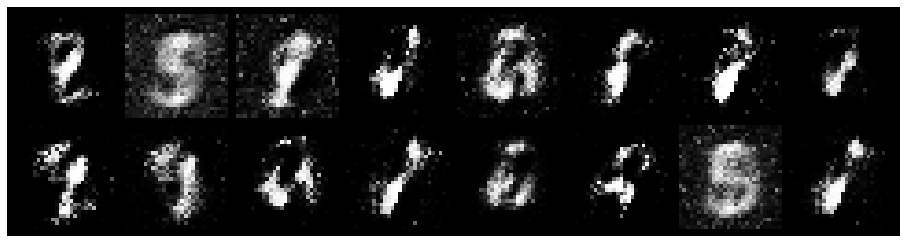

Epoch: [8/100], Batch Num: [600/700]
Discriminator Loss: 0.6054, Generator Loss: 2.9008
D(x): 0.7775, D(G(z)): 0.1399


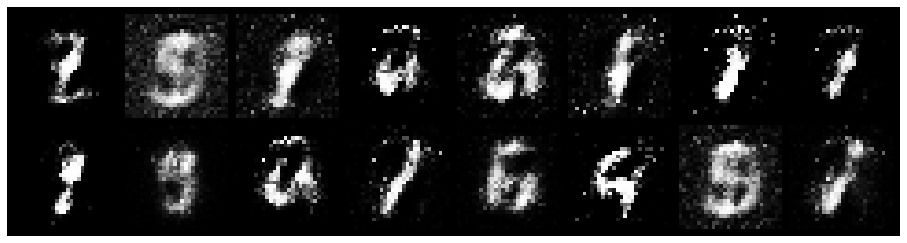

Epoch: [9/100], Batch Num: [0/700]
Discriminator Loss: 0.7031, Generator Loss: 1.9227
D(x): 0.7786, D(G(z)): 0.2174


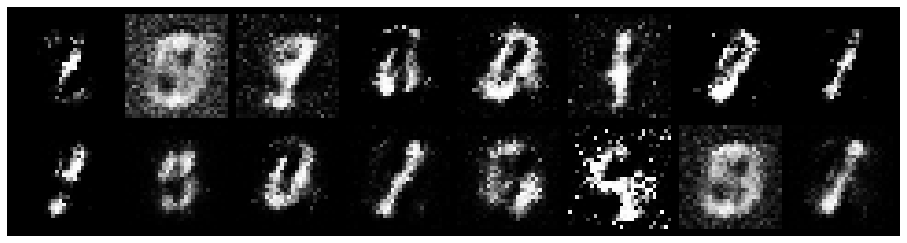

Epoch: [9/100], Batch Num: [100/700]
Discriminator Loss: 0.6907, Generator Loss: 2.2051
D(x): 0.7755, D(G(z)): 0.2340


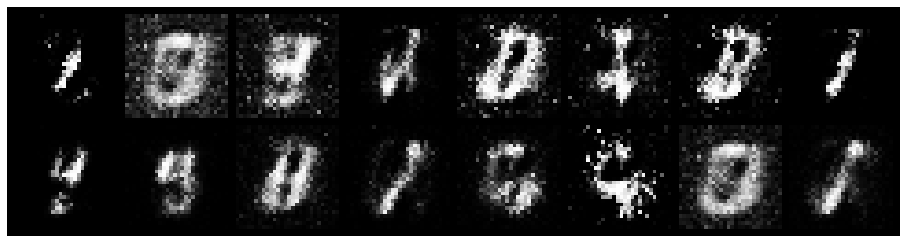

Epoch: [9/100], Batch Num: [200/700]
Discriminator Loss: 0.6195, Generator Loss: 2.6470
D(x): 0.7945, D(G(z)): 0.1448


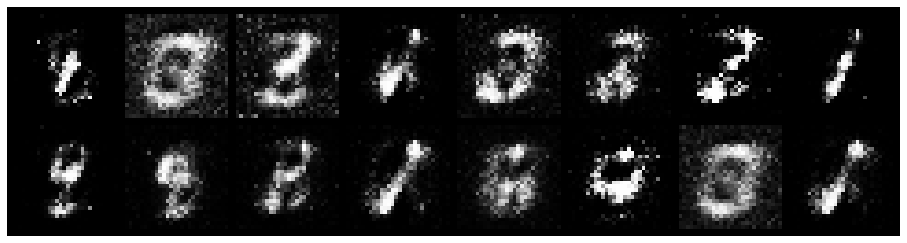

Epoch: [9/100], Batch Num: [300/700]
Discriminator Loss: 0.5219, Generator Loss: 2.4529
D(x): 0.8514, D(G(z)): 0.1808


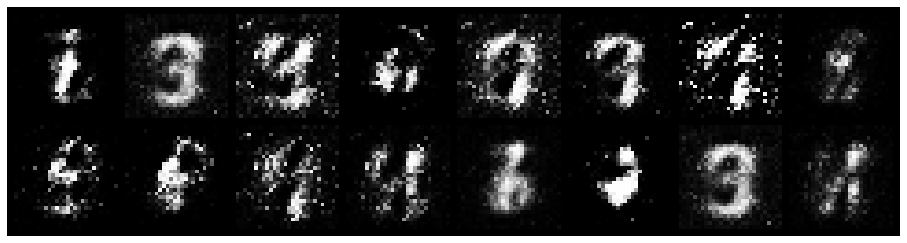

Epoch: [9/100], Batch Num: [400/700]
Discriminator Loss: 0.8918, Generator Loss: 2.2402
D(x): 0.7628, D(G(z)): 0.2667


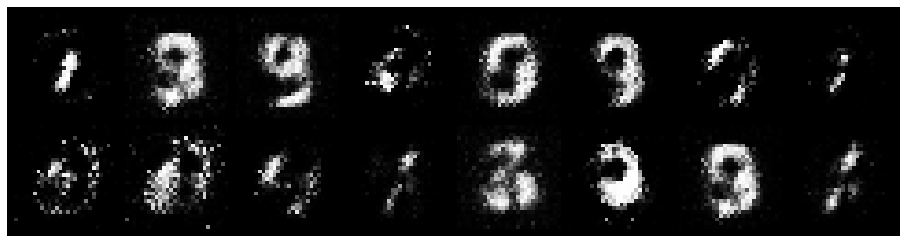

Epoch: [9/100], Batch Num: [500/700]
Discriminator Loss: 0.5722, Generator Loss: 2.4672
D(x): 0.7757, D(G(z)): 0.1376


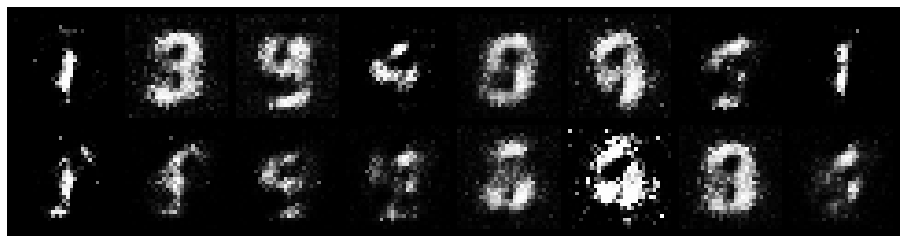

Epoch: [9/100], Batch Num: [600/700]
Discriminator Loss: 0.6623, Generator Loss: 1.9331
D(x): 0.8113, D(G(z)): 0.2069


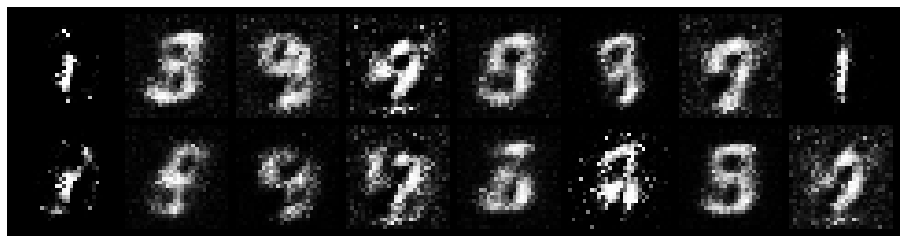

Epoch: [10/100], Batch Num: [0/700]
Discriminator Loss: 0.6250, Generator Loss: 1.8200
D(x): 0.8149, D(G(z)): 0.2091


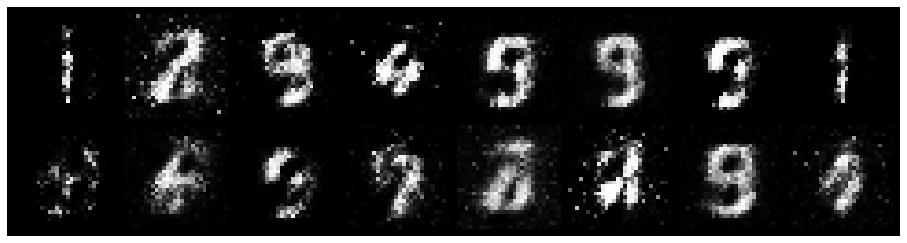

Epoch: [10/100], Batch Num: [100/700]
Discriminator Loss: 0.9215, Generator Loss: 1.9234
D(x): 0.7592, D(G(z)): 0.2407


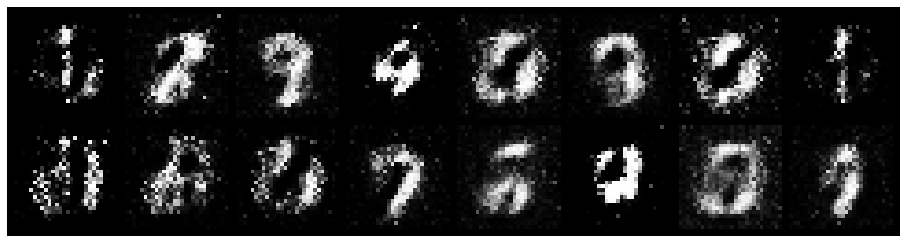

Epoch: [10/100], Batch Num: [200/700]
Discriminator Loss: 0.4608, Generator Loss: 2.7620
D(x): 0.8499, D(G(z)): 0.1619


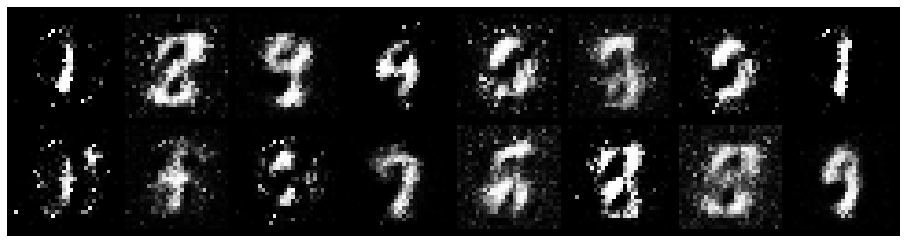

Epoch: [10/100], Batch Num: [300/700]
Discriminator Loss: 1.0246, Generator Loss: 2.2369
D(x): 0.6710, D(G(z)): 0.2760


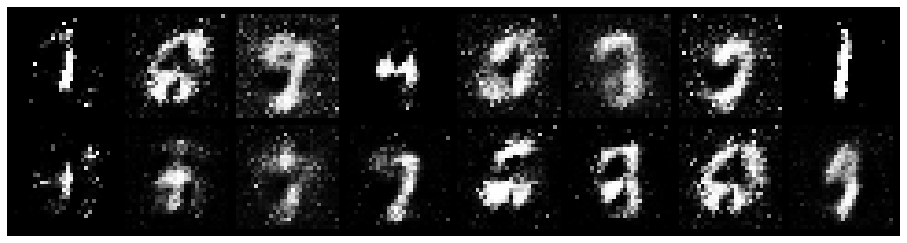

Epoch: [10/100], Batch Num: [400/700]
Discriminator Loss: 0.8372, Generator Loss: 2.3644
D(x): 0.7123, D(G(z)): 0.1827


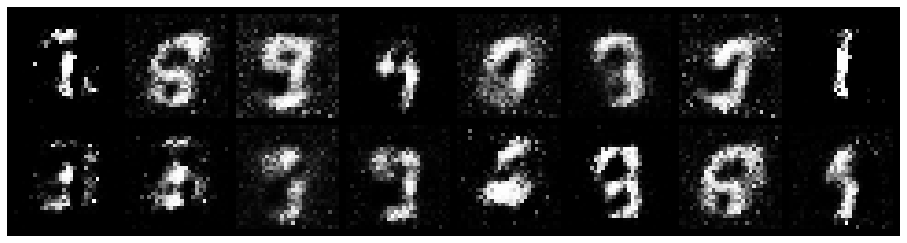

Epoch: [10/100], Batch Num: [500/700]
Discriminator Loss: 0.4923, Generator Loss: 2.5462
D(x): 0.8536, D(G(z)): 0.1669


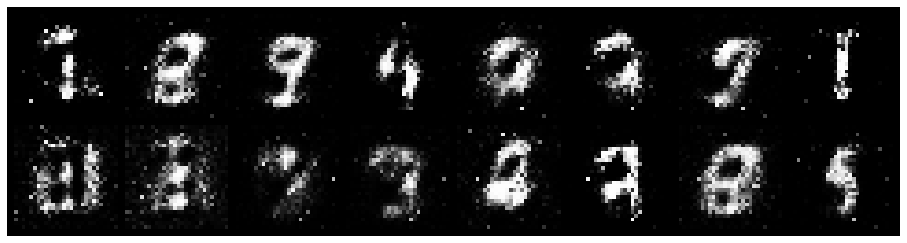

Epoch: [10/100], Batch Num: [600/700]
Discriminator Loss: 0.6028, Generator Loss: 2.1899
D(x): 0.8056, D(G(z)): 0.2185


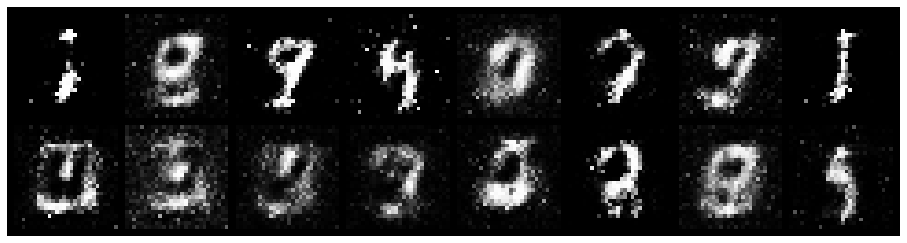

Epoch: [11/100], Batch Num: [0/700]
Discriminator Loss: 0.7739, Generator Loss: 2.1635
D(x): 0.7189, D(G(z)): 0.1517


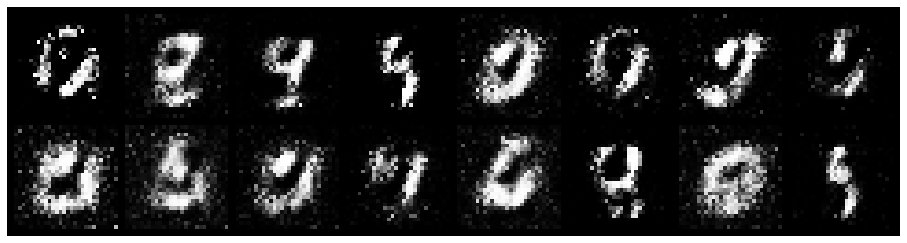

Epoch: [11/100], Batch Num: [100/700]
Discriminator Loss: 0.6935, Generator Loss: 1.9789
D(x): 0.7399, D(G(z)): 0.2232


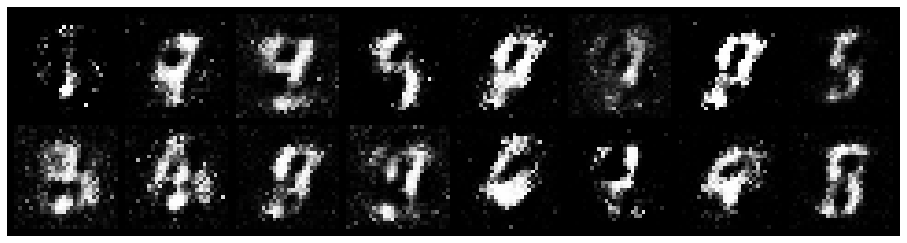

Epoch: [11/100], Batch Num: [200/700]
Discriminator Loss: 0.7125, Generator Loss: 2.3901
D(x): 0.7330, D(G(z)): 0.1969


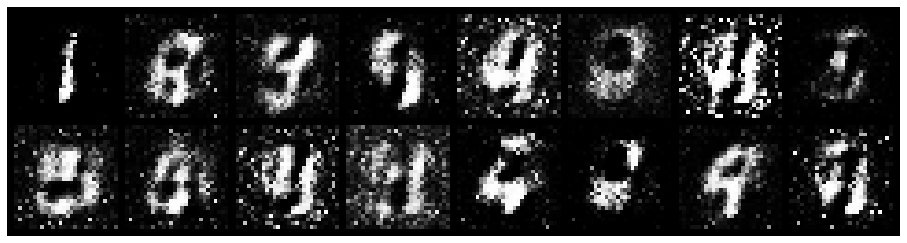

Epoch: [11/100], Batch Num: [300/700]
Discriminator Loss: 0.6392, Generator Loss: 1.7894
D(x): 0.8243, D(G(z)): 0.2681


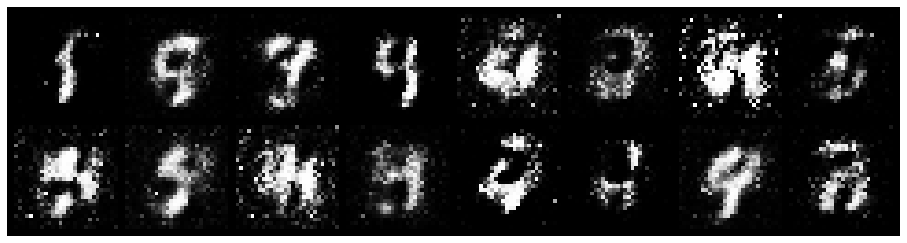

Epoch: [11/100], Batch Num: [400/700]
Discriminator Loss: 0.9183, Generator Loss: 1.6715
D(x): 0.7061, D(G(z)): 0.2693


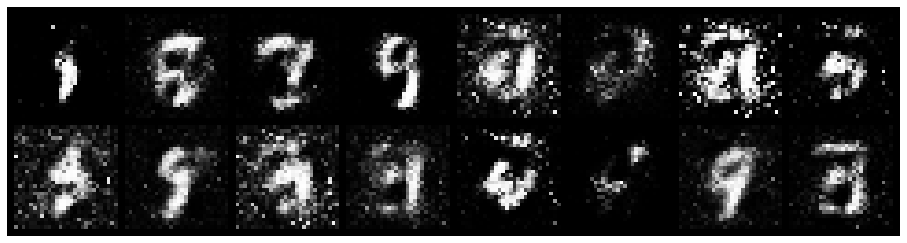

Epoch: [11/100], Batch Num: [500/700]
Discriminator Loss: 0.7402, Generator Loss: 1.7879
D(x): 0.8299, D(G(z)): 0.2821


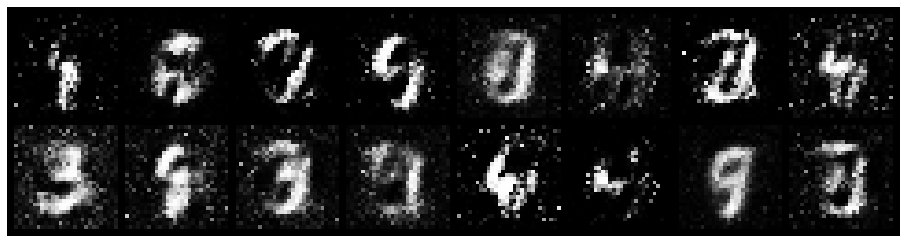

Epoch: [11/100], Batch Num: [600/700]
Discriminator Loss: 0.7650, Generator Loss: 2.0466
D(x): 0.7625, D(G(z)): 0.2306


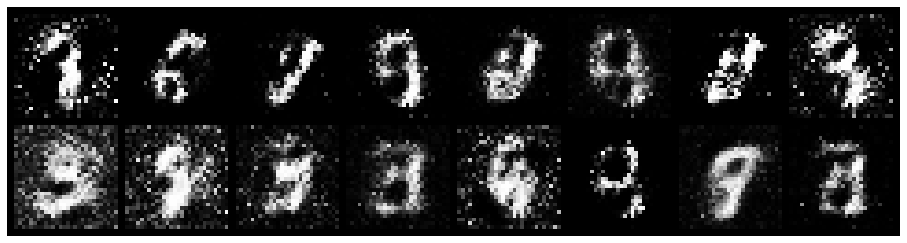

Epoch: [12/100], Batch Num: [0/700]
Discriminator Loss: 0.6539, Generator Loss: 2.8673
D(x): 0.8073, D(G(z)): 0.2148


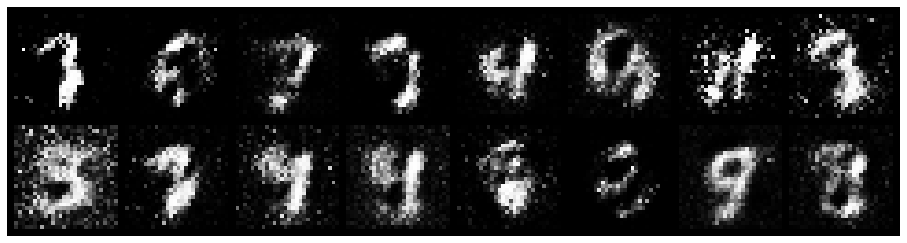

Epoch: [12/100], Batch Num: [100/700]
Discriminator Loss: 0.9693, Generator Loss: 1.9758
D(x): 0.7802, D(G(z)): 0.3149


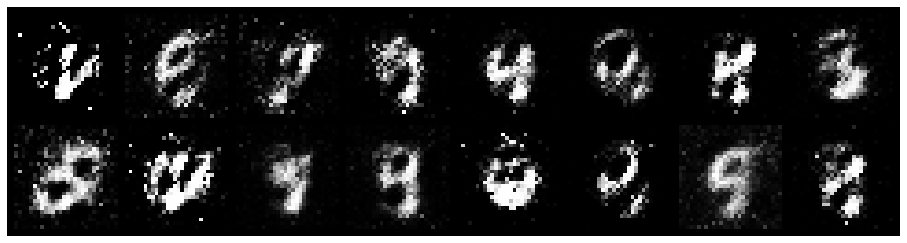

Epoch: [12/100], Batch Num: [200/700]
Discriminator Loss: 0.5371, Generator Loss: 2.4155
D(x): 0.8108, D(G(z)): 0.1905


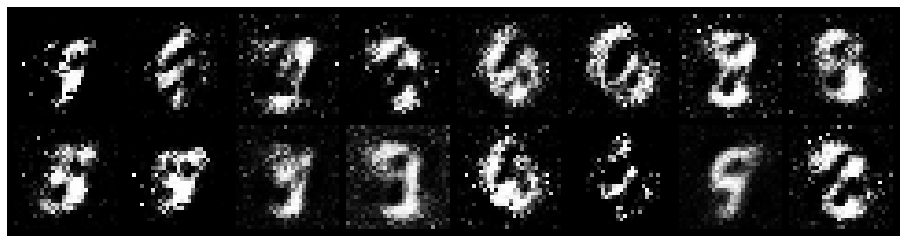

Epoch: [12/100], Batch Num: [300/700]
Discriminator Loss: 0.8542, Generator Loss: 1.8044
D(x): 0.6937, D(G(z)): 0.1950


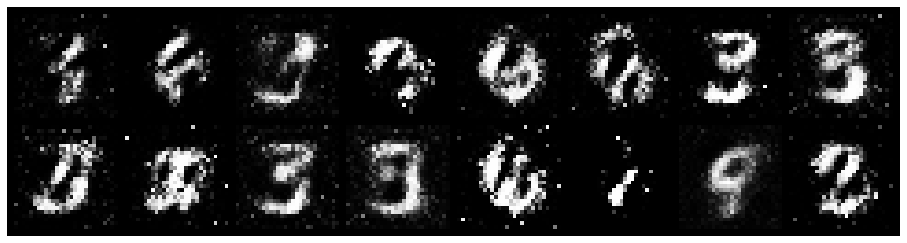

Epoch: [12/100], Batch Num: [400/700]
Discriminator Loss: 0.7413, Generator Loss: 1.6844
D(x): 0.7682, D(G(z)): 0.2296


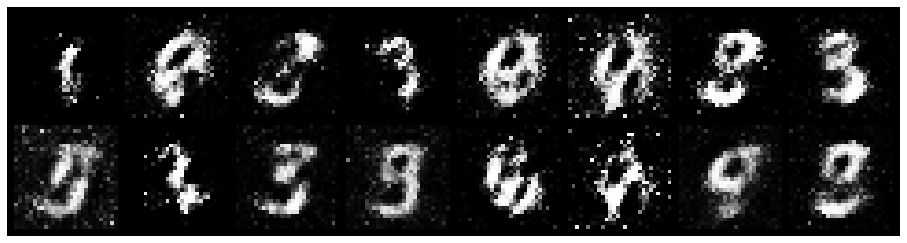

Epoch: [12/100], Batch Num: [500/700]
Discriminator Loss: 0.7287, Generator Loss: 2.2608
D(x): 0.7122, D(G(z)): 0.1559


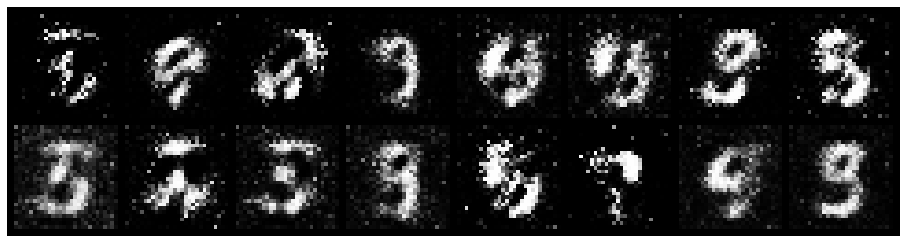

Epoch: [12/100], Batch Num: [600/700]
Discriminator Loss: 0.5242, Generator Loss: 2.0440
D(x): 0.8129, D(G(z)): 0.2031


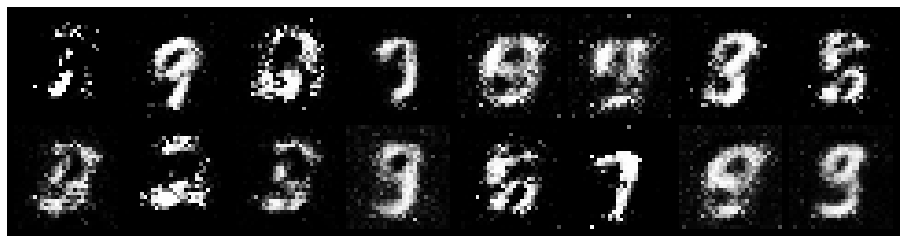

Epoch: [13/100], Batch Num: [0/700]
Discriminator Loss: 0.5598, Generator Loss: 1.9639
D(x): 0.7882, D(G(z)): 0.1932


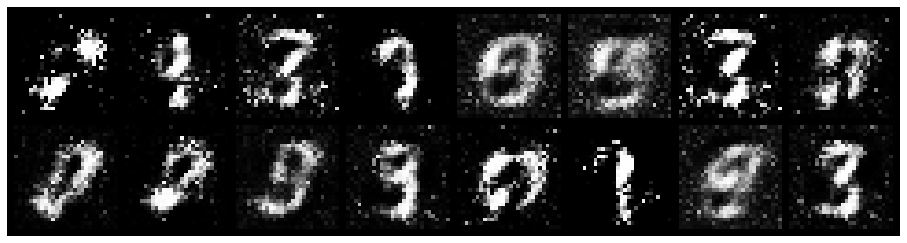

Epoch: [13/100], Batch Num: [100/700]
Discriminator Loss: 0.8422, Generator Loss: 2.1090
D(x): 0.6938, D(G(z)): 0.1524


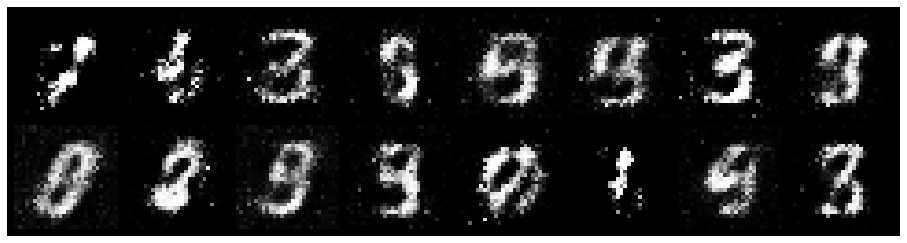

Epoch: [13/100], Batch Num: [200/700]
Discriminator Loss: 0.9028, Generator Loss: 1.5642
D(x): 0.7942, D(G(z)): 0.3809


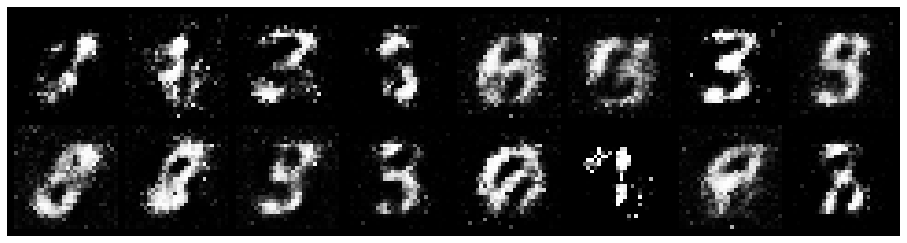

Epoch: [13/100], Batch Num: [300/700]
Discriminator Loss: 0.8200, Generator Loss: 1.9193
D(x): 0.7620, D(G(z)): 0.2776


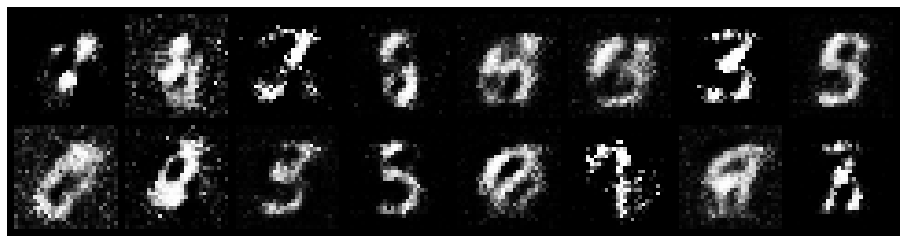

Epoch: [13/100], Batch Num: [400/700]
Discriminator Loss: 0.6461, Generator Loss: 1.7557
D(x): 0.8235, D(G(z)): 0.2519


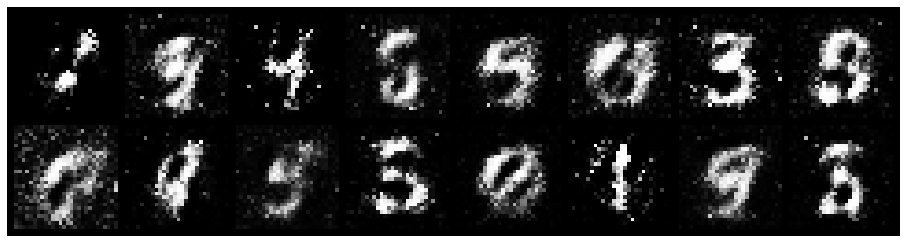

Epoch: [13/100], Batch Num: [500/700]
Discriminator Loss: 0.9351, Generator Loss: 1.8082
D(x): 0.7355, D(G(z)): 0.3268


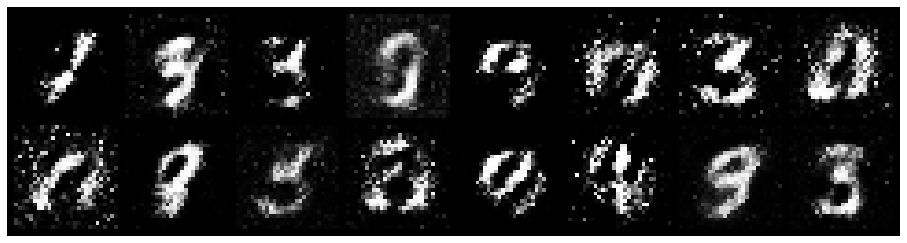

Epoch: [13/100], Batch Num: [600/700]
Discriminator Loss: 0.7562, Generator Loss: 1.9001
D(x): 0.7340, D(G(z)): 0.2516


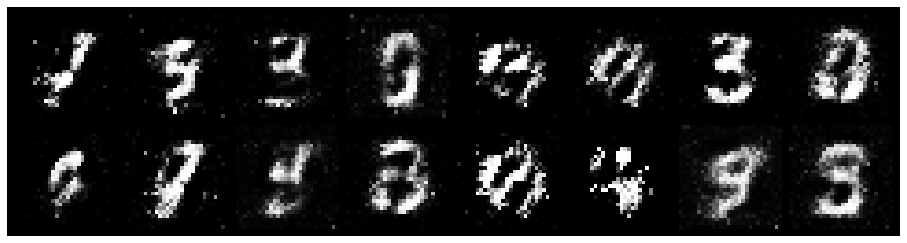

Epoch: [14/100], Batch Num: [0/700]
Discriminator Loss: 0.8585, Generator Loss: 2.3571
D(x): 0.8033, D(G(z)): 0.3126


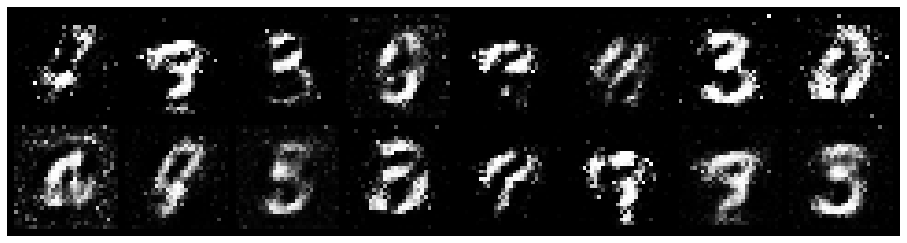

Epoch: [14/100], Batch Num: [100/700]
Discriminator Loss: 0.8427, Generator Loss: 1.7853
D(x): 0.7540, D(G(z)): 0.3010


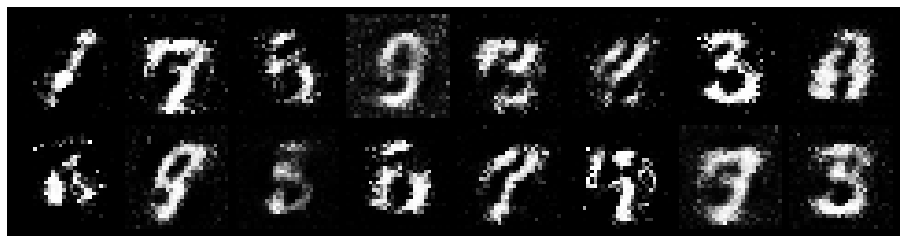

Epoch: [14/100], Batch Num: [200/700]
Discriminator Loss: 0.6437, Generator Loss: 2.1109
D(x): 0.7498, D(G(z)): 0.1988


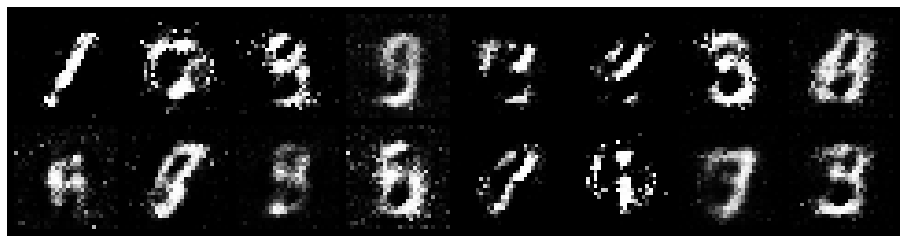

Epoch: [14/100], Batch Num: [300/700]
Discriminator Loss: 0.5934, Generator Loss: 2.0539
D(x): 0.8518, D(G(z)): 0.2721


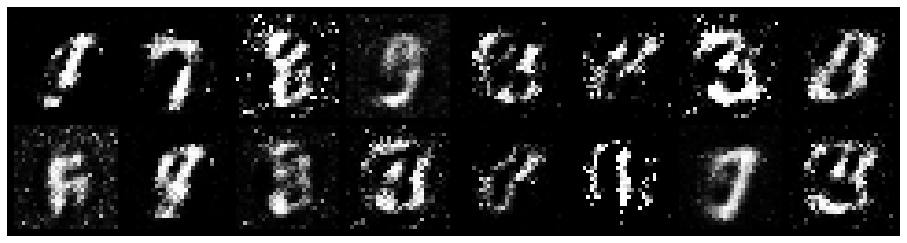

Epoch: [14/100], Batch Num: [400/700]
Discriminator Loss: 0.7552, Generator Loss: 1.7023
D(x): 0.7853, D(G(z)): 0.2952


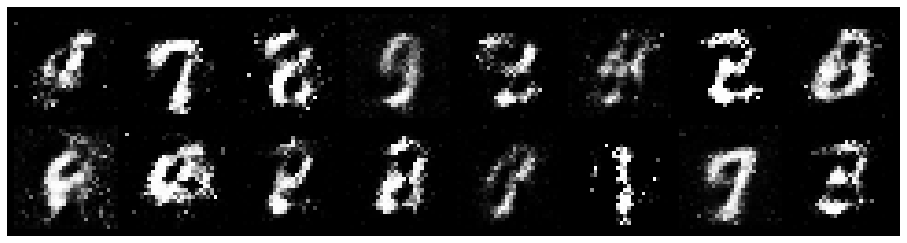

Epoch: [14/100], Batch Num: [500/700]
Discriminator Loss: 0.6866, Generator Loss: 1.9965
D(x): 0.8322, D(G(z)): 0.2905


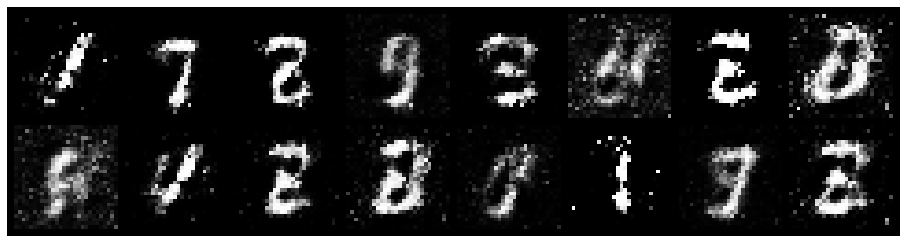

Epoch: [14/100], Batch Num: [600/700]
Discriminator Loss: 0.8054, Generator Loss: 1.5988
D(x): 0.7685, D(G(z)): 0.3007


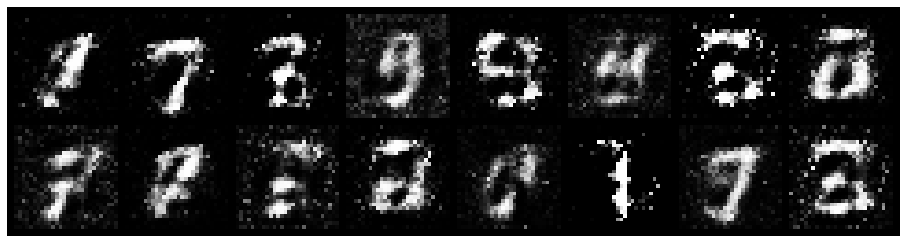

Epoch: [15/100], Batch Num: [0/700]
Discriminator Loss: 0.6837, Generator Loss: 2.2737
D(x): 0.7648, D(G(z)): 0.2280


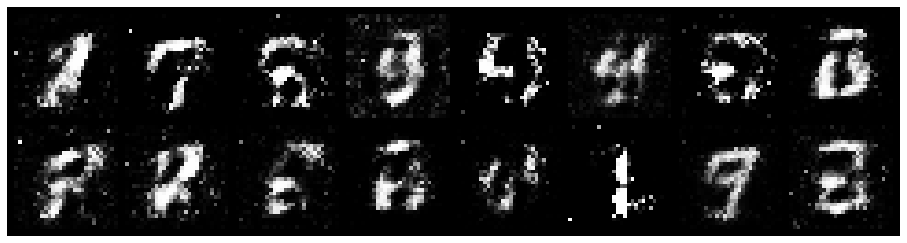

Epoch: [15/100], Batch Num: [100/700]
Discriminator Loss: 0.6099, Generator Loss: 1.9901
D(x): 0.7823, D(G(z)): 0.2018


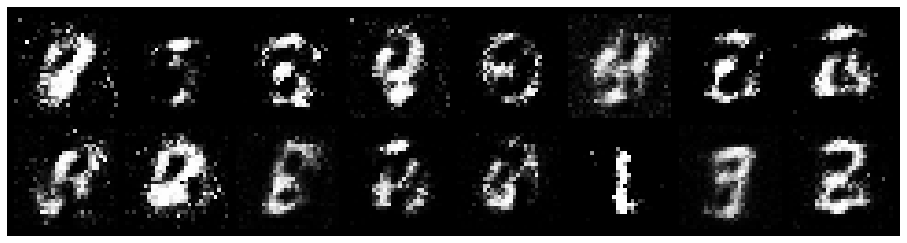

Epoch: [15/100], Batch Num: [200/700]
Discriminator Loss: 0.6622, Generator Loss: 1.6146
D(x): 0.7913, D(G(z)): 0.2877


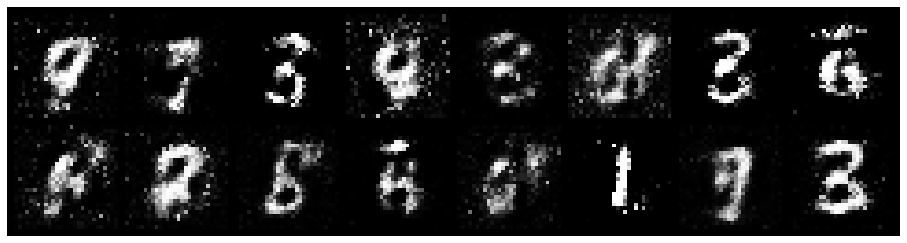

Epoch: [15/100], Batch Num: [300/700]
Discriminator Loss: 0.8350, Generator Loss: 1.3370
D(x): 0.7097, D(G(z)): 0.3078


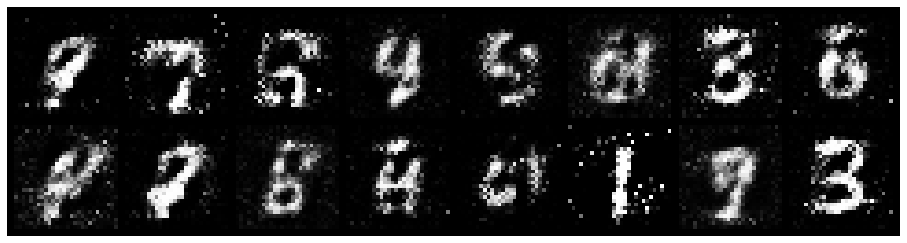

Epoch: [15/100], Batch Num: [400/700]
Discriminator Loss: 0.6892, Generator Loss: 1.6732
D(x): 0.7626, D(G(z)): 0.2617


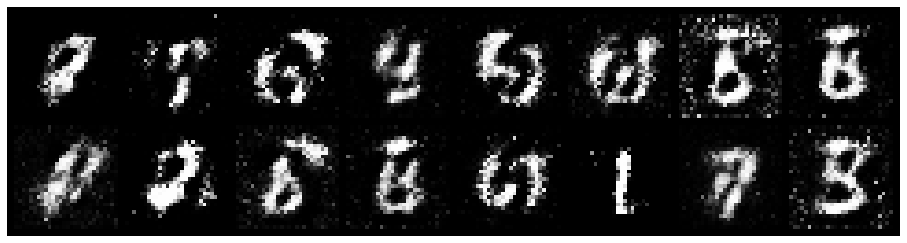

Epoch: [15/100], Batch Num: [500/700]
Discriminator Loss: 1.0567, Generator Loss: 1.5567
D(x): 0.6340, D(G(z)): 0.3120


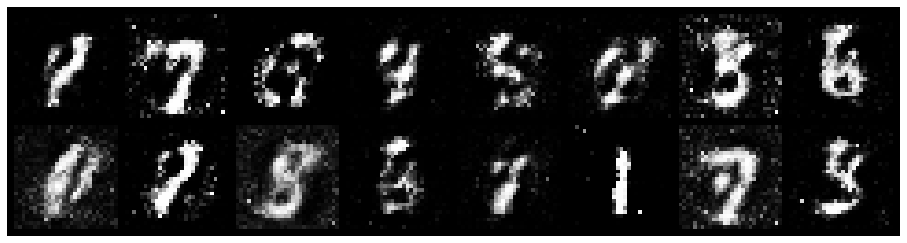

Epoch: [15/100], Batch Num: [600/700]
Discriminator Loss: 0.9522, Generator Loss: 1.5247
D(x): 0.7519, D(G(z)): 0.3296


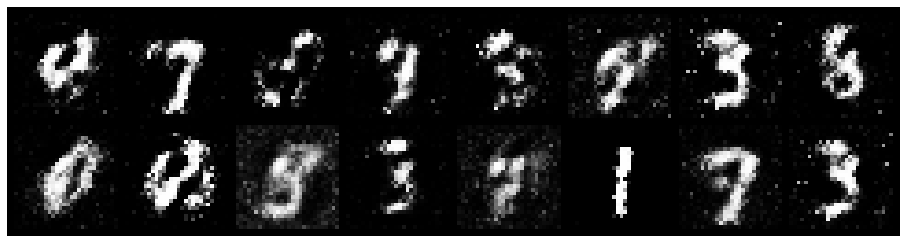

Epoch: [16/100], Batch Num: [0/700]
Discriminator Loss: 0.9633, Generator Loss: 1.7597
D(x): 0.7855, D(G(z)): 0.3743


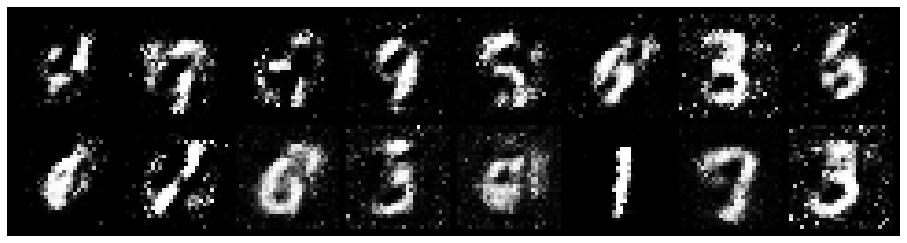

Epoch: [16/100], Batch Num: [100/700]
Discriminator Loss: 1.0245, Generator Loss: 1.9447
D(x): 0.7480, D(G(z)): 0.3269


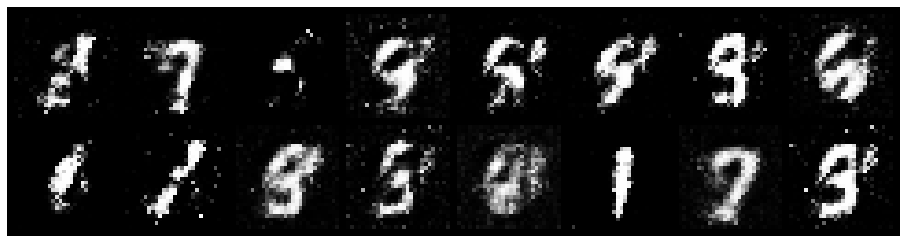

Epoch: [16/100], Batch Num: [200/700]
Discriminator Loss: 1.2663, Generator Loss: 1.8471
D(x): 0.5947, D(G(z)): 0.2685


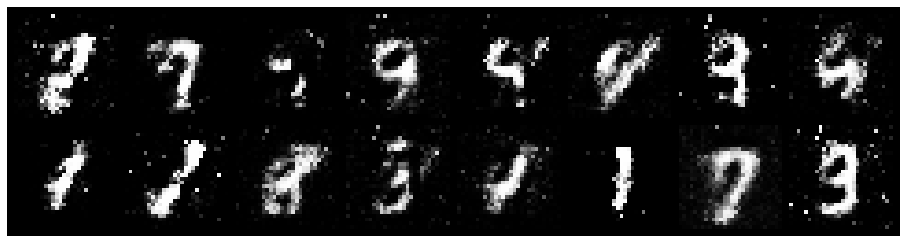

Epoch: [16/100], Batch Num: [300/700]
Discriminator Loss: 1.0404, Generator Loss: 1.9145
D(x): 0.7214, D(G(z)): 0.3576


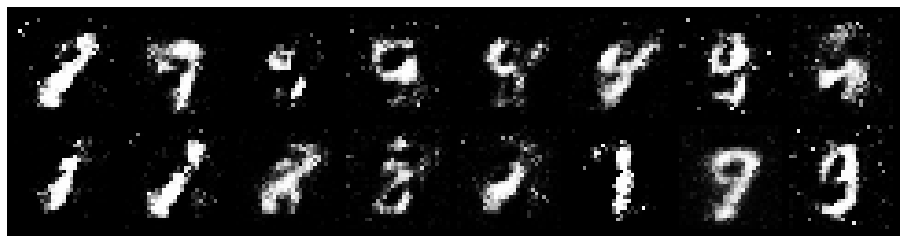

Epoch: [16/100], Batch Num: [400/700]
Discriminator Loss: 0.8630, Generator Loss: 1.4078
D(x): 0.7151, D(G(z)): 0.2949


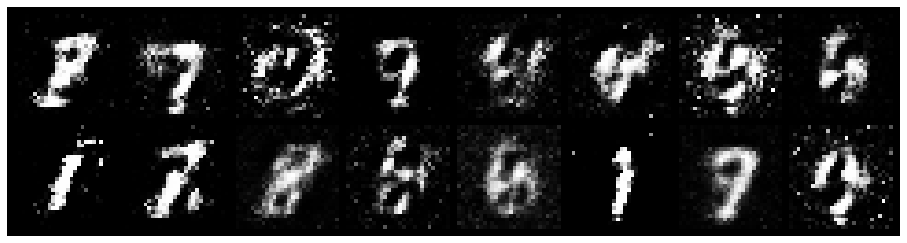

Epoch: [16/100], Batch Num: [500/700]
Discriminator Loss: 0.7932, Generator Loss: 1.4237
D(x): 0.8369, D(G(z)): 0.3421


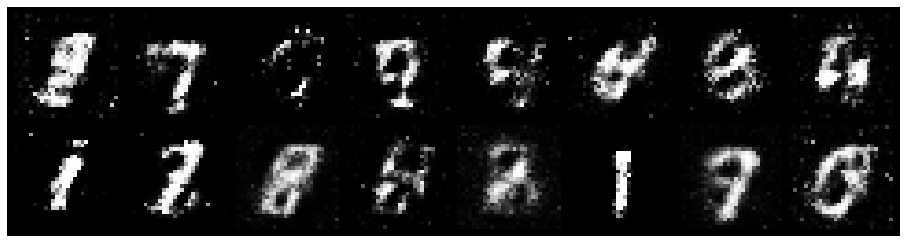

Epoch: [16/100], Batch Num: [600/700]
Discriminator Loss: 1.0377, Generator Loss: 1.2323
D(x): 0.7579, D(G(z)): 0.4313


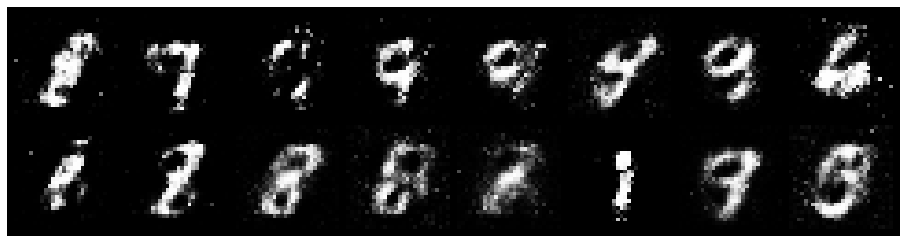

Epoch: [17/100], Batch Num: [0/700]
Discriminator Loss: 0.8396, Generator Loss: 1.8078
D(x): 0.7551, D(G(z)): 0.3158


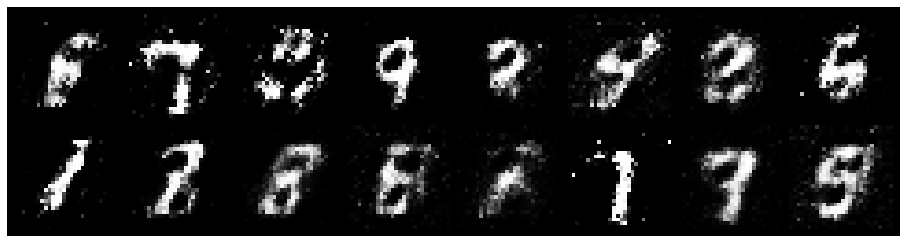

Epoch: [17/100], Batch Num: [100/700]
Discriminator Loss: 1.0530, Generator Loss: 1.6440
D(x): 0.6607, D(G(z)): 0.3312


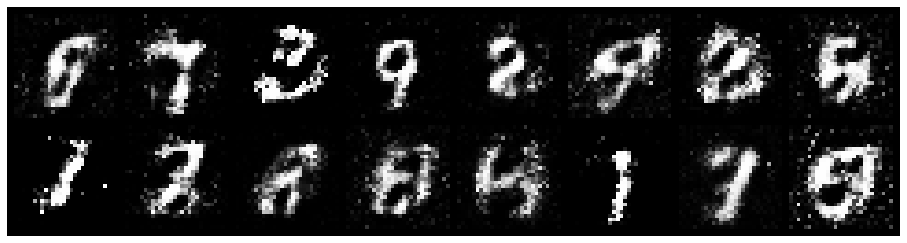

Epoch: [17/100], Batch Num: [200/700]
Discriminator Loss: 1.0521, Generator Loss: 1.6015
D(x): 0.6992, D(G(z)): 0.3584


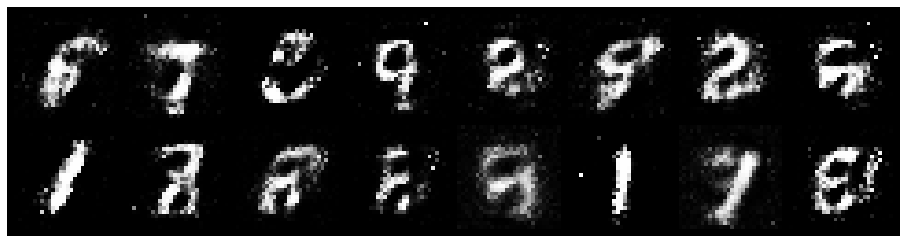

Epoch: [17/100], Batch Num: [300/700]
Discriminator Loss: 1.0359, Generator Loss: 2.0305
D(x): 0.6618, D(G(z)): 0.2293


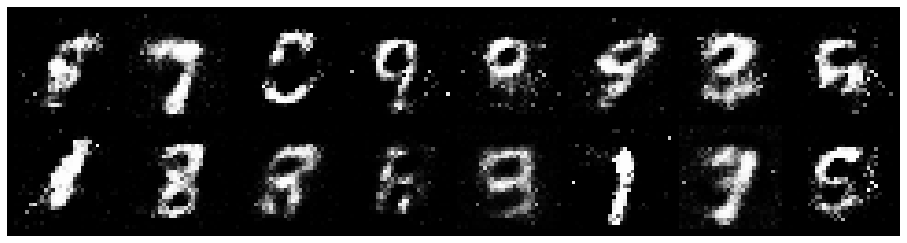

Epoch: [17/100], Batch Num: [400/700]
Discriminator Loss: 0.7997, Generator Loss: 1.7964
D(x): 0.7981, D(G(z)): 0.3340


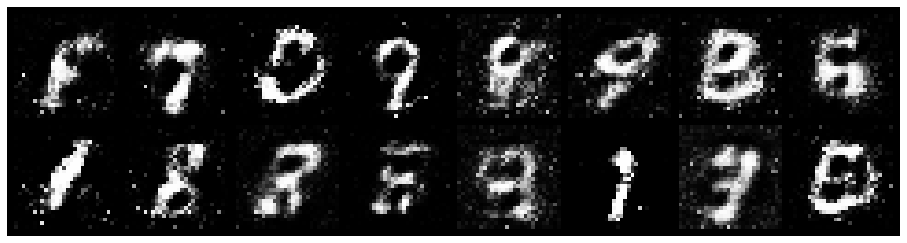

Epoch: [17/100], Batch Num: [500/700]
Discriminator Loss: 0.7479, Generator Loss: 1.8738
D(x): 0.7752, D(G(z)): 0.2827


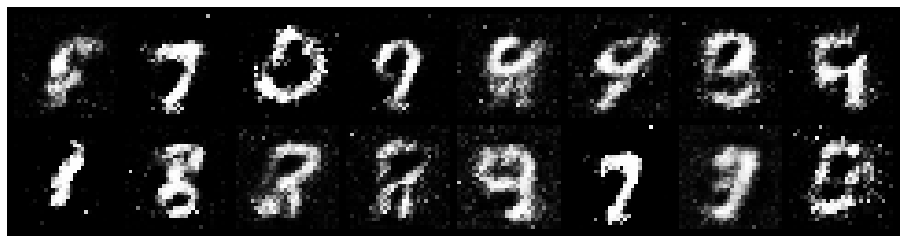

Epoch: [17/100], Batch Num: [600/700]
Discriminator Loss: 0.6419, Generator Loss: 2.0618
D(x): 0.8291, D(G(z)): 0.2558


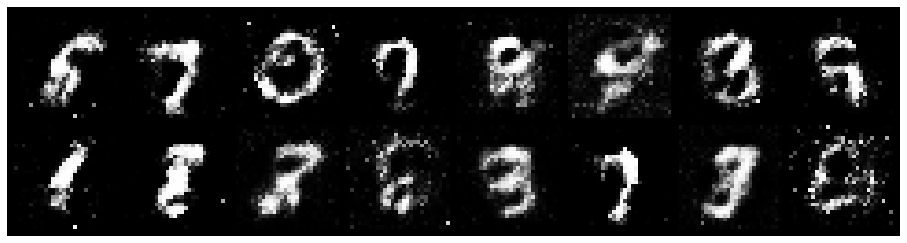

Epoch: [18/100], Batch Num: [0/700]
Discriminator Loss: 0.7048, Generator Loss: 2.0072
D(x): 0.7734, D(G(z)): 0.2494


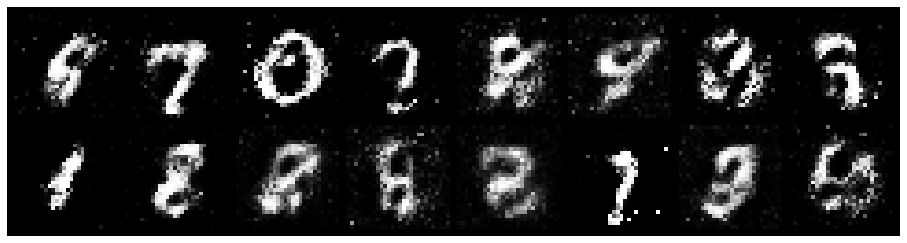

Epoch: [18/100], Batch Num: [100/700]
Discriminator Loss: 0.9243, Generator Loss: 1.7795
D(x): 0.6628, D(G(z)): 0.2813


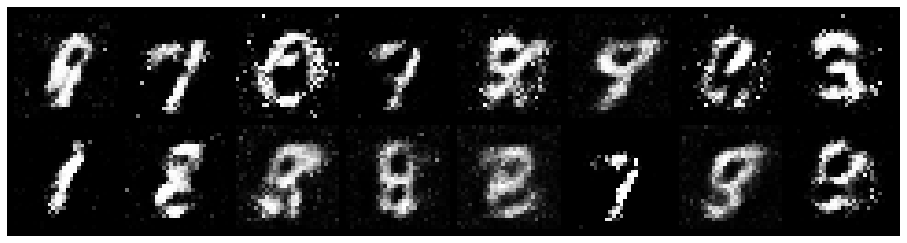

Epoch: [18/100], Batch Num: [200/700]
Discriminator Loss: 0.9489, Generator Loss: 1.4220
D(x): 0.6576, D(G(z)): 0.3005


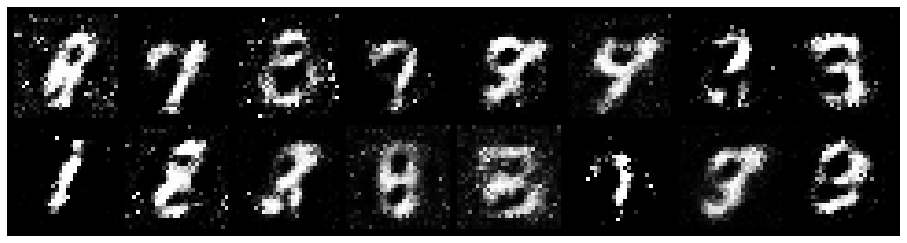

Epoch: [18/100], Batch Num: [300/700]
Discriminator Loss: 1.0876, Generator Loss: 1.9683
D(x): 0.6462, D(G(z)): 0.3017


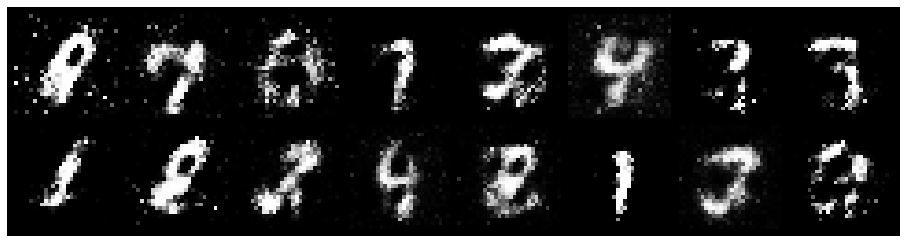

Epoch: [18/100], Batch Num: [400/700]
Discriminator Loss: 0.8991, Generator Loss: 1.3558
D(x): 0.7218, D(G(z)): 0.3278


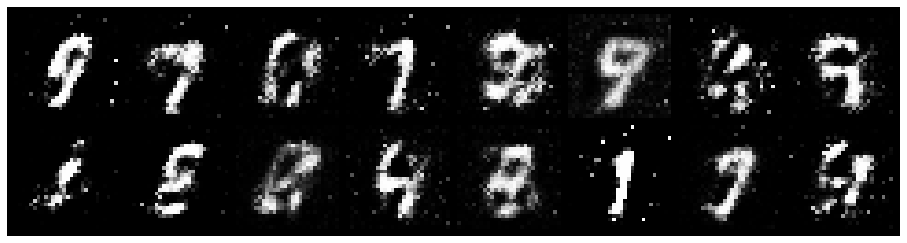

Epoch: [18/100], Batch Num: [500/700]
Discriminator Loss: 0.8318, Generator Loss: 1.3340
D(x): 0.7243, D(G(z)): 0.3298


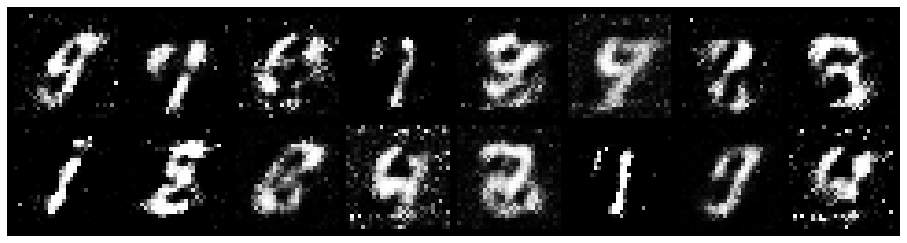

Epoch: [18/100], Batch Num: [600/700]
Discriminator Loss: 1.1570, Generator Loss: 1.3952
D(x): 0.6424, D(G(z)): 0.3434


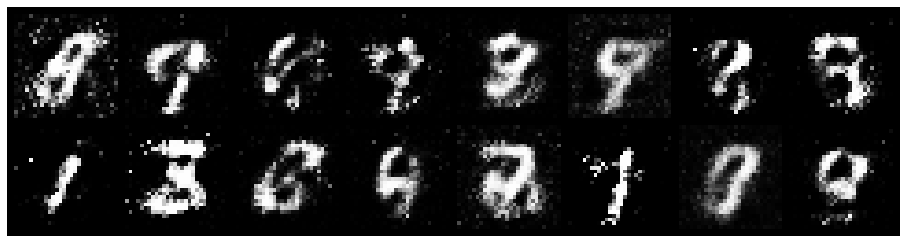

Epoch: [19/100], Batch Num: [0/700]
Discriminator Loss: 0.9413, Generator Loss: 1.5629
D(x): 0.6983, D(G(z)): 0.2867


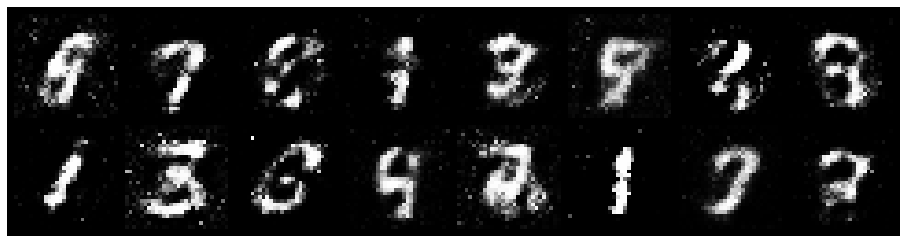

Epoch: [19/100], Batch Num: [100/700]
Discriminator Loss: 0.8548, Generator Loss: 1.7797
D(x): 0.7659, D(G(z)): 0.2898


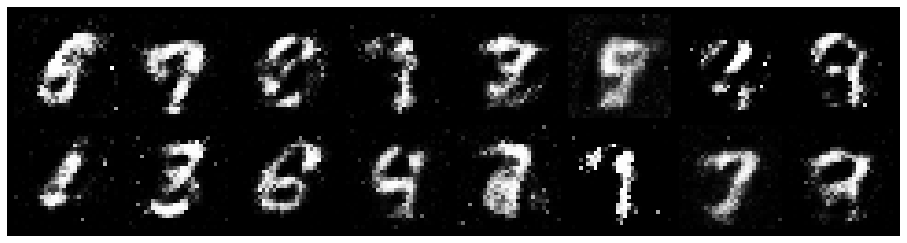

Epoch: [19/100], Batch Num: [200/700]
Discriminator Loss: 0.7962, Generator Loss: 1.5132
D(x): 0.7208, D(G(z)): 0.2921


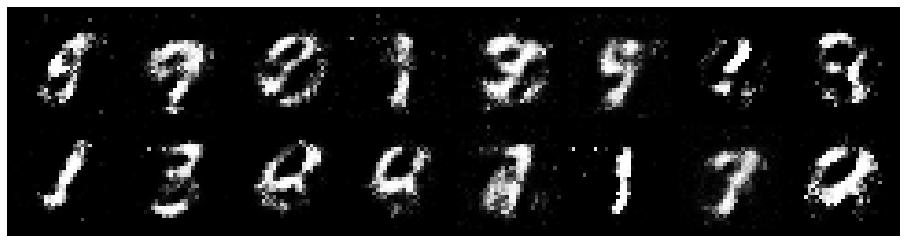

Epoch: [19/100], Batch Num: [300/700]
Discriminator Loss: 0.8752, Generator Loss: 1.4246
D(x): 0.7063, D(G(z)): 0.2905


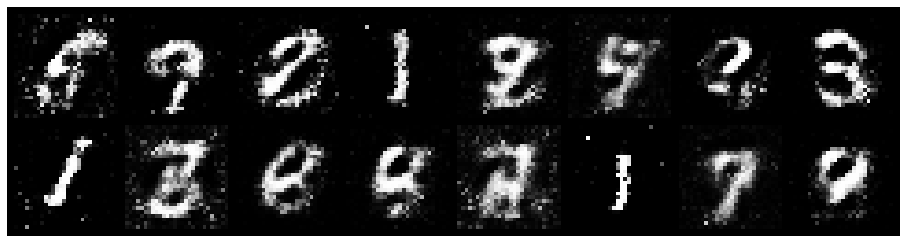

Epoch: [19/100], Batch Num: [400/700]
Discriminator Loss: 1.0065, Generator Loss: 1.5180
D(x): 0.6595, D(G(z)): 0.3175


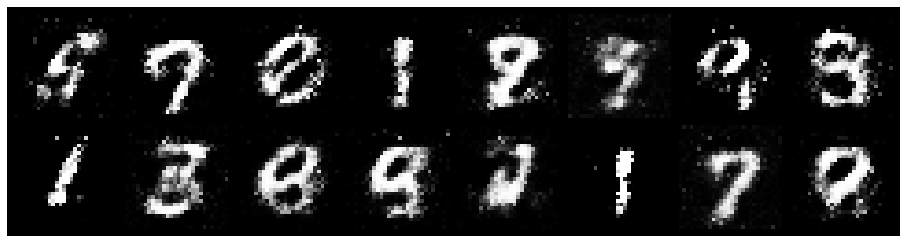

Epoch: [19/100], Batch Num: [500/700]
Discriminator Loss: 0.8832, Generator Loss: 1.4913
D(x): 0.6390, D(G(z)): 0.2368


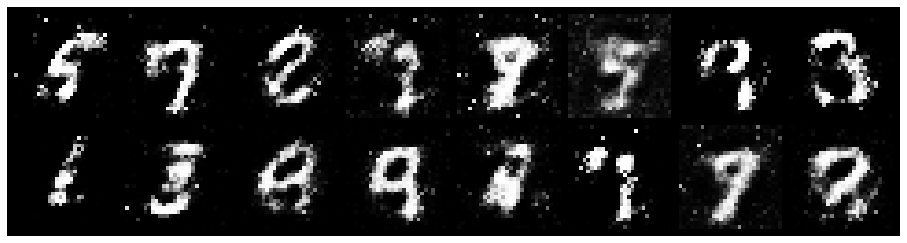

Epoch: [19/100], Batch Num: [600/700]
Discriminator Loss: 0.8706, Generator Loss: 1.6703
D(x): 0.6770, D(G(z)): 0.2893


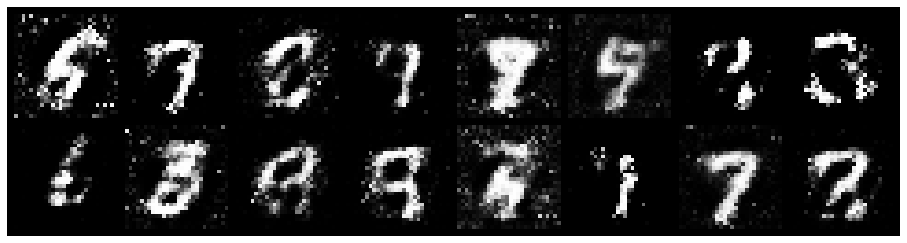

Epoch: [20/100], Batch Num: [0/700]
Discriminator Loss: 1.0781, Generator Loss: 1.1975
D(x): 0.7775, D(G(z)): 0.4201


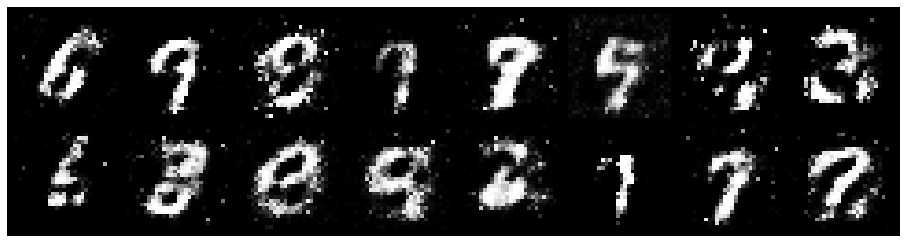

Epoch: [20/100], Batch Num: [100/700]
Discriminator Loss: 0.8089, Generator Loss: 1.7093
D(x): 0.7031, D(G(z)): 0.2282


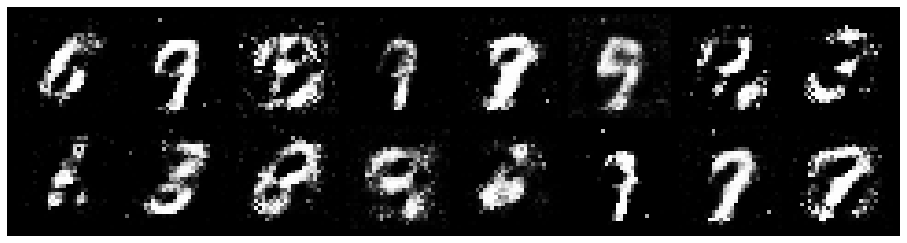

Epoch: [20/100], Batch Num: [200/700]
Discriminator Loss: 0.8031, Generator Loss: 2.1357
D(x): 0.6808, D(G(z)): 0.2255


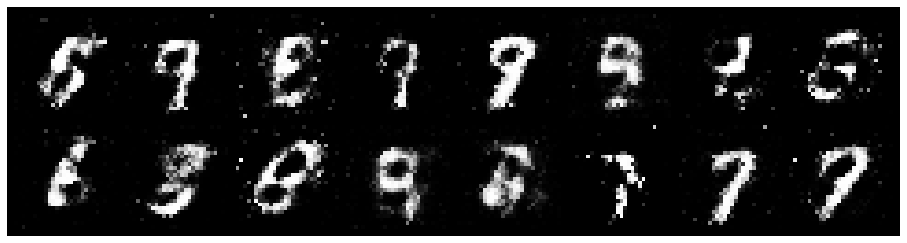

Epoch: [20/100], Batch Num: [300/700]
Discriminator Loss: 0.8711, Generator Loss: 1.4932
D(x): 0.6902, D(G(z)): 0.2884


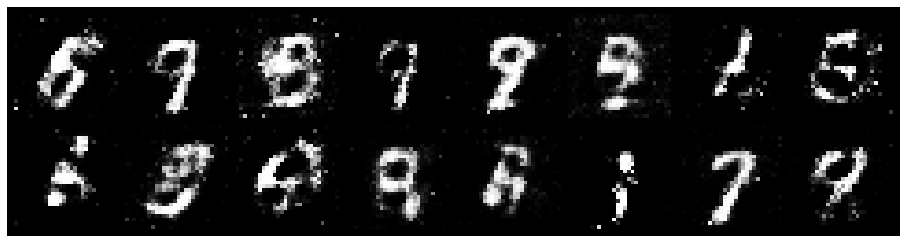

Epoch: [20/100], Batch Num: [400/700]
Discriminator Loss: 0.9624, Generator Loss: 1.5172
D(x): 0.6760, D(G(z)): 0.2671


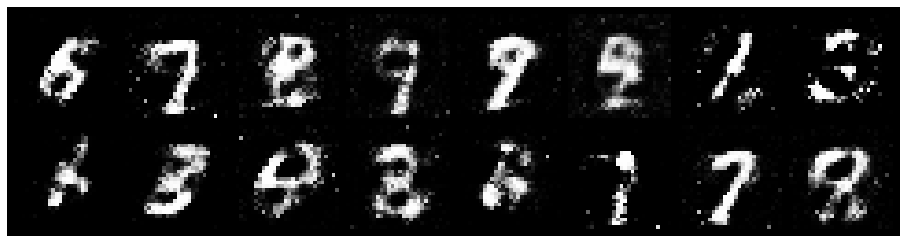

Epoch: [20/100], Batch Num: [500/700]
Discriminator Loss: 0.8457, Generator Loss: 1.3752
D(x): 0.7203, D(G(z)): 0.2862


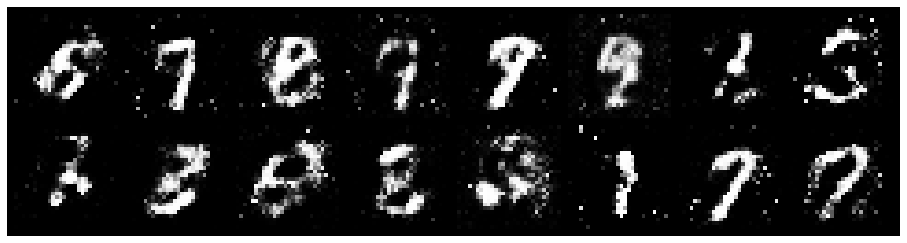

Epoch: [20/100], Batch Num: [600/700]
Discriminator Loss: 0.9584, Generator Loss: 1.3194
D(x): 0.6231, D(G(z)): 0.2681


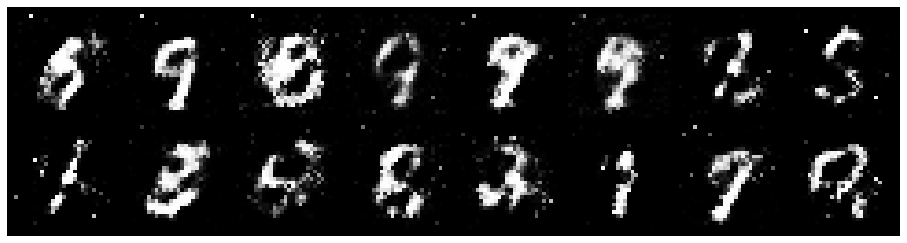

Epoch: [21/100], Batch Num: [0/700]
Discriminator Loss: 0.9851, Generator Loss: 1.5596
D(x): 0.7090, D(G(z)): 0.3658


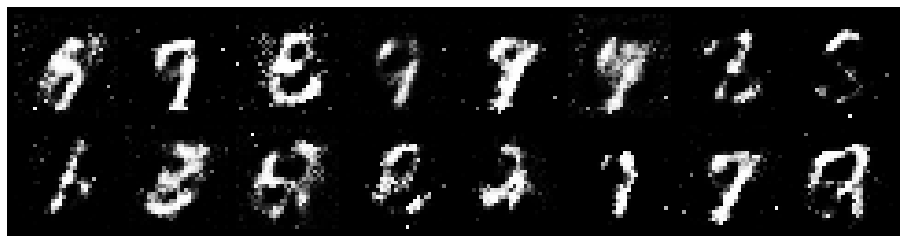

Epoch: [21/100], Batch Num: [100/700]
Discriminator Loss: 0.9367, Generator Loss: 1.5664
D(x): 0.7300, D(G(z)): 0.3041


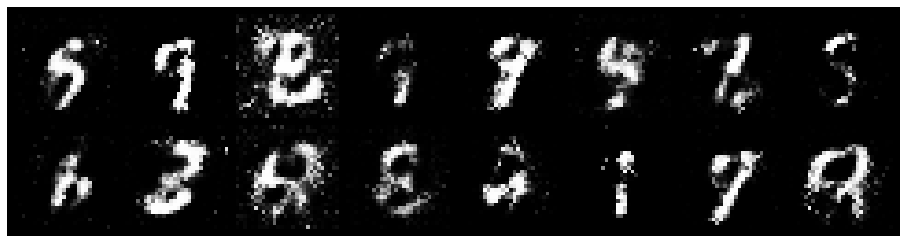

Epoch: [21/100], Batch Num: [200/700]
Discriminator Loss: 1.1568, Generator Loss: 0.9721
D(x): 0.6457, D(G(z)): 0.4028


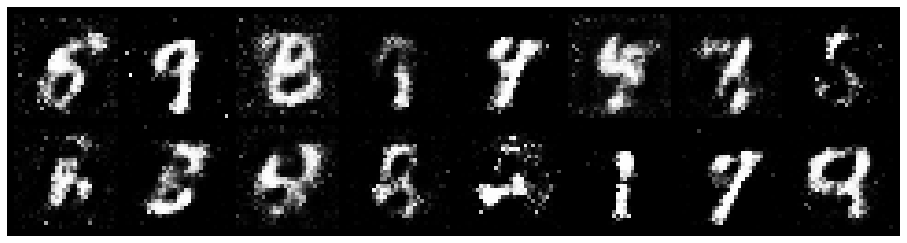

Epoch: [21/100], Batch Num: [300/700]
Discriminator Loss: 0.8928, Generator Loss: 1.7348
D(x): 0.7650, D(G(z)): 0.3633


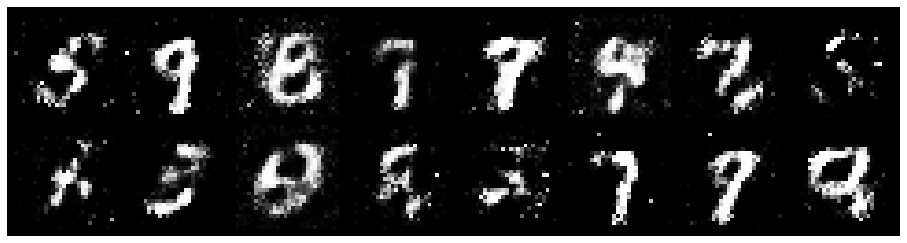

Epoch: [21/100], Batch Num: [400/700]
Discriminator Loss: 1.0313, Generator Loss: 1.2110
D(x): 0.6908, D(G(z)): 0.3848


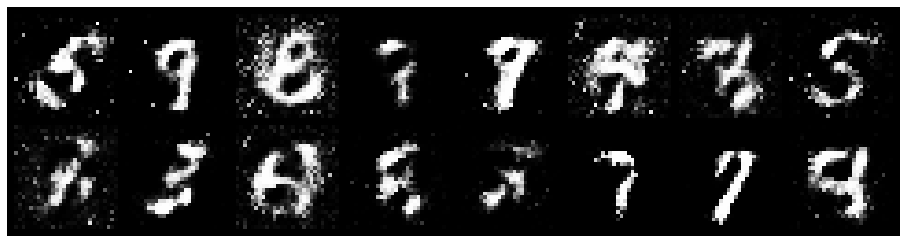

Epoch: [21/100], Batch Num: [500/700]
Discriminator Loss: 0.9421, Generator Loss: 1.3183
D(x): 0.6710, D(G(z)): 0.3227


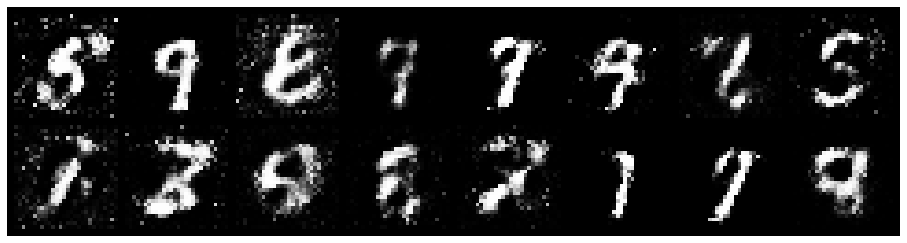

Epoch: [21/100], Batch Num: [600/700]
Discriminator Loss: 1.0047, Generator Loss: 1.0181
D(x): 0.7940, D(G(z)): 0.4595


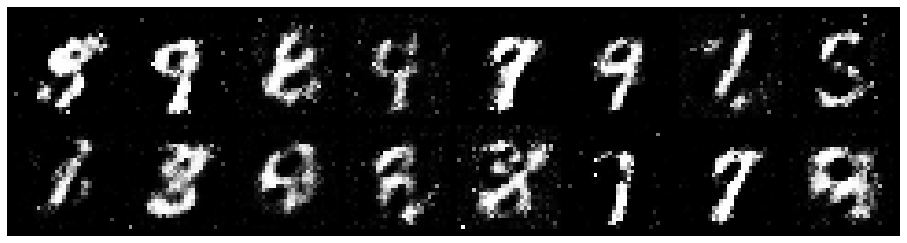

Epoch: [22/100], Batch Num: [0/700]
Discriminator Loss: 0.8923, Generator Loss: 1.3567
D(x): 0.6584, D(G(z)): 0.2374


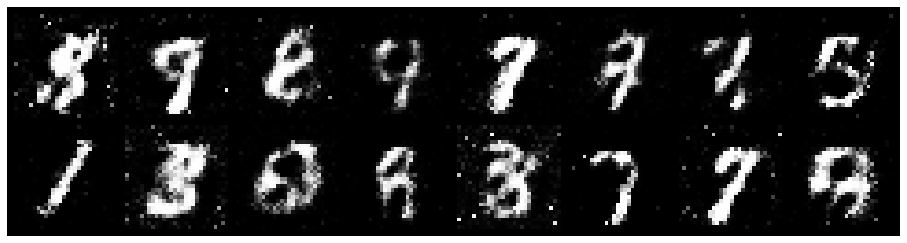

Epoch: [22/100], Batch Num: [100/700]
Discriminator Loss: 1.4244, Generator Loss: 1.0754
D(x): 0.6109, D(G(z)): 0.4471


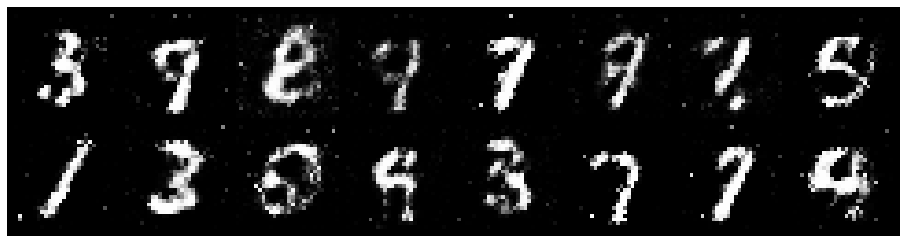

Epoch: [22/100], Batch Num: [200/700]
Discriminator Loss: 0.8492, Generator Loss: 1.5497
D(x): 0.7024, D(G(z)): 0.2590


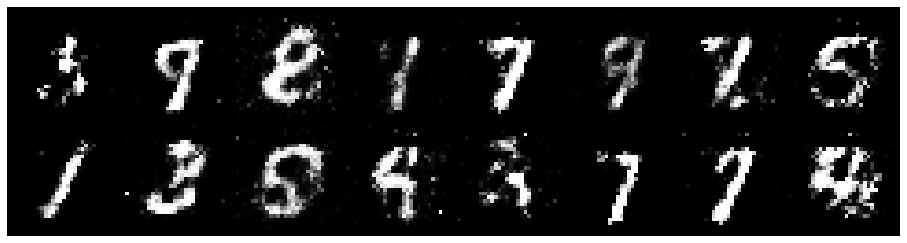

Epoch: [22/100], Batch Num: [300/700]
Discriminator Loss: 1.0990, Generator Loss: 1.0712
D(x): 0.6844, D(G(z)): 0.4279


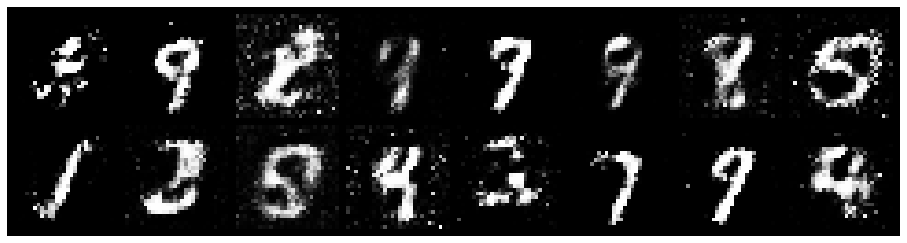

Epoch: [22/100], Batch Num: [400/700]
Discriminator Loss: 0.9610, Generator Loss: 1.4488
D(x): 0.6548, D(G(z)): 0.2968


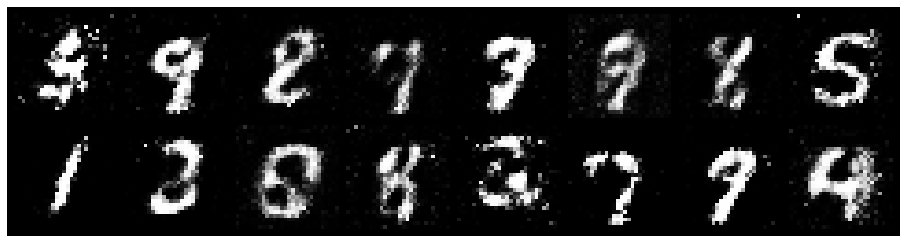

Epoch: [22/100], Batch Num: [500/700]
Discriminator Loss: 0.8715, Generator Loss: 1.7935
D(x): 0.6537, D(G(z)): 0.2320


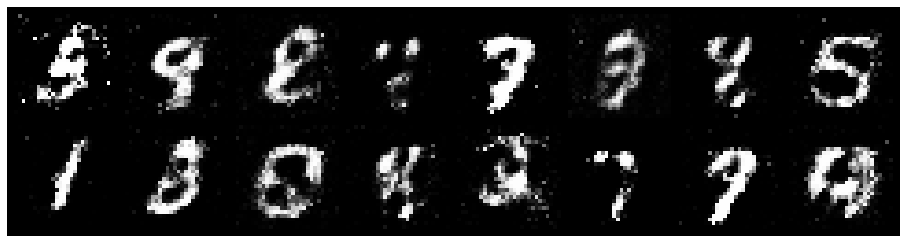

Epoch: [22/100], Batch Num: [600/700]
Discriminator Loss: 0.8405, Generator Loss: 1.7800
D(x): 0.6879, D(G(z)): 0.2600


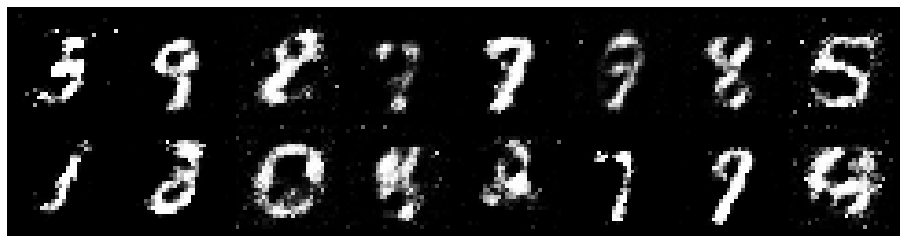

Epoch: [23/100], Batch Num: [0/700]
Discriminator Loss: 0.9629, Generator Loss: 1.2456
D(x): 0.7328, D(G(z)): 0.3710


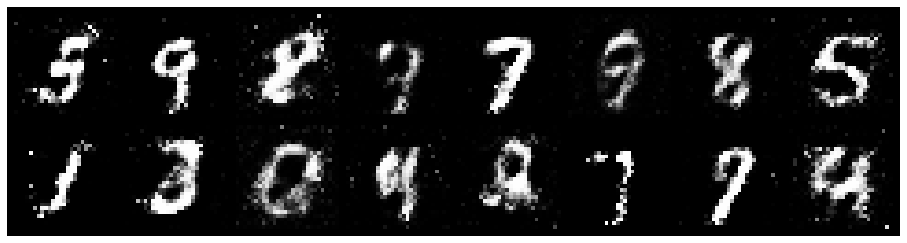

Epoch: [23/100], Batch Num: [100/700]
Discriminator Loss: 0.9581, Generator Loss: 1.0521
D(x): 0.7494, D(G(z)): 0.3681


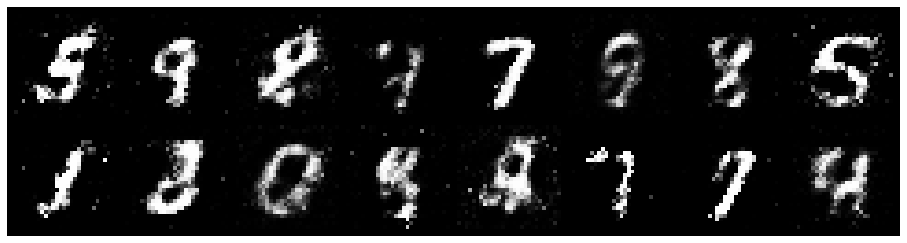

Epoch: [23/100], Batch Num: [200/700]
Discriminator Loss: 1.0400, Generator Loss: 1.2947
D(x): 0.7236, D(G(z)): 0.4162


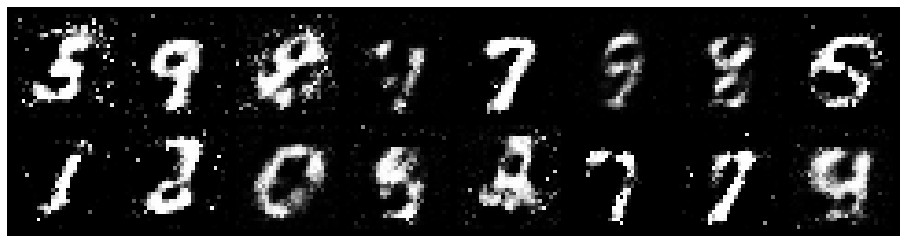

Epoch: [23/100], Batch Num: [300/700]
Discriminator Loss: 0.9722, Generator Loss: 1.5319
D(x): 0.6989, D(G(z)): 0.3560


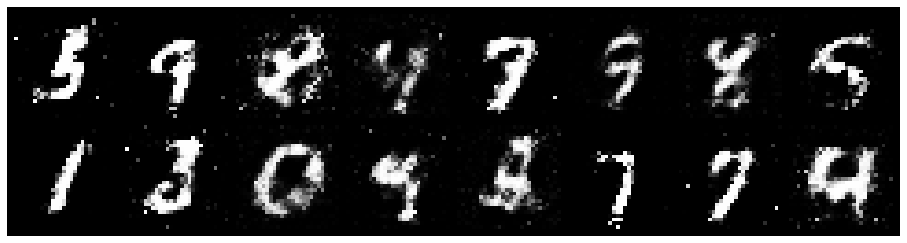

Epoch: [23/100], Batch Num: [400/700]
Discriminator Loss: 0.8896, Generator Loss: 1.6113
D(x): 0.6770, D(G(z)): 0.2944


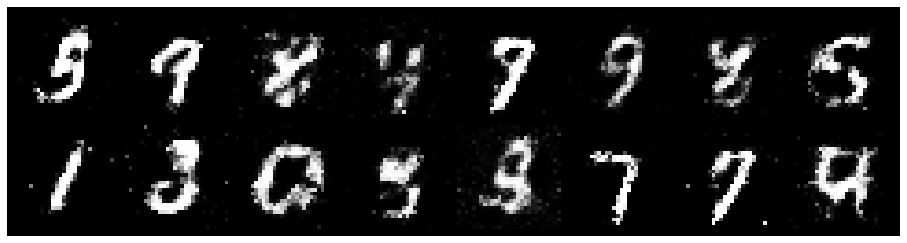

Epoch: [23/100], Batch Num: [500/700]
Discriminator Loss: 1.0586, Generator Loss: 1.3330
D(x): 0.6601, D(G(z)): 0.3158


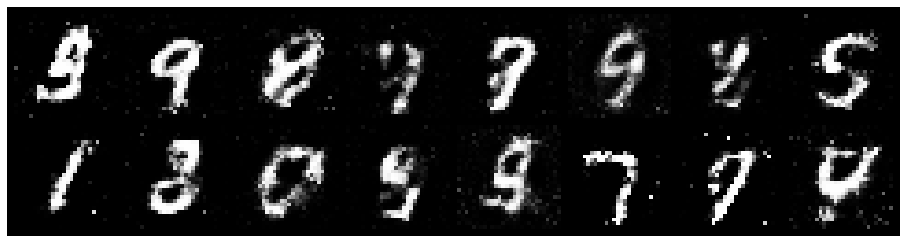

Epoch: [23/100], Batch Num: [600/700]
Discriminator Loss: 1.0302, Generator Loss: 1.4869
D(x): 0.6692, D(G(z)): 0.3490


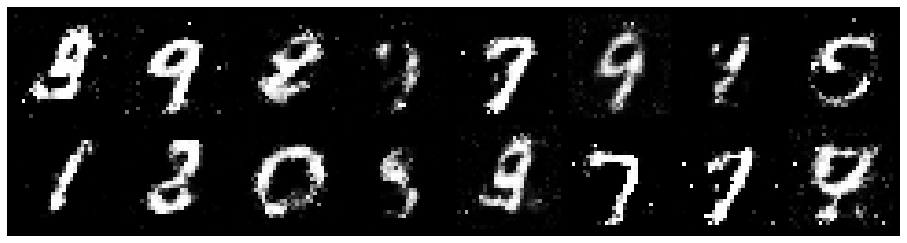

Epoch: [24/100], Batch Num: [0/700]
Discriminator Loss: 0.8894, Generator Loss: 1.3192
D(x): 0.6718, D(G(z)): 0.2826


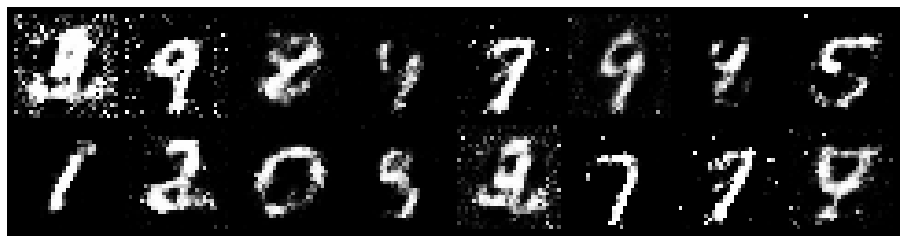

Epoch: [24/100], Batch Num: [100/700]
Discriminator Loss: 0.9513, Generator Loss: 1.3482
D(x): 0.6677, D(G(z)): 0.3437


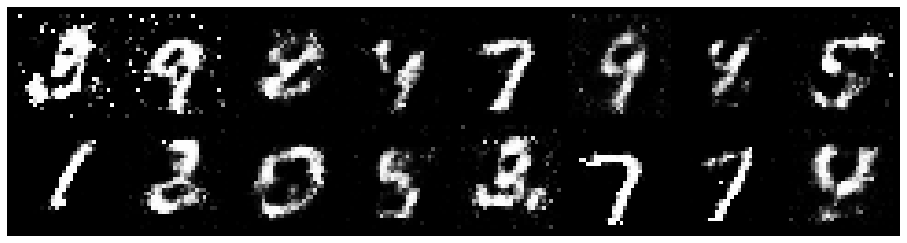

Epoch: [24/100], Batch Num: [200/700]
Discriminator Loss: 1.1631, Generator Loss: 1.2458
D(x): 0.6106, D(G(z)): 0.3553


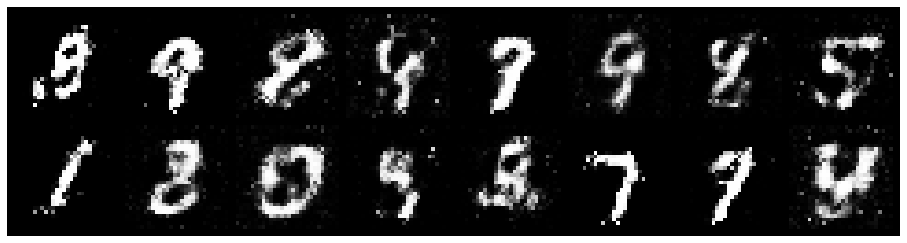

Epoch: [24/100], Batch Num: [300/700]
Discriminator Loss: 0.9833, Generator Loss: 1.1617
D(x): 0.6935, D(G(z)): 0.3782


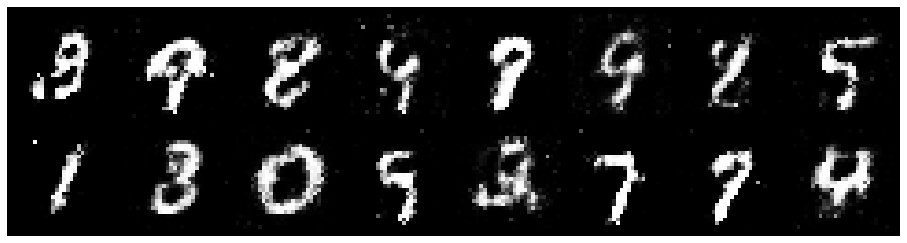

Epoch: [24/100], Batch Num: [400/700]
Discriminator Loss: 0.9753, Generator Loss: 1.1460
D(x): 0.6553, D(G(z)): 0.3574


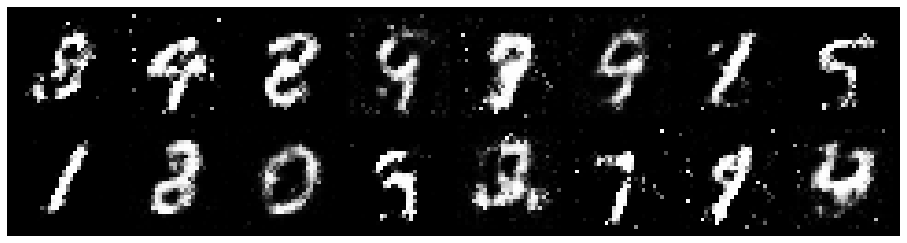

Epoch: [24/100], Batch Num: [500/700]
Discriminator Loss: 0.9051, Generator Loss: 1.2888
D(x): 0.7341, D(G(z)): 0.3621


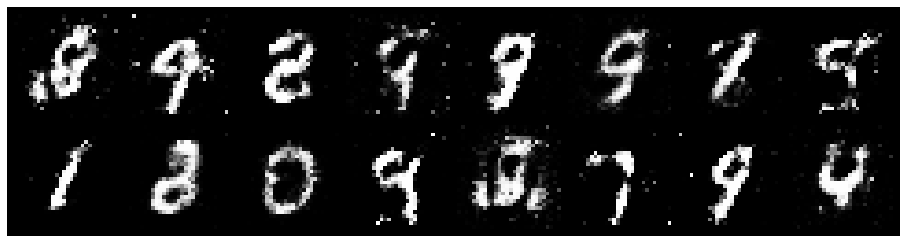

Epoch: [24/100], Batch Num: [600/700]
Discriminator Loss: 1.0021, Generator Loss: 1.1311
D(x): 0.6768, D(G(z)): 0.3692


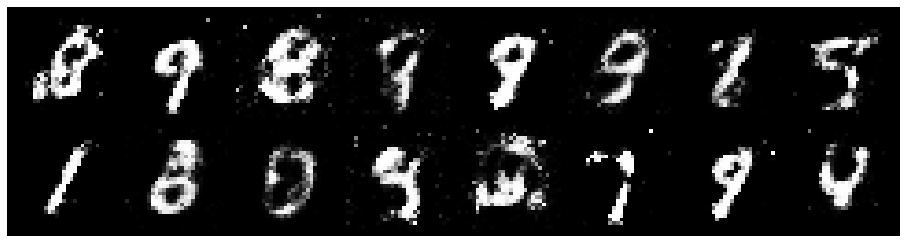

Epoch: [25/100], Batch Num: [0/700]
Discriminator Loss: 1.1725, Generator Loss: 1.3809
D(x): 0.5310, D(G(z)): 0.2856


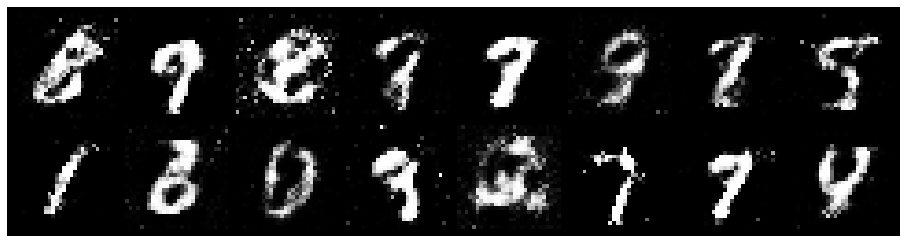

Epoch: [25/100], Batch Num: [100/700]
Discriminator Loss: 1.0112, Generator Loss: 1.6144
D(x): 0.7557, D(G(z)): 0.3827


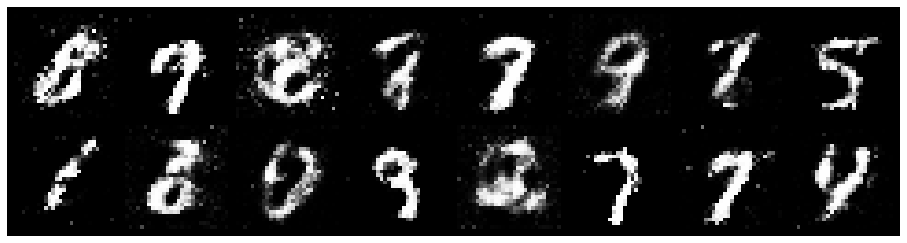

Epoch: [25/100], Batch Num: [200/700]
Discriminator Loss: 0.9766, Generator Loss: 1.6110
D(x): 0.6648, D(G(z)): 0.3005


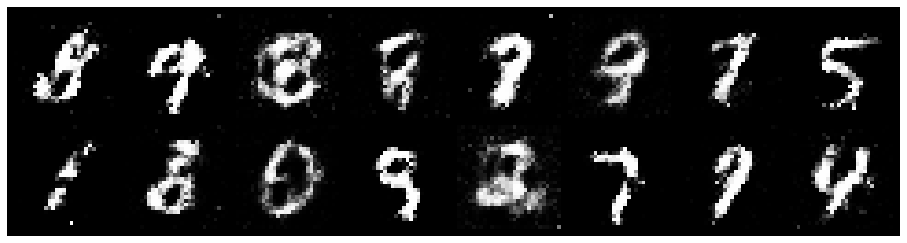

Epoch: [25/100], Batch Num: [300/700]
Discriminator Loss: 1.1582, Generator Loss: 1.0689
D(x): 0.6577, D(G(z)): 0.4182


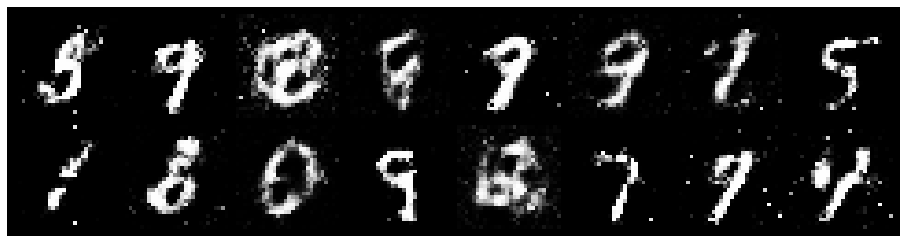

Epoch: [25/100], Batch Num: [400/700]
Discriminator Loss: 1.1018, Generator Loss: 1.1387
D(x): 0.6175, D(G(z)): 0.3482


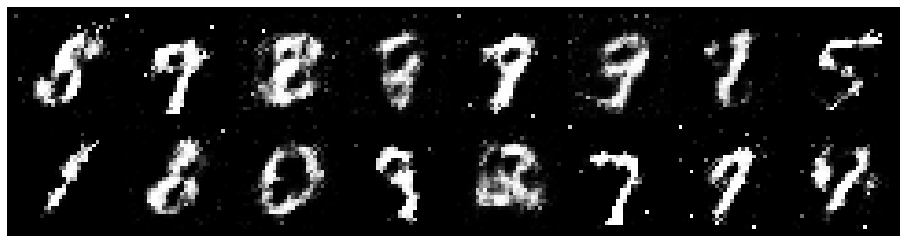

Epoch: [25/100], Batch Num: [500/700]
Discriminator Loss: 0.9830, Generator Loss: 1.3887
D(x): 0.6978, D(G(z)): 0.3464


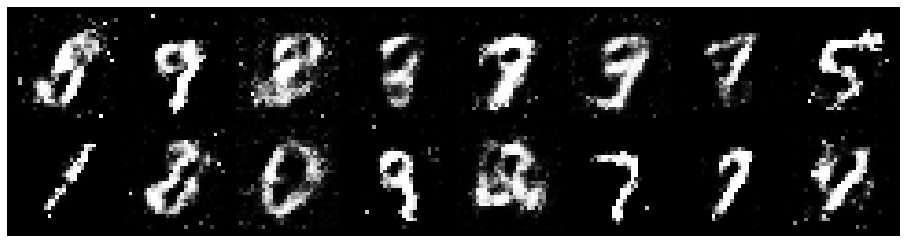

Epoch: [25/100], Batch Num: [600/700]
Discriminator Loss: 0.9415, Generator Loss: 1.1096
D(x): 0.6759, D(G(z)): 0.3275


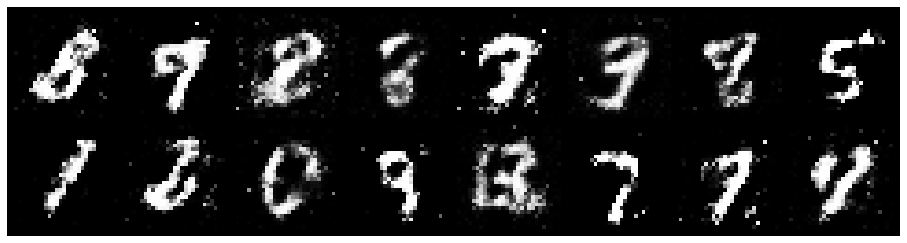

Epoch: [26/100], Batch Num: [0/700]
Discriminator Loss: 1.0680, Generator Loss: 1.2446
D(x): 0.6955, D(G(z)): 0.3945


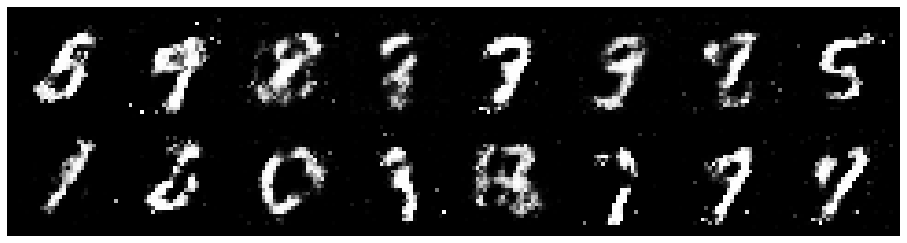

Epoch: [26/100], Batch Num: [100/700]
Discriminator Loss: 1.0917, Generator Loss: 1.1690
D(x): 0.6382, D(G(z)): 0.3253


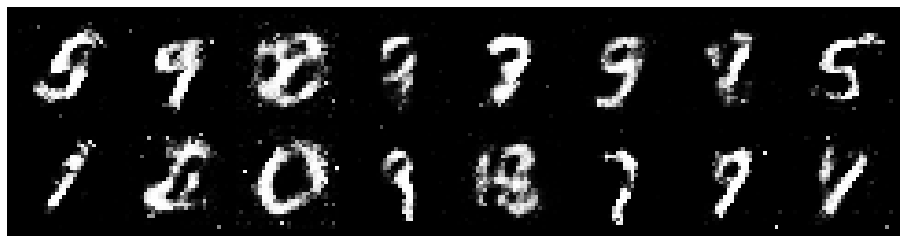

Epoch: [26/100], Batch Num: [200/700]
Discriminator Loss: 0.9978, Generator Loss: 1.0820
D(x): 0.6490, D(G(z)): 0.3338


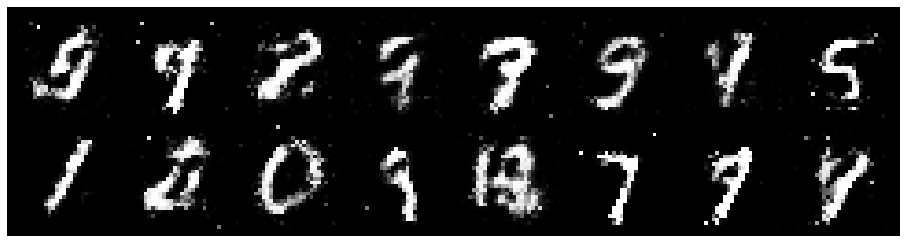

Epoch: [26/100], Batch Num: [300/700]
Discriminator Loss: 1.1367, Generator Loss: 1.5341
D(x): 0.7344, D(G(z)): 0.3886


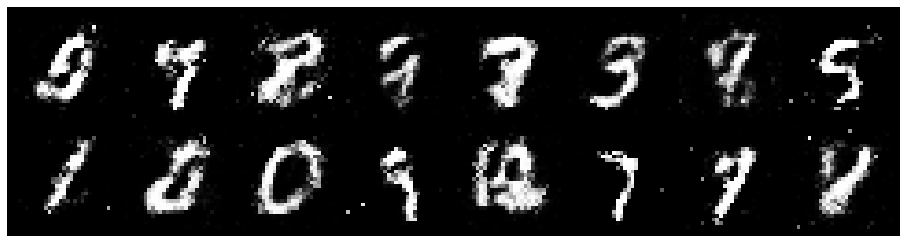

Epoch: [26/100], Batch Num: [400/700]
Discriminator Loss: 1.0235, Generator Loss: 1.1233
D(x): 0.6917, D(G(z)): 0.3664


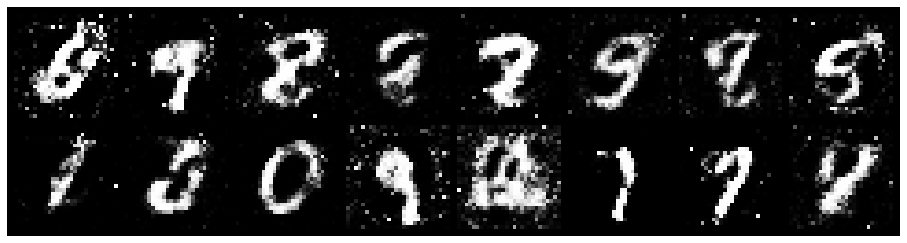

Epoch: [26/100], Batch Num: [500/700]
Discriminator Loss: 1.3073, Generator Loss: 0.8886
D(x): 0.6902, D(G(z)): 0.4992


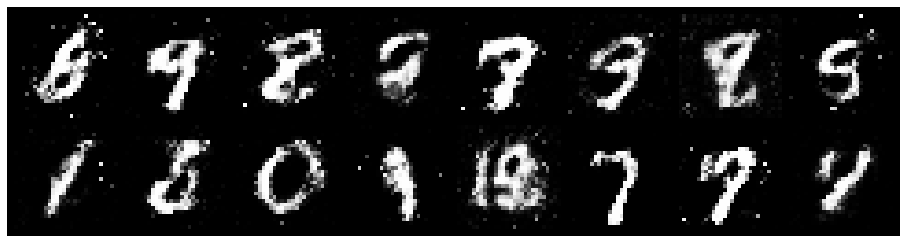

Epoch: [26/100], Batch Num: [600/700]
Discriminator Loss: 1.0295, Generator Loss: 1.0086
D(x): 0.7019, D(G(z)): 0.3878


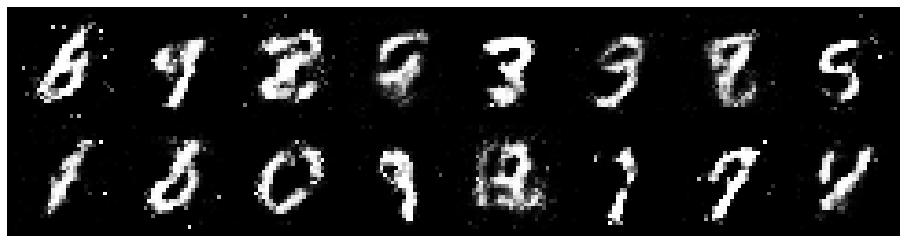

Epoch: [27/100], Batch Num: [0/700]
Discriminator Loss: 1.0538, Generator Loss: 1.4617
D(x): 0.7136, D(G(z)): 0.3842


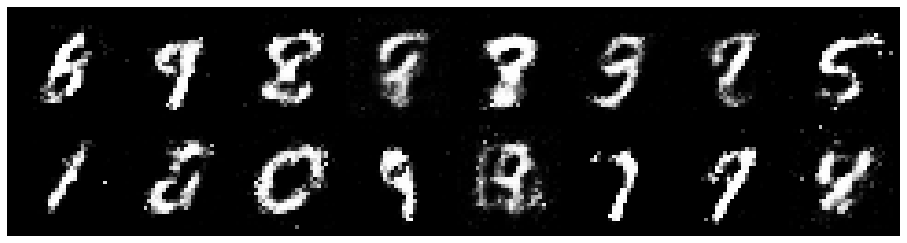

Epoch: [27/100], Batch Num: [100/700]
Discriminator Loss: 1.0632, Generator Loss: 1.1285
D(x): 0.7104, D(G(z)): 0.3855


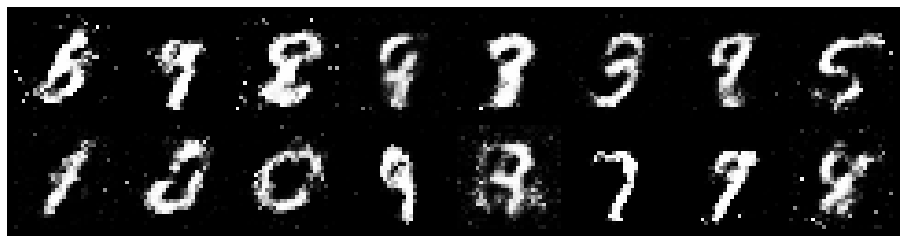

Epoch: [27/100], Batch Num: [200/700]
Discriminator Loss: 1.1008, Generator Loss: 1.0334
D(x): 0.6372, D(G(z)): 0.3775


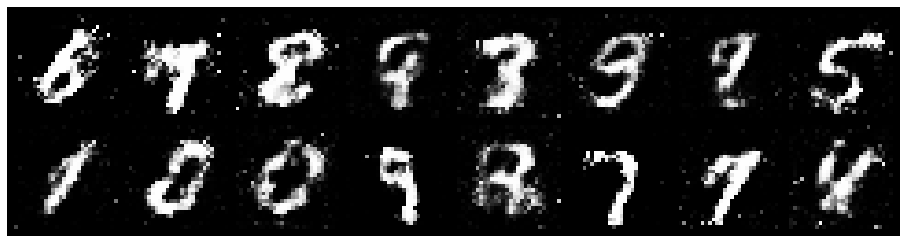

Epoch: [27/100], Batch Num: [300/700]
Discriminator Loss: 1.2129, Generator Loss: 1.2237
D(x): 0.6010, D(G(z)): 0.3919


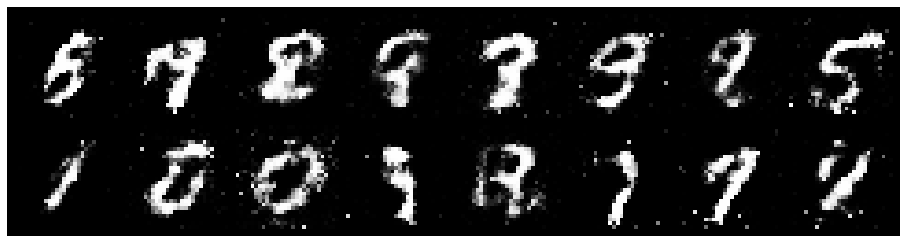

Epoch: [27/100], Batch Num: [400/700]
Discriminator Loss: 1.3300, Generator Loss: 1.1502
D(x): 0.6061, D(G(z)): 0.4275


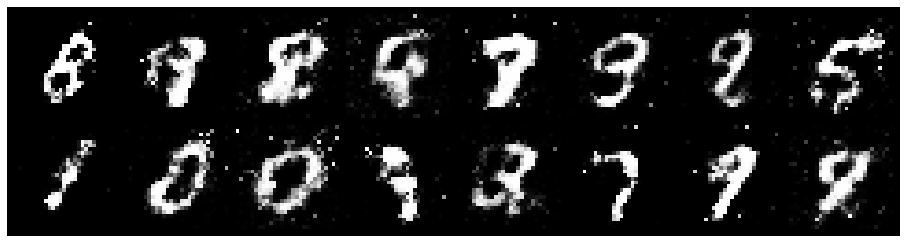

Epoch: [27/100], Batch Num: [500/700]
Discriminator Loss: 0.9609, Generator Loss: 1.5597
D(x): 0.6598, D(G(z)): 0.2979


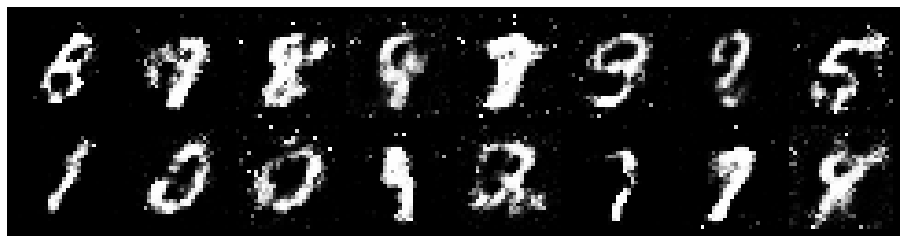

Epoch: [27/100], Batch Num: [600/700]
Discriminator Loss: 1.0143, Generator Loss: 1.1418
D(x): 0.7017, D(G(z)): 0.3709


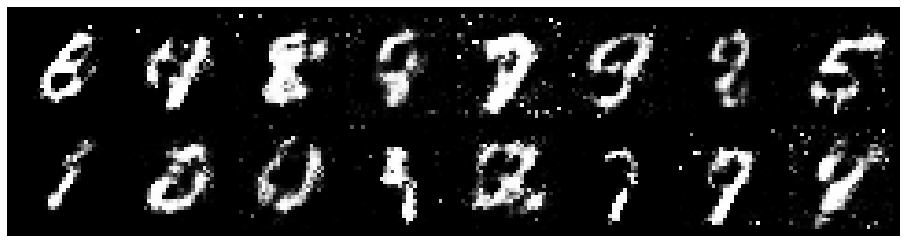

Epoch: [28/100], Batch Num: [0/700]
Discriminator Loss: 1.0697, Generator Loss: 1.2045
D(x): 0.6073, D(G(z)): 0.3483


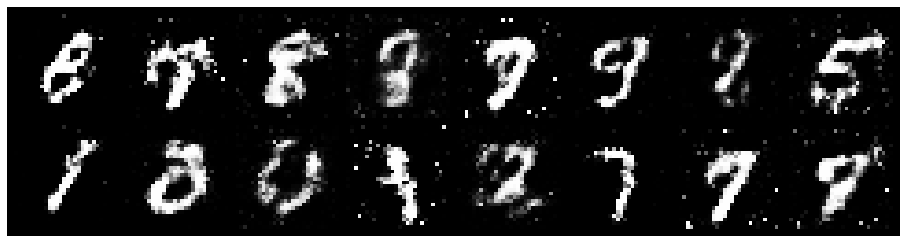

Epoch: [28/100], Batch Num: [100/700]
Discriminator Loss: 1.2046, Generator Loss: 1.4355
D(x): 0.5407, D(G(z)): 0.2810


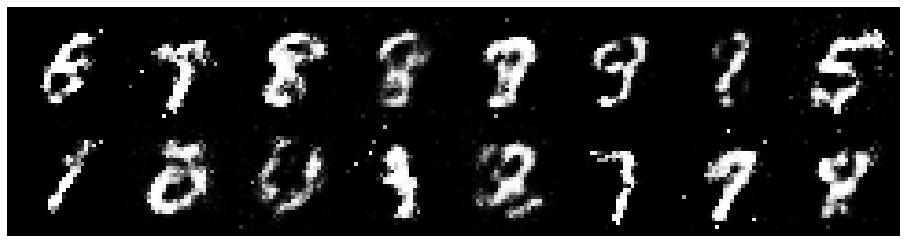

Epoch: [28/100], Batch Num: [200/700]
Discriminator Loss: 1.1115, Generator Loss: 1.1219
D(x): 0.6372, D(G(z)): 0.3547


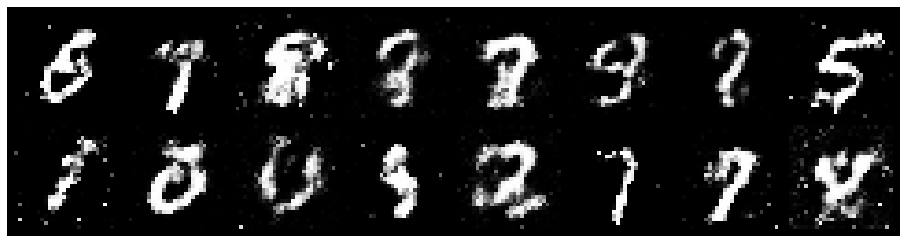

Epoch: [28/100], Batch Num: [300/700]
Discriminator Loss: 1.1039, Generator Loss: 1.4236
D(x): 0.6285, D(G(z)): 0.3489


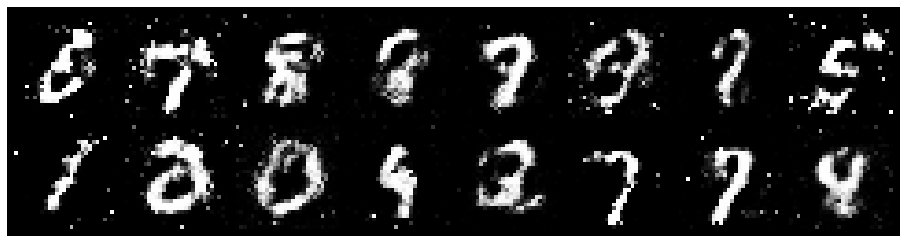

Epoch: [28/100], Batch Num: [400/700]
Discriminator Loss: 1.0592, Generator Loss: 1.3776
D(x): 0.5907, D(G(z)): 0.2866


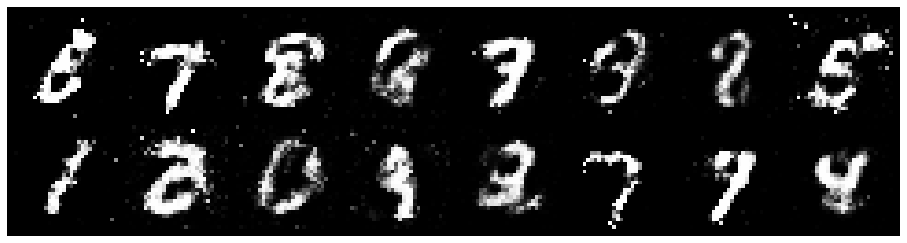

Epoch: [28/100], Batch Num: [500/700]
Discriminator Loss: 1.2025, Generator Loss: 1.2143
D(x): 0.7518, D(G(z)): 0.4986


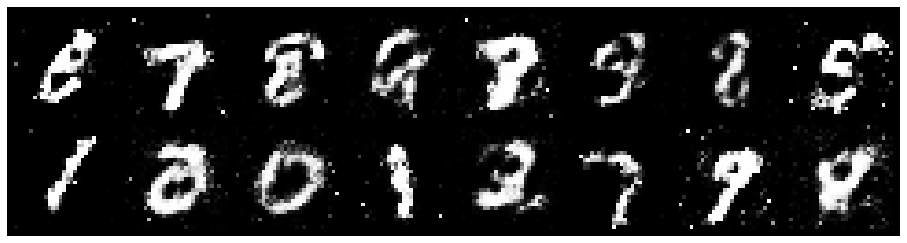

Epoch: [28/100], Batch Num: [600/700]
Discriminator Loss: 1.1109, Generator Loss: 1.5096
D(x): 0.6502, D(G(z)): 0.3521


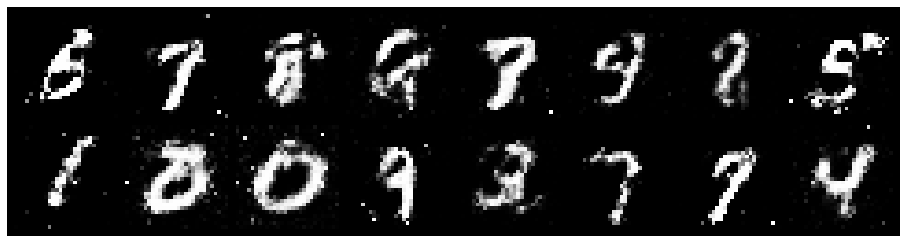

Epoch: [29/100], Batch Num: [0/700]
Discriminator Loss: 0.9888, Generator Loss: 1.6433
D(x): 0.6153, D(G(z)): 0.2779


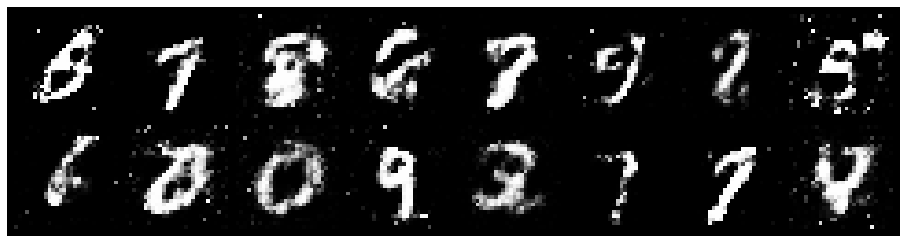

Epoch: [29/100], Batch Num: [100/700]
Discriminator Loss: 0.9738, Generator Loss: 1.4190
D(x): 0.7455, D(G(z)): 0.3856


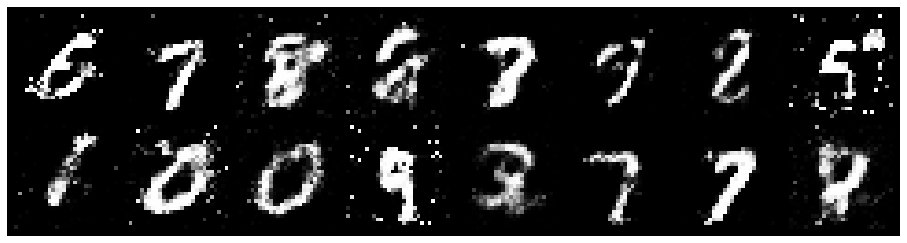

Epoch: [29/100], Batch Num: [200/700]
Discriminator Loss: 1.1192, Generator Loss: 1.3944
D(x): 0.6433, D(G(z)): 0.3823


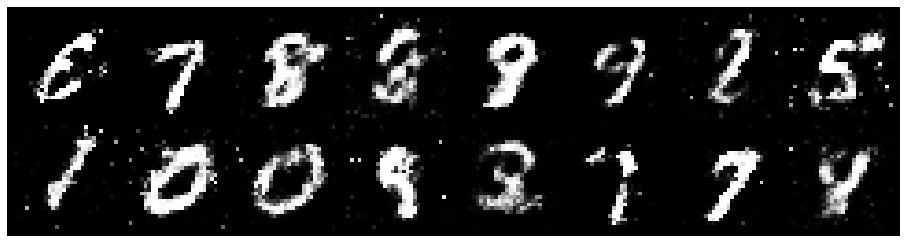

Epoch: [29/100], Batch Num: [300/700]
Discriminator Loss: 0.9549, Generator Loss: 1.2295
D(x): 0.6330, D(G(z)): 0.3310


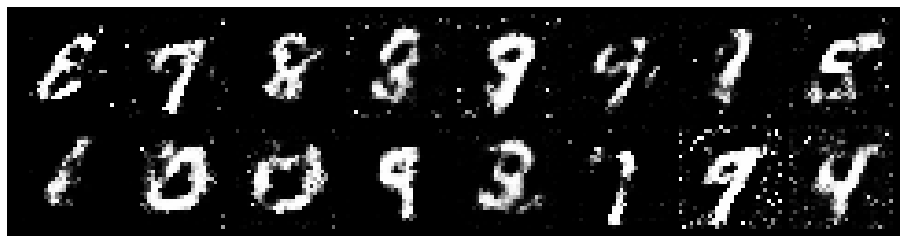

Epoch: [29/100], Batch Num: [400/700]
Discriminator Loss: 1.1230, Generator Loss: 1.0118
D(x): 0.6332, D(G(z)): 0.4075


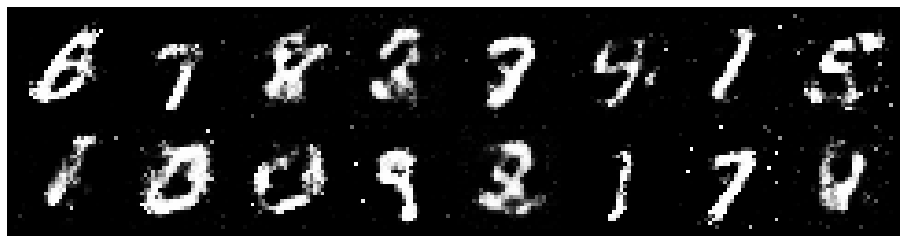

Epoch: [29/100], Batch Num: [500/700]
Discriminator Loss: 0.9307, Generator Loss: 1.3185
D(x): 0.6997, D(G(z)): 0.3276


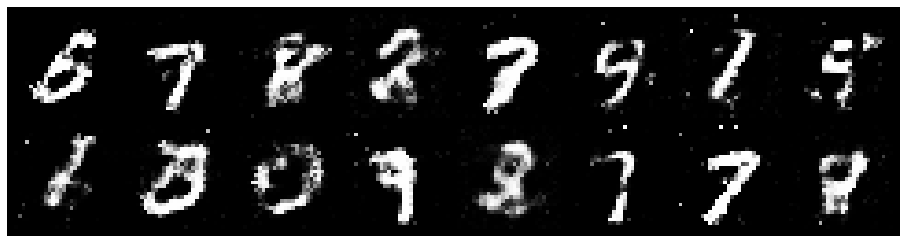

Epoch: [29/100], Batch Num: [600/700]
Discriminator Loss: 1.0825, Generator Loss: 1.6722
D(x): 0.6034, D(G(z)): 0.2936


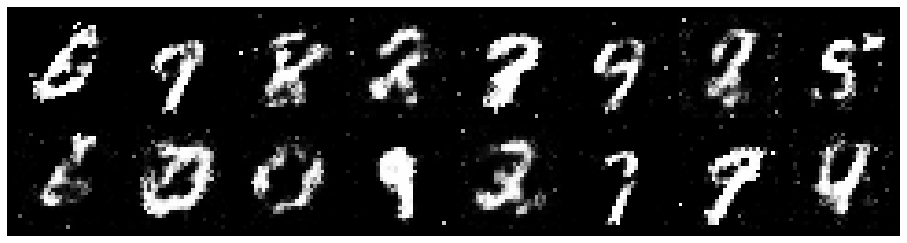

Epoch: [30/100], Batch Num: [0/700]
Discriminator Loss: 0.9154, Generator Loss: 1.6207
D(x): 0.6523, D(G(z)): 0.2907


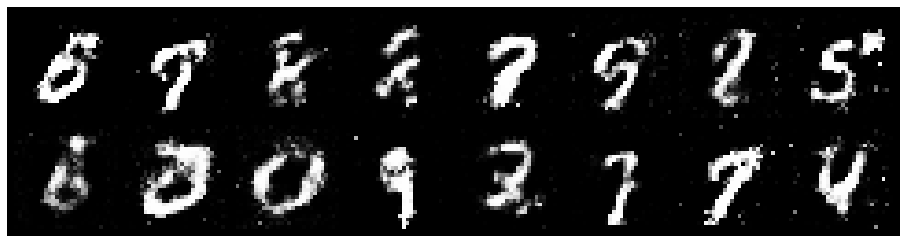

Epoch: [30/100], Batch Num: [100/700]
Discriminator Loss: 1.0418, Generator Loss: 1.2790
D(x): 0.6682, D(G(z)): 0.3564


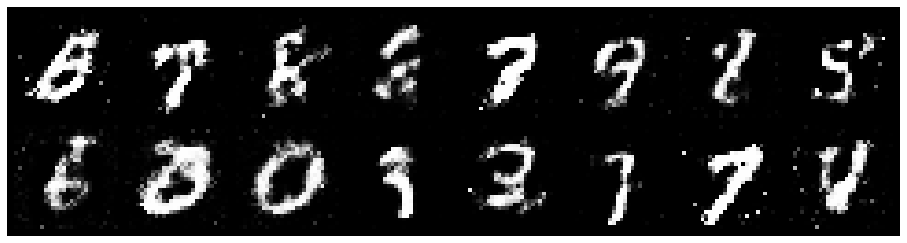

Epoch: [30/100], Batch Num: [200/700]
Discriminator Loss: 1.0755, Generator Loss: 1.2691
D(x): 0.7327, D(G(z)): 0.4450


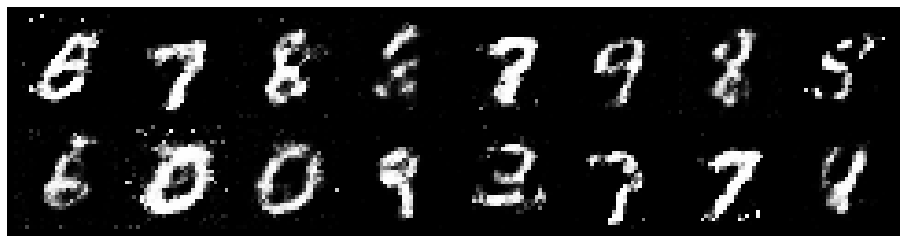

Epoch: [30/100], Batch Num: [300/700]
Discriminator Loss: 0.9532, Generator Loss: 1.3410
D(x): 0.6697, D(G(z)): 0.3239


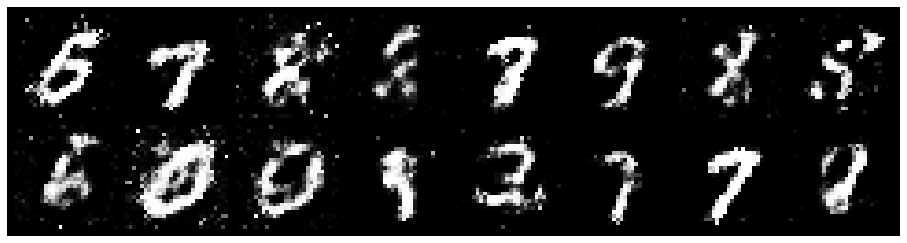

Epoch: [30/100], Batch Num: [400/700]
Discriminator Loss: 0.9907, Generator Loss: 1.3391
D(x): 0.6290, D(G(z)): 0.3268


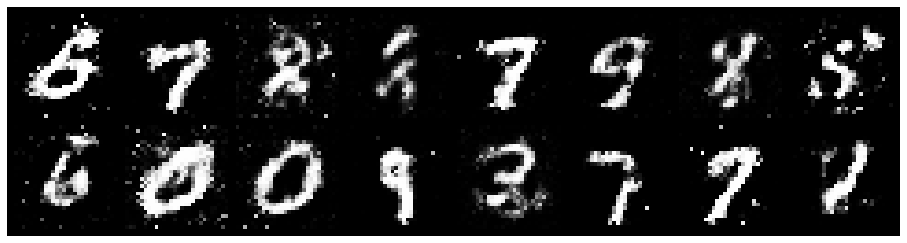

Epoch: [30/100], Batch Num: [500/700]
Discriminator Loss: 1.0909, Generator Loss: 1.3727
D(x): 0.6577, D(G(z)): 0.3793


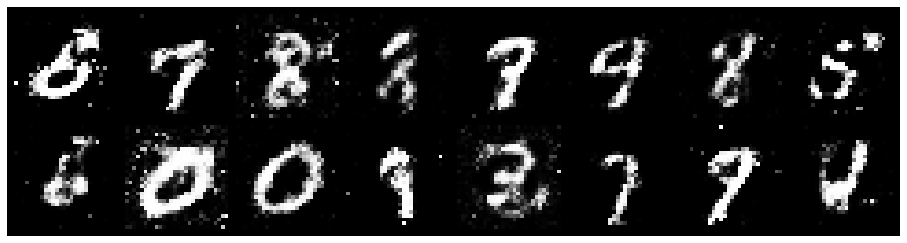

Epoch: [30/100], Batch Num: [600/700]
Discriminator Loss: 0.9070, Generator Loss: 1.2502
D(x): 0.6681, D(G(z)): 0.3380


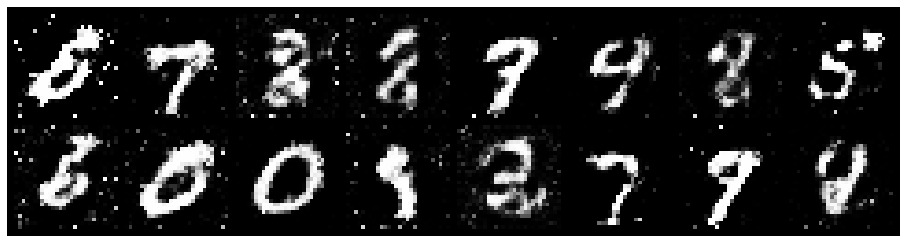

Epoch: [31/100], Batch Num: [0/700]
Discriminator Loss: 0.9125, Generator Loss: 1.1701
D(x): 0.7059, D(G(z)): 0.3348


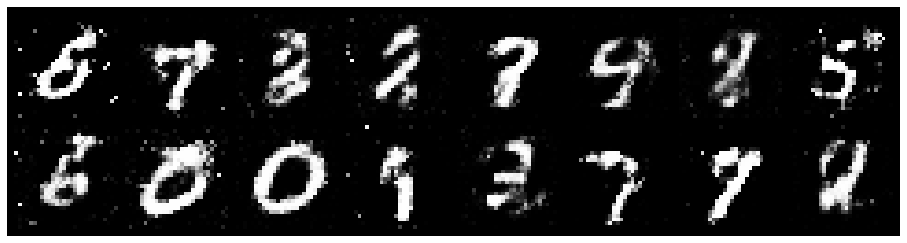

Epoch: [31/100], Batch Num: [100/700]
Discriminator Loss: 0.9828, Generator Loss: 1.6291
D(x): 0.6911, D(G(z)): 0.3357


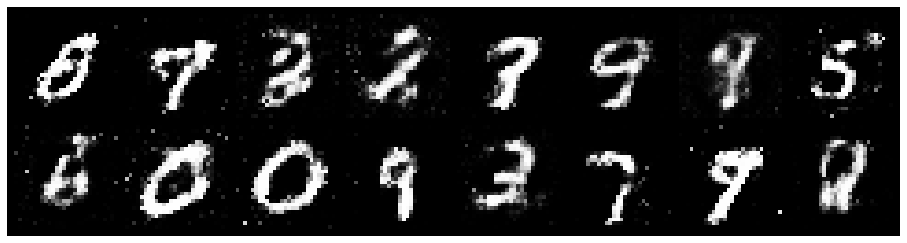

Epoch: [31/100], Batch Num: [200/700]
Discriminator Loss: 0.9666, Generator Loss: 1.2787
D(x): 0.6589, D(G(z)): 0.3336


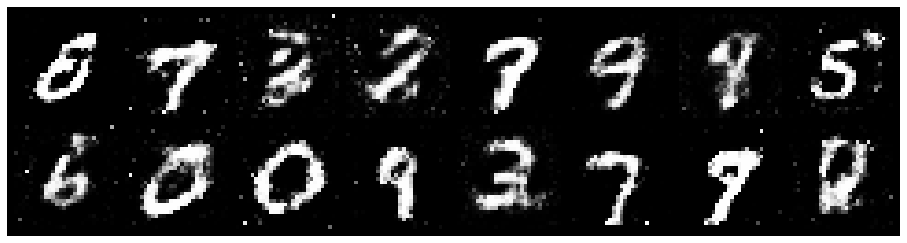

Epoch: [31/100], Batch Num: [300/700]
Discriminator Loss: 0.8183, Generator Loss: 1.5148
D(x): 0.7090, D(G(z)): 0.2782


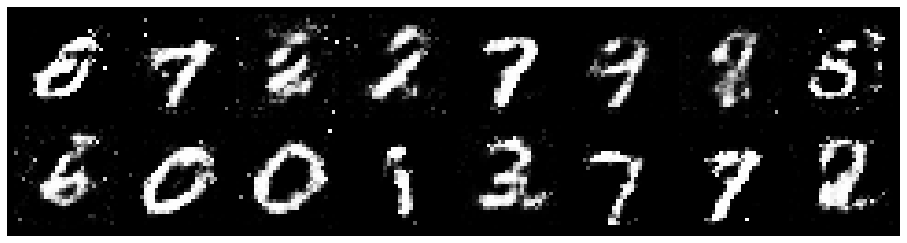

Epoch: [31/100], Batch Num: [400/700]
Discriminator Loss: 1.0755, Generator Loss: 1.2694
D(x): 0.7154, D(G(z)): 0.4025


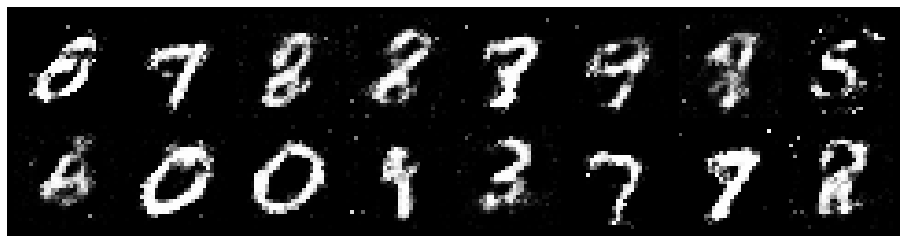

Epoch: [31/100], Batch Num: [500/700]
Discriminator Loss: 0.9716, Generator Loss: 1.5022
D(x): 0.6397, D(G(z)): 0.2788


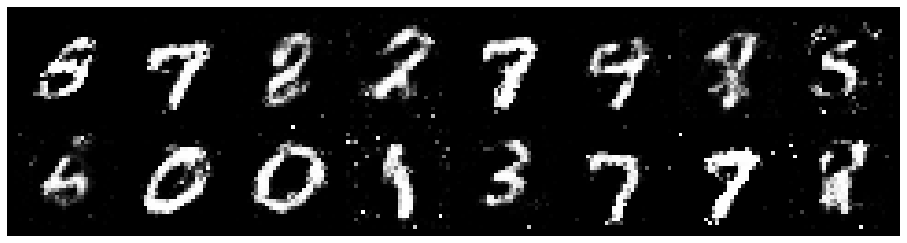

Epoch: [31/100], Batch Num: [600/700]
Discriminator Loss: 0.9797, Generator Loss: 1.2842
D(x): 0.6496, D(G(z)): 0.3358


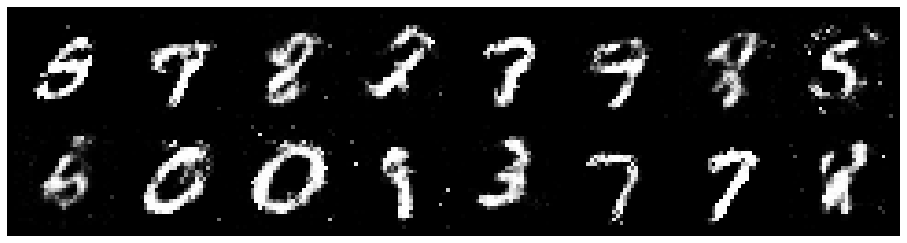

Epoch: [32/100], Batch Num: [0/700]
Discriminator Loss: 0.9042, Generator Loss: 1.2847
D(x): 0.6881, D(G(z)): 0.3274


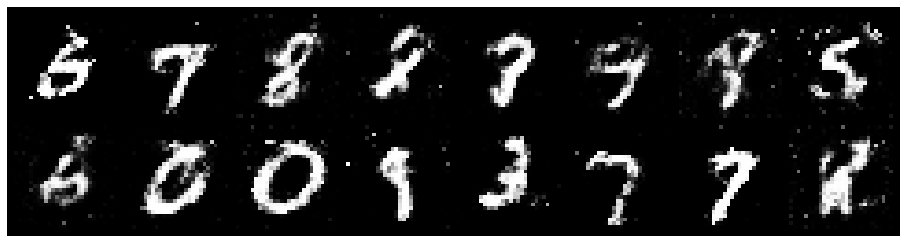

Epoch: [32/100], Batch Num: [100/700]
Discriminator Loss: 1.0970, Generator Loss: 1.2015
D(x): 0.6435, D(G(z)): 0.3827


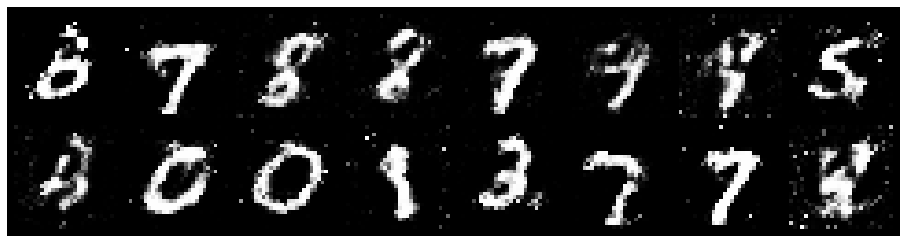

Epoch: [32/100], Batch Num: [200/700]
Discriminator Loss: 1.0521, Generator Loss: 1.3449
D(x): 0.6602, D(G(z)): 0.3273


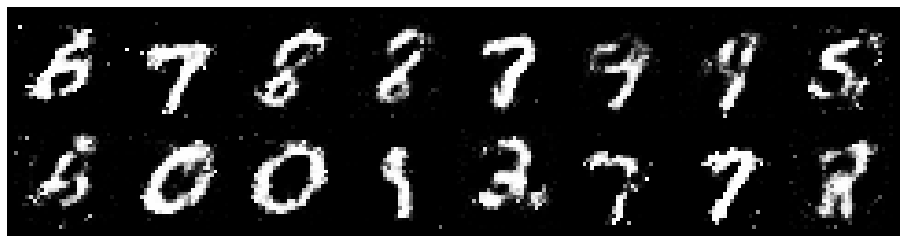

Epoch: [32/100], Batch Num: [300/700]
Discriminator Loss: 1.1155, Generator Loss: 1.3325
D(x): 0.6535, D(G(z)): 0.4113


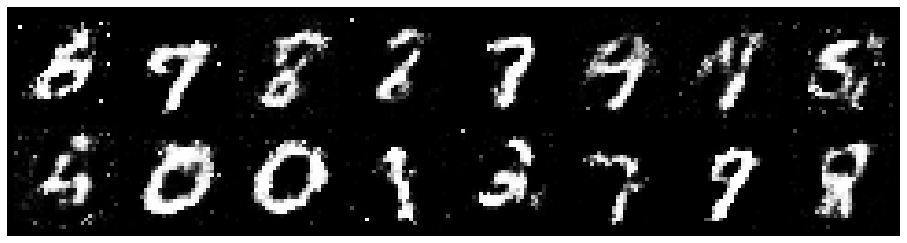

Epoch: [32/100], Batch Num: [400/700]
Discriminator Loss: 0.9797, Generator Loss: 1.0213
D(x): 0.7265, D(G(z)): 0.3935


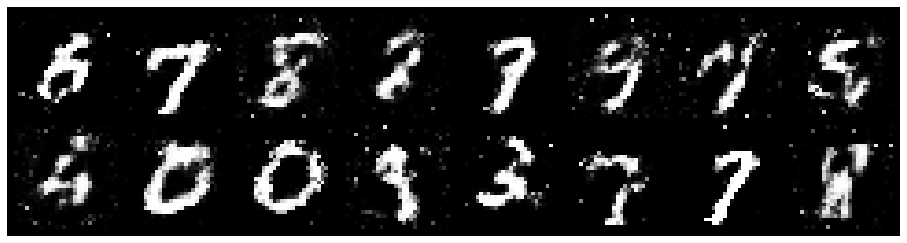

Epoch: [32/100], Batch Num: [500/700]
Discriminator Loss: 1.0922, Generator Loss: 1.4133
D(x): 0.6600, D(G(z)): 0.4085


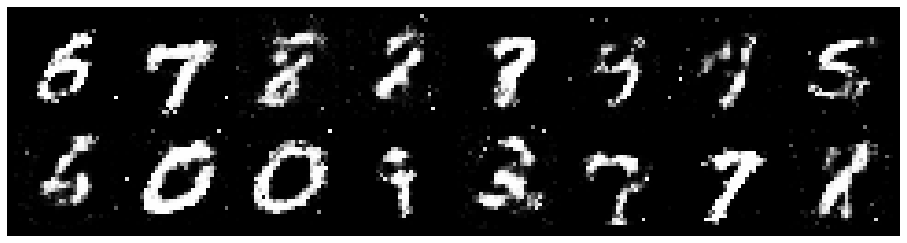

Epoch: [32/100], Batch Num: [600/700]
Discriminator Loss: 0.9724, Generator Loss: 1.1740
D(x): 0.7048, D(G(z)): 0.3875


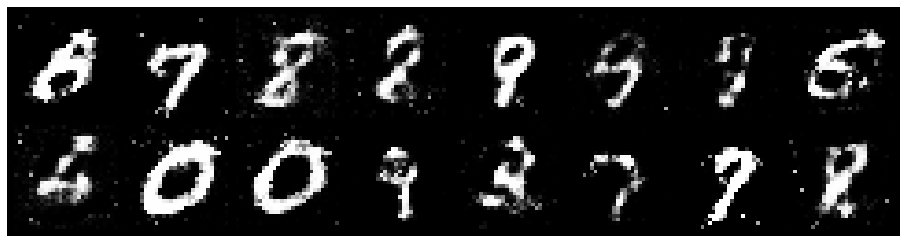

Epoch: [33/100], Batch Num: [0/700]
Discriminator Loss: 1.2306, Generator Loss: 1.1794
D(x): 0.6042, D(G(z)): 0.4303


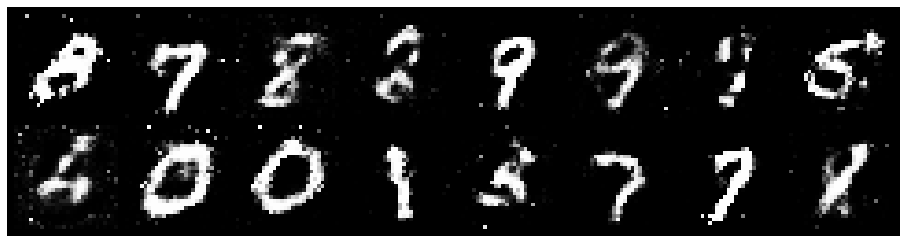

Epoch: [33/100], Batch Num: [100/700]
Discriminator Loss: 1.0320, Generator Loss: 1.6888
D(x): 0.6197, D(G(z)): 0.3191


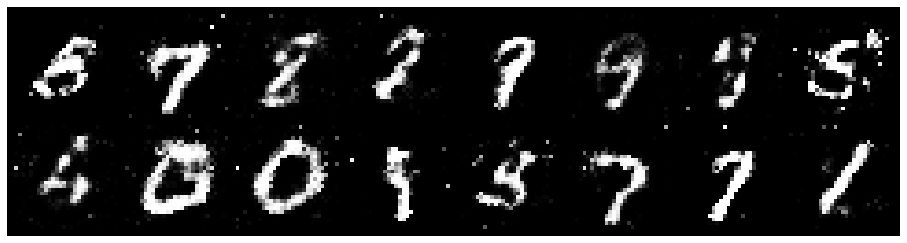

Epoch: [33/100], Batch Num: [200/700]
Discriminator Loss: 1.1026, Generator Loss: 0.9539
D(x): 0.5923, D(G(z)): 0.3753


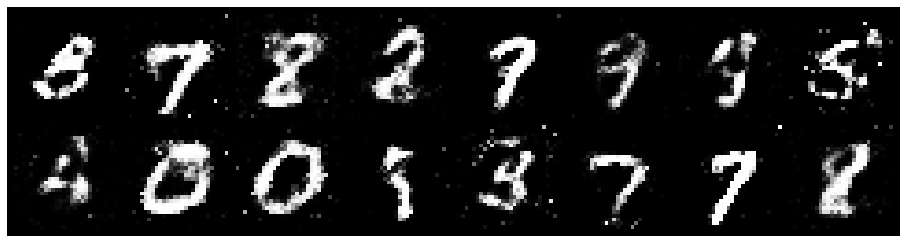

Epoch: [33/100], Batch Num: [300/700]
Discriminator Loss: 0.9023, Generator Loss: 1.6380
D(x): 0.6962, D(G(z)): 0.3182


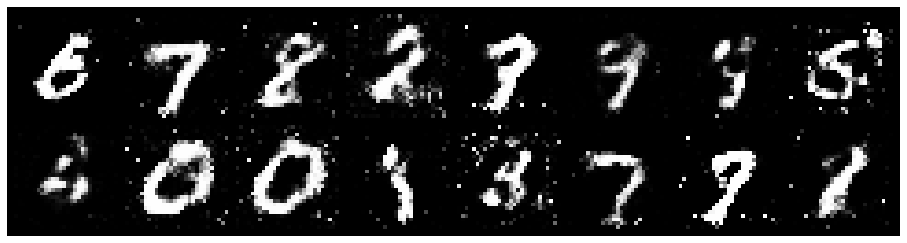

Epoch: [33/100], Batch Num: [400/700]
Discriminator Loss: 1.0474, Generator Loss: 1.3117
D(x): 0.6582, D(G(z)): 0.3588


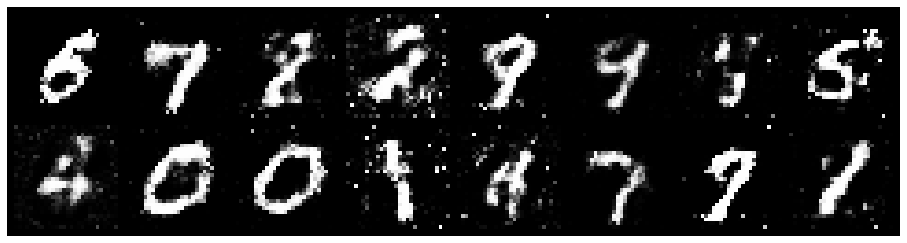

Epoch: [33/100], Batch Num: [500/700]
Discriminator Loss: 1.0138, Generator Loss: 1.3966
D(x): 0.6046, D(G(z)): 0.2916


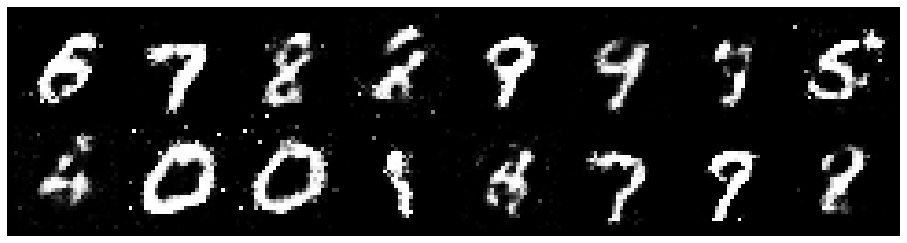

Epoch: [33/100], Batch Num: [600/700]
Discriminator Loss: 1.1559, Generator Loss: 1.4976
D(x): 0.6091, D(G(z)): 0.3429


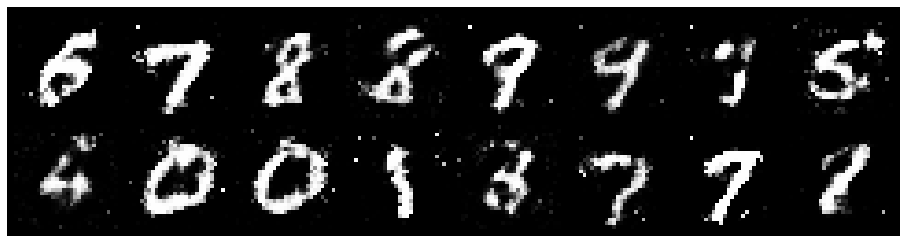

Epoch: [34/100], Batch Num: [0/700]
Discriminator Loss: 1.0770, Generator Loss: 1.0920
D(x): 0.6412, D(G(z)): 0.3742


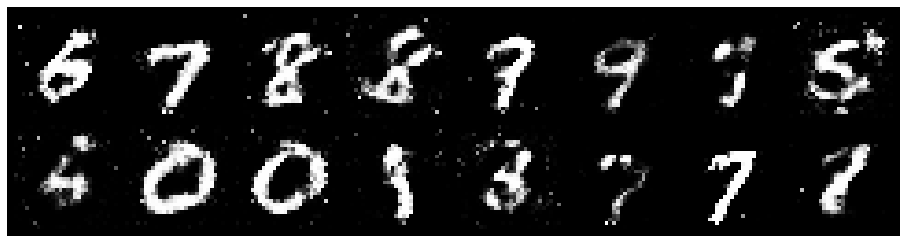

Epoch: [34/100], Batch Num: [100/700]
Discriminator Loss: 0.8490, Generator Loss: 1.4539
D(x): 0.6332, D(G(z)): 0.2436


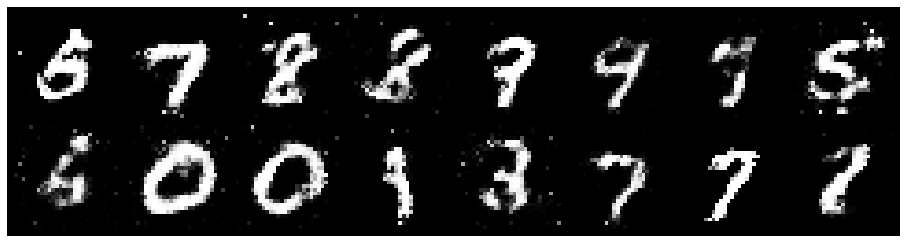

Epoch: [34/100], Batch Num: [200/700]
Discriminator Loss: 1.2154, Generator Loss: 1.1157
D(x): 0.6320, D(G(z)): 0.4248


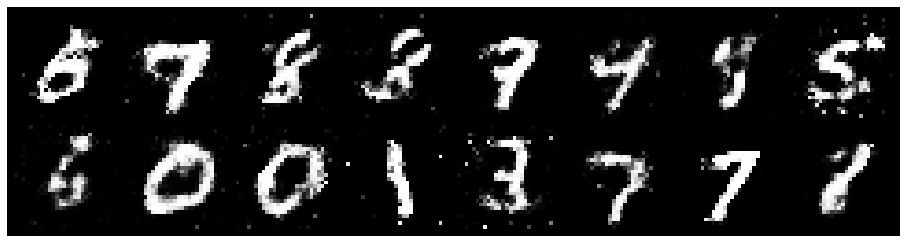

Epoch: [34/100], Batch Num: [300/700]
Discriminator Loss: 1.2577, Generator Loss: 1.0851
D(x): 0.6271, D(G(z)): 0.4285


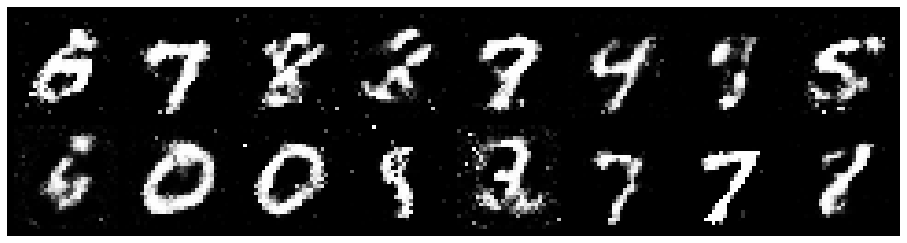

Epoch: [34/100], Batch Num: [400/700]
Discriminator Loss: 1.1997, Generator Loss: 1.2842
D(x): 0.6255, D(G(z)): 0.3772


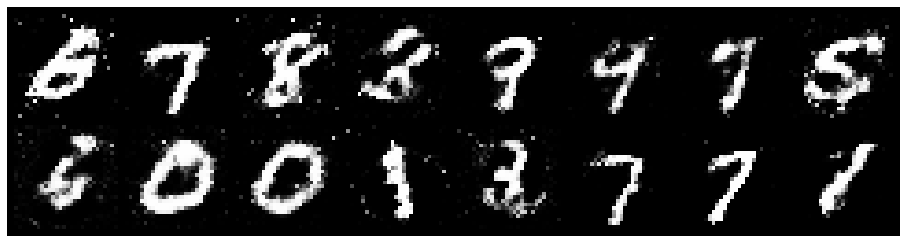

Epoch: [34/100], Batch Num: [500/700]
Discriminator Loss: 1.0362, Generator Loss: 1.1541
D(x): 0.5948, D(G(z)): 0.3401


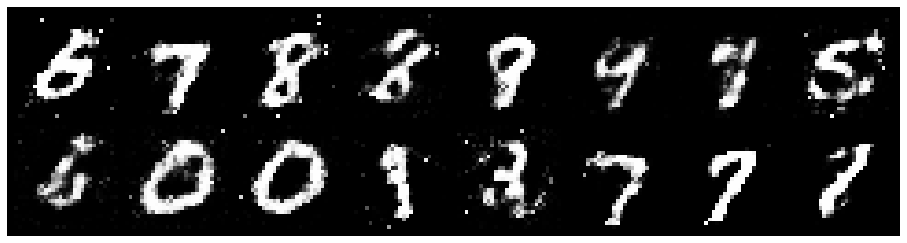

Epoch: [34/100], Batch Num: [600/700]
Discriminator Loss: 0.9874, Generator Loss: 1.1948
D(x): 0.6851, D(G(z)): 0.3773


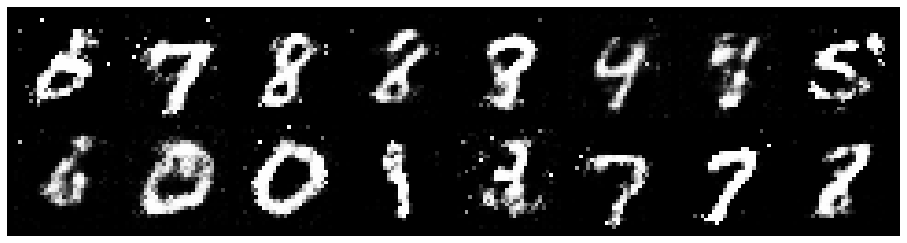

Epoch: [35/100], Batch Num: [0/700]
Discriminator Loss: 1.1510, Generator Loss: 0.9421
D(x): 0.6661, D(G(z)): 0.4334


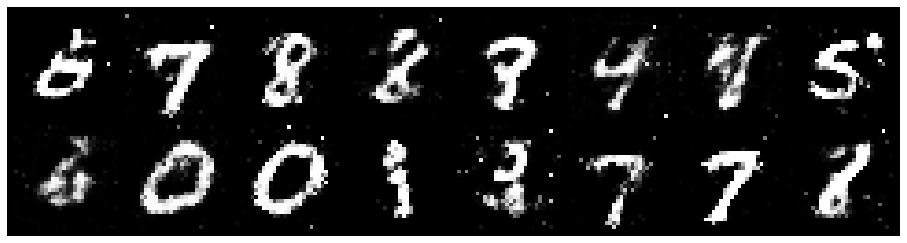

Epoch: [35/100], Batch Num: [100/700]
Discriminator Loss: 1.2342, Generator Loss: 1.0423
D(x): 0.6394, D(G(z)): 0.4430


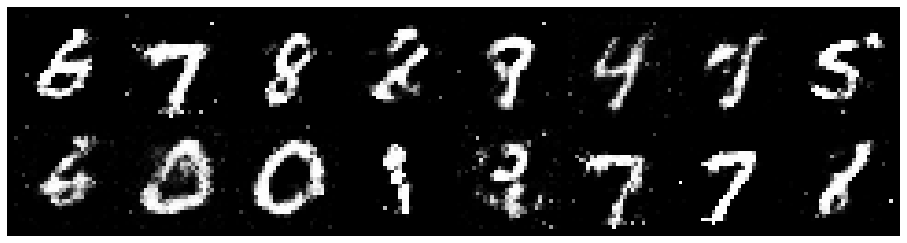

Epoch: [35/100], Batch Num: [200/700]
Discriminator Loss: 1.0371, Generator Loss: 1.2128
D(x): 0.6262, D(G(z)): 0.3527


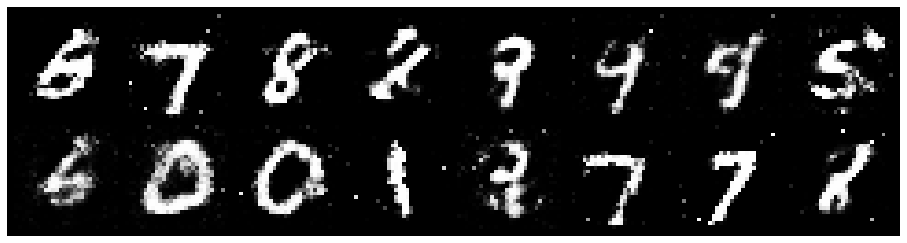

Epoch: [35/100], Batch Num: [300/700]
Discriminator Loss: 1.2222, Generator Loss: 1.1202
D(x): 0.5582, D(G(z)): 0.3829


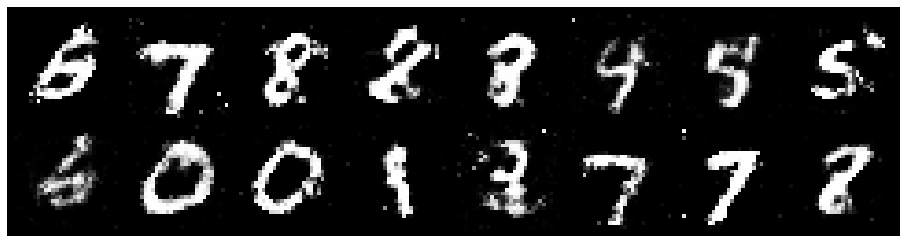

Epoch: [35/100], Batch Num: [400/700]
Discriminator Loss: 1.2094, Generator Loss: 1.0991
D(x): 0.6369, D(G(z)): 0.4075


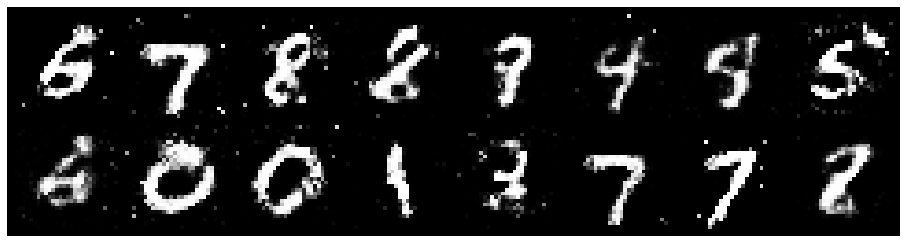

Epoch: [35/100], Batch Num: [500/700]
Discriminator Loss: 1.1037, Generator Loss: 1.3448
D(x): 0.5774, D(G(z)): 0.3125


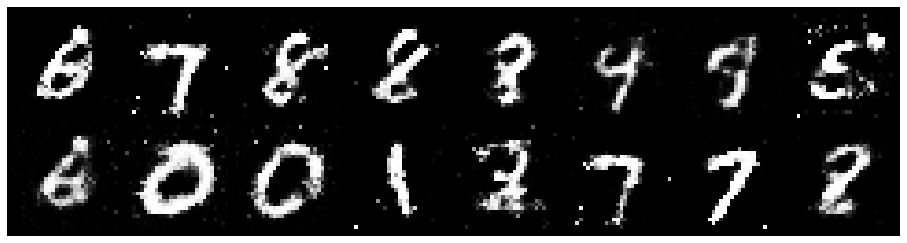

Epoch: [35/100], Batch Num: [600/700]
Discriminator Loss: 1.2865, Generator Loss: 1.1630
D(x): 0.6335, D(G(z)): 0.4674


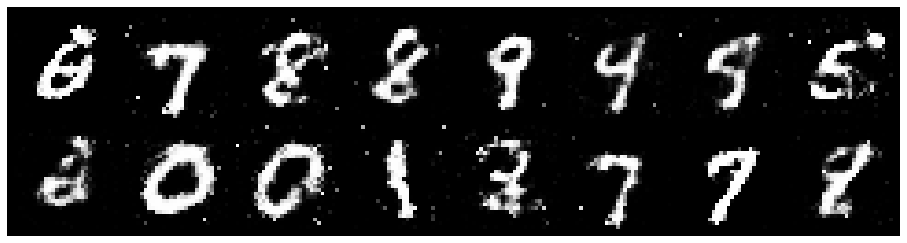

Epoch: [36/100], Batch Num: [0/700]
Discriminator Loss: 0.9923, Generator Loss: 1.0119
D(x): 0.6695, D(G(z)): 0.3798


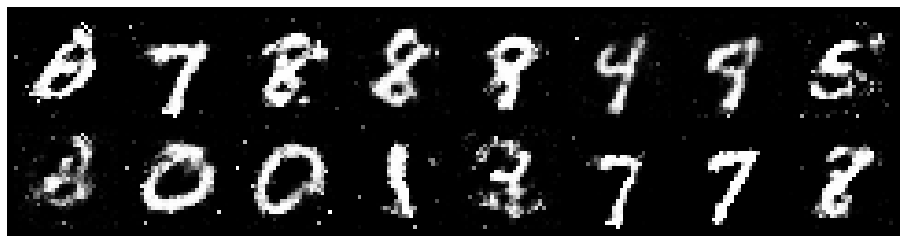

Epoch: [36/100], Batch Num: [100/700]
Discriminator Loss: 1.0750, Generator Loss: 1.0835
D(x): 0.6481, D(G(z)): 0.3724


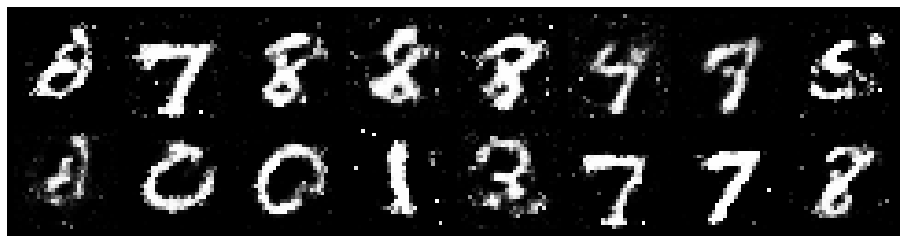

Epoch: [36/100], Batch Num: [200/700]
Discriminator Loss: 1.2308, Generator Loss: 1.1867
D(x): 0.6520, D(G(z)): 0.4562


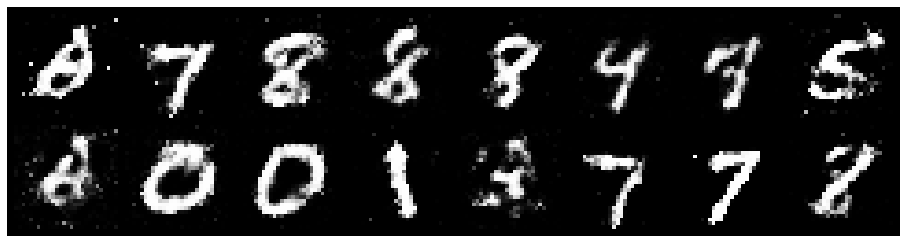

Epoch: [36/100], Batch Num: [300/700]
Discriminator Loss: 1.1412, Generator Loss: 1.1888
D(x): 0.6510, D(G(z)): 0.4173


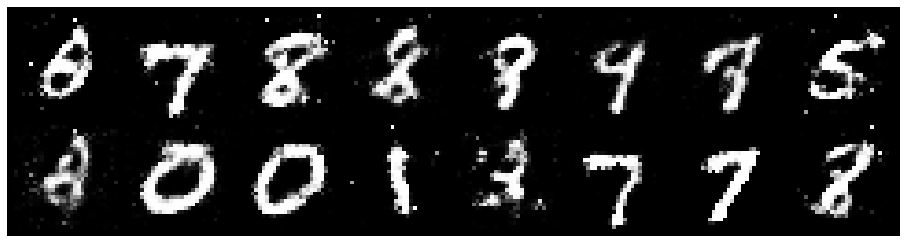

Epoch: [36/100], Batch Num: [400/700]
Discriminator Loss: 1.1932, Generator Loss: 1.2812
D(x): 0.6340, D(G(z)): 0.3898


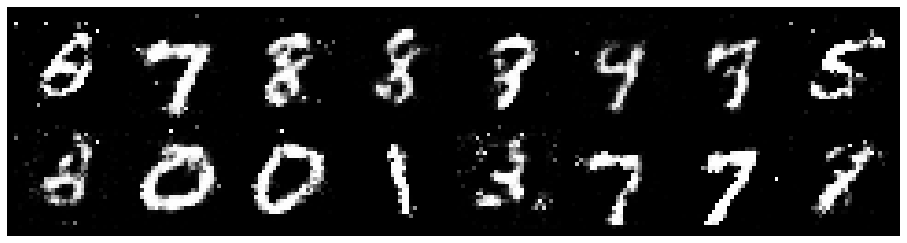

Epoch: [36/100], Batch Num: [500/700]
Discriminator Loss: 1.0449, Generator Loss: 0.9962
D(x): 0.6484, D(G(z)): 0.4049


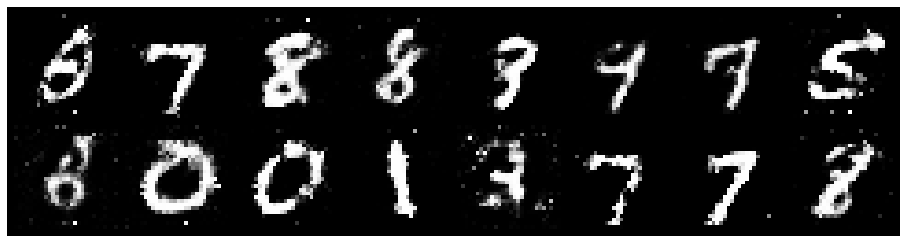

Epoch: [36/100], Batch Num: [600/700]
Discriminator Loss: 1.2451, Generator Loss: 1.0543
D(x): 0.5760, D(G(z)): 0.4184


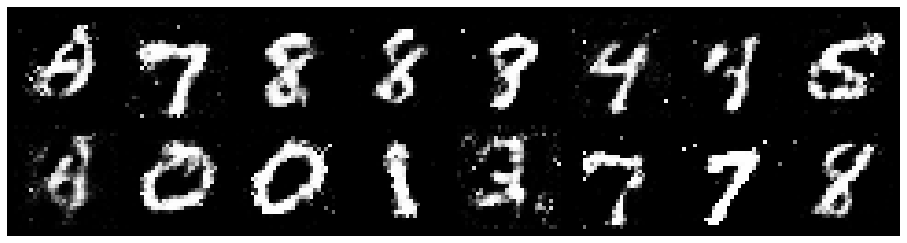

Epoch: [37/100], Batch Num: [0/700]
Discriminator Loss: 1.1774, Generator Loss: 1.2498
D(x): 0.6031, D(G(z)): 0.3968


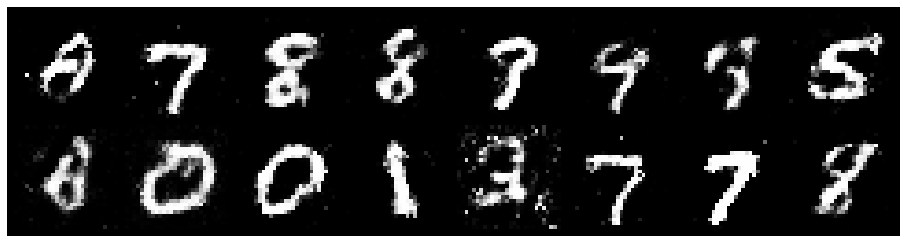

Epoch: [37/100], Batch Num: [100/700]
Discriminator Loss: 1.0345, Generator Loss: 1.3128
D(x): 0.6986, D(G(z)): 0.4024


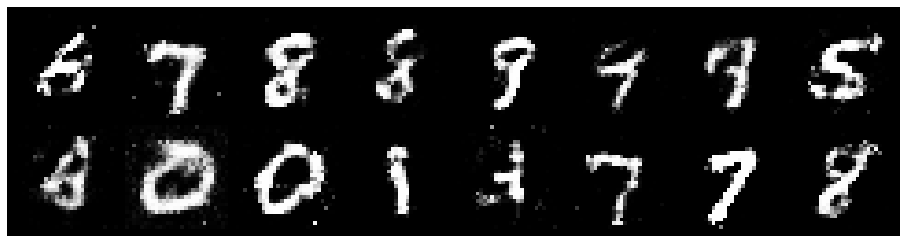

Epoch: [37/100], Batch Num: [200/700]
Discriminator Loss: 1.0511, Generator Loss: 1.3501
D(x): 0.6622, D(G(z)): 0.3778


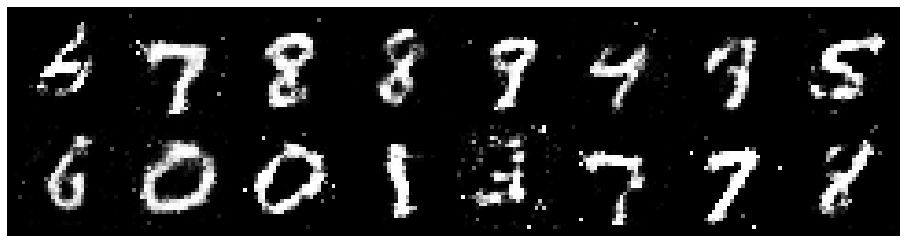

Epoch: [37/100], Batch Num: [300/700]
Discriminator Loss: 1.1614, Generator Loss: 0.8323
D(x): 0.6496, D(G(z)): 0.4340


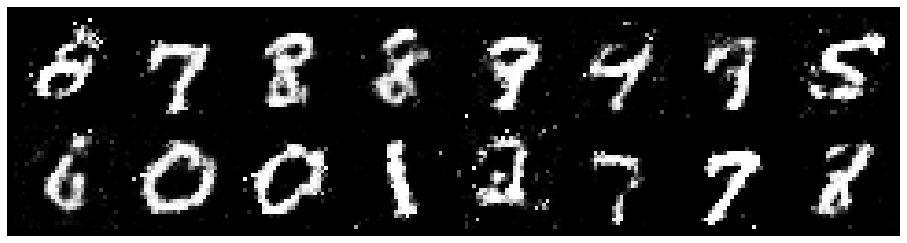

Epoch: [37/100], Batch Num: [400/700]
Discriminator Loss: 1.0308, Generator Loss: 1.5710
D(x): 0.6975, D(G(z)): 0.3944


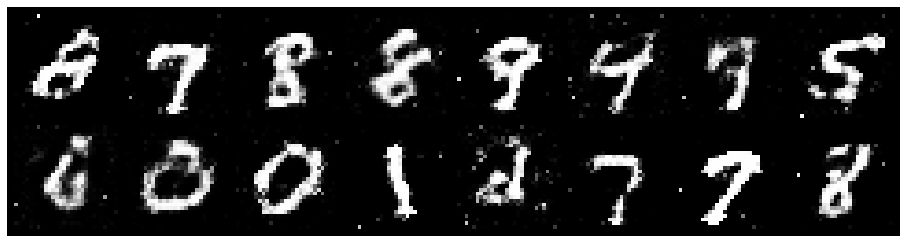

Epoch: [37/100], Batch Num: [500/700]
Discriminator Loss: 1.2449, Generator Loss: 1.1155
D(x): 0.6102, D(G(z)): 0.4126


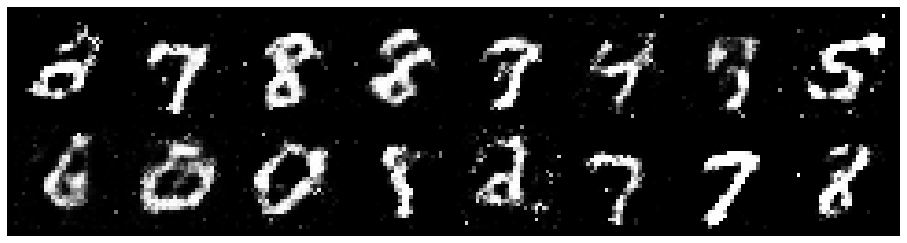

Epoch: [37/100], Batch Num: [600/700]
Discriminator Loss: 1.0891, Generator Loss: 0.9915
D(x): 0.6350, D(G(z)): 0.3982


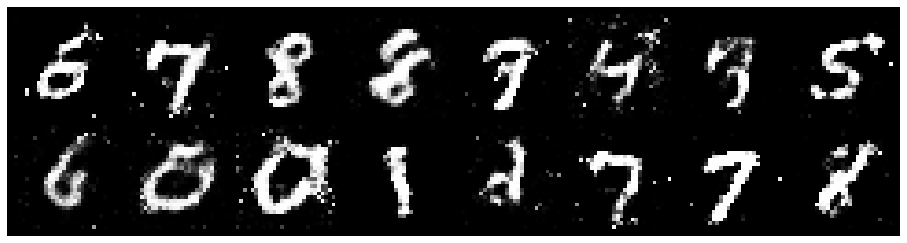

Epoch: [38/100], Batch Num: [0/700]
Discriminator Loss: 1.2267, Generator Loss: 1.1090
D(x): 0.5433, D(G(z)): 0.3832


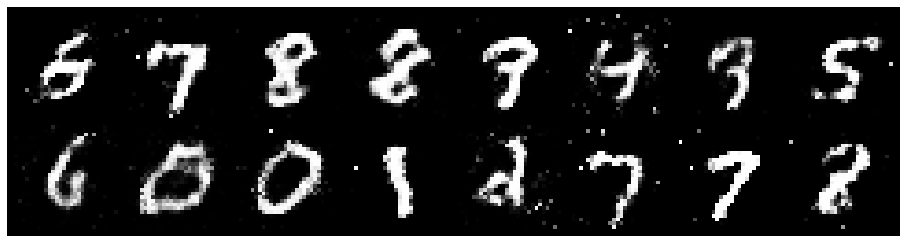

Epoch: [38/100], Batch Num: [100/700]
Discriminator Loss: 1.1206, Generator Loss: 1.5615
D(x): 0.6104, D(G(z)): 0.3543


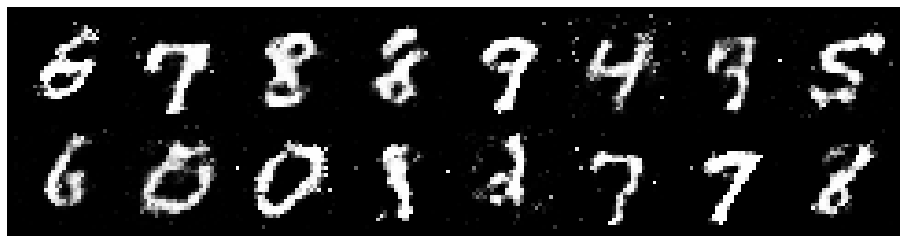

Epoch: [38/100], Batch Num: [200/700]
Discriminator Loss: 1.0000, Generator Loss: 1.1611
D(x): 0.6215, D(G(z)): 0.3175


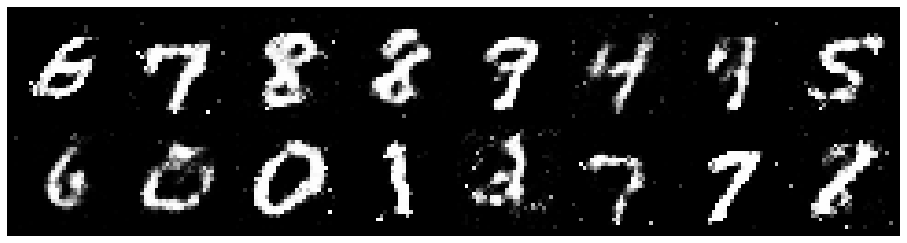

Epoch: [38/100], Batch Num: [300/700]
Discriminator Loss: 1.1037, Generator Loss: 1.1221
D(x): 0.5878, D(G(z)): 0.3496


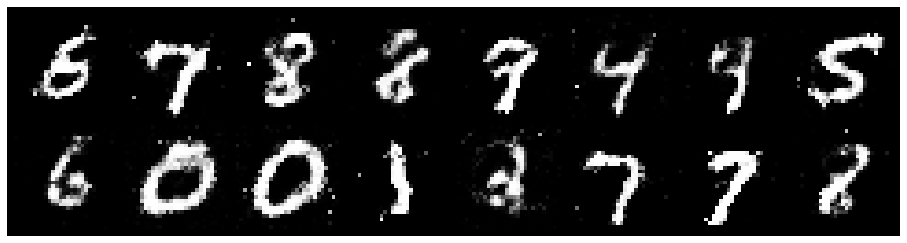

Epoch: [38/100], Batch Num: [400/700]
Discriminator Loss: 1.0225, Generator Loss: 1.0534
D(x): 0.6366, D(G(z)): 0.3673


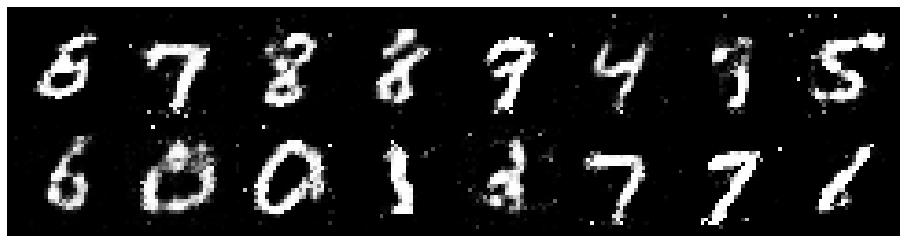

Epoch: [38/100], Batch Num: [500/700]
Discriminator Loss: 1.1761, Generator Loss: 0.8995
D(x): 0.5983, D(G(z)): 0.4294


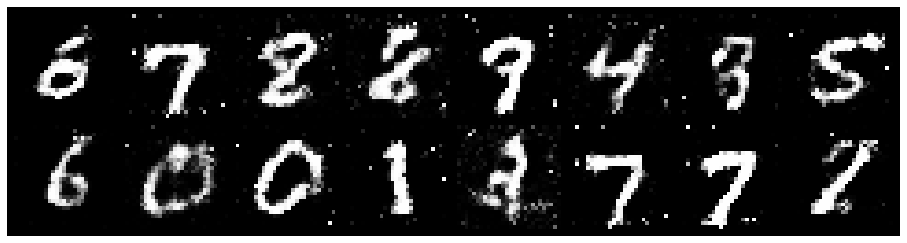

Epoch: [38/100], Batch Num: [600/700]
Discriminator Loss: 1.1207, Generator Loss: 1.3777
D(x): 0.5885, D(G(z)): 0.3511


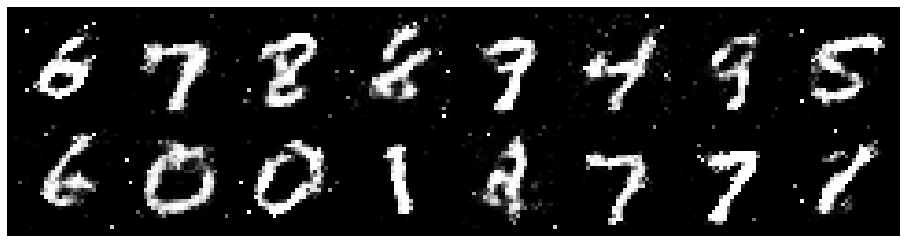

Epoch: [39/100], Batch Num: [0/700]
Discriminator Loss: 1.0990, Generator Loss: 1.1818
D(x): 0.5821, D(G(z)): 0.3365


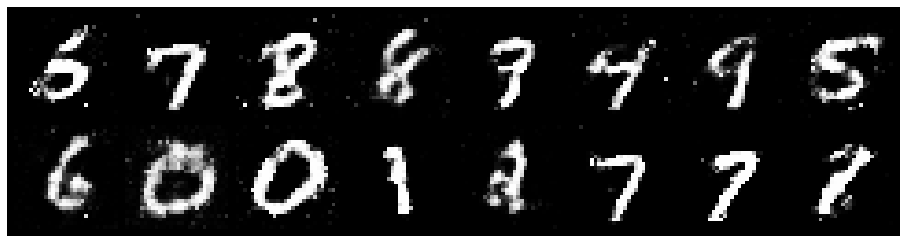

Epoch: [39/100], Batch Num: [100/700]
Discriminator Loss: 1.0235, Generator Loss: 1.2092
D(x): 0.6902, D(G(z)): 0.4033


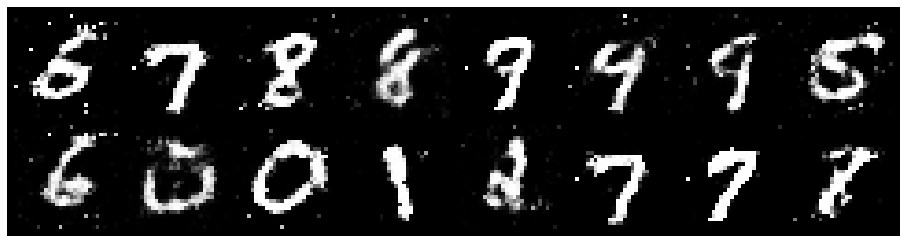

Epoch: [39/100], Batch Num: [200/700]
Discriminator Loss: 1.1873, Generator Loss: 1.0487
D(x): 0.5253, D(G(z)): 0.3265


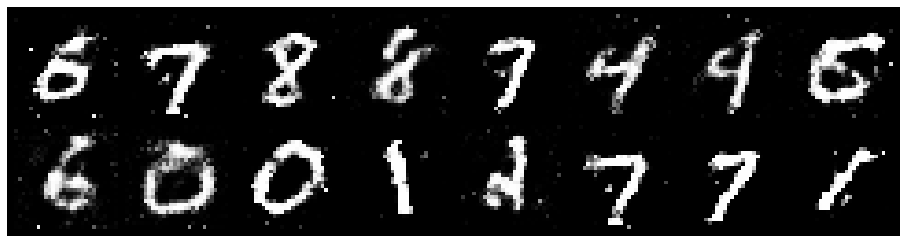

Epoch: [39/100], Batch Num: [300/700]
Discriminator Loss: 1.2561, Generator Loss: 0.9353
D(x): 0.5761, D(G(z)): 0.4429


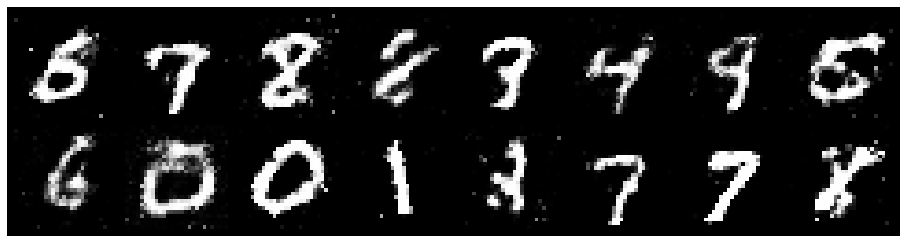

Epoch: [39/100], Batch Num: [400/700]
Discriminator Loss: 1.1239, Generator Loss: 1.0649
D(x): 0.6035, D(G(z)): 0.3930


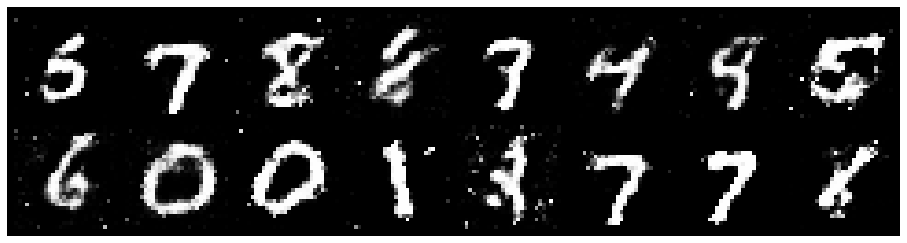

Epoch: [39/100], Batch Num: [500/700]
Discriminator Loss: 1.2188, Generator Loss: 1.0566
D(x): 0.5702, D(G(z)): 0.3896


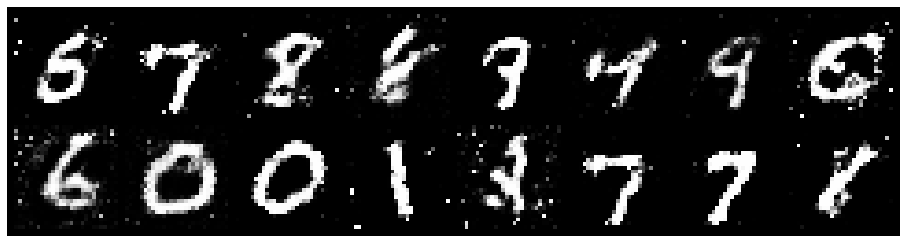

Epoch: [39/100], Batch Num: [600/700]
Discriminator Loss: 1.1725, Generator Loss: 1.1035
D(x): 0.5567, D(G(z)): 0.3448


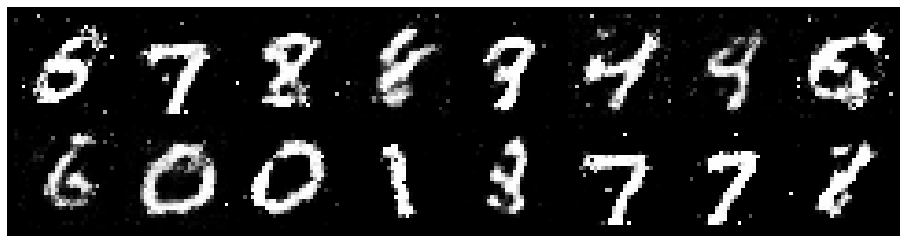

Epoch: [40/100], Batch Num: [0/700]
Discriminator Loss: 0.9896, Generator Loss: 1.0880
D(x): 0.6882, D(G(z)): 0.3977


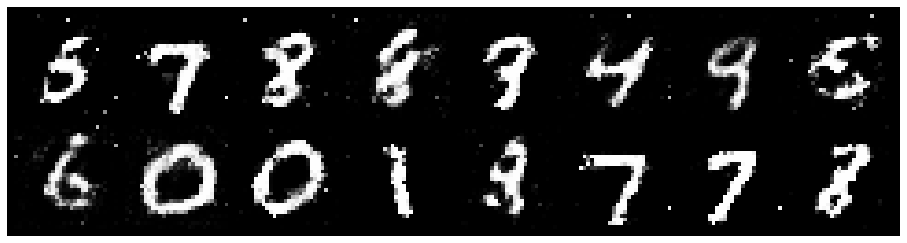

Epoch: [40/100], Batch Num: [100/700]
Discriminator Loss: 1.1221, Generator Loss: 1.1067
D(x): 0.5776, D(G(z)): 0.3764


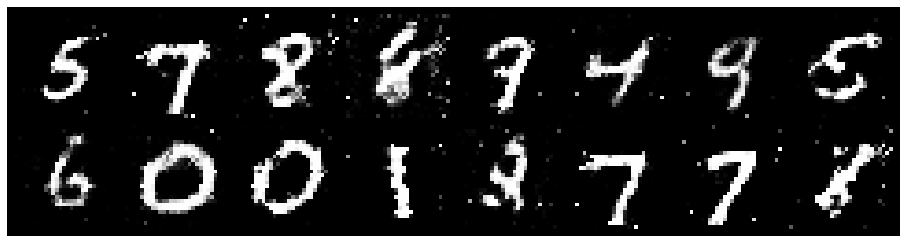

Epoch: [40/100], Batch Num: [200/700]
Discriminator Loss: 1.1895, Generator Loss: 1.0208
D(x): 0.6148, D(G(z)): 0.4244


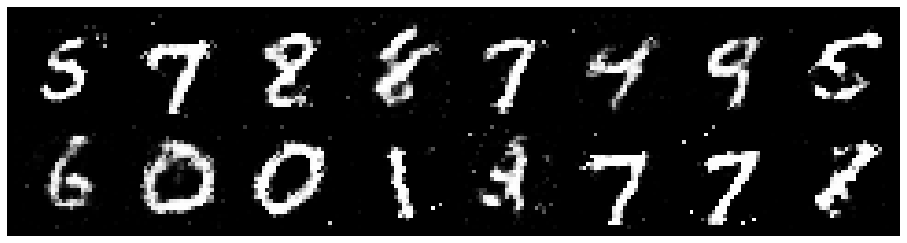

Epoch: [40/100], Batch Num: [300/700]
Discriminator Loss: 1.1694, Generator Loss: 0.9307
D(x): 0.6129, D(G(z)): 0.4152


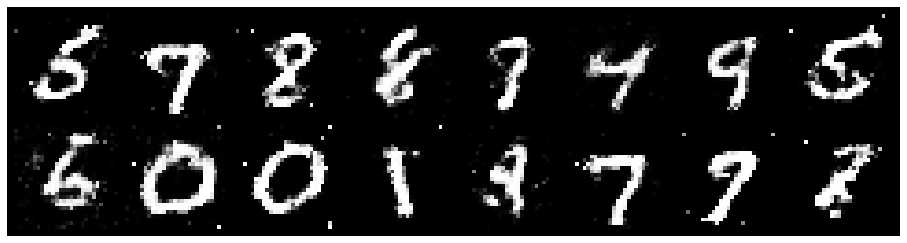

Epoch: [40/100], Batch Num: [400/700]
Discriminator Loss: 1.2499, Generator Loss: 0.9177
D(x): 0.6169, D(G(z)): 0.4332


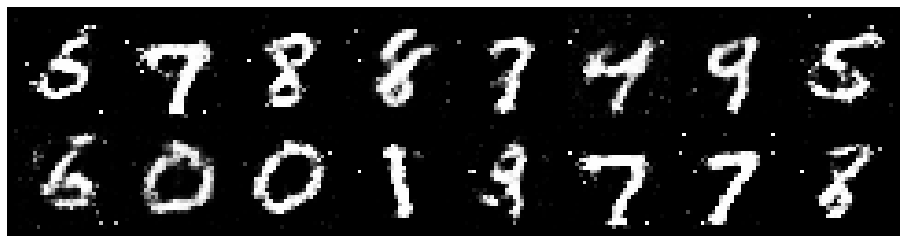

Epoch: [40/100], Batch Num: [500/700]
Discriminator Loss: 1.2017, Generator Loss: 0.9801
D(x): 0.5983, D(G(z)): 0.4008


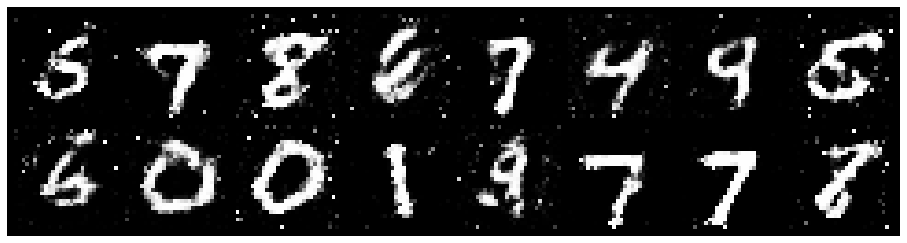

Epoch: [40/100], Batch Num: [600/700]
Discriminator Loss: 1.0380, Generator Loss: 1.1167
D(x): 0.5843, D(G(z)): 0.3321


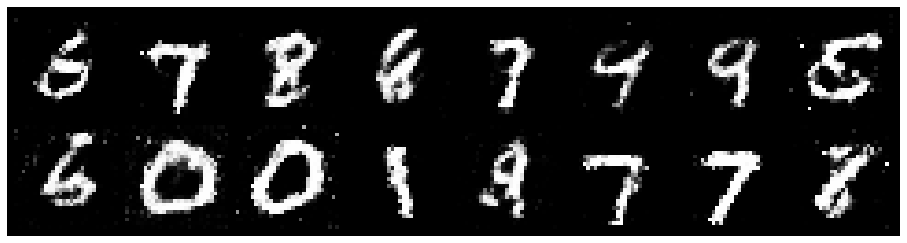

Epoch: [41/100], Batch Num: [0/700]
Discriminator Loss: 0.9488, Generator Loss: 1.3846
D(x): 0.7094, D(G(z)): 0.3628


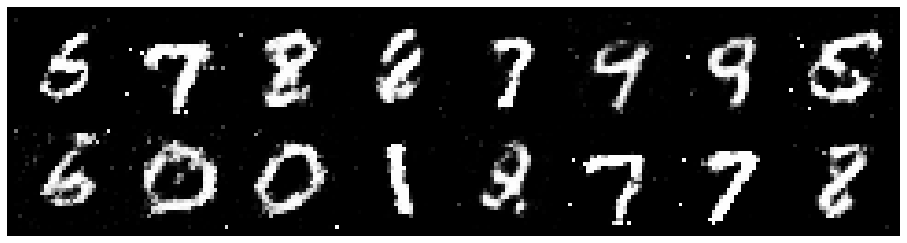

Epoch: [41/100], Batch Num: [100/700]
Discriminator Loss: 1.1136, Generator Loss: 1.1693
D(x): 0.5957, D(G(z)): 0.3552


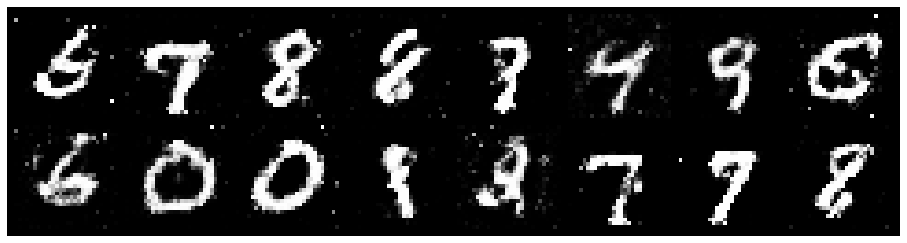

Epoch: [41/100], Batch Num: [200/700]
Discriminator Loss: 1.2657, Generator Loss: 0.9693
D(x): 0.5712, D(G(z)): 0.4160


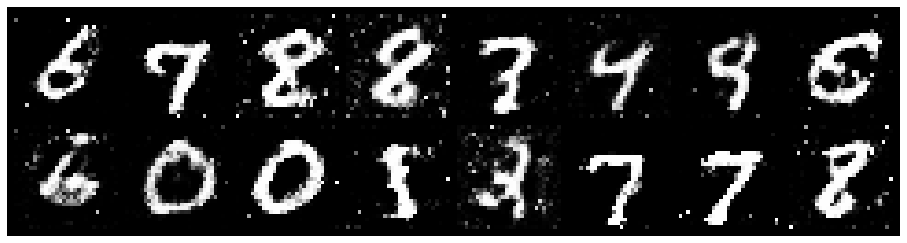

Epoch: [41/100], Batch Num: [300/700]
Discriminator Loss: 1.2153, Generator Loss: 1.2302
D(x): 0.5736, D(G(z)): 0.4085


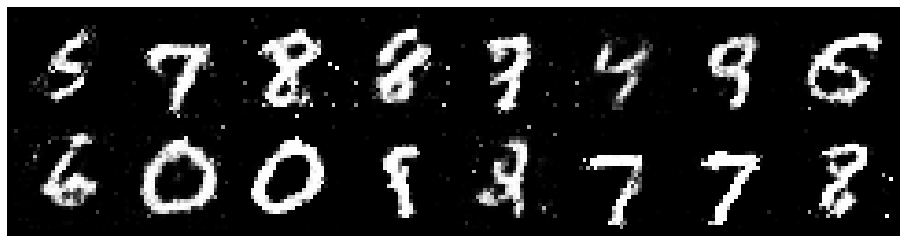

Epoch: [41/100], Batch Num: [400/700]
Discriminator Loss: 1.1964, Generator Loss: 1.0836
D(x): 0.5815, D(G(z)): 0.3988


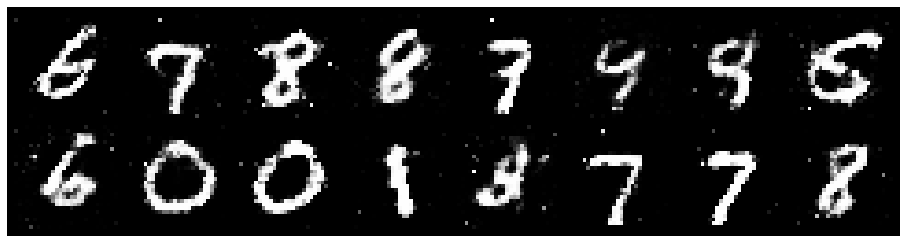

Epoch: [41/100], Batch Num: [500/700]
Discriminator Loss: 1.1389, Generator Loss: 1.1535
D(x): 0.6181, D(G(z)): 0.3873


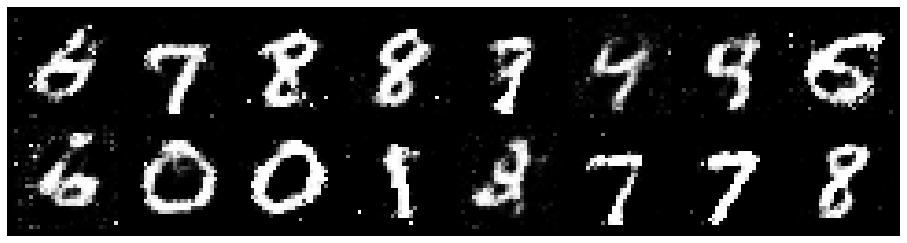

Epoch: [41/100], Batch Num: [600/700]
Discriminator Loss: 1.1998, Generator Loss: 1.3695
D(x): 0.5565, D(G(z)): 0.3451


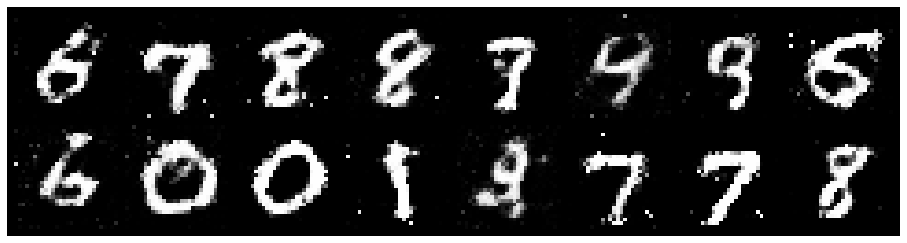

Epoch: [42/100], Batch Num: [0/700]
Discriminator Loss: 1.1862, Generator Loss: 1.0255
D(x): 0.6091, D(G(z)): 0.4332


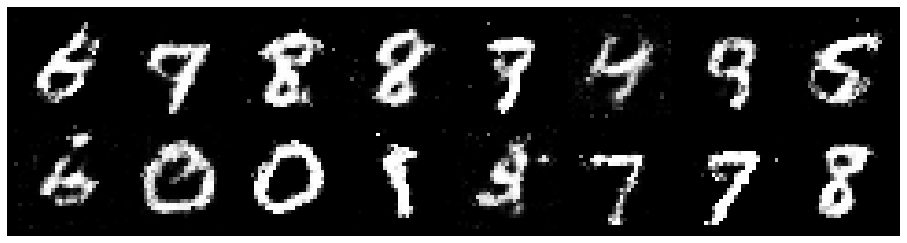

Epoch: [42/100], Batch Num: [100/700]
Discriminator Loss: 1.1902, Generator Loss: 1.2261
D(x): 0.5608, D(G(z)): 0.3692


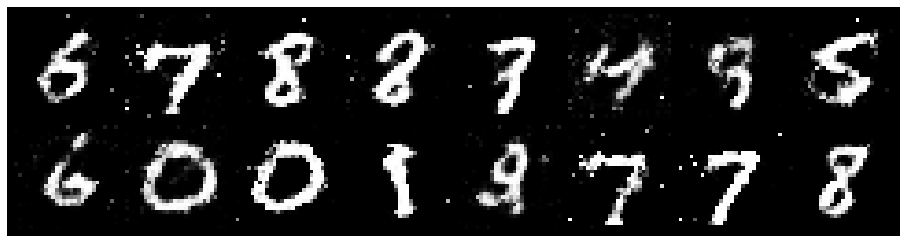

Epoch: [42/100], Batch Num: [200/700]
Discriminator Loss: 1.1638, Generator Loss: 1.1963
D(x): 0.5534, D(G(z)): 0.3525


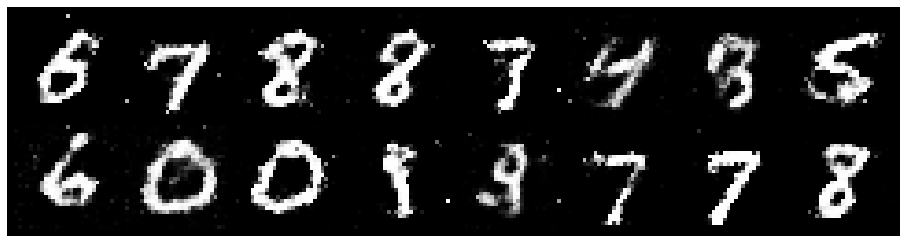

Epoch: [42/100], Batch Num: [300/700]
Discriminator Loss: 1.1791, Generator Loss: 0.9517
D(x): 0.6430, D(G(z)): 0.4595


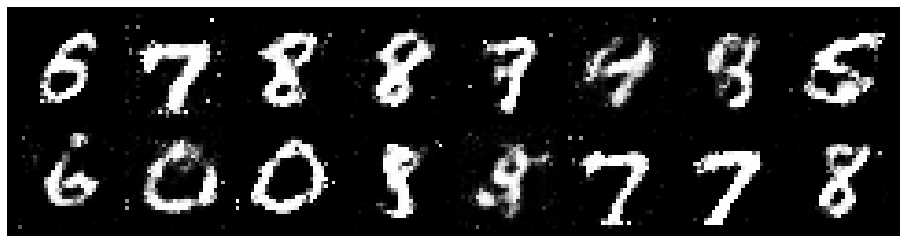

Epoch: [42/100], Batch Num: [400/700]
Discriminator Loss: 1.1156, Generator Loss: 1.0586
D(x): 0.6249, D(G(z)): 0.3969


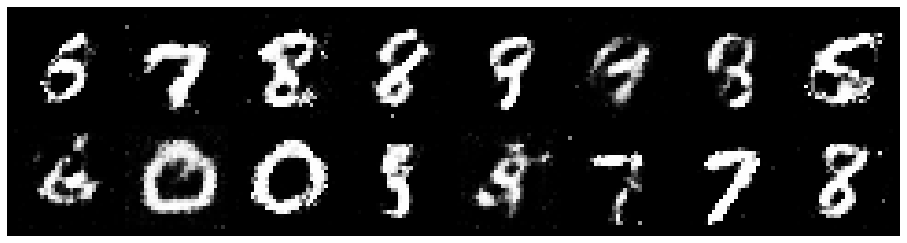

Epoch: [42/100], Batch Num: [500/700]
Discriminator Loss: 1.1703, Generator Loss: 1.1108
D(x): 0.6209, D(G(z)): 0.4203


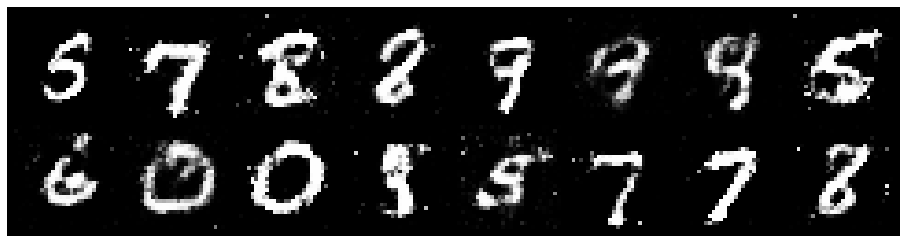

Epoch: [42/100], Batch Num: [600/700]
Discriminator Loss: 1.2228, Generator Loss: 1.0371
D(x): 0.5940, D(G(z)): 0.4329


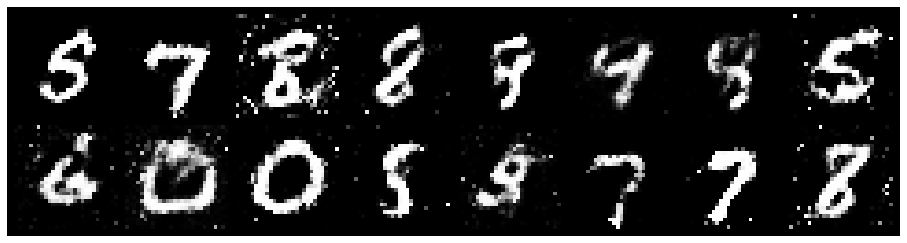

Epoch: [43/100], Batch Num: [0/700]
Discriminator Loss: 1.2357, Generator Loss: 0.9480
D(x): 0.5531, D(G(z)): 0.4038


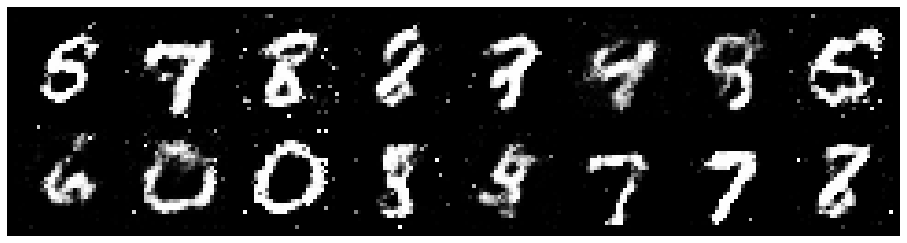

Epoch: [43/100], Batch Num: [100/700]
Discriminator Loss: 1.0597, Generator Loss: 1.1743
D(x): 0.6034, D(G(z)): 0.3269


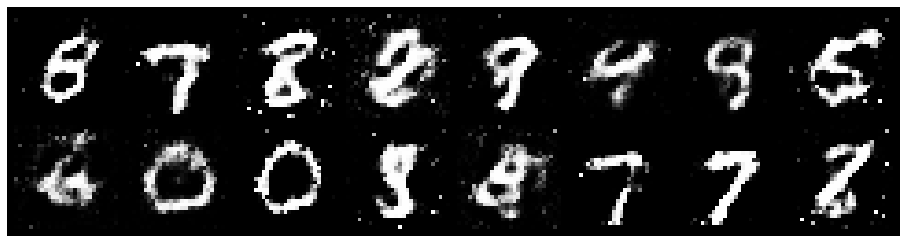

Epoch: [43/100], Batch Num: [200/700]
Discriminator Loss: 1.1635, Generator Loss: 0.9829
D(x): 0.6367, D(G(z)): 0.4179


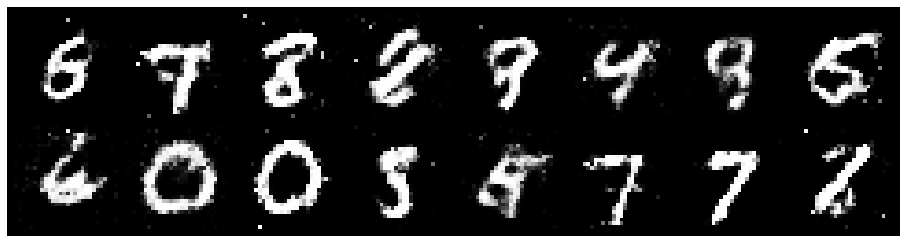

Epoch: [43/100], Batch Num: [300/700]
Discriminator Loss: 1.1654, Generator Loss: 1.2530
D(x): 0.5842, D(G(z)): 0.3600


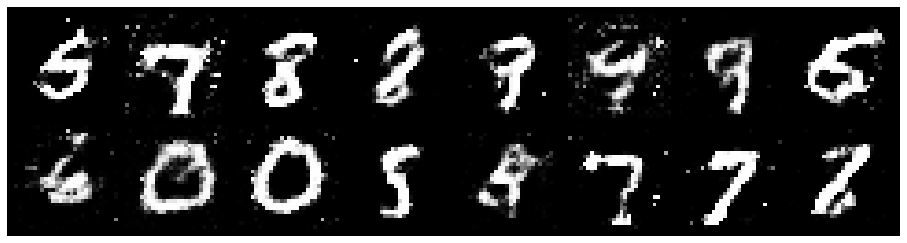

Epoch: [43/100], Batch Num: [400/700]
Discriminator Loss: 1.1839, Generator Loss: 0.9960
D(x): 0.6367, D(G(z)): 0.4286


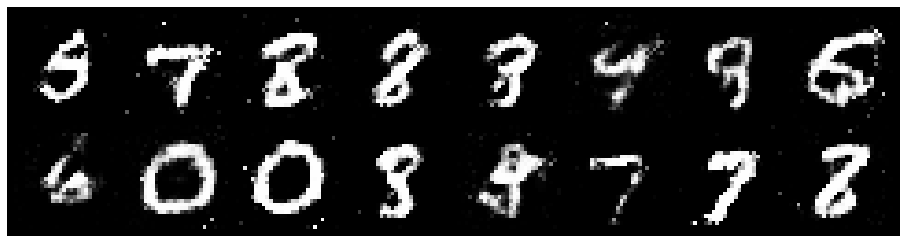

Epoch: [43/100], Batch Num: [500/700]
Discriminator Loss: 1.2824, Generator Loss: 0.8085
D(x): 0.5661, D(G(z)): 0.4454


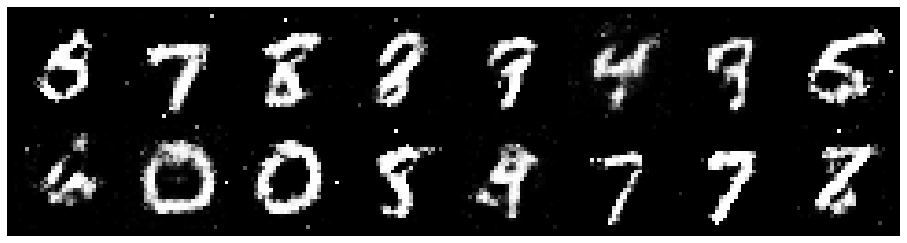

Epoch: [43/100], Batch Num: [600/700]
Discriminator Loss: 1.3343, Generator Loss: 1.1325
D(x): 0.5115, D(G(z)): 0.3767


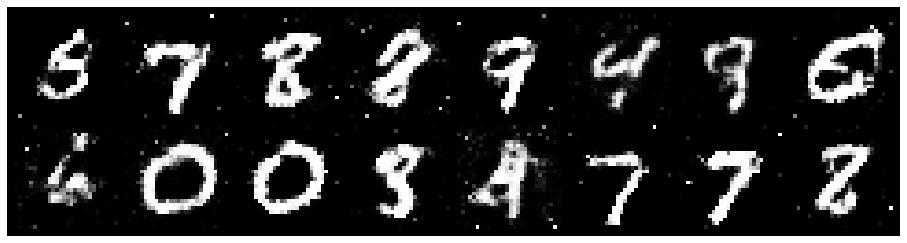

Epoch: [44/100], Batch Num: [0/700]
Discriminator Loss: 1.2480, Generator Loss: 1.0523
D(x): 0.6333, D(G(z)): 0.4544


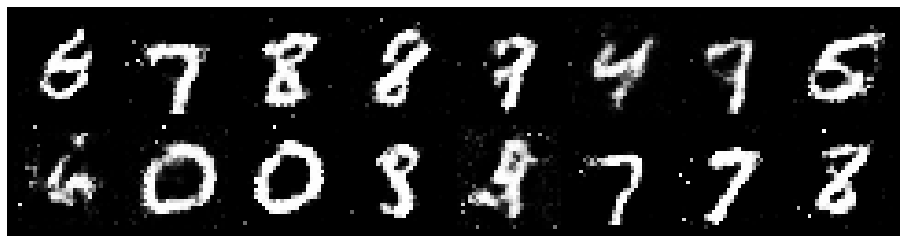

Epoch: [44/100], Batch Num: [100/700]
Discriminator Loss: 1.1804, Generator Loss: 0.8108
D(x): 0.6292, D(G(z)): 0.4457


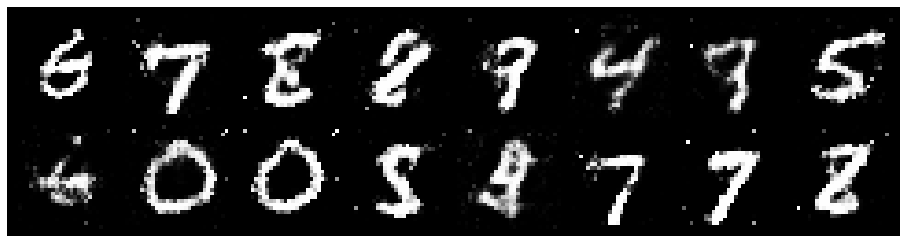

Epoch: [44/100], Batch Num: [200/700]
Discriminator Loss: 1.0032, Generator Loss: 1.2231
D(x): 0.6163, D(G(z)): 0.3413


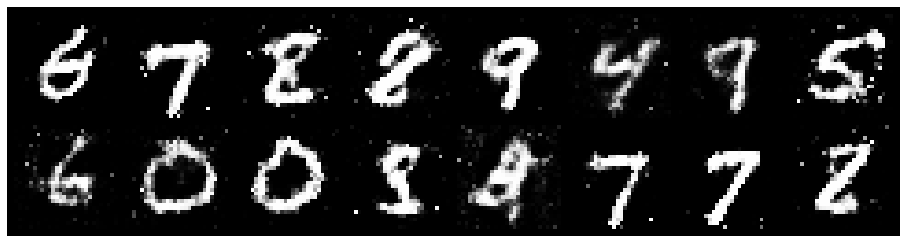

Epoch: [44/100], Batch Num: [300/700]
Discriminator Loss: 1.2023, Generator Loss: 1.0860
D(x): 0.5734, D(G(z)): 0.3837


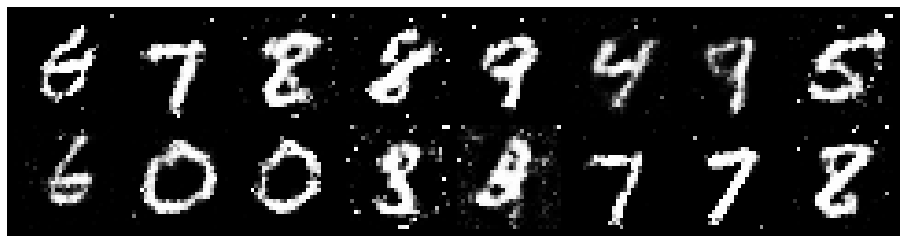

Epoch: [44/100], Batch Num: [400/700]
Discriminator Loss: 1.2217, Generator Loss: 0.8879
D(x): 0.5798, D(G(z)): 0.4335


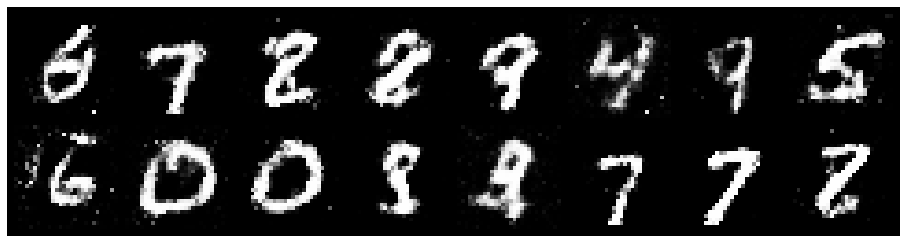

Epoch: [44/100], Batch Num: [500/700]
Discriminator Loss: 1.1776, Generator Loss: 1.1413
D(x): 0.5631, D(G(z)): 0.3515


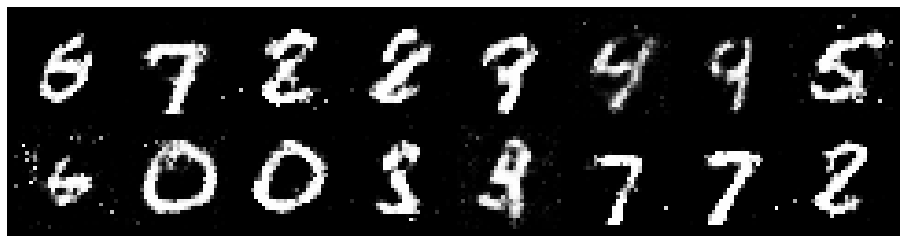

Epoch: [44/100], Batch Num: [600/700]
Discriminator Loss: 1.1153, Generator Loss: 1.1898
D(x): 0.5601, D(G(z)): 0.3535


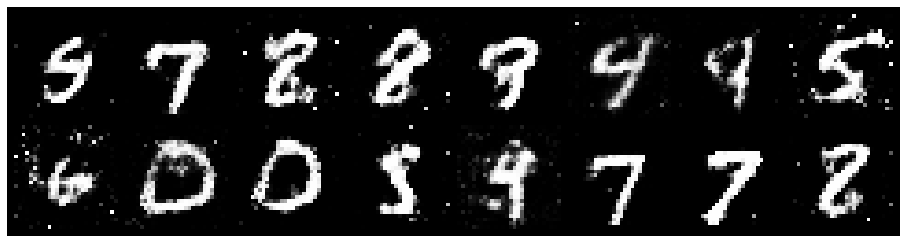

Epoch: [45/100], Batch Num: [0/700]
Discriminator Loss: 1.1425, Generator Loss: 0.9083
D(x): 0.5887, D(G(z)): 0.4001


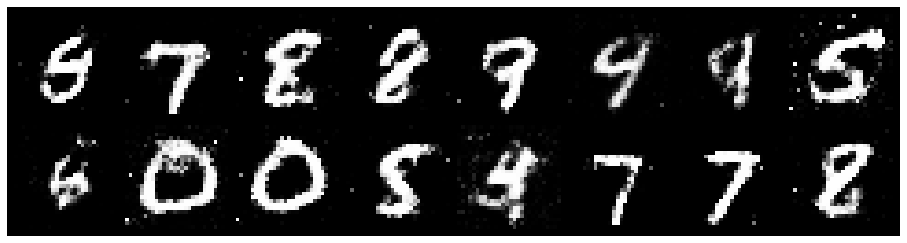

Epoch: [45/100], Batch Num: [100/700]
Discriminator Loss: 1.0147, Generator Loss: 0.9989
D(x): 0.6676, D(G(z)): 0.3864


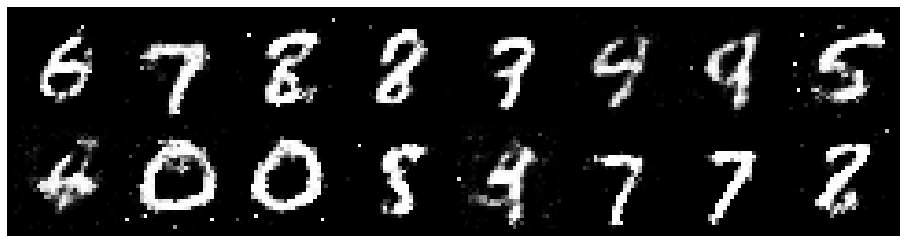

Epoch: [45/100], Batch Num: [200/700]
Discriminator Loss: 1.2049, Generator Loss: 0.9342
D(x): 0.5850, D(G(z)): 0.4422


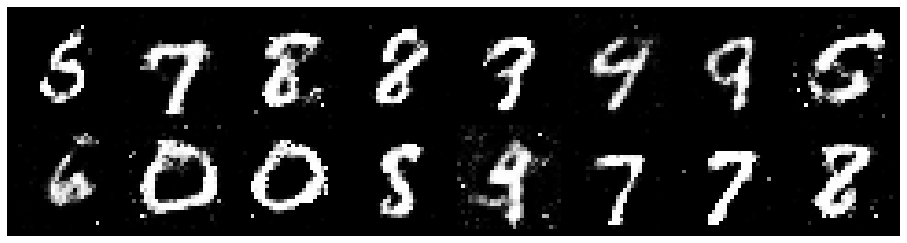

Epoch: [45/100], Batch Num: [300/700]
Discriminator Loss: 1.1673, Generator Loss: 1.1165
D(x): 0.5870, D(G(z)): 0.4102


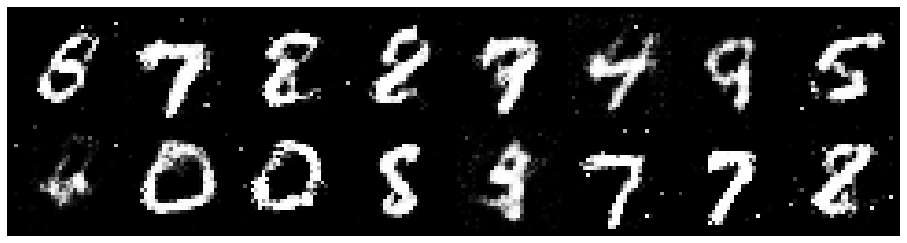

Epoch: [45/100], Batch Num: [400/700]
Discriminator Loss: 0.9987, Generator Loss: 1.0462
D(x): 0.6131, D(G(z)): 0.3342


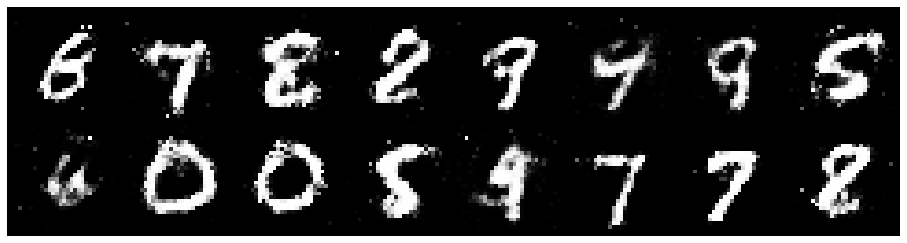

Epoch: [45/100], Batch Num: [500/700]
Discriminator Loss: 1.0655, Generator Loss: 1.0592
D(x): 0.6435, D(G(z)): 0.3886


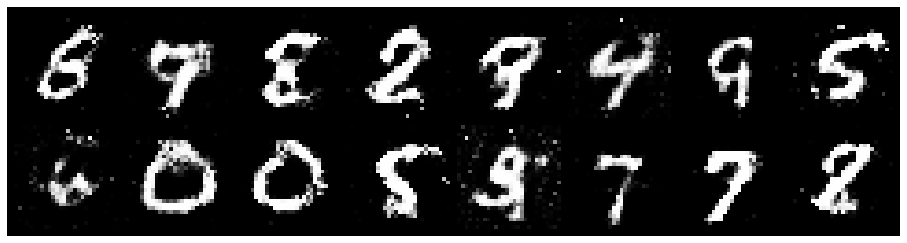

Epoch: [45/100], Batch Num: [600/700]
Discriminator Loss: 1.0127, Generator Loss: 1.0850
D(x): 0.6518, D(G(z)): 0.3776


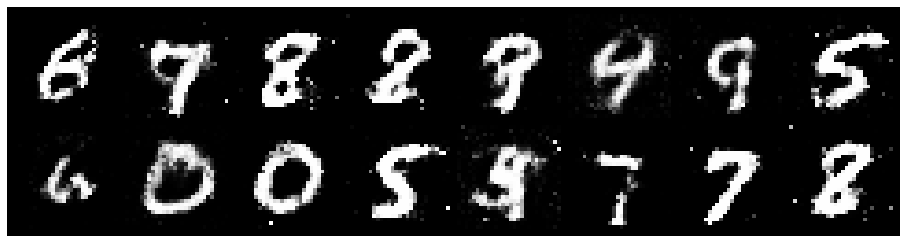

Epoch: [46/100], Batch Num: [0/700]
Discriminator Loss: 1.2648, Generator Loss: 0.7861
D(x): 0.6083, D(G(z)): 0.4921


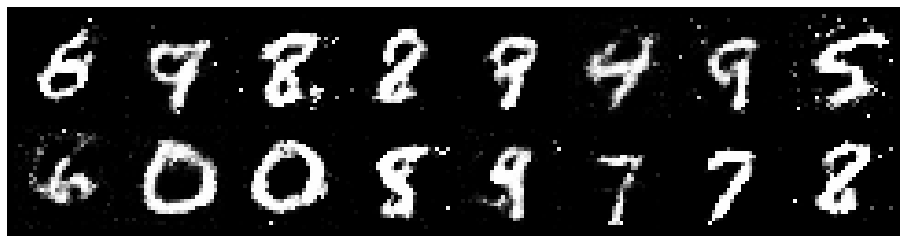

Epoch: [46/100], Batch Num: [100/700]
Discriminator Loss: 1.3153, Generator Loss: 0.9229
D(x): 0.5774, D(G(z)): 0.4806


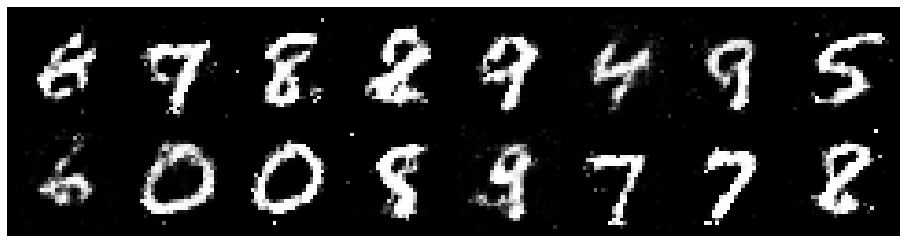

Epoch: [46/100], Batch Num: [200/700]
Discriminator Loss: 1.0622, Generator Loss: 1.0744
D(x): 0.6201, D(G(z)): 0.3791


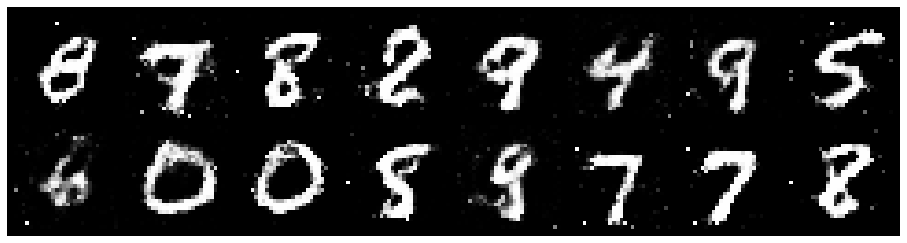

Epoch: [46/100], Batch Num: [300/700]
Discriminator Loss: 1.2274, Generator Loss: 1.0939
D(x): 0.5854, D(G(z)): 0.4190


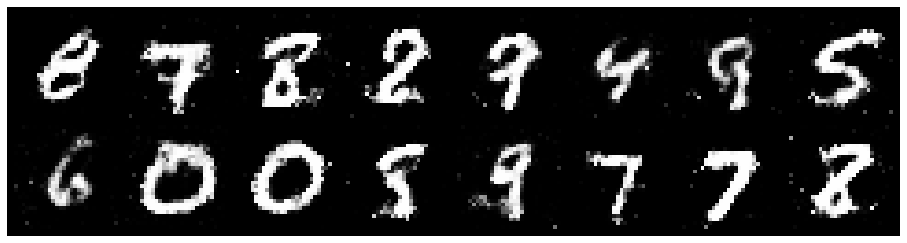

Epoch: [46/100], Batch Num: [400/700]
Discriminator Loss: 1.1501, Generator Loss: 0.9948
D(x): 0.5833, D(G(z)): 0.3724


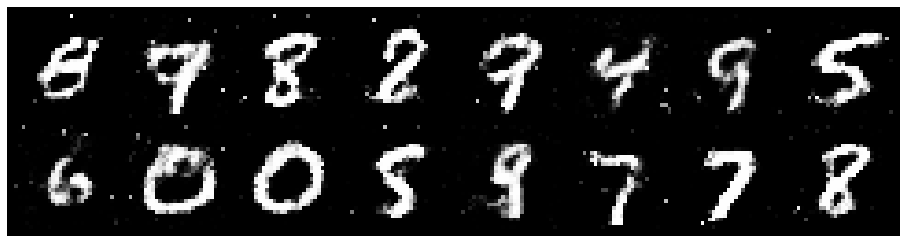

Epoch: [46/100], Batch Num: [500/700]
Discriminator Loss: 1.2646, Generator Loss: 1.2032
D(x): 0.6120, D(G(z)): 0.4456


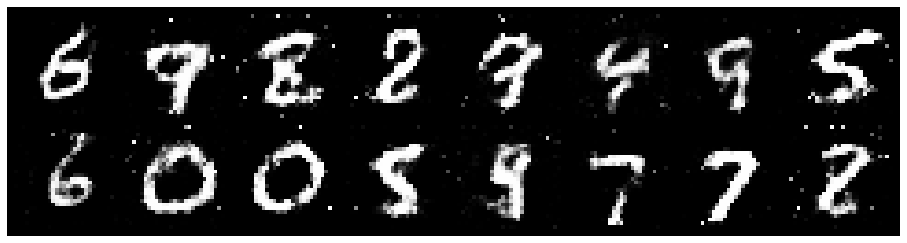

Epoch: [46/100], Batch Num: [600/700]
Discriminator Loss: 1.2177, Generator Loss: 0.9698
D(x): 0.5992, D(G(z)): 0.4228


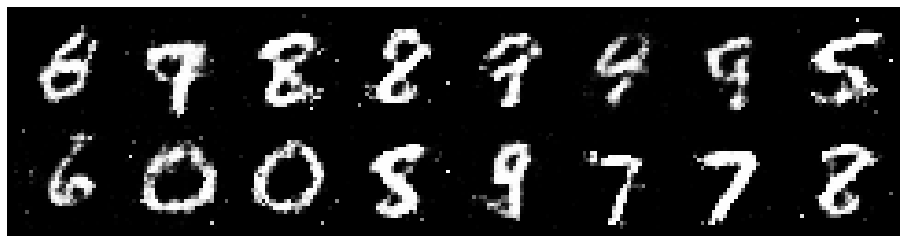

Epoch: [47/100], Batch Num: [0/700]
Discriminator Loss: 1.1266, Generator Loss: 0.9342
D(x): 0.6209, D(G(z)): 0.3966


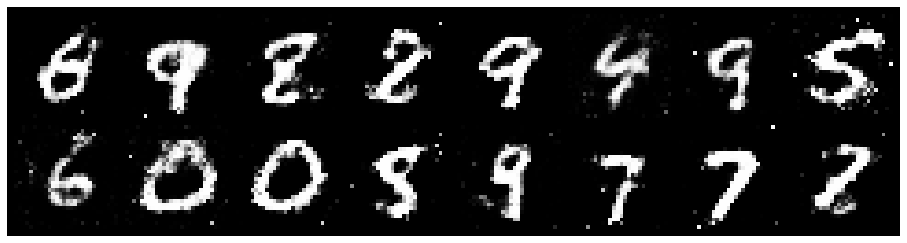

Epoch: [47/100], Batch Num: [100/700]
Discriminator Loss: 1.2667, Generator Loss: 0.8356
D(x): 0.6101, D(G(z)): 0.4733


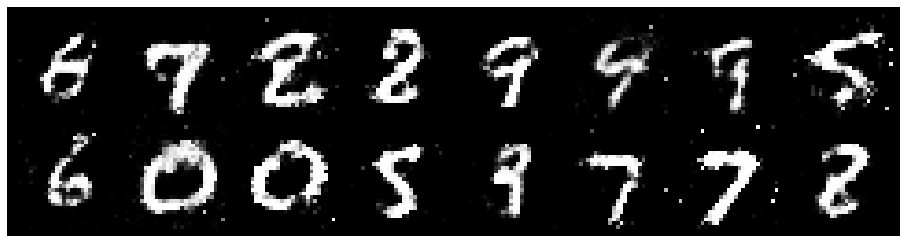

Epoch: [47/100], Batch Num: [200/700]
Discriminator Loss: 1.1638, Generator Loss: 1.0593
D(x): 0.6603, D(G(z)): 0.4606


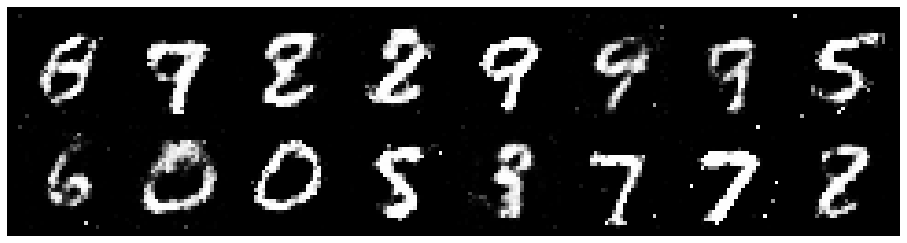

Epoch: [47/100], Batch Num: [300/700]
Discriminator Loss: 1.2251, Generator Loss: 1.0385
D(x): 0.5692, D(G(z)): 0.4148


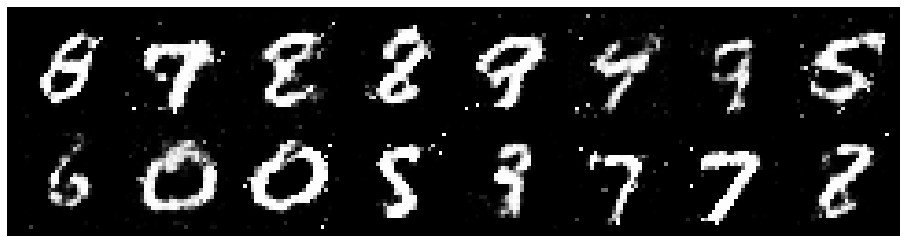

Epoch: [47/100], Batch Num: [400/700]
Discriminator Loss: 1.1907, Generator Loss: 1.1947
D(x): 0.5423, D(G(z)): 0.3441


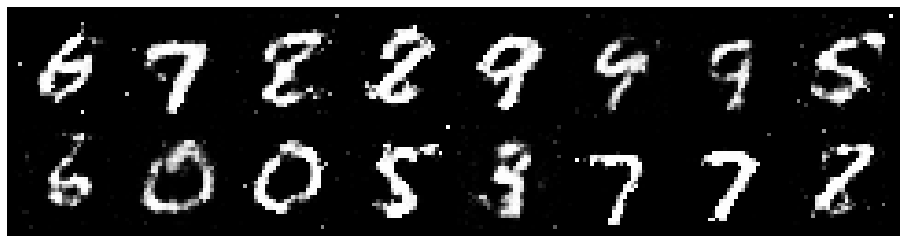

Epoch: [47/100], Batch Num: [500/700]
Discriminator Loss: 1.2261, Generator Loss: 1.0134
D(x): 0.5875, D(G(z)): 0.4140


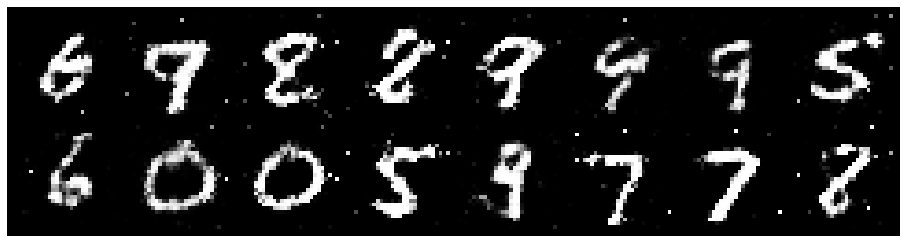

Epoch: [47/100], Batch Num: [600/700]
Discriminator Loss: 1.3331, Generator Loss: 0.9899
D(x): 0.5884, D(G(z)): 0.4728


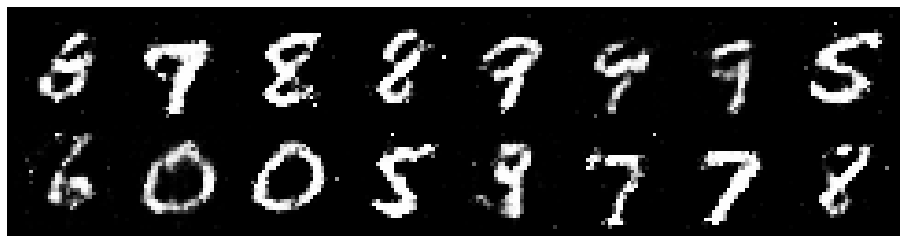

Epoch: [48/100], Batch Num: [0/700]
Discriminator Loss: 1.0795, Generator Loss: 1.0064
D(x): 0.5924, D(G(z)): 0.3639


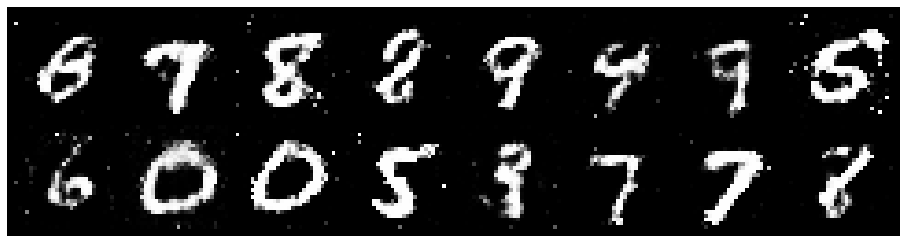

Epoch: [48/100], Batch Num: [100/700]
Discriminator Loss: 1.0733, Generator Loss: 1.0937
D(x): 0.6086, D(G(z)): 0.3631


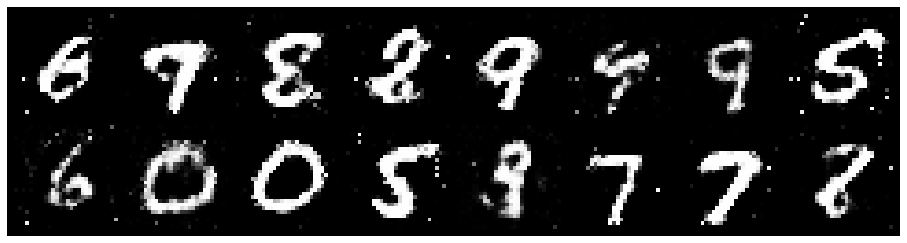

Epoch: [48/100], Batch Num: [200/700]
Discriminator Loss: 1.1191, Generator Loss: 1.0666
D(x): 0.5473, D(G(z)): 0.3467


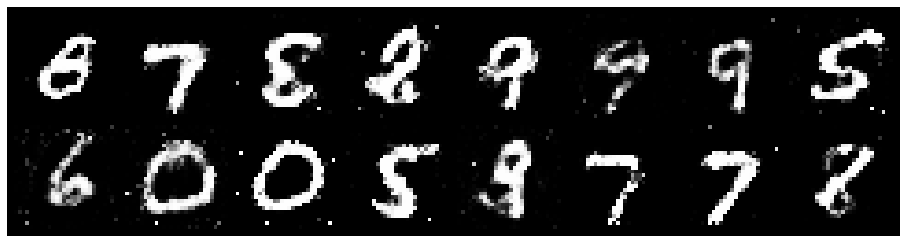

Epoch: [48/100], Batch Num: [300/700]
Discriminator Loss: 1.2166, Generator Loss: 1.1229
D(x): 0.5760, D(G(z)): 0.4134


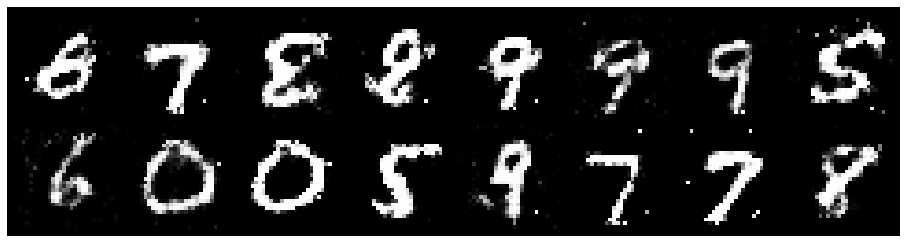

Epoch: [48/100], Batch Num: [400/700]
Discriminator Loss: 1.1642, Generator Loss: 1.0270
D(x): 0.5654, D(G(z)): 0.3998


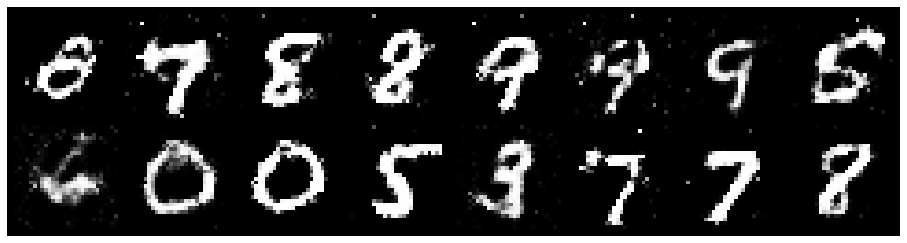

Epoch: [48/100], Batch Num: [500/700]
Discriminator Loss: 1.3534, Generator Loss: 0.8886
D(x): 0.5647, D(G(z)): 0.4641


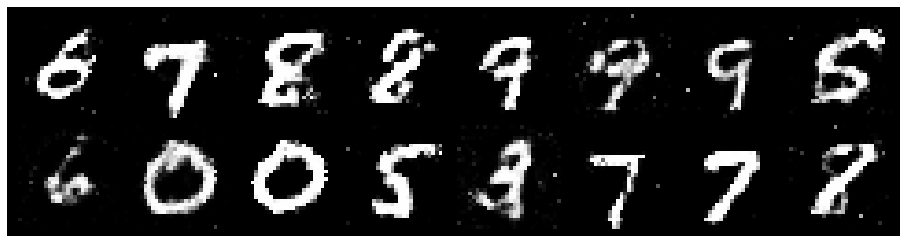

Epoch: [48/100], Batch Num: [600/700]
Discriminator Loss: 1.2719, Generator Loss: 1.0282
D(x): 0.6046, D(G(z)): 0.4355


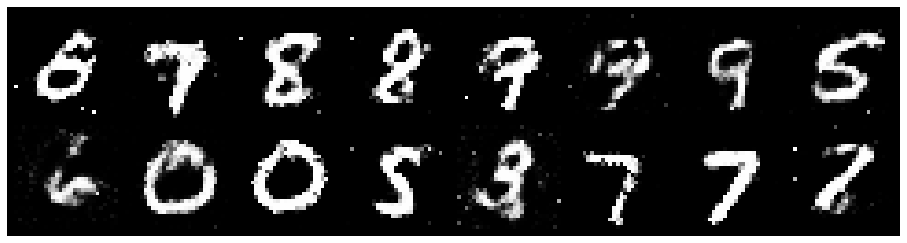

Epoch: [49/100], Batch Num: [0/700]
Discriminator Loss: 1.0755, Generator Loss: 1.1849
D(x): 0.5692, D(G(z)): 0.3284


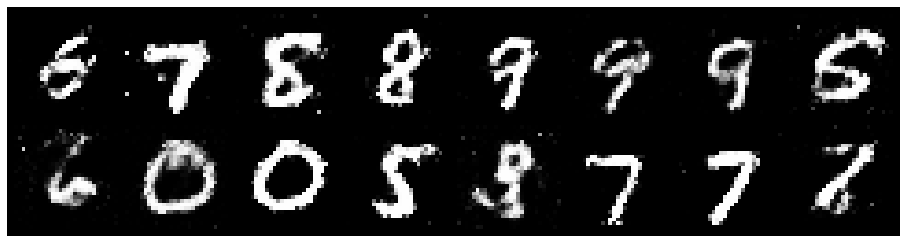

Epoch: [49/100], Batch Num: [100/700]
Discriminator Loss: 1.1342, Generator Loss: 0.9503
D(x): 0.5922, D(G(z)): 0.4123


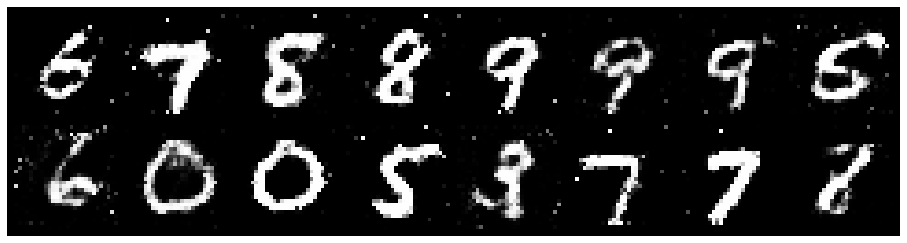

Epoch: [49/100], Batch Num: [200/700]
Discriminator Loss: 1.1950, Generator Loss: 1.0358
D(x): 0.5708, D(G(z)): 0.3770


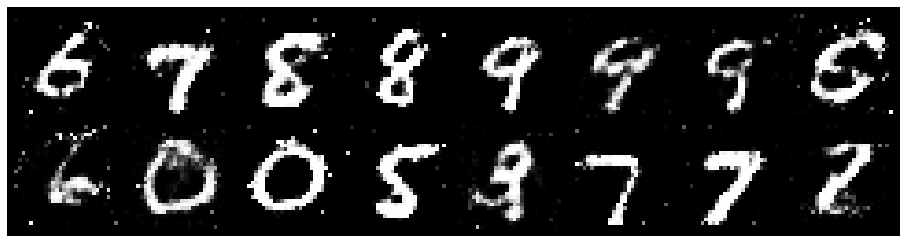

Epoch: [49/100], Batch Num: [300/700]
Discriminator Loss: 1.3628, Generator Loss: 1.0081
D(x): 0.5093, D(G(z)): 0.4047


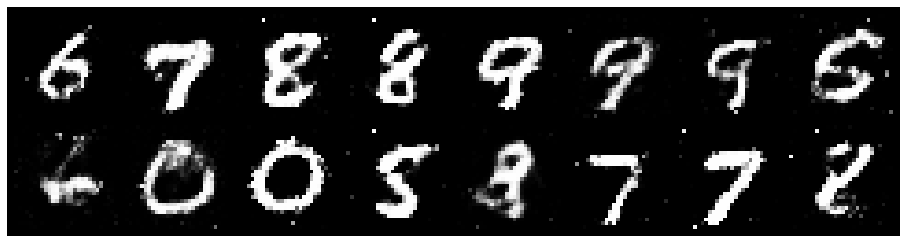

Epoch: [49/100], Batch Num: [400/700]
Discriminator Loss: 1.1804, Generator Loss: 0.9081
D(x): 0.6334, D(G(z)): 0.4472


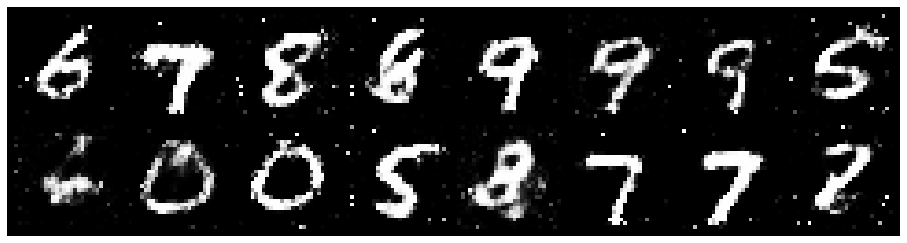

Epoch: [49/100], Batch Num: [500/700]
Discriminator Loss: 1.1230, Generator Loss: 1.1176
D(x): 0.5832, D(G(z)): 0.3735


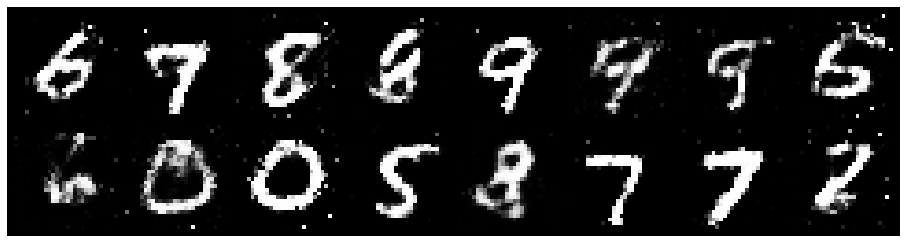

Epoch: [49/100], Batch Num: [600/700]
Discriminator Loss: 1.1881, Generator Loss: 1.2806
D(x): 0.5658, D(G(z)): 0.3733


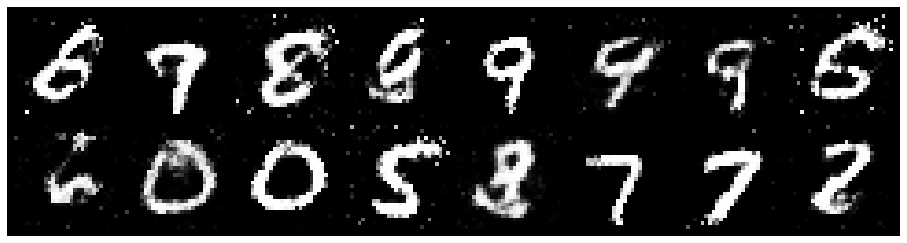

Epoch: [50/100], Batch Num: [0/700]
Discriminator Loss: 1.2409, Generator Loss: 0.7804
D(x): 0.5885, D(G(z)): 0.4609


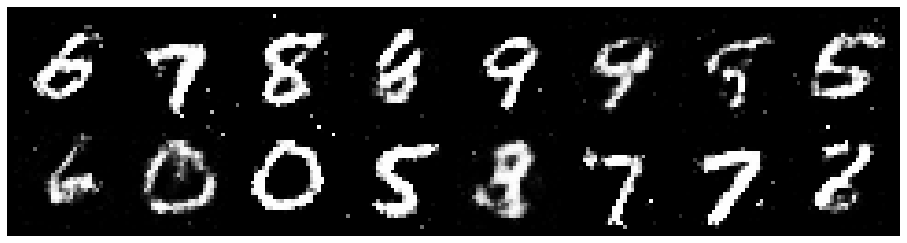

Epoch: [50/100], Batch Num: [100/700]
Discriminator Loss: 1.3200, Generator Loss: 0.8461
D(x): 0.5429, D(G(z)): 0.4477


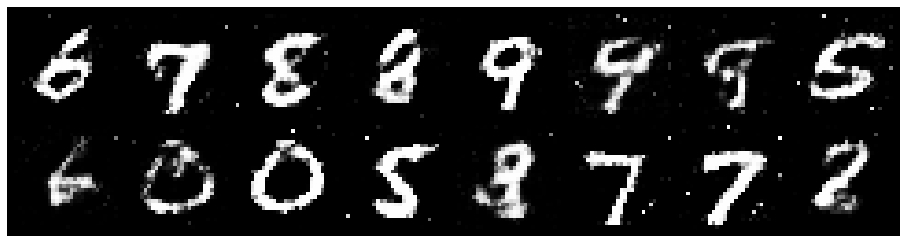

Epoch: [50/100], Batch Num: [200/700]
Discriminator Loss: 1.1771, Generator Loss: 0.9898
D(x): 0.6165, D(G(z)): 0.4301


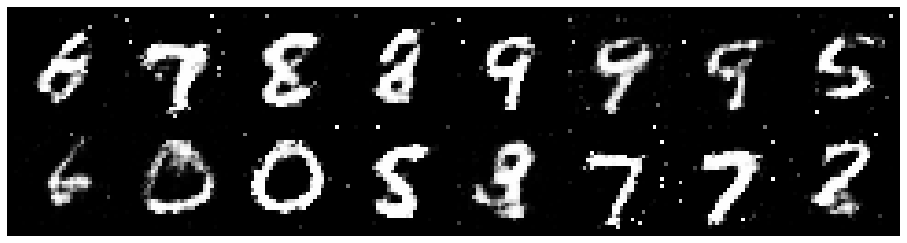

Epoch: [50/100], Batch Num: [300/700]
Discriminator Loss: 1.3246, Generator Loss: 1.1369
D(x): 0.5213, D(G(z)): 0.4045


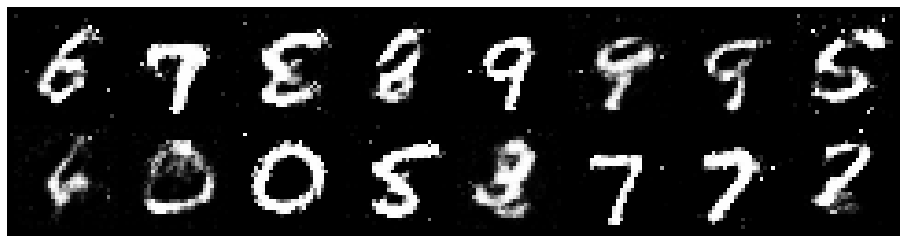

Epoch: [50/100], Batch Num: [400/700]
Discriminator Loss: 1.2168, Generator Loss: 1.0472
D(x): 0.6257, D(G(z)): 0.4496


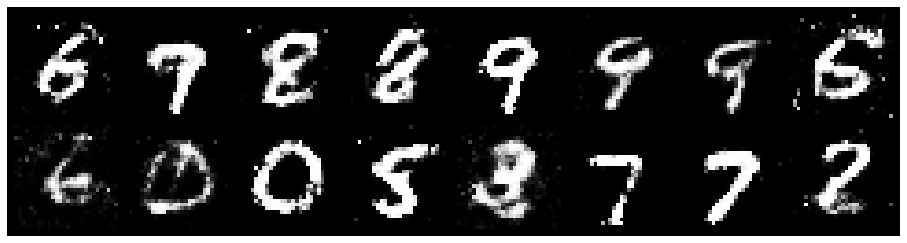

Epoch: [50/100], Batch Num: [500/700]
Discriminator Loss: 1.1503, Generator Loss: 0.8621
D(x): 0.6201, D(G(z)): 0.4297


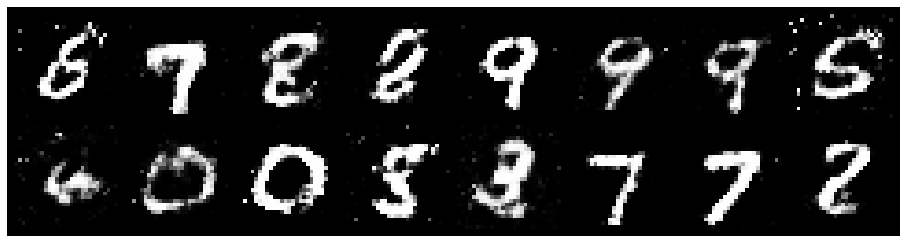

Epoch: [50/100], Batch Num: [600/700]
Discriminator Loss: 1.3417, Generator Loss: 0.9233
D(x): 0.5303, D(G(z)): 0.4589


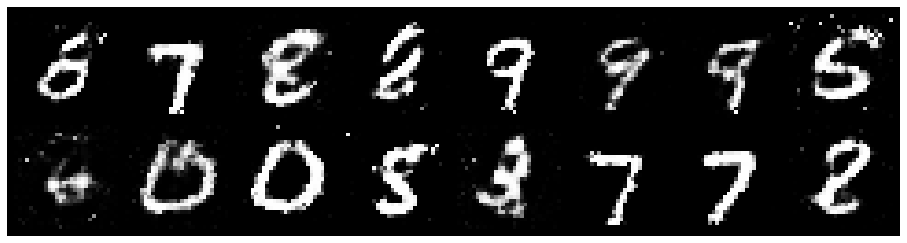

Epoch: [51/100], Batch Num: [0/700]
Discriminator Loss: 1.1698, Generator Loss: 0.9839
D(x): 0.5601, D(G(z)): 0.3819


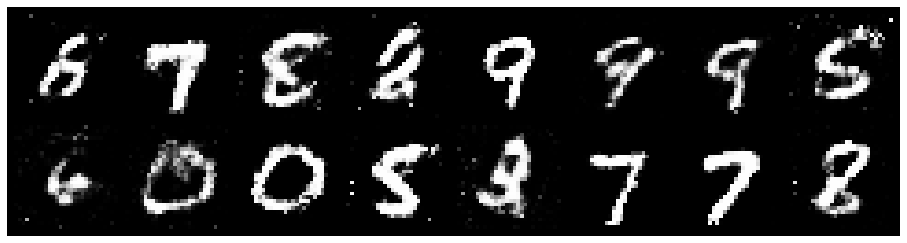

Epoch: [51/100], Batch Num: [100/700]
Discriminator Loss: 1.2018, Generator Loss: 0.9259
D(x): 0.5777, D(G(z)): 0.4072


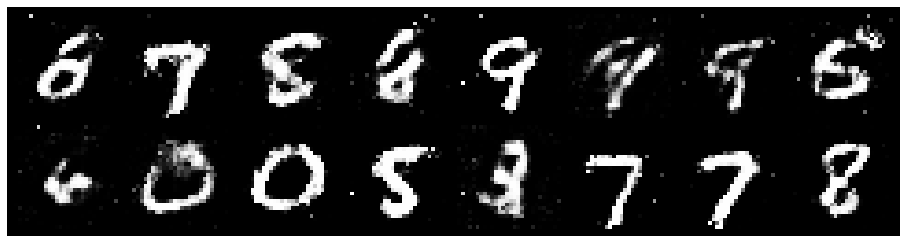

Epoch: [51/100], Batch Num: [200/700]
Discriminator Loss: 1.2300, Generator Loss: 1.1150
D(x): 0.5286, D(G(z)): 0.3550


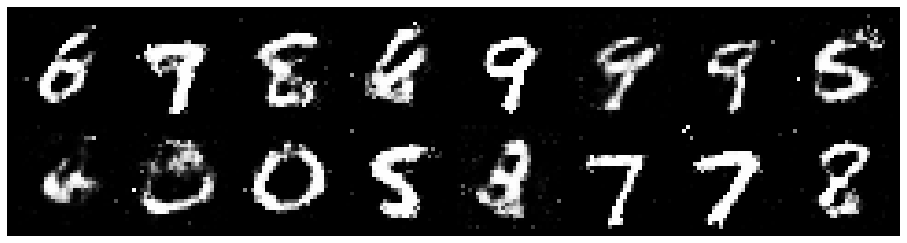

Epoch: [51/100], Batch Num: [300/700]
Discriminator Loss: 1.0996, Generator Loss: 1.0677
D(x): 0.5988, D(G(z)): 0.3882


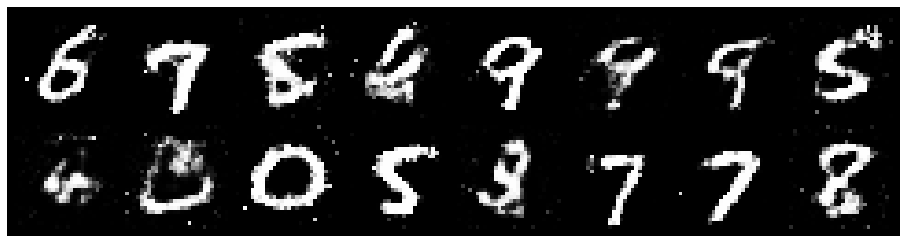

Epoch: [51/100], Batch Num: [400/700]
Discriminator Loss: 1.1711, Generator Loss: 1.1246
D(x): 0.5620, D(G(z)): 0.3784


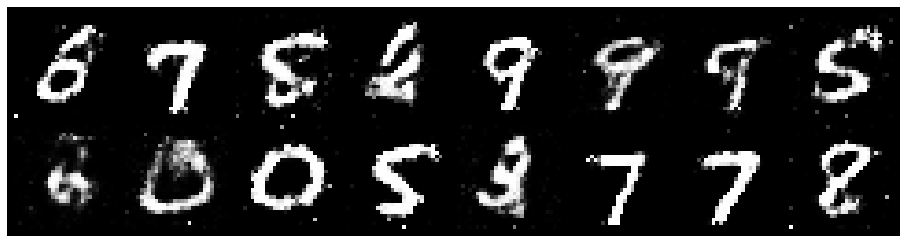

Epoch: [51/100], Batch Num: [500/700]
Discriminator Loss: 1.1675, Generator Loss: 1.0642
D(x): 0.5744, D(G(z)): 0.3802


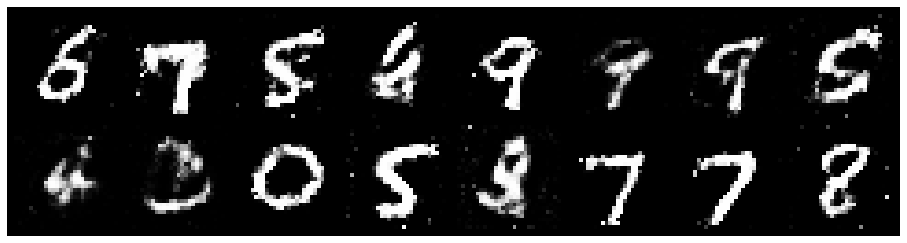

Epoch: [51/100], Batch Num: [600/700]
Discriminator Loss: 1.2475, Generator Loss: 1.2660
D(x): 0.5470, D(G(z)): 0.3550


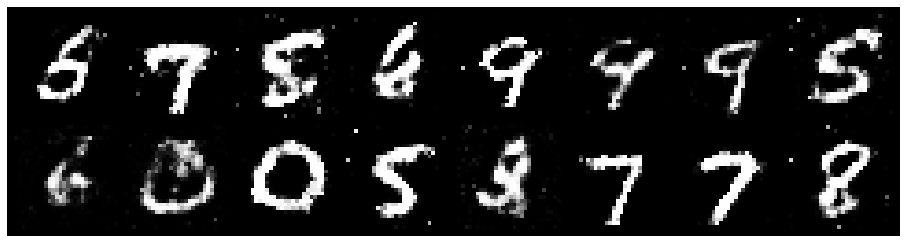

Epoch: [52/100], Batch Num: [0/700]
Discriminator Loss: 1.0684, Generator Loss: 0.9800
D(x): 0.6568, D(G(z)): 0.4290


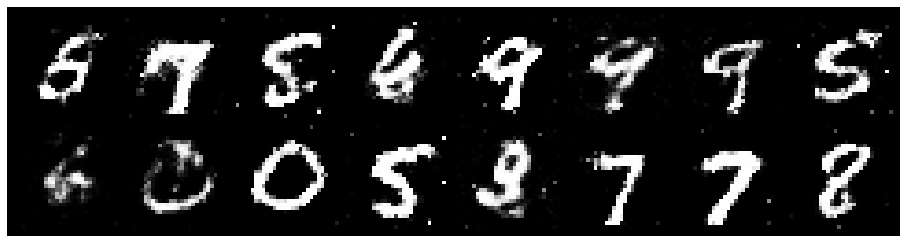

Epoch: [52/100], Batch Num: [100/700]
Discriminator Loss: 1.0111, Generator Loss: 1.2367
D(x): 0.6166, D(G(z)): 0.3643


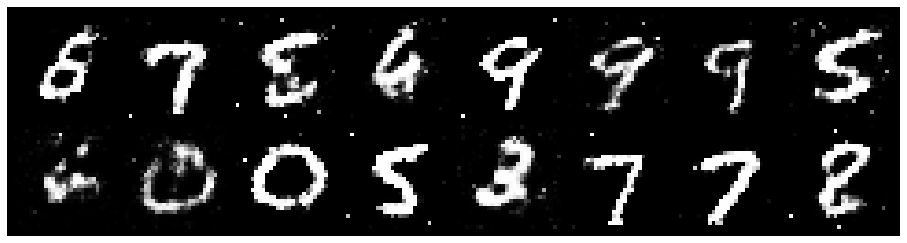

Epoch: [52/100], Batch Num: [200/700]
Discriminator Loss: 1.1388, Generator Loss: 0.9255
D(x): 0.6168, D(G(z)): 0.4285


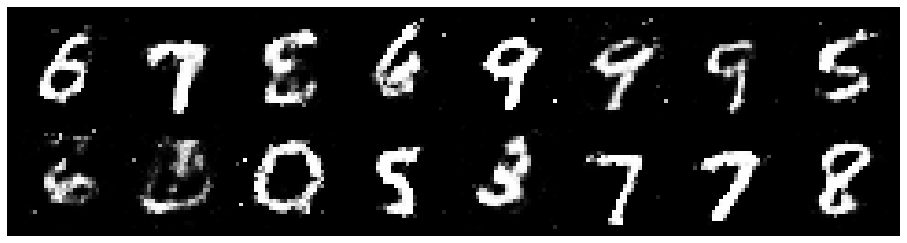

Epoch: [52/100], Batch Num: [300/700]
Discriminator Loss: 1.0916, Generator Loss: 1.0214
D(x): 0.6291, D(G(z)): 0.3960


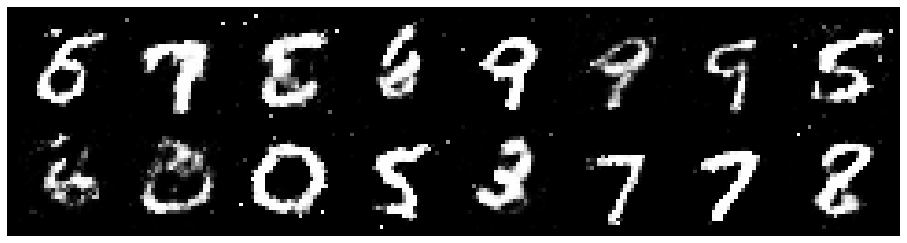

Epoch: [52/100], Batch Num: [400/700]
Discriminator Loss: 1.2340, Generator Loss: 1.1276
D(x): 0.5554, D(G(z)): 0.3863


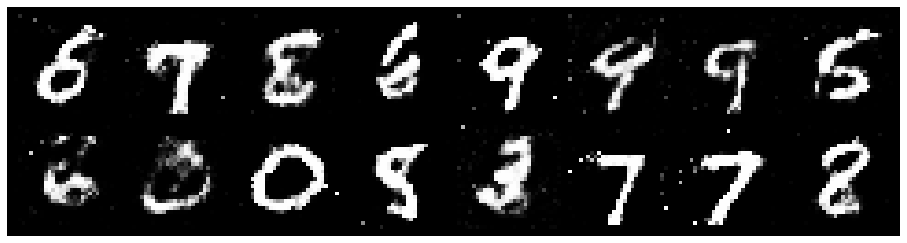

Epoch: [52/100], Batch Num: [500/700]
Discriminator Loss: 1.1710, Generator Loss: 0.8994
D(x): 0.5630, D(G(z)): 0.4105


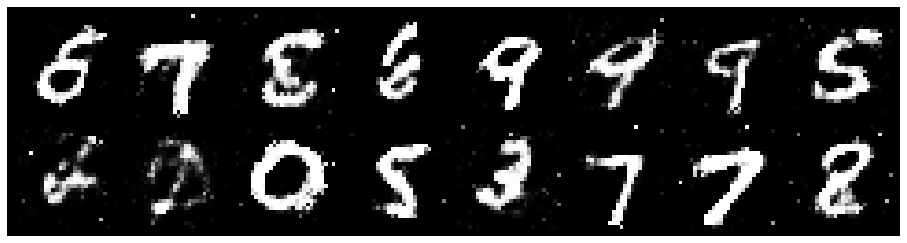

Epoch: [52/100], Batch Num: [600/700]
Discriminator Loss: 1.1985, Generator Loss: 0.8881
D(x): 0.5831, D(G(z)): 0.4245


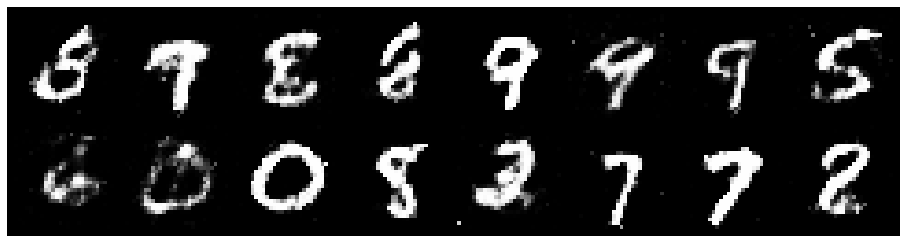

Epoch: [53/100], Batch Num: [0/700]
Discriminator Loss: 1.2406, Generator Loss: 0.8132
D(x): 0.5671, D(G(z)): 0.4449


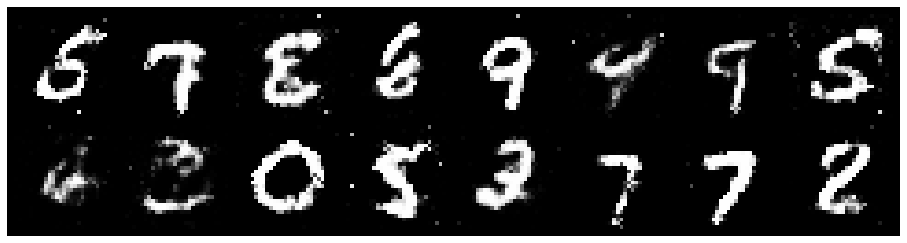

Epoch: [53/100], Batch Num: [100/700]
Discriminator Loss: 1.1977, Generator Loss: 1.0322
D(x): 0.5767, D(G(z)): 0.4190


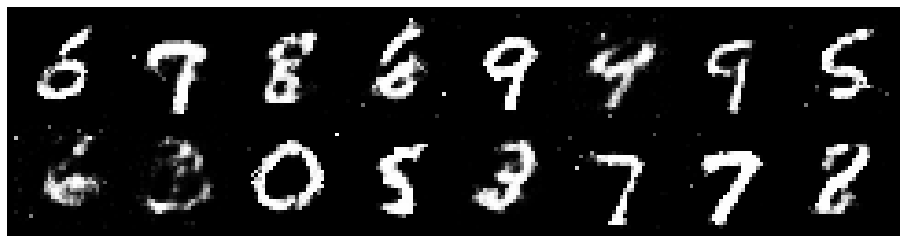

Epoch: [53/100], Batch Num: [200/700]
Discriminator Loss: 1.2857, Generator Loss: 1.0089
D(x): 0.5546, D(G(z)): 0.4262


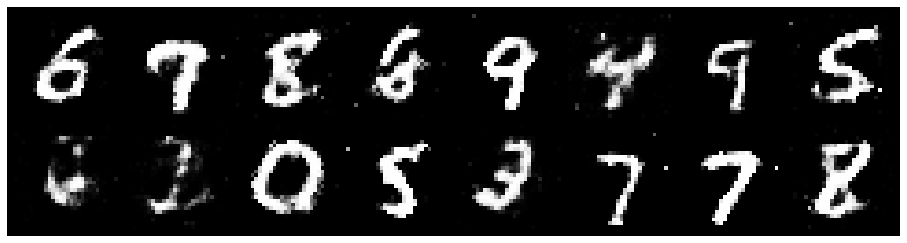

Epoch: [53/100], Batch Num: [300/700]
Discriminator Loss: 1.3503, Generator Loss: 0.8557
D(x): 0.5304, D(G(z)): 0.4584


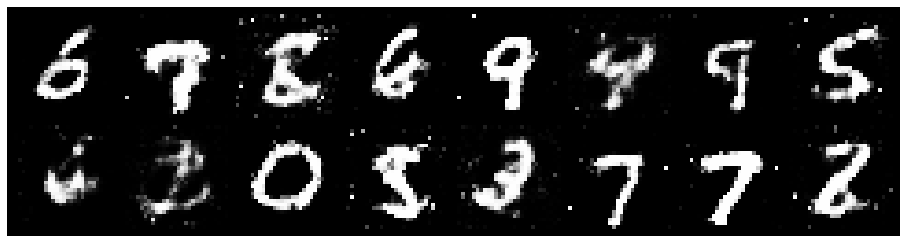

Epoch: [53/100], Batch Num: [400/700]
Discriminator Loss: 1.1952, Generator Loss: 1.1273
D(x): 0.5545, D(G(z)): 0.3814


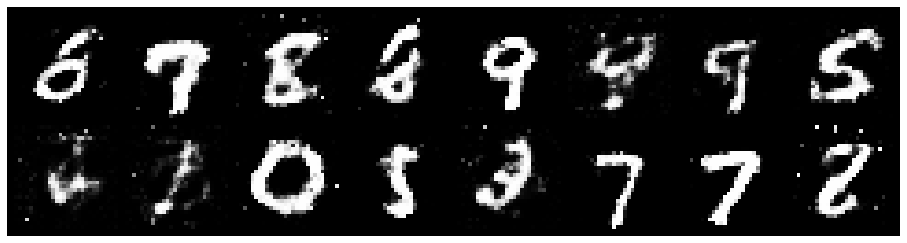

Epoch: [53/100], Batch Num: [500/700]
Discriminator Loss: 1.2828, Generator Loss: 1.0329
D(x): 0.6054, D(G(z)): 0.4469


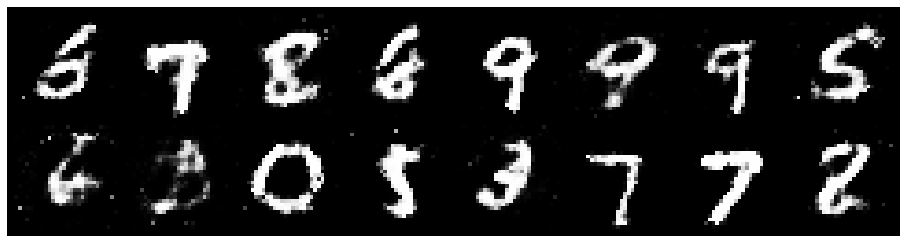

Epoch: [53/100], Batch Num: [600/700]
Discriminator Loss: 1.1483, Generator Loss: 1.0213
D(x): 0.5702, D(G(z)): 0.3983


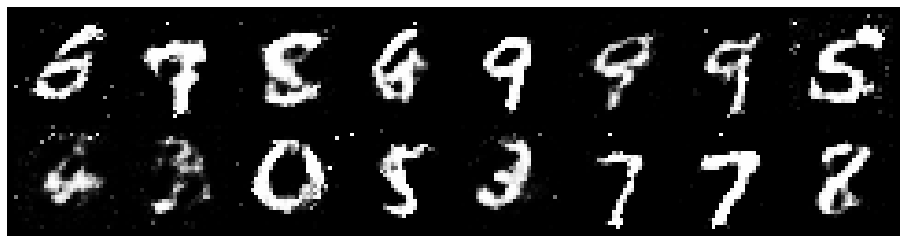

Epoch: [54/100], Batch Num: [0/700]
Discriminator Loss: 1.2274, Generator Loss: 0.7976
D(x): 0.5586, D(G(z)): 0.4313


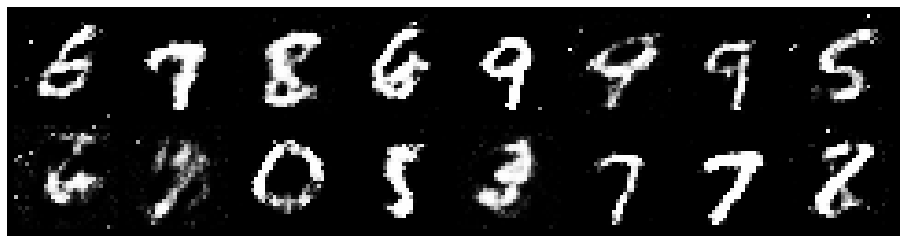

Epoch: [54/100], Batch Num: [100/700]
Discriminator Loss: 1.2672, Generator Loss: 0.9103
D(x): 0.5431, D(G(z)): 0.4260


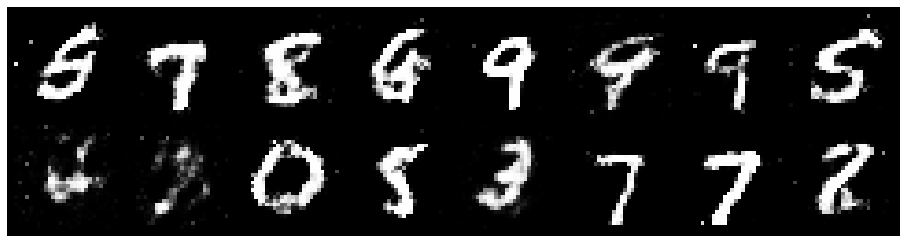

Epoch: [54/100], Batch Num: [200/700]
Discriminator Loss: 1.0684, Generator Loss: 1.3540
D(x): 0.6430, D(G(z)): 0.3672


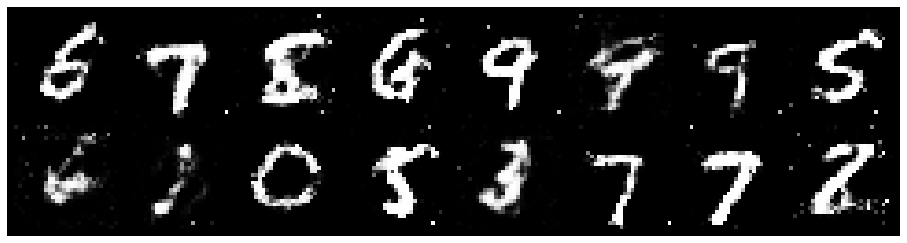

Epoch: [54/100], Batch Num: [300/700]
Discriminator Loss: 1.2400, Generator Loss: 0.9027
D(x): 0.5193, D(G(z)): 0.3983


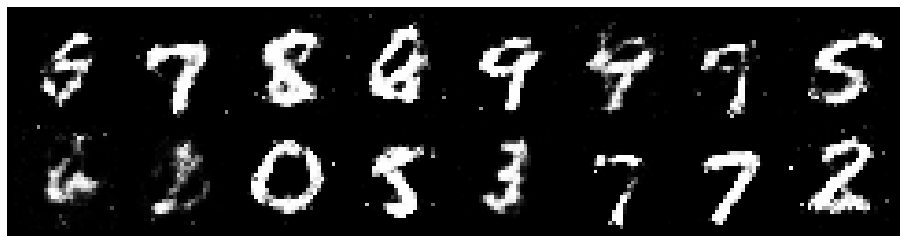

Epoch: [54/100], Batch Num: [400/700]
Discriminator Loss: 1.2093, Generator Loss: 1.0718
D(x): 0.5567, D(G(z)): 0.3985


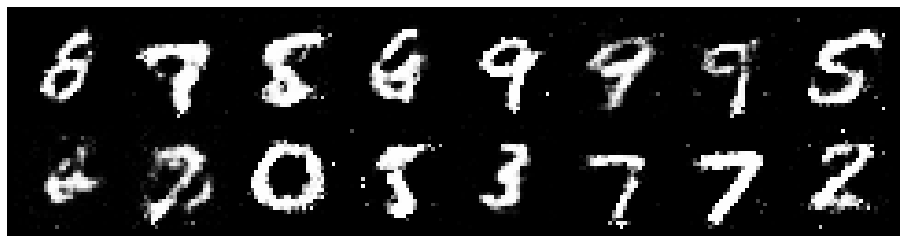

Epoch: [54/100], Batch Num: [500/700]
Discriminator Loss: 1.2203, Generator Loss: 0.8968
D(x): 0.5731, D(G(z)): 0.4041


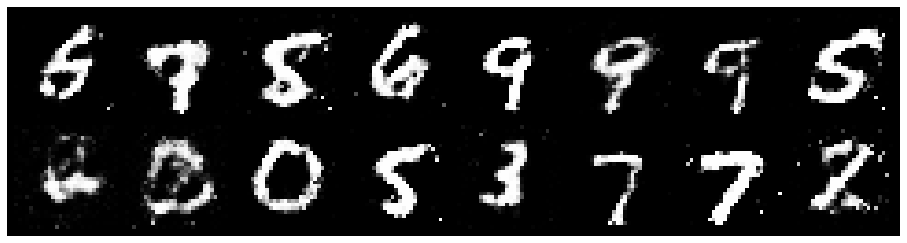

Epoch: [54/100], Batch Num: [600/700]
Discriminator Loss: 1.3017, Generator Loss: 1.1444
D(x): 0.5379, D(G(z)): 0.3930


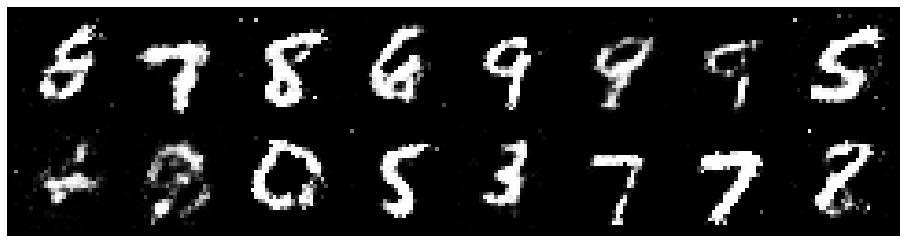

Epoch: [55/100], Batch Num: [0/700]
Discriminator Loss: 1.2818, Generator Loss: 0.9540
D(x): 0.5299, D(G(z)): 0.4086


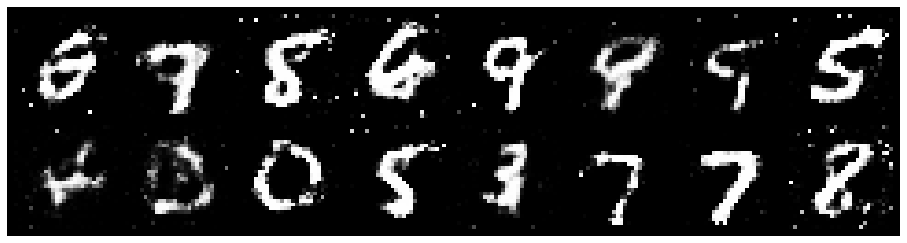

Epoch: [55/100], Batch Num: [100/700]
Discriminator Loss: 1.3308, Generator Loss: 0.9281
D(x): 0.5222, D(G(z)): 0.4525


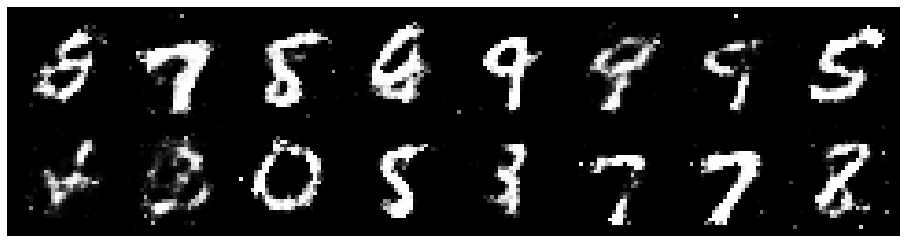

Epoch: [55/100], Batch Num: [200/700]
Discriminator Loss: 1.1526, Generator Loss: 1.0232
D(x): 0.6075, D(G(z)): 0.4054


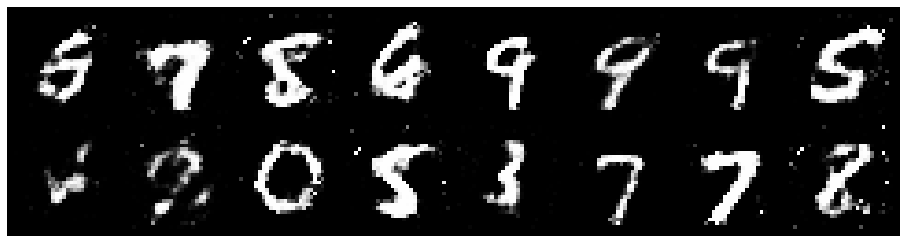

Epoch: [55/100], Batch Num: [300/700]
Discriminator Loss: 1.2558, Generator Loss: 1.2410
D(x): 0.5922, D(G(z)): 0.4043


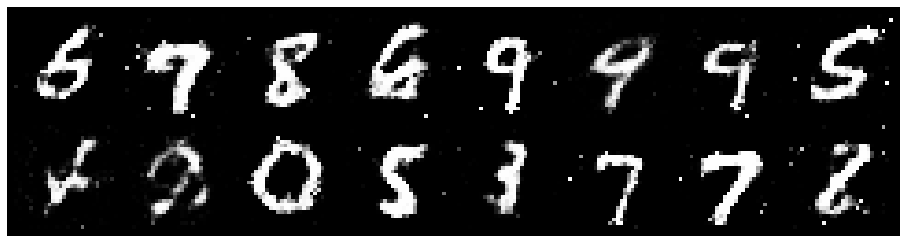

Epoch: [55/100], Batch Num: [400/700]
Discriminator Loss: 1.1519, Generator Loss: 1.0903
D(x): 0.5780, D(G(z)): 0.3656


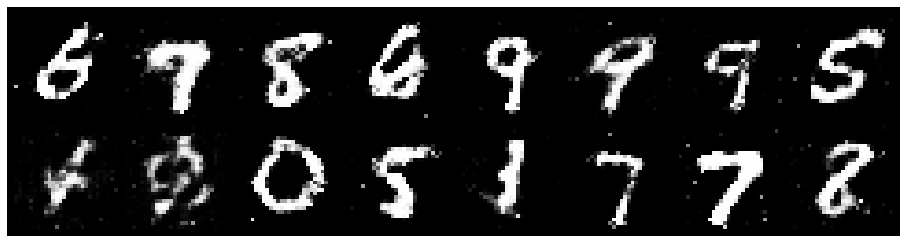

Epoch: [55/100], Batch Num: [500/700]
Discriminator Loss: 1.2463, Generator Loss: 0.8587
D(x): 0.6280, D(G(z)): 0.4733


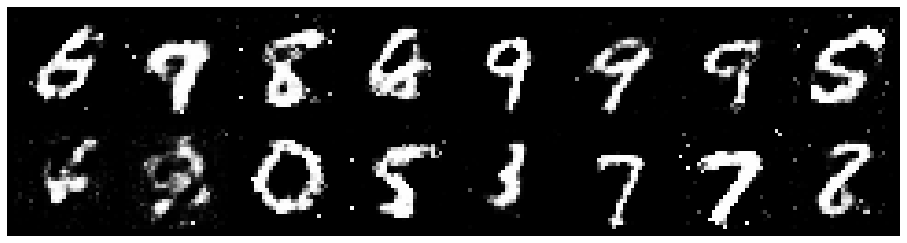

Epoch: [55/100], Batch Num: [600/700]
Discriminator Loss: 1.3082, Generator Loss: 0.9240
D(x): 0.5516, D(G(z)): 0.4161


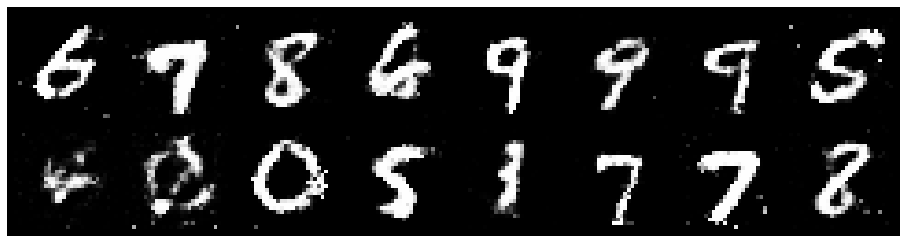

Epoch: [56/100], Batch Num: [0/700]
Discriminator Loss: 1.2209, Generator Loss: 1.0469
D(x): 0.5805, D(G(z)): 0.4147


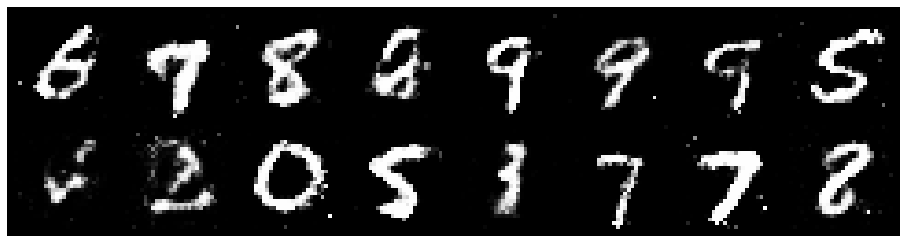

Epoch: [56/100], Batch Num: [100/700]
Discriminator Loss: 1.2732, Generator Loss: 0.9997
D(x): 0.5620, D(G(z)): 0.4184


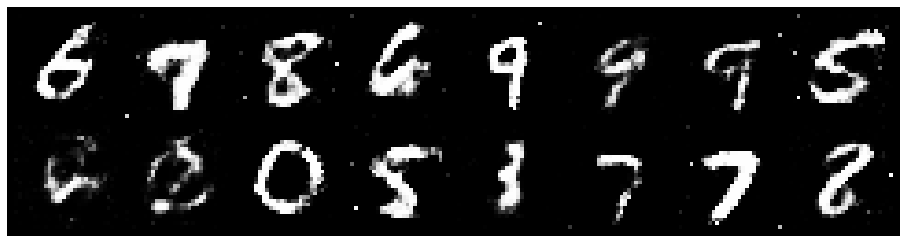

Epoch: [56/100], Batch Num: [200/700]
Discriminator Loss: 1.2136, Generator Loss: 1.1932
D(x): 0.5737, D(G(z)): 0.3760


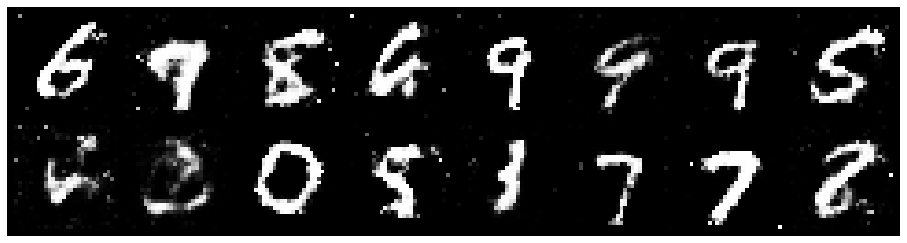

Epoch: [56/100], Batch Num: [300/700]
Discriminator Loss: 1.2925, Generator Loss: 0.9582
D(x): 0.5567, D(G(z)): 0.4195


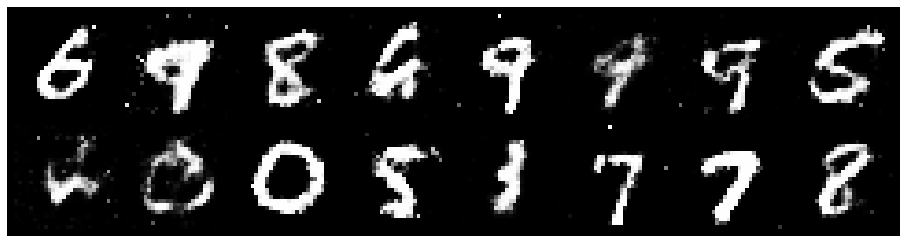

Epoch: [56/100], Batch Num: [400/700]
Discriminator Loss: 1.1860, Generator Loss: 1.0539
D(x): 0.6357, D(G(z)): 0.4353


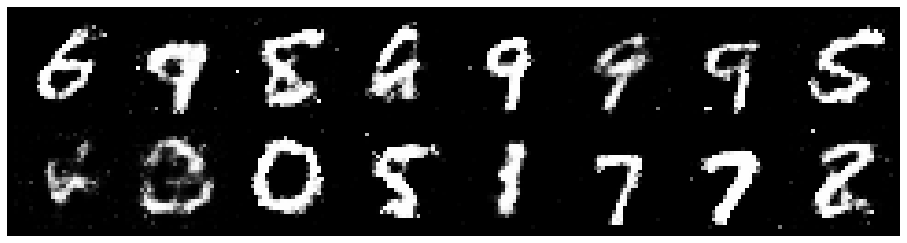

Epoch: [56/100], Batch Num: [500/700]
Discriminator Loss: 1.2880, Generator Loss: 1.1715
D(x): 0.5761, D(G(z)): 0.4269


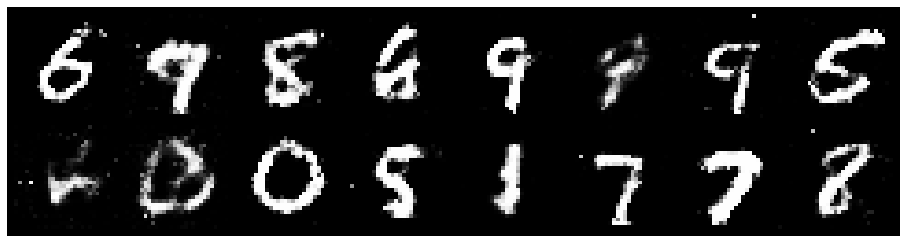

Epoch: [56/100], Batch Num: [600/700]
Discriminator Loss: 1.2126, Generator Loss: 1.0168
D(x): 0.6016, D(G(z)): 0.4366


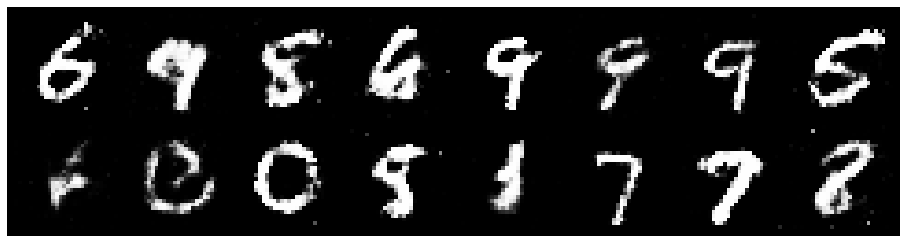

Epoch: [57/100], Batch Num: [0/700]
Discriminator Loss: 1.3255, Generator Loss: 0.9115
D(x): 0.5306, D(G(z)): 0.4425


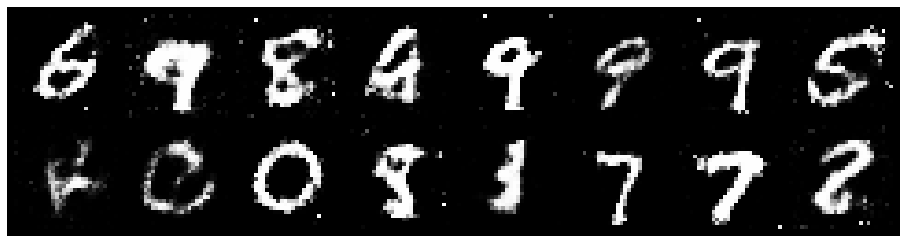

Epoch: [57/100], Batch Num: [100/700]
Discriminator Loss: 1.1821, Generator Loss: 1.0842
D(x): 0.5660, D(G(z)): 0.3881


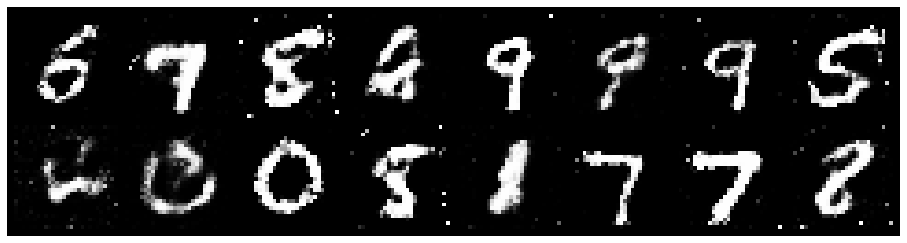

Epoch: [57/100], Batch Num: [200/700]
Discriminator Loss: 1.2940, Generator Loss: 1.0809
D(x): 0.5649, D(G(z)): 0.4343


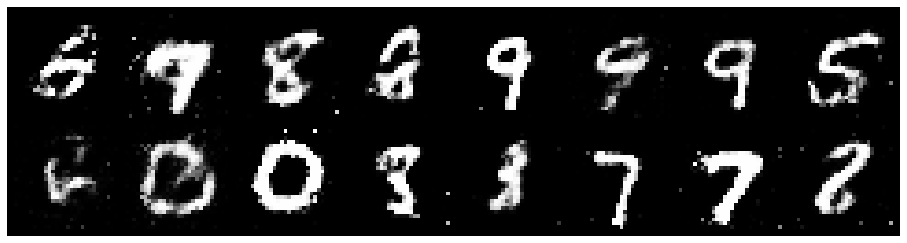

Epoch: [57/100], Batch Num: [300/700]
Discriminator Loss: 1.2170, Generator Loss: 0.8929
D(x): 0.5843, D(G(z)): 0.4365


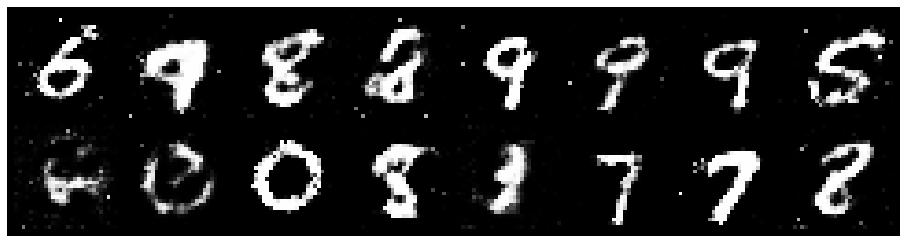

Epoch: [57/100], Batch Num: [400/700]
Discriminator Loss: 1.2668, Generator Loss: 1.1060
D(x): 0.5723, D(G(z)): 0.4155


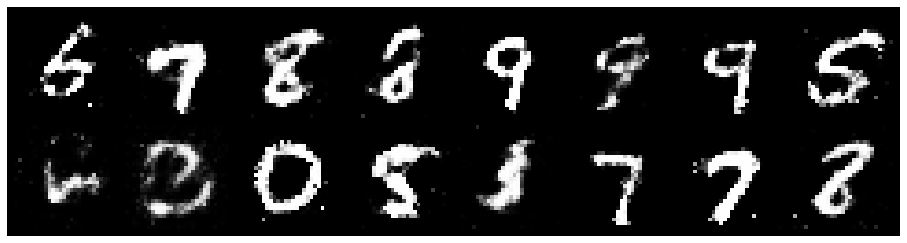

Epoch: [57/100], Batch Num: [500/700]
Discriminator Loss: 1.1330, Generator Loss: 1.1963
D(x): 0.6094, D(G(z)): 0.3932


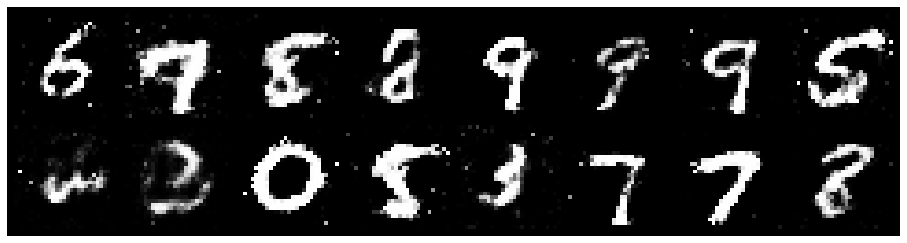

Epoch: [57/100], Batch Num: [600/700]
Discriminator Loss: 1.1507, Generator Loss: 1.1278
D(x): 0.5662, D(G(z)): 0.3713


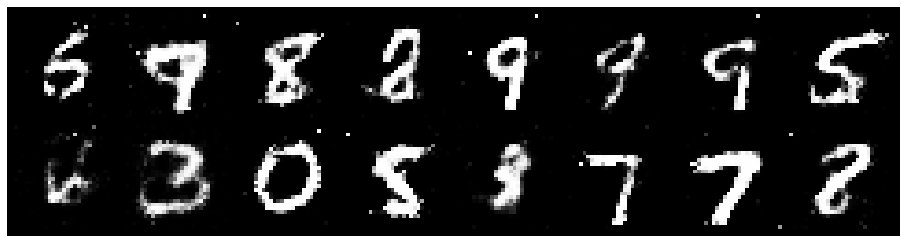

Epoch: [58/100], Batch Num: [0/700]
Discriminator Loss: 1.1242, Generator Loss: 1.1758
D(x): 0.6069, D(G(z)): 0.3912


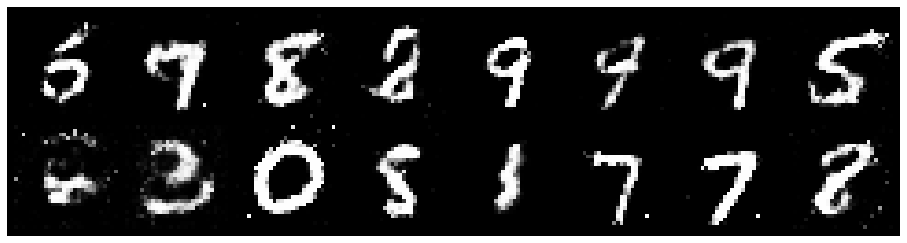

Epoch: [58/100], Batch Num: [100/700]
Discriminator Loss: 1.1941, Generator Loss: 1.0134
D(x): 0.5928, D(G(z)): 0.4265


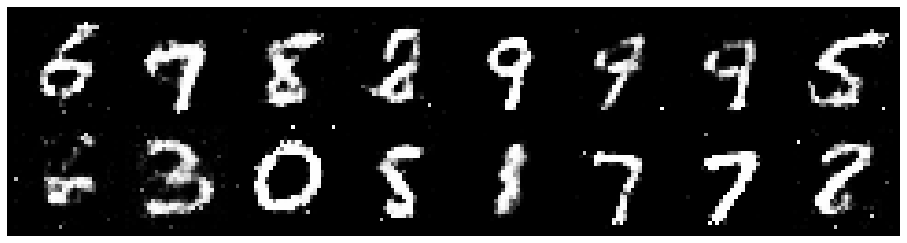

Epoch: [58/100], Batch Num: [200/700]
Discriminator Loss: 1.2613, Generator Loss: 1.2076
D(x): 0.5465, D(G(z)): 0.4033


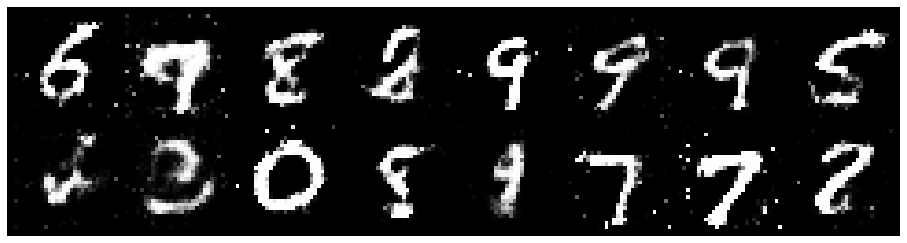

Epoch: [58/100], Batch Num: [300/700]
Discriminator Loss: 1.2222, Generator Loss: 0.9692
D(x): 0.5434, D(G(z)): 0.3994


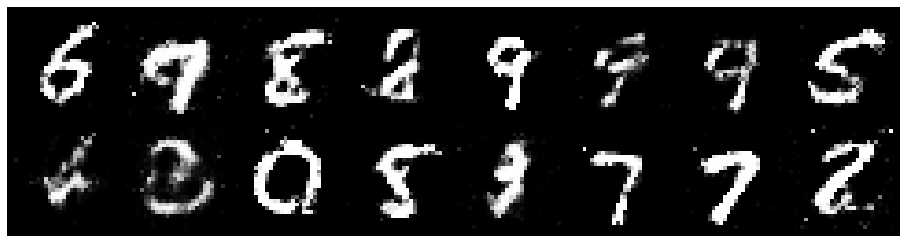

Epoch: [58/100], Batch Num: [400/700]
Discriminator Loss: 1.2151, Generator Loss: 0.9026
D(x): 0.5648, D(G(z)): 0.4157


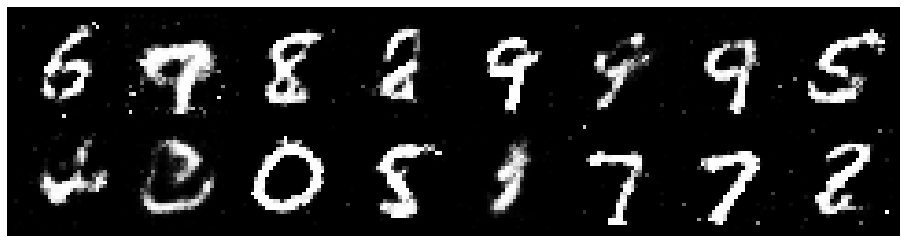

Epoch: [58/100], Batch Num: [500/700]
Discriminator Loss: 1.1297, Generator Loss: 1.1885
D(x): 0.6053, D(G(z)): 0.3897


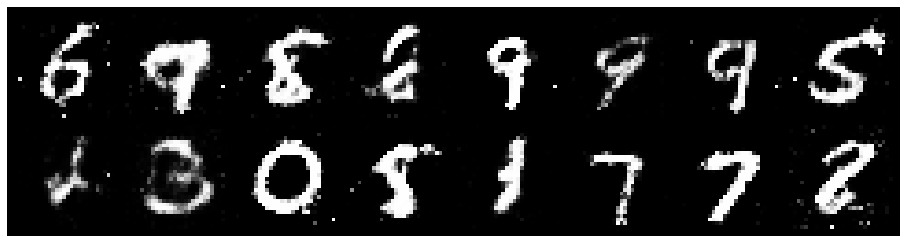

Epoch: [58/100], Batch Num: [600/700]
Discriminator Loss: 1.1589, Generator Loss: 1.2933
D(x): 0.6039, D(G(z)): 0.3700


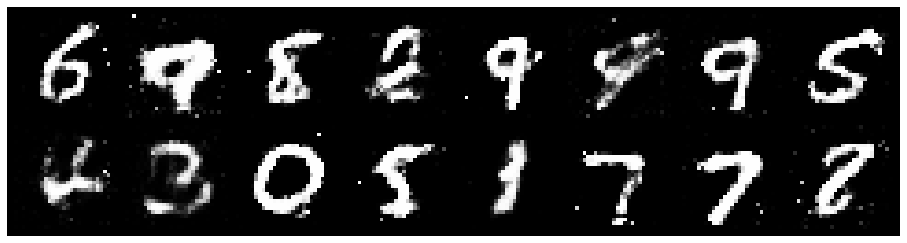

Epoch: [59/100], Batch Num: [0/700]
Discriminator Loss: 1.2843, Generator Loss: 0.9803
D(x): 0.6072, D(G(z)): 0.4594


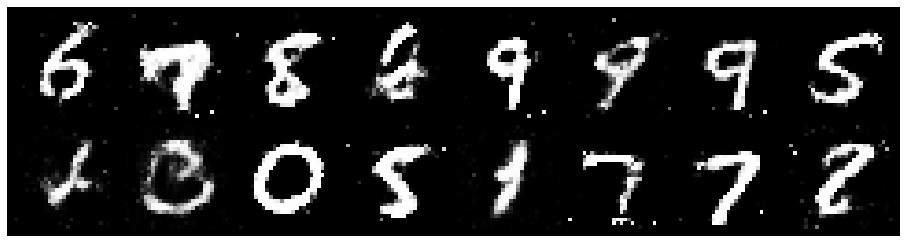

Epoch: [59/100], Batch Num: [100/700]
Discriminator Loss: 1.2362, Generator Loss: 1.0000
D(x): 0.6168, D(G(z)): 0.4302


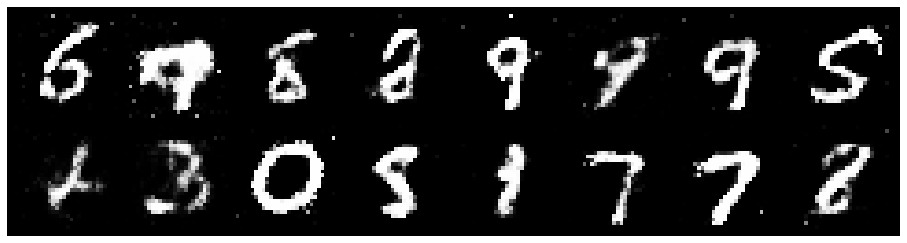

Epoch: [59/100], Batch Num: [200/700]
Discriminator Loss: 1.2352, Generator Loss: 1.0728
D(x): 0.5702, D(G(z)): 0.4136


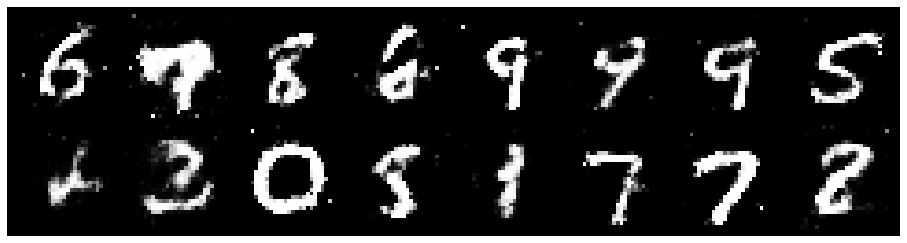

Epoch: [59/100], Batch Num: [300/700]
Discriminator Loss: 1.0582, Generator Loss: 1.1609
D(x): 0.5934, D(G(z)): 0.3529


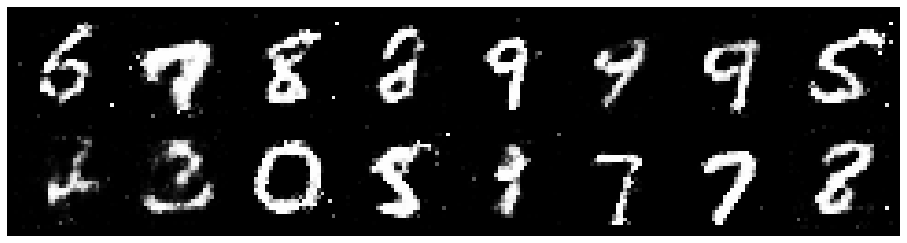

Epoch: [59/100], Batch Num: [400/700]
Discriminator Loss: 1.1177, Generator Loss: 1.1898
D(x): 0.6006, D(G(z)): 0.3770


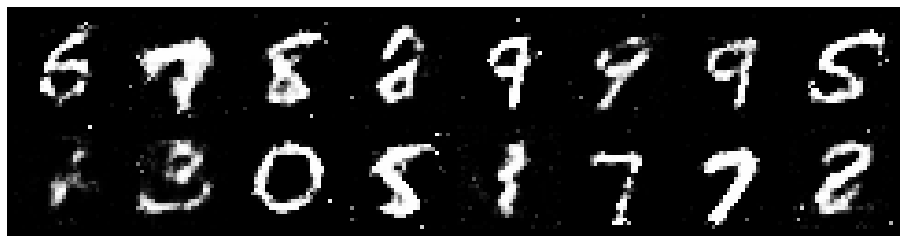

Epoch: [59/100], Batch Num: [500/700]
Discriminator Loss: 1.0495, Generator Loss: 1.0077
D(x): 0.5944, D(G(z)): 0.3538


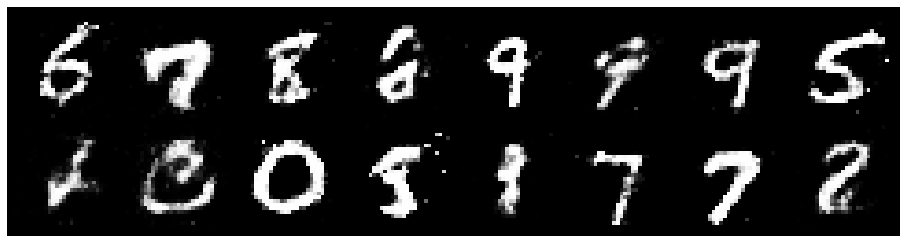

Epoch: [59/100], Batch Num: [600/700]
Discriminator Loss: 1.1984, Generator Loss: 0.8613
D(x): 0.6197, D(G(z)): 0.4612


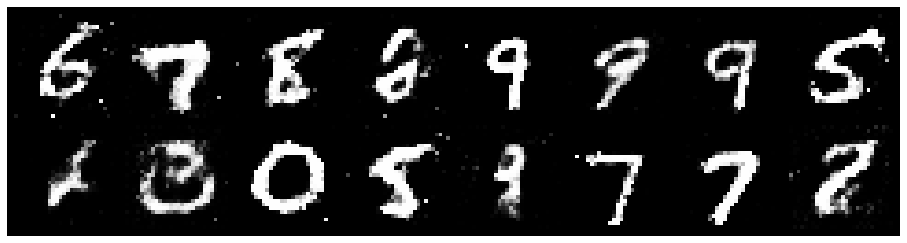

Epoch: [60/100], Batch Num: [0/700]
Discriminator Loss: 1.0514, Generator Loss: 1.2833
D(x): 0.5875, D(G(z)): 0.3204


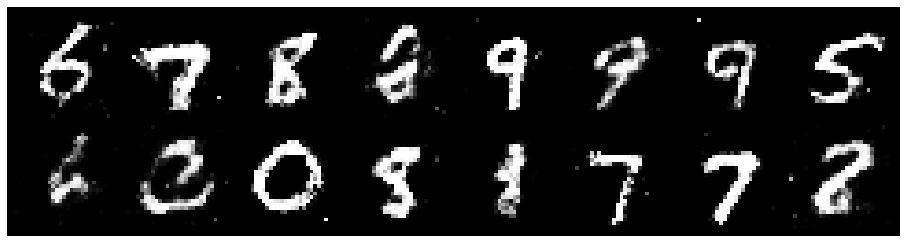

Epoch: [60/100], Batch Num: [100/700]
Discriminator Loss: 1.1517, Generator Loss: 1.2662
D(x): 0.5859, D(G(z)): 0.3933


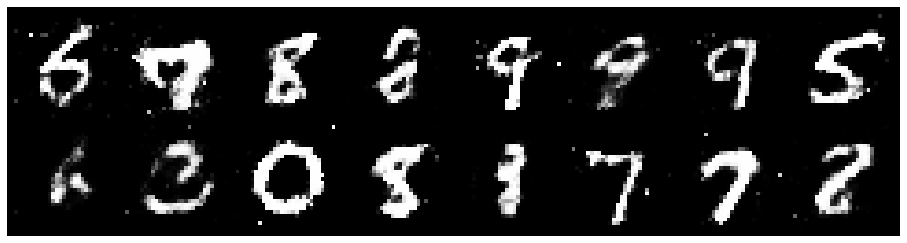

Epoch: [60/100], Batch Num: [200/700]
Discriminator Loss: 1.2815, Generator Loss: 0.9809
D(x): 0.5446, D(G(z)): 0.4324


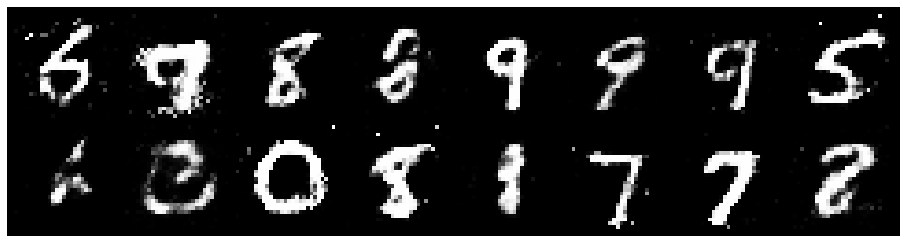

Epoch: [60/100], Batch Num: [300/700]
Discriminator Loss: 1.3657, Generator Loss: 0.9227
D(x): 0.5698, D(G(z)): 0.4762


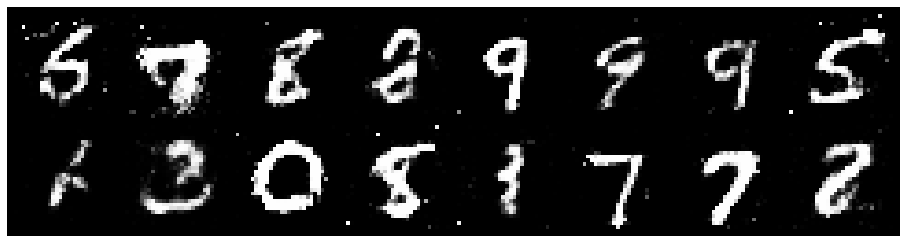

Epoch: [60/100], Batch Num: [400/700]
Discriminator Loss: 1.1386, Generator Loss: 1.2750
D(x): 0.5890, D(G(z)): 0.3826


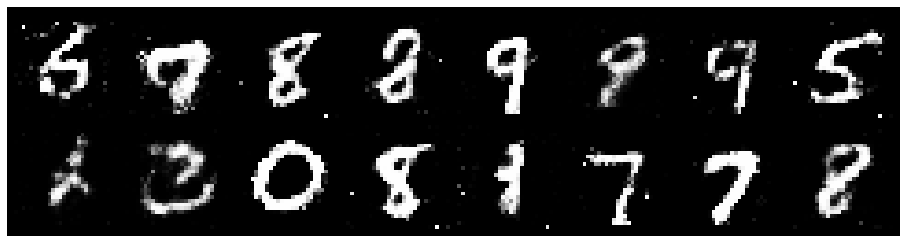

Epoch: [60/100], Batch Num: [500/700]
Discriminator Loss: 1.2604, Generator Loss: 0.8037
D(x): 0.5611, D(G(z)): 0.4542


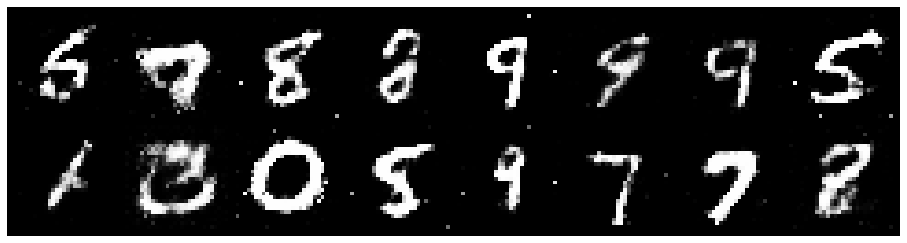

Epoch: [60/100], Batch Num: [600/700]
Discriminator Loss: 1.3170, Generator Loss: 0.8793
D(x): 0.5426, D(G(z)): 0.4503


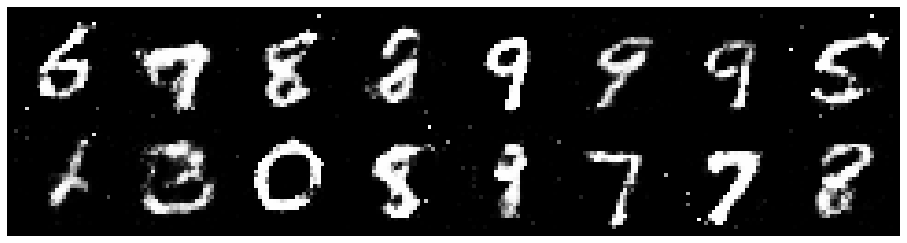

Epoch: [61/100], Batch Num: [0/700]
Discriminator Loss: 1.2311, Generator Loss: 0.9064
D(x): 0.5212, D(G(z)): 0.3963


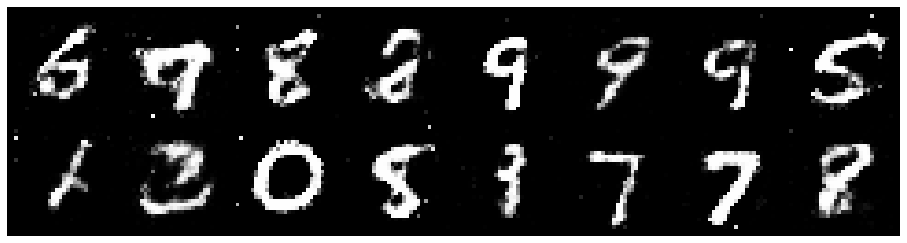

Epoch: [61/100], Batch Num: [100/700]
Discriminator Loss: 1.1581, Generator Loss: 0.9496
D(x): 0.5805, D(G(z)): 0.3979


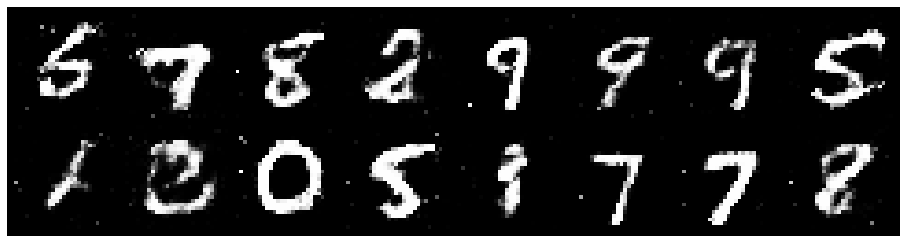

Epoch: [61/100], Batch Num: [200/700]
Discriminator Loss: 1.2613, Generator Loss: 0.9335
D(x): 0.5565, D(G(z)): 0.4269


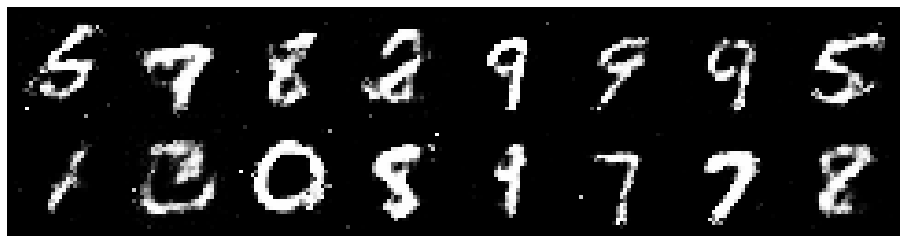

Epoch: [61/100], Batch Num: [300/700]
Discriminator Loss: 1.2716, Generator Loss: 1.0039
D(x): 0.5509, D(G(z)): 0.4220


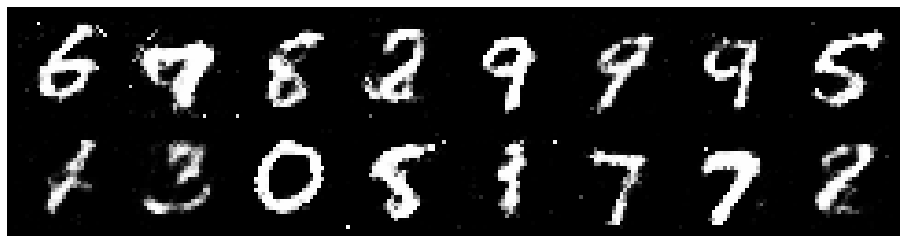

Epoch: [61/100], Batch Num: [400/700]
Discriminator Loss: 1.2122, Generator Loss: 0.9364
D(x): 0.6023, D(G(z)): 0.4492


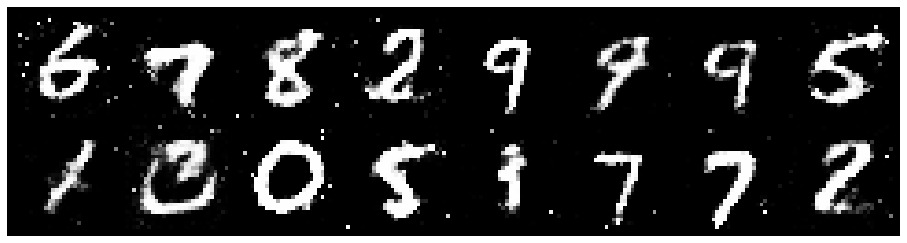

Epoch: [61/100], Batch Num: [500/700]
Discriminator Loss: 1.2543, Generator Loss: 0.8053
D(x): 0.6100, D(G(z)): 0.4864


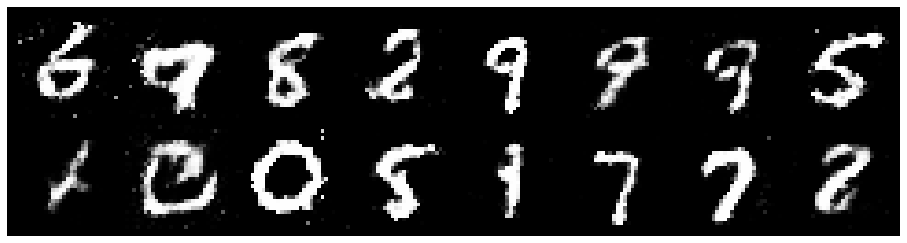

Epoch: [61/100], Batch Num: [600/700]
Discriminator Loss: 1.1669, Generator Loss: 0.9523
D(x): 0.6483, D(G(z)): 0.4441


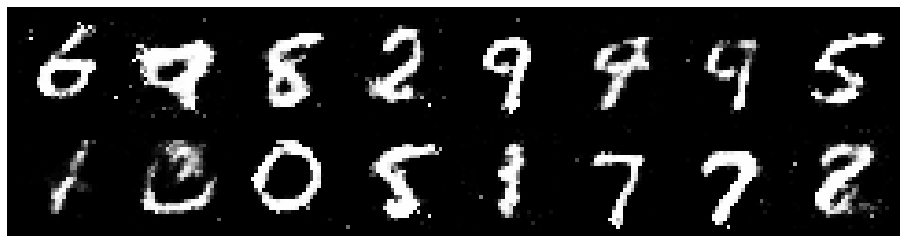

Epoch: [62/100], Batch Num: [0/700]
Discriminator Loss: 1.1180, Generator Loss: 1.0524
D(x): 0.6331, D(G(z)): 0.4129


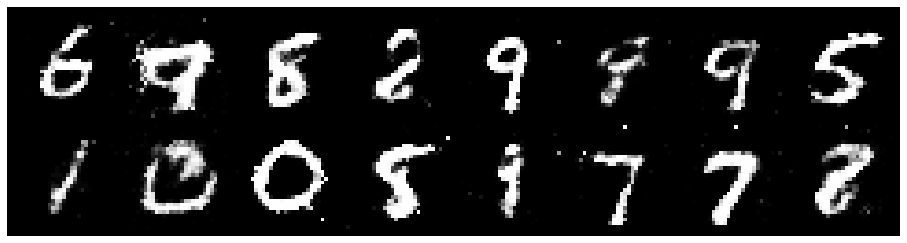

Epoch: [62/100], Batch Num: [100/700]
Discriminator Loss: 1.1917, Generator Loss: 1.0126
D(x): 0.6383, D(G(z)): 0.4668


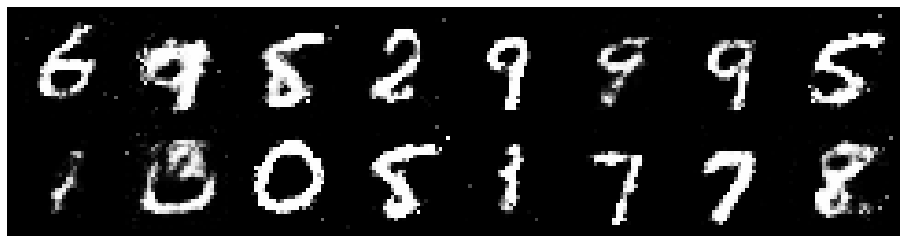

Epoch: [62/100], Batch Num: [200/700]
Discriminator Loss: 1.2905, Generator Loss: 1.0978
D(x): 0.6072, D(G(z)): 0.4352


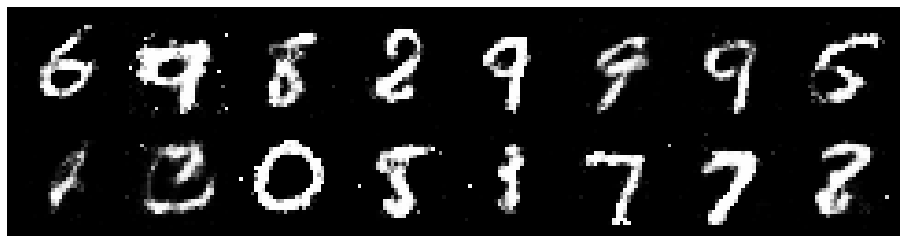

Epoch: [62/100], Batch Num: [300/700]
Discriminator Loss: 1.2123, Generator Loss: 1.1353
D(x): 0.5649, D(G(z)): 0.3827


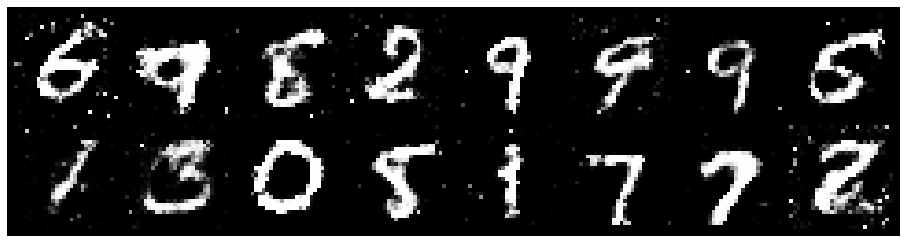

Epoch: [62/100], Batch Num: [400/700]
Discriminator Loss: 1.1622, Generator Loss: 1.0574
D(x): 0.5873, D(G(z)): 0.3925


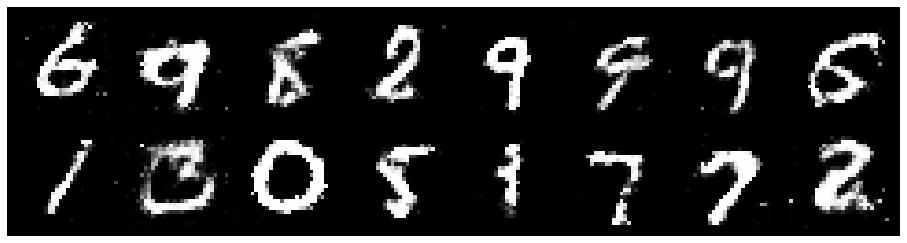

Epoch: [62/100], Batch Num: [500/700]
Discriminator Loss: 1.2038, Generator Loss: 1.0752
D(x): 0.5615, D(G(z)): 0.3963


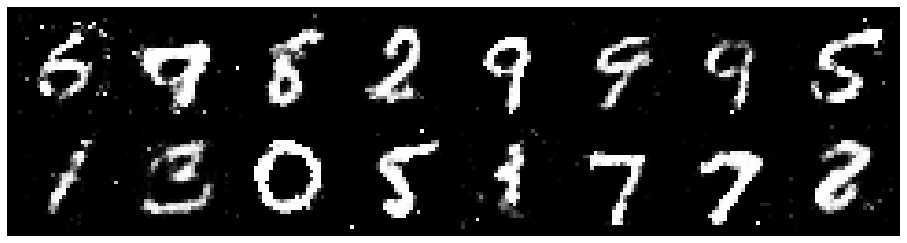

Epoch: [62/100], Batch Num: [600/700]
Discriminator Loss: 1.2662, Generator Loss: 1.0488
D(x): 0.5720, D(G(z)): 0.4145


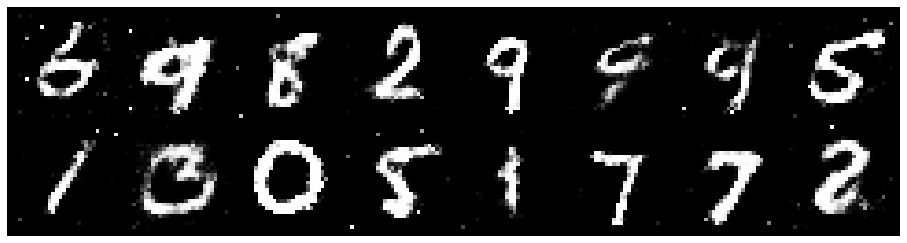

Epoch: [63/100], Batch Num: [0/700]
Discriminator Loss: 1.1612, Generator Loss: 0.8313
D(x): 0.6372, D(G(z)): 0.4561


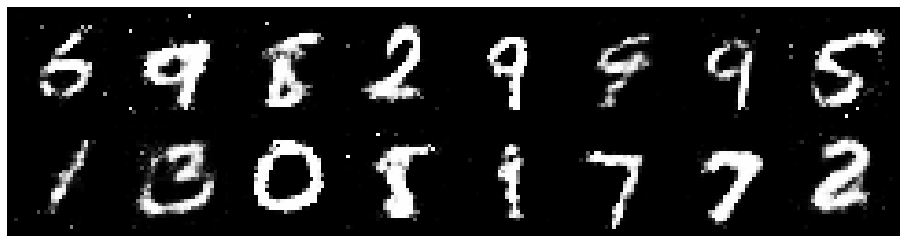

Epoch: [63/100], Batch Num: [100/700]
Discriminator Loss: 1.2932, Generator Loss: 0.9331
D(x): 0.5356, D(G(z)): 0.4377


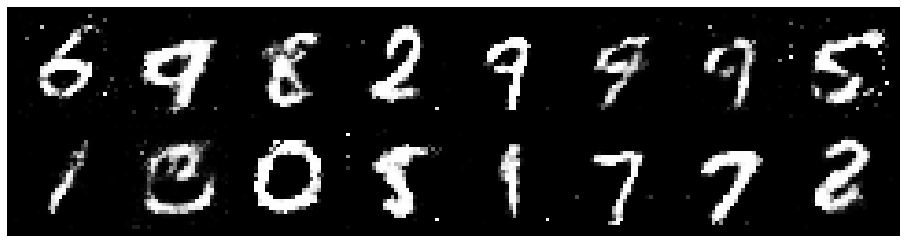

Epoch: [63/100], Batch Num: [200/700]
Discriminator Loss: 1.0857, Generator Loss: 0.9617
D(x): 0.6587, D(G(z)): 0.4228


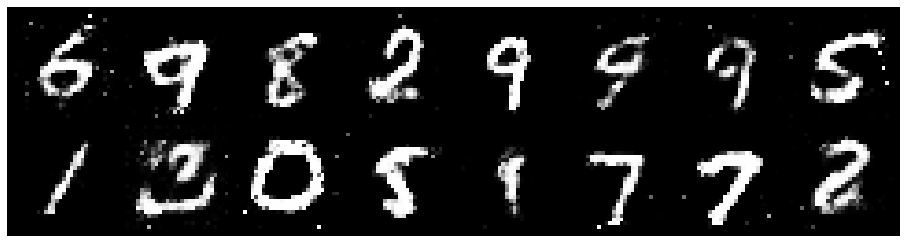

Epoch: [63/100], Batch Num: [300/700]
Discriminator Loss: 1.1948, Generator Loss: 1.1717
D(x): 0.5822, D(G(z)): 0.4179


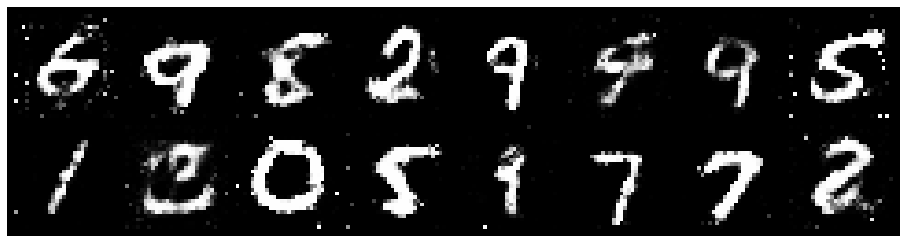

Epoch: [63/100], Batch Num: [400/700]
Discriminator Loss: 1.1680, Generator Loss: 0.9309
D(x): 0.5898, D(G(z)): 0.4215


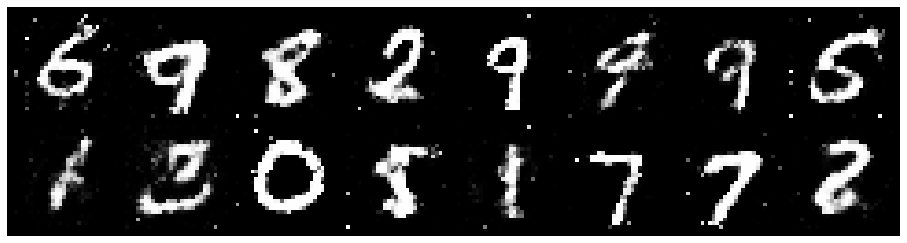

Epoch: [63/100], Batch Num: [500/700]
Discriminator Loss: 1.2102, Generator Loss: 1.0557
D(x): 0.5533, D(G(z)): 0.3934


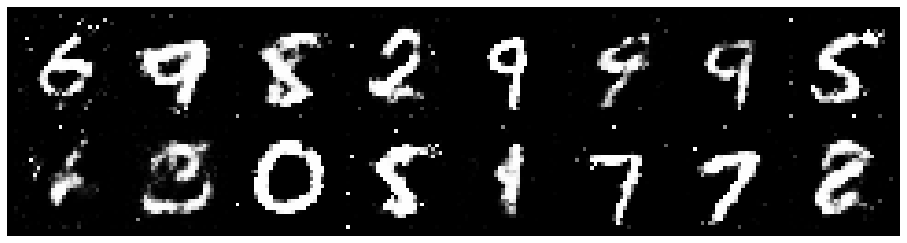

Epoch: [63/100], Batch Num: [600/700]
Discriminator Loss: 1.2714, Generator Loss: 0.8302
D(x): 0.5408, D(G(z)): 0.4152


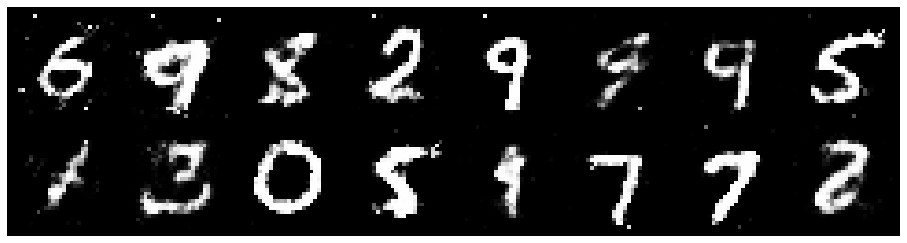

Epoch: [64/100], Batch Num: [0/700]
Discriminator Loss: 1.1758, Generator Loss: 0.9280
D(x): 0.6724, D(G(z)): 0.4638


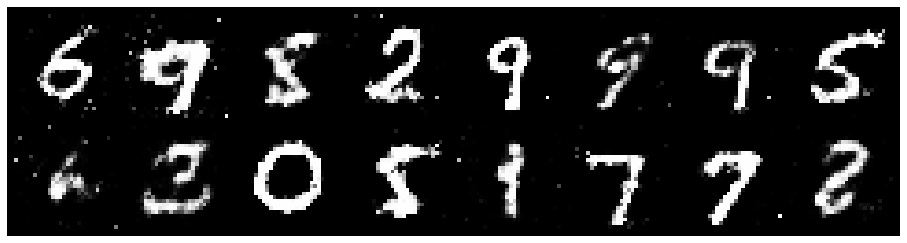

Epoch: [64/100], Batch Num: [100/700]
Discriminator Loss: 1.1689, Generator Loss: 0.9769
D(x): 0.6009, D(G(z)): 0.4262


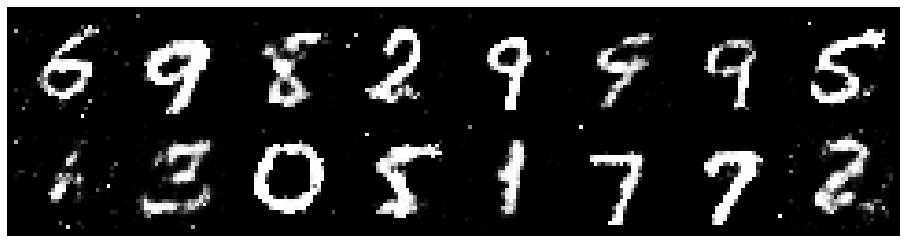

Epoch: [64/100], Batch Num: [200/700]
Discriminator Loss: 1.1618, Generator Loss: 0.8988
D(x): 0.6586, D(G(z)): 0.4552


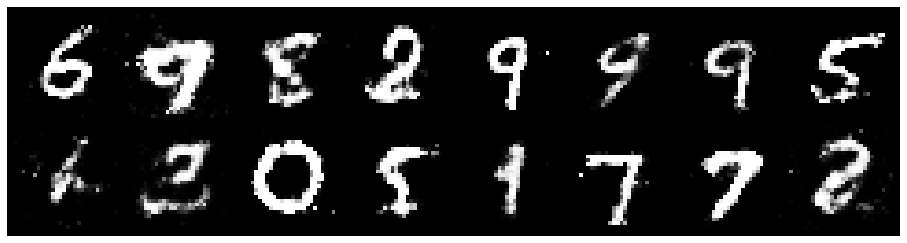

Epoch: [64/100], Batch Num: [300/700]
Discriminator Loss: 1.2760, Generator Loss: 1.1356
D(x): 0.5525, D(G(z)): 0.4232


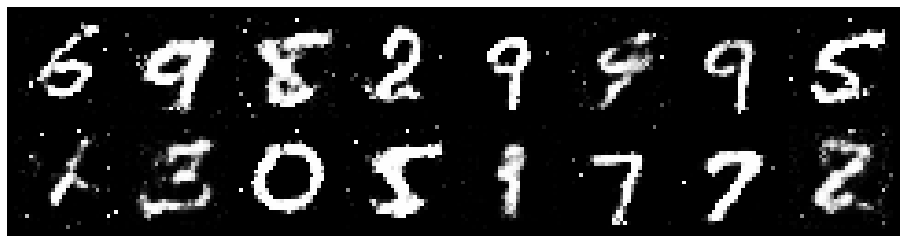

Epoch: [64/100], Batch Num: [400/700]
Discriminator Loss: 1.3743, Generator Loss: 0.8169
D(x): 0.5765, D(G(z)): 0.4879


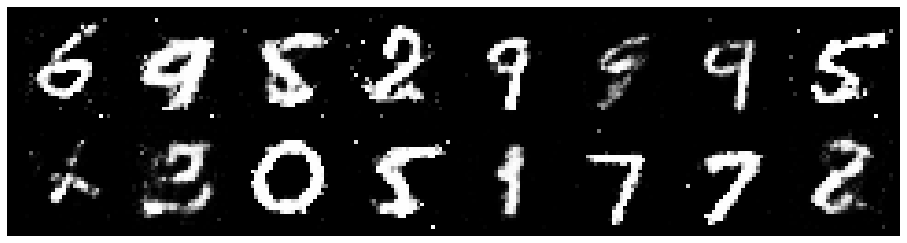

Epoch: [64/100], Batch Num: [500/700]
Discriminator Loss: 1.0943, Generator Loss: 1.2150
D(x): 0.6341, D(G(z)): 0.3666


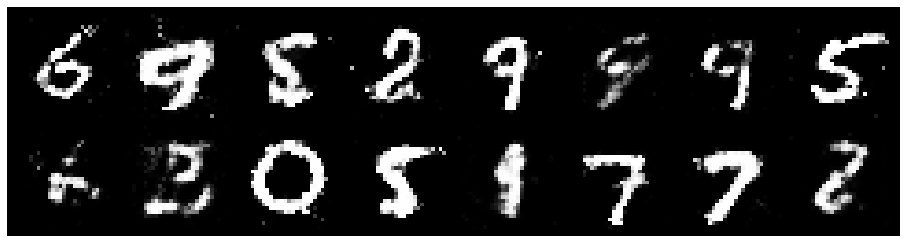

Epoch: [64/100], Batch Num: [600/700]
Discriminator Loss: 1.2912, Generator Loss: 0.8060
D(x): 0.5520, D(G(z)): 0.4637


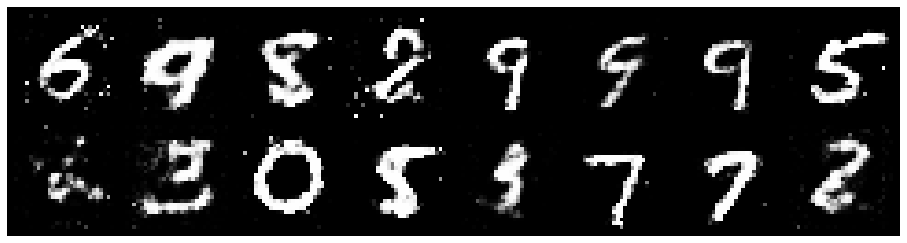

Epoch: [65/100], Batch Num: [0/700]
Discriminator Loss: 1.2730, Generator Loss: 1.0010
D(x): 0.5758, D(G(z)): 0.4484


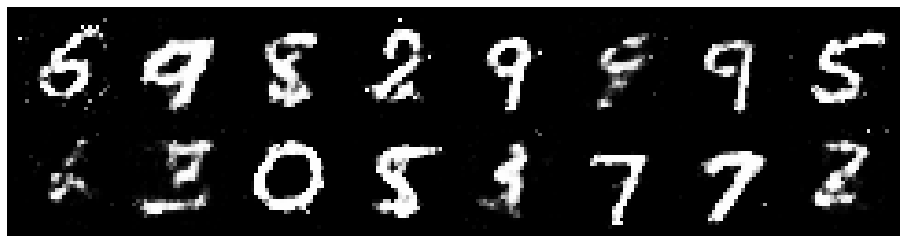

Epoch: [65/100], Batch Num: [100/700]
Discriminator Loss: 1.1640, Generator Loss: 1.2205
D(x): 0.6281, D(G(z)): 0.4001


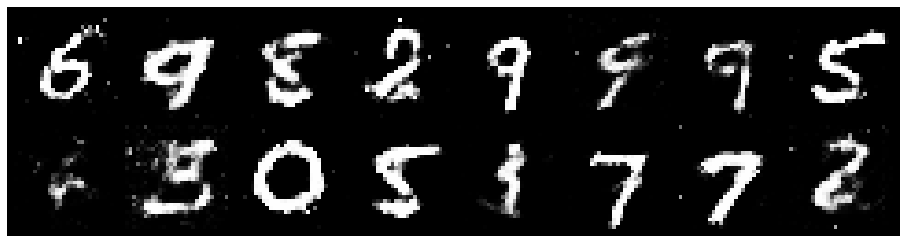

Epoch: [65/100], Batch Num: [200/700]
Discriminator Loss: 1.1708, Generator Loss: 0.9334
D(x): 0.5945, D(G(z)): 0.4120


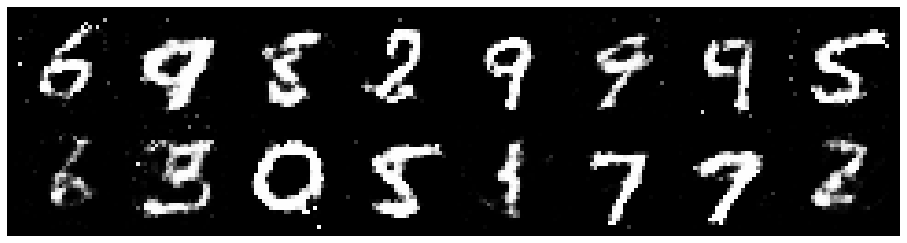

Epoch: [65/100], Batch Num: [300/700]
Discriminator Loss: 1.2862, Generator Loss: 0.9527
D(x): 0.5794, D(G(z)): 0.4559


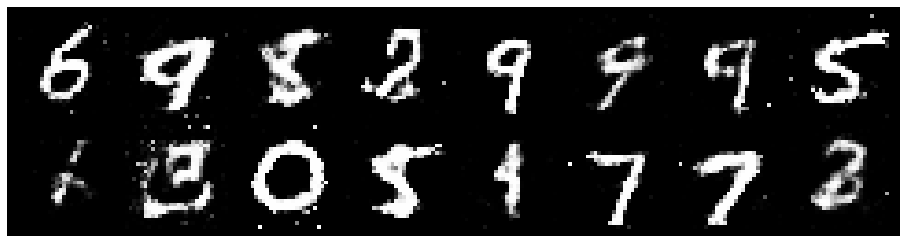

Epoch: [65/100], Batch Num: [400/700]
Discriminator Loss: 1.3154, Generator Loss: 0.8096
D(x): 0.5454, D(G(z)): 0.4585


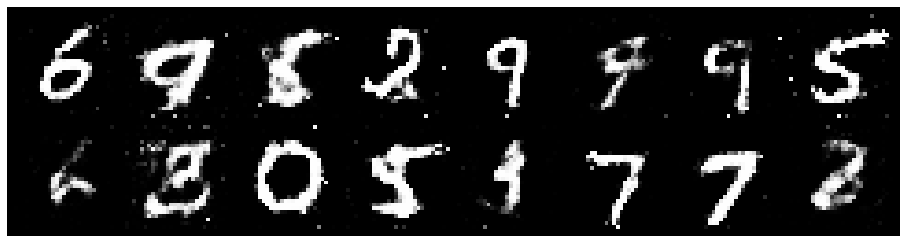

Epoch: [65/100], Batch Num: [500/700]
Discriminator Loss: 1.2479, Generator Loss: 0.9200
D(x): 0.5844, D(G(z)): 0.4538


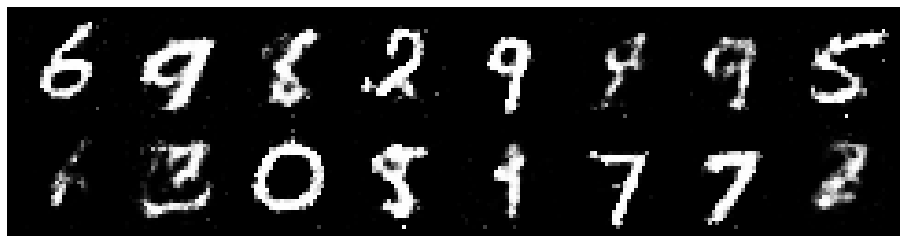

Epoch: [65/100], Batch Num: [600/700]
Discriminator Loss: 1.2301, Generator Loss: 0.9334
D(x): 0.5540, D(G(z)): 0.4254


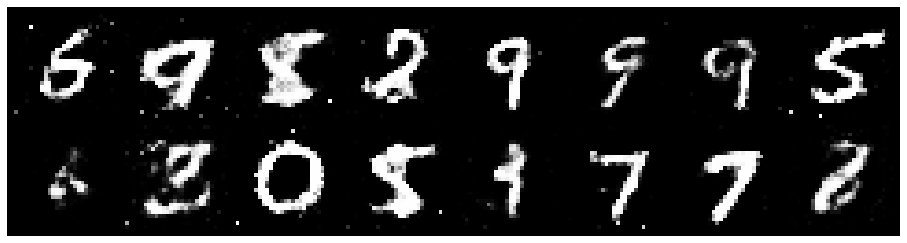

Epoch: [66/100], Batch Num: [0/700]
Discriminator Loss: 1.2468, Generator Loss: 0.8013
D(x): 0.5403, D(G(z)): 0.4425


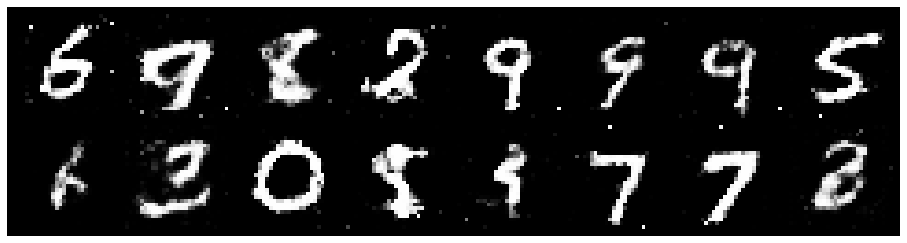

Epoch: [66/100], Batch Num: [100/700]
Discriminator Loss: 1.2538, Generator Loss: 1.0674
D(x): 0.5826, D(G(z)): 0.4257


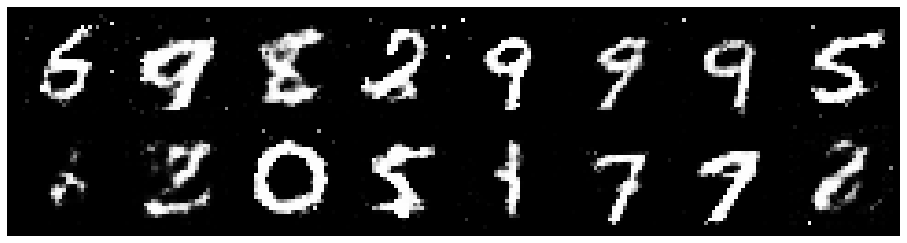

Epoch: [66/100], Batch Num: [200/700]
Discriminator Loss: 1.2792, Generator Loss: 0.8904
D(x): 0.6056, D(G(z)): 0.4578


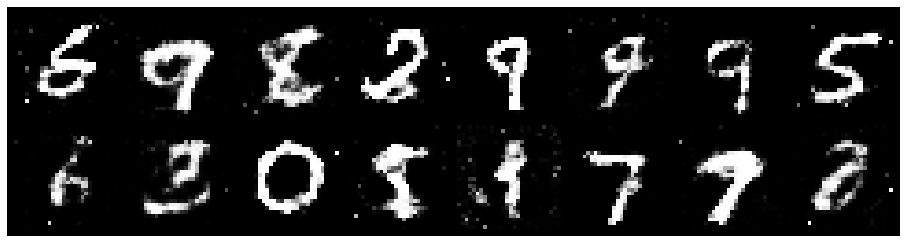

Epoch: [66/100], Batch Num: [300/700]
Discriminator Loss: 1.1335, Generator Loss: 0.9357
D(x): 0.6526, D(G(z)): 0.4440


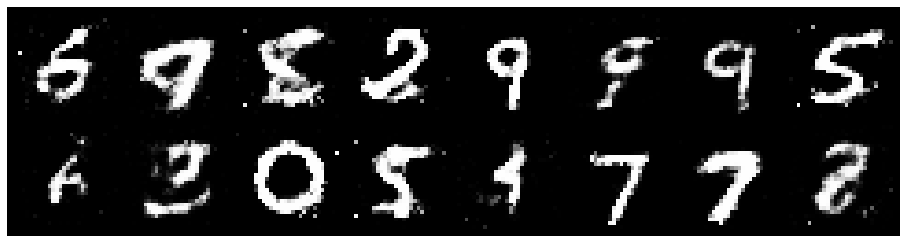

Epoch: [66/100], Batch Num: [400/700]
Discriminator Loss: 1.3106, Generator Loss: 0.9231
D(x): 0.5644, D(G(z)): 0.4601


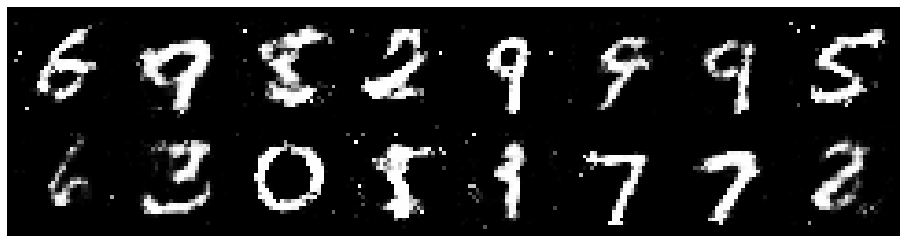

Epoch: [66/100], Batch Num: [500/700]
Discriminator Loss: 1.3255, Generator Loss: 0.9573
D(x): 0.5649, D(G(z)): 0.4752


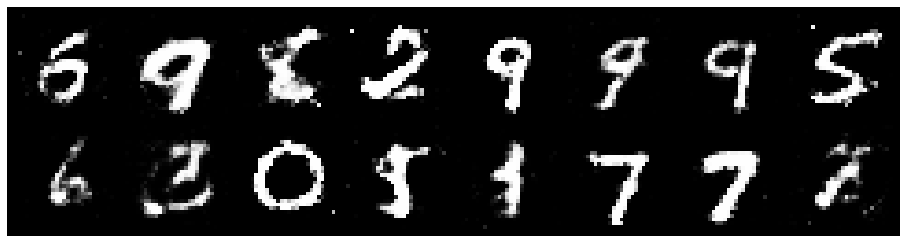

Epoch: [66/100], Batch Num: [600/700]
Discriminator Loss: 1.2065, Generator Loss: 0.8226
D(x): 0.5796, D(G(z)): 0.4472


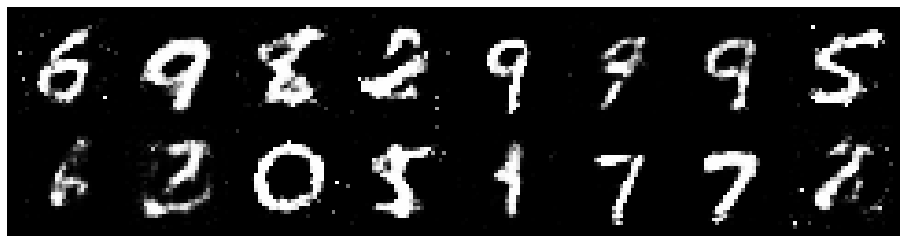

Epoch: [67/100], Batch Num: [0/700]
Discriminator Loss: 1.2540, Generator Loss: 0.8203
D(x): 0.5890, D(G(z)): 0.4675


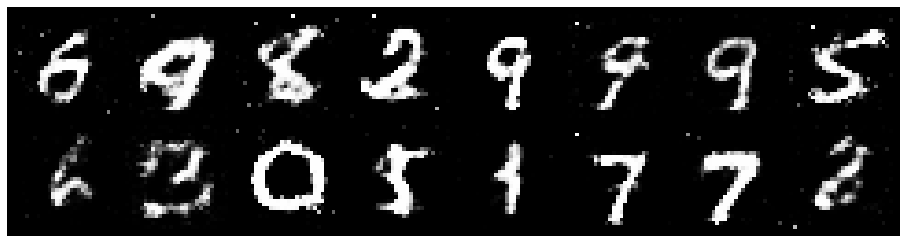

Epoch: [67/100], Batch Num: [100/700]
Discriminator Loss: 1.2967, Generator Loss: 0.8957
D(x): 0.6161, D(G(z)): 0.4983


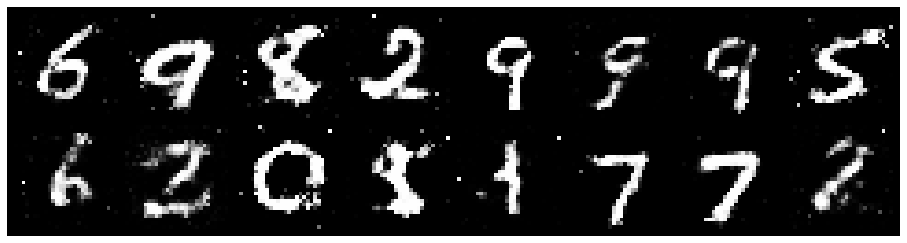

Epoch: [67/100], Batch Num: [200/700]
Discriminator Loss: 1.1192, Generator Loss: 0.9060
D(x): 0.6376, D(G(z)): 0.4411


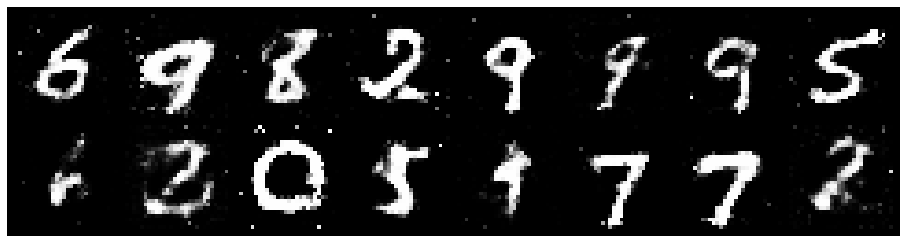

Epoch: [67/100], Batch Num: [300/700]
Discriminator Loss: 1.3219, Generator Loss: 0.9818
D(x): 0.5618, D(G(z)): 0.4502


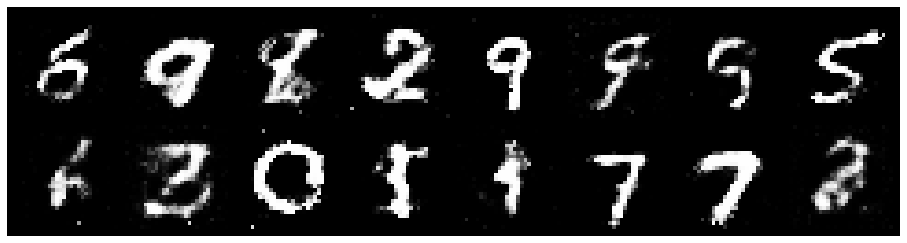

Epoch: [67/100], Batch Num: [400/700]
Discriminator Loss: 1.2283, Generator Loss: 1.1069
D(x): 0.5201, D(G(z)): 0.3641


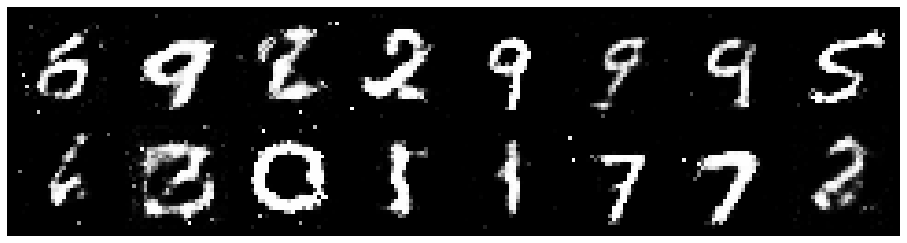

Epoch: [67/100], Batch Num: [500/700]
Discriminator Loss: 1.1934, Generator Loss: 1.0256
D(x): 0.5261, D(G(z)): 0.3510


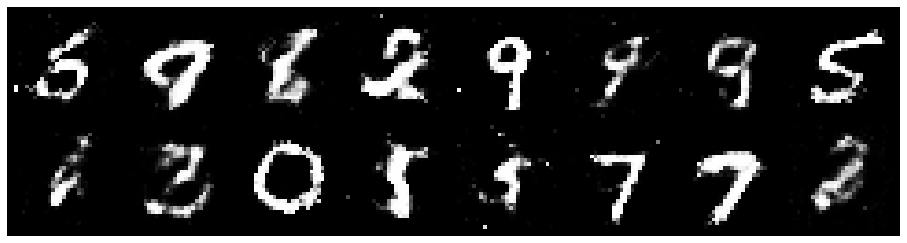

Epoch: [67/100], Batch Num: [600/700]
Discriminator Loss: 1.1925, Generator Loss: 0.9808
D(x): 0.6086, D(G(z)): 0.4440


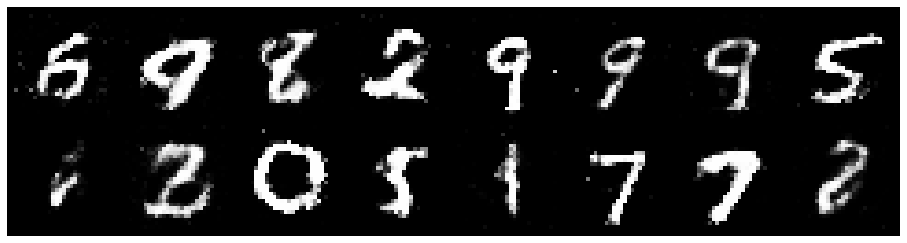

Epoch: [68/100], Batch Num: [0/700]
Discriminator Loss: 1.2154, Generator Loss: 0.9257
D(x): 0.5733, D(G(z)): 0.4253


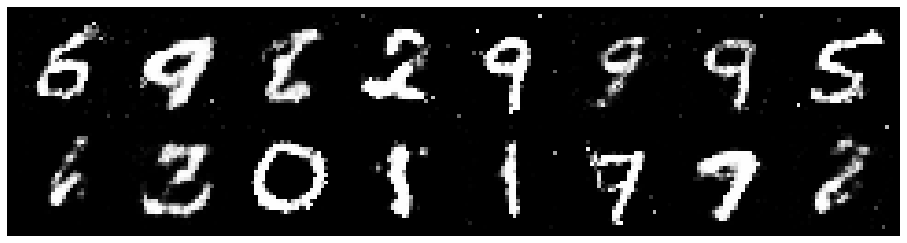

Epoch: [68/100], Batch Num: [100/700]
Discriminator Loss: 1.2266, Generator Loss: 1.0613
D(x): 0.5808, D(G(z)): 0.4246


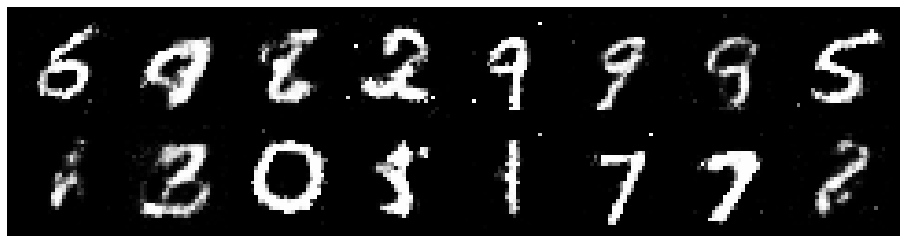

Epoch: [68/100], Batch Num: [200/700]
Discriminator Loss: 1.2086, Generator Loss: 0.8897
D(x): 0.5919, D(G(z)): 0.4461


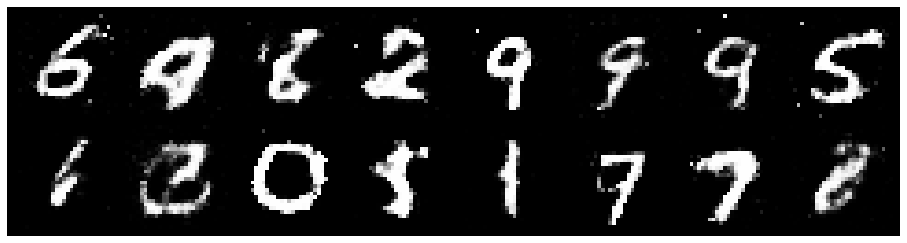

Epoch: [68/100], Batch Num: [300/700]
Discriminator Loss: 1.2427, Generator Loss: 0.9754
D(x): 0.5161, D(G(z)): 0.3926


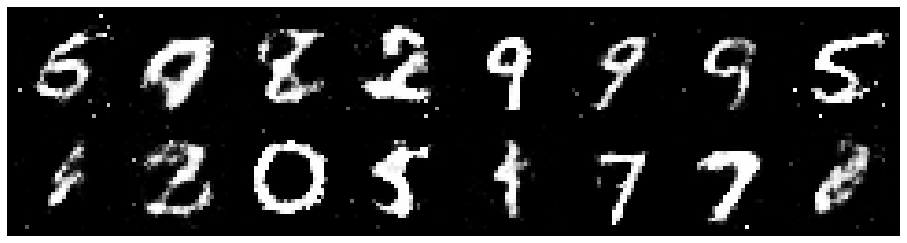

Epoch: [68/100], Batch Num: [400/700]
Discriminator Loss: 1.2606, Generator Loss: 0.9930
D(x): 0.5598, D(G(z)): 0.4369


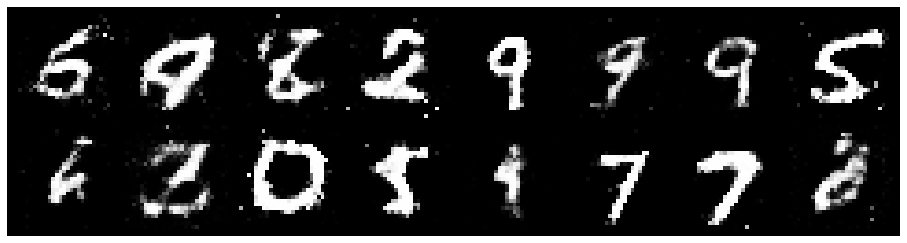

Epoch: [68/100], Batch Num: [500/700]
Discriminator Loss: 1.2706, Generator Loss: 0.9215
D(x): 0.5677, D(G(z)): 0.4348


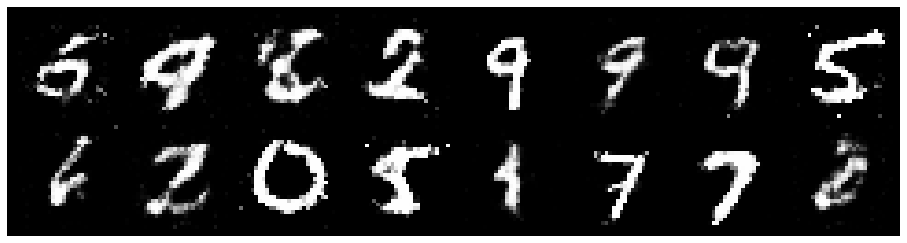

Epoch: [68/100], Batch Num: [600/700]
Discriminator Loss: 1.3398, Generator Loss: 0.8416
D(x): 0.5098, D(G(z)): 0.4287


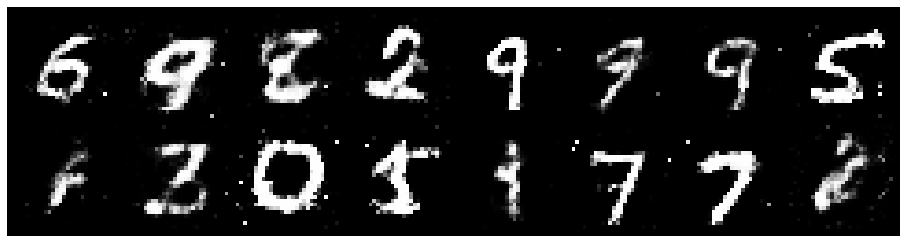

Epoch: [69/100], Batch Num: [0/700]
Discriminator Loss: 1.2270, Generator Loss: 0.8759
D(x): 0.6389, D(G(z)): 0.4766


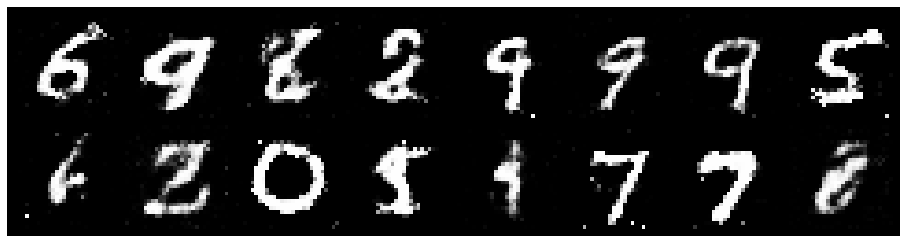

Epoch: [69/100], Batch Num: [100/700]
Discriminator Loss: 1.2973, Generator Loss: 0.9650
D(x): 0.5675, D(G(z)): 0.4590


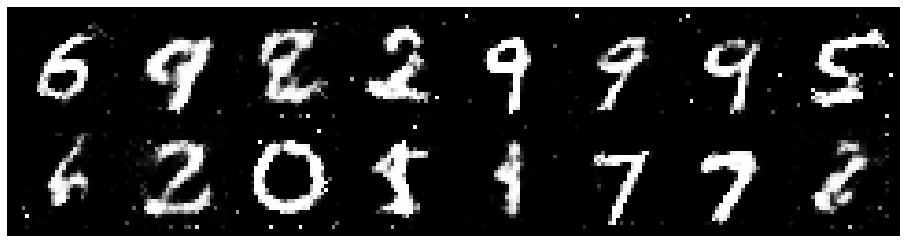

Epoch: [69/100], Batch Num: [200/700]
Discriminator Loss: 1.1392, Generator Loss: 1.1489
D(x): 0.5930, D(G(z)): 0.3842


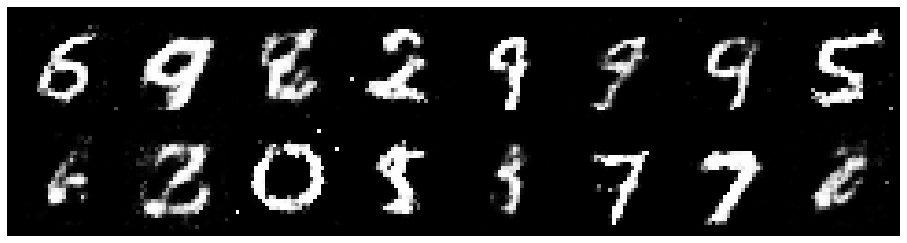

Epoch: [69/100], Batch Num: [300/700]
Discriminator Loss: 1.0991, Generator Loss: 1.0052
D(x): 0.6626, D(G(z)): 0.4054


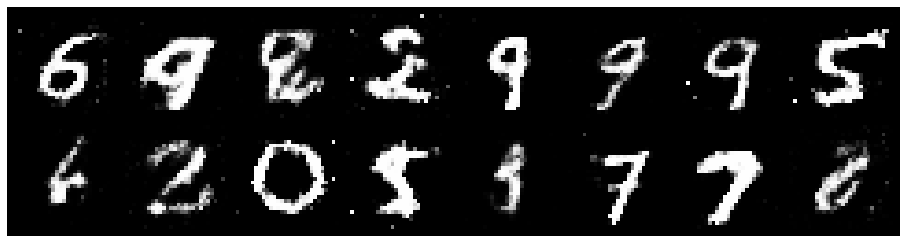

Epoch: [69/100], Batch Num: [400/700]
Discriminator Loss: 1.2277, Generator Loss: 0.8677
D(x): 0.5788, D(G(z)): 0.4402


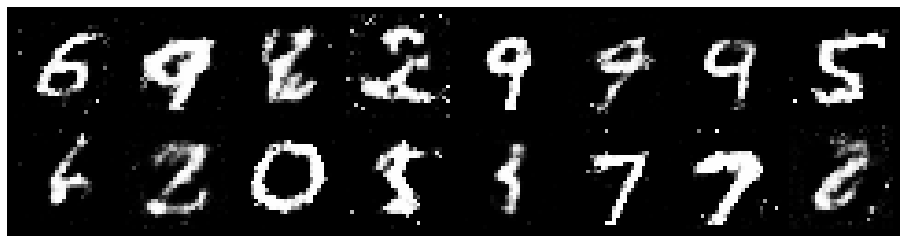

Epoch: [69/100], Batch Num: [500/700]
Discriminator Loss: 1.2180, Generator Loss: 0.8994
D(x): 0.5994, D(G(z)): 0.4454


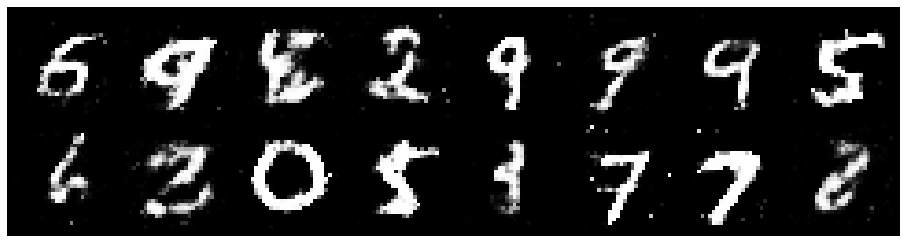

Epoch: [69/100], Batch Num: [600/700]
Discriminator Loss: 1.2483, Generator Loss: 0.8252
D(x): 0.6034, D(G(z)): 0.4694


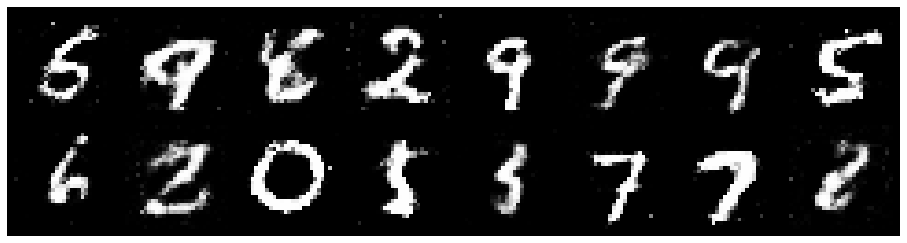

Epoch: [70/100], Batch Num: [0/700]
Discriminator Loss: 1.2737, Generator Loss: 0.8690
D(x): 0.5477, D(G(z)): 0.4536


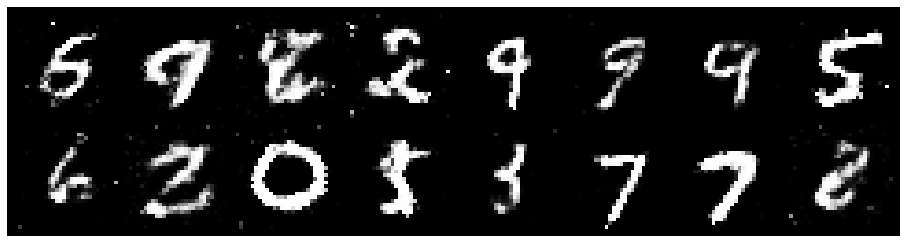

Epoch: [70/100], Batch Num: [100/700]
Discriminator Loss: 1.1739, Generator Loss: 1.1491
D(x): 0.5842, D(G(z)): 0.3933


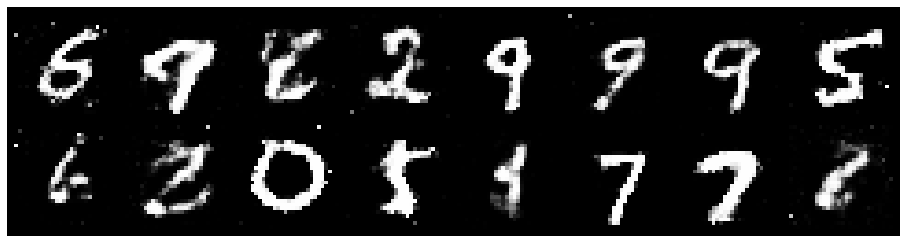

Epoch: [70/100], Batch Num: [200/700]
Discriminator Loss: 1.2209, Generator Loss: 1.0263
D(x): 0.5877, D(G(z)): 0.4036


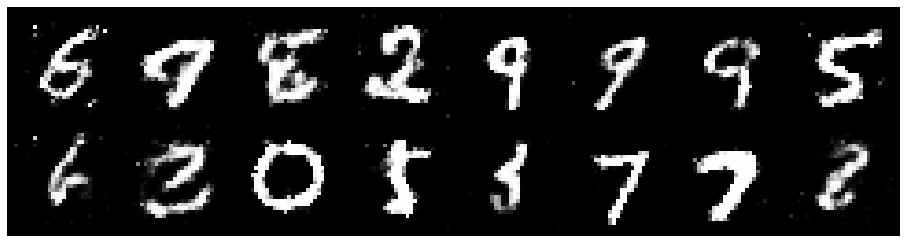

Epoch: [70/100], Batch Num: [300/700]
Discriminator Loss: 1.1821, Generator Loss: 0.9929
D(x): 0.5811, D(G(z)): 0.4020


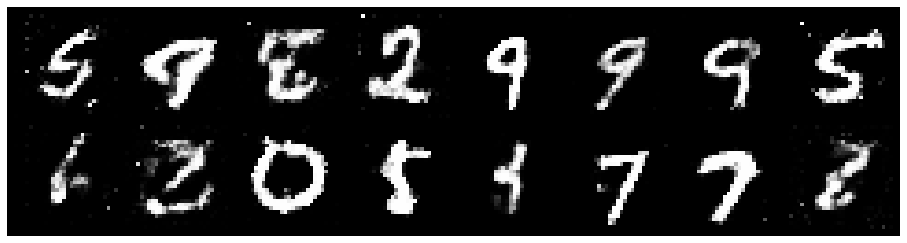

Epoch: [70/100], Batch Num: [400/700]
Discriminator Loss: 1.1245, Generator Loss: 1.0498
D(x): 0.6106, D(G(z)): 0.4026


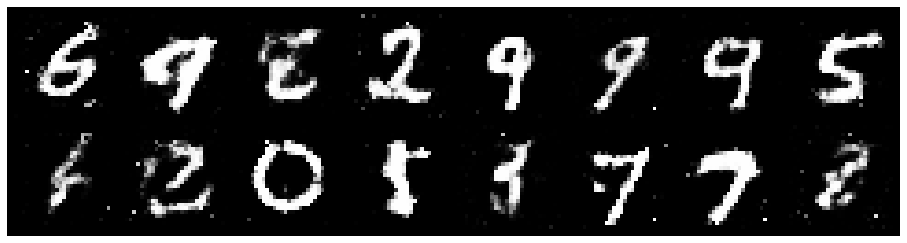

Epoch: [70/100], Batch Num: [500/700]
Discriminator Loss: 1.2100, Generator Loss: 1.0032
D(x): 0.5939, D(G(z)): 0.4367


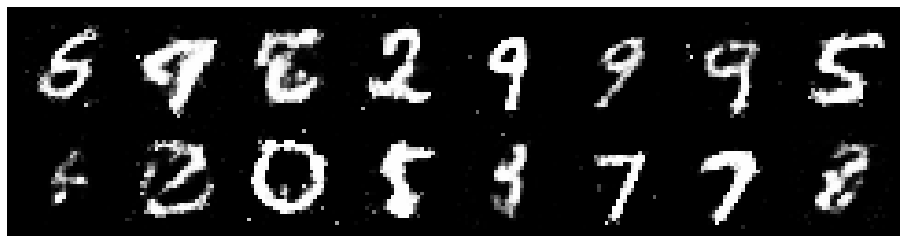

Epoch: [70/100], Batch Num: [600/700]
Discriminator Loss: 1.1396, Generator Loss: 1.0801
D(x): 0.5931, D(G(z)): 0.3920


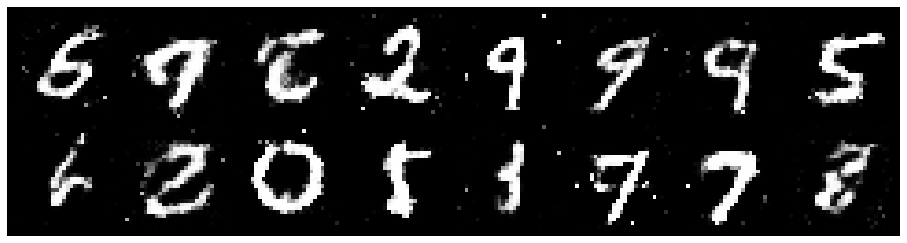

Epoch: [71/100], Batch Num: [0/700]
Discriminator Loss: 1.2068, Generator Loss: 1.1663
D(x): 0.5495, D(G(z)): 0.3910


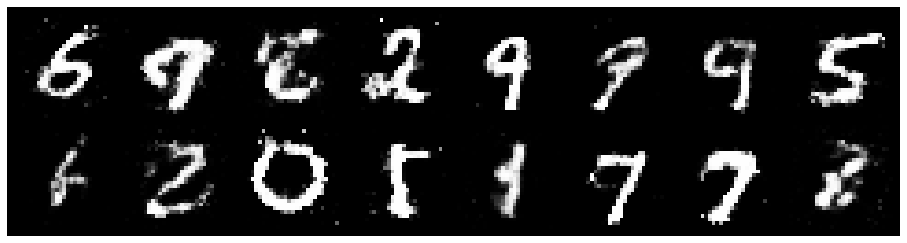

Epoch: [71/100], Batch Num: [100/700]
Discriminator Loss: 1.1960, Generator Loss: 1.2454
D(x): 0.5924, D(G(z)): 0.4107


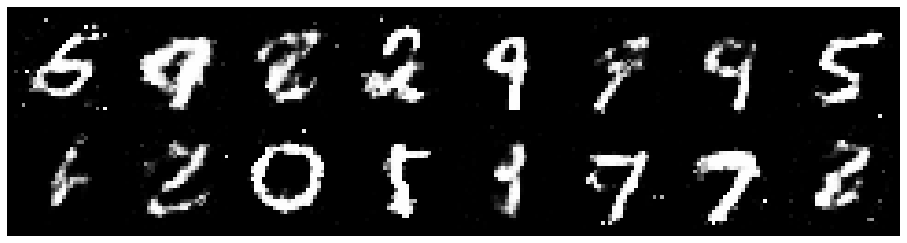

Epoch: [71/100], Batch Num: [200/700]
Discriminator Loss: 1.3042, Generator Loss: 0.8660
D(x): 0.5871, D(G(z)): 0.4843


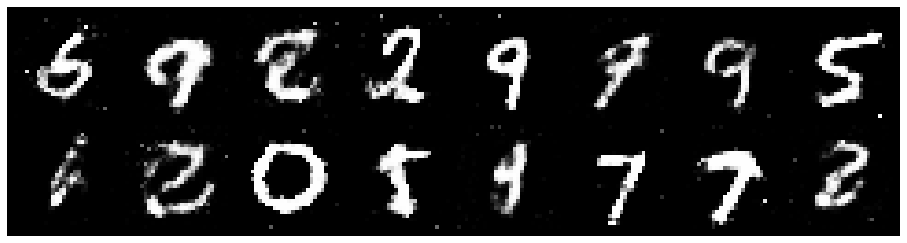

Epoch: [71/100], Batch Num: [300/700]
Discriminator Loss: 1.2448, Generator Loss: 0.8922
D(x): 0.5562, D(G(z)): 0.4302


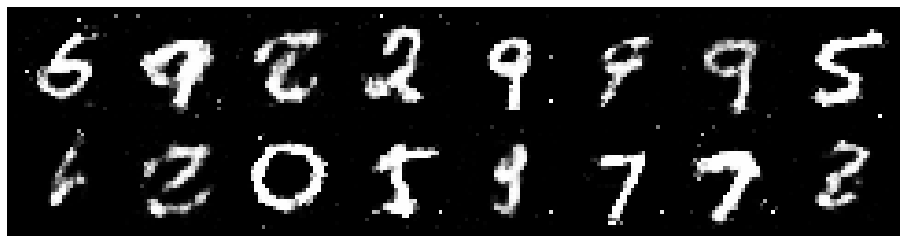

Epoch: [71/100], Batch Num: [400/700]
Discriminator Loss: 1.1948, Generator Loss: 0.8379
D(x): 0.6190, D(G(z)): 0.4643


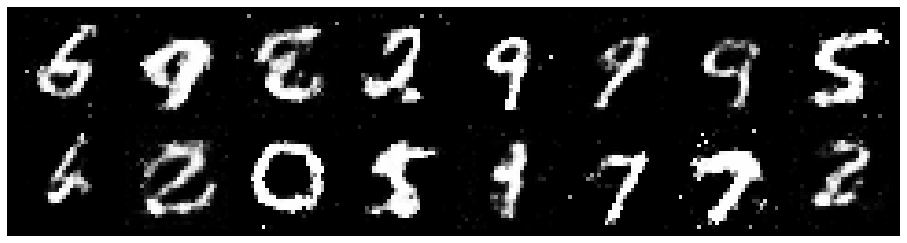

Epoch: [71/100], Batch Num: [500/700]
Discriminator Loss: 1.2673, Generator Loss: 0.9393
D(x): 0.5456, D(G(z)): 0.4335


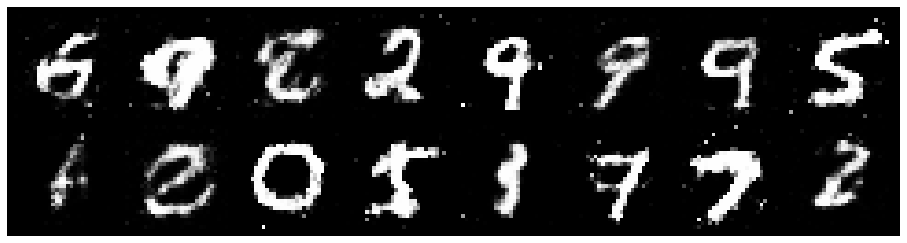

Epoch: [71/100], Batch Num: [600/700]
Discriminator Loss: 1.2784, Generator Loss: 0.8202
D(x): 0.5366, D(G(z)): 0.4539


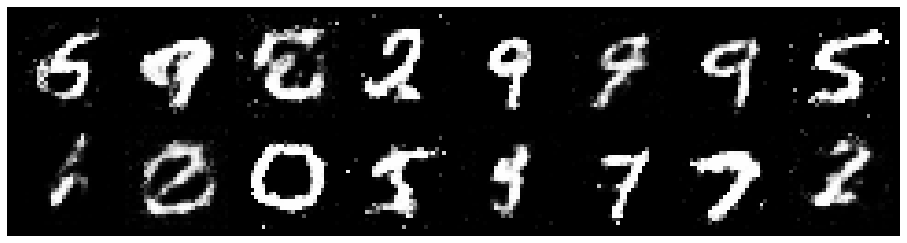

Epoch: [72/100], Batch Num: [0/700]
Discriminator Loss: 1.3652, Generator Loss: 0.9394
D(x): 0.5689, D(G(z)): 0.4597


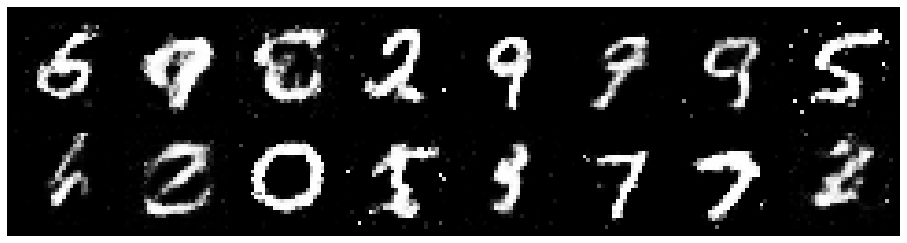

Epoch: [72/100], Batch Num: [100/700]
Discriminator Loss: 1.2226, Generator Loss: 0.9564
D(x): 0.5751, D(G(z)): 0.4185


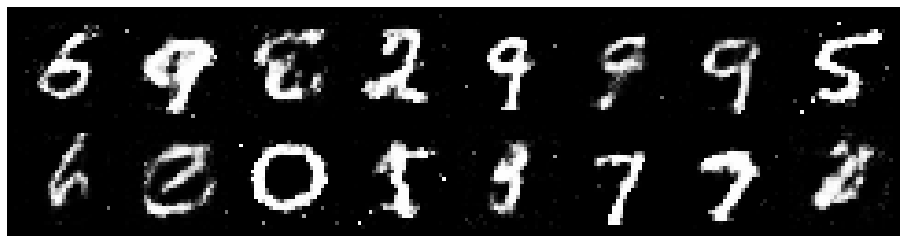

Epoch: [72/100], Batch Num: [200/700]
Discriminator Loss: 1.1755, Generator Loss: 1.0157
D(x): 0.5867, D(G(z)): 0.4107


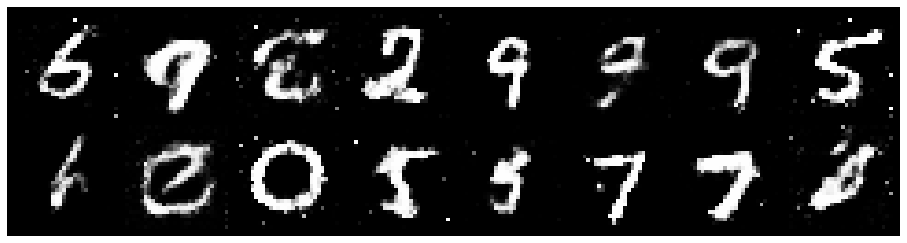

Epoch: [72/100], Batch Num: [300/700]
Discriminator Loss: 1.2368, Generator Loss: 1.0346
D(x): 0.5309, D(G(z)): 0.3764


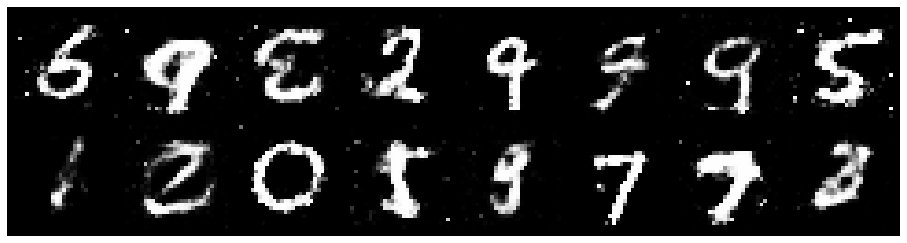

Epoch: [72/100], Batch Num: [400/700]
Discriminator Loss: 1.3110, Generator Loss: 0.9375
D(x): 0.5761, D(G(z)): 0.4316


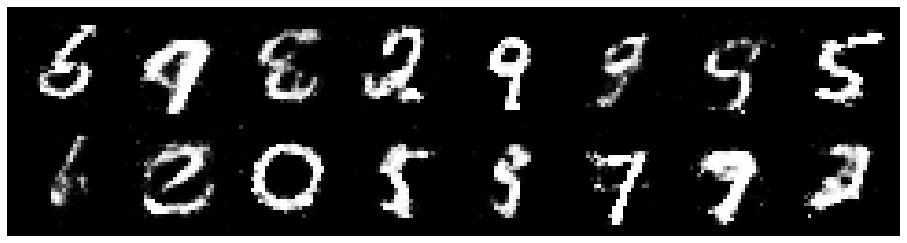

Epoch: [72/100], Batch Num: [500/700]
Discriminator Loss: 1.3567, Generator Loss: 1.0073
D(x): 0.5795, D(G(z)): 0.4818


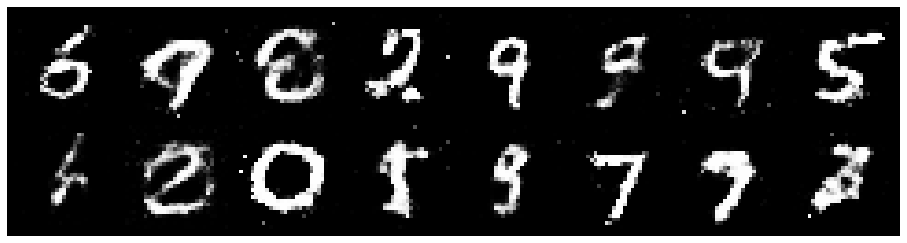

Epoch: [72/100], Batch Num: [600/700]
Discriminator Loss: 1.0767, Generator Loss: 1.1117
D(x): 0.6078, D(G(z)): 0.3656


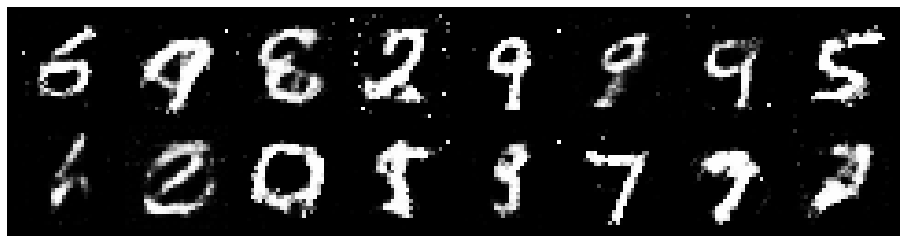

Epoch: [73/100], Batch Num: [0/700]
Discriminator Loss: 1.1475, Generator Loss: 0.8417
D(x): 0.6166, D(G(z)): 0.4244


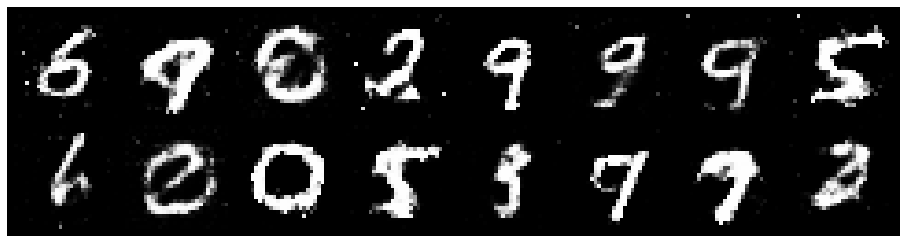

Epoch: [73/100], Batch Num: [100/700]
Discriminator Loss: 1.2372, Generator Loss: 0.9140
D(x): 0.5951, D(G(z)): 0.4720


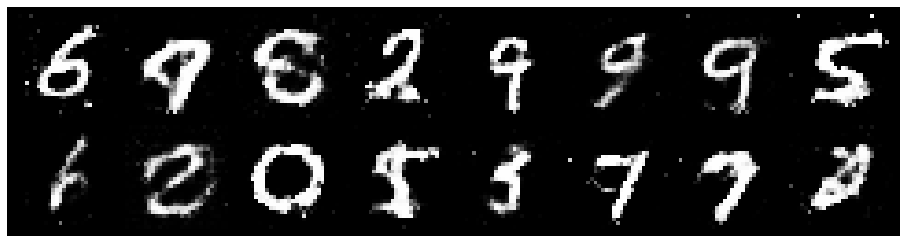

Epoch: [73/100], Batch Num: [200/700]
Discriminator Loss: 1.2083, Generator Loss: 1.1634
D(x): 0.6133, D(G(z)): 0.4510


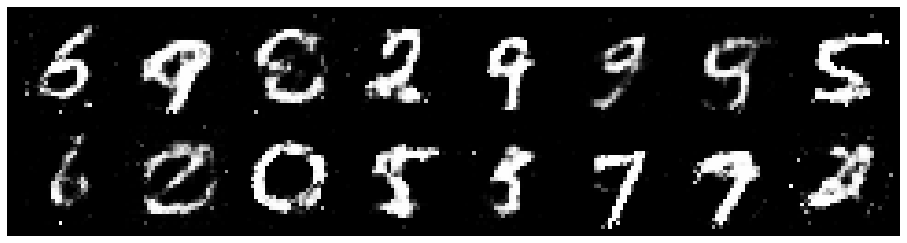

Epoch: [73/100], Batch Num: [300/700]
Discriminator Loss: 1.2392, Generator Loss: 0.8856
D(x): 0.5552, D(G(z)): 0.4368


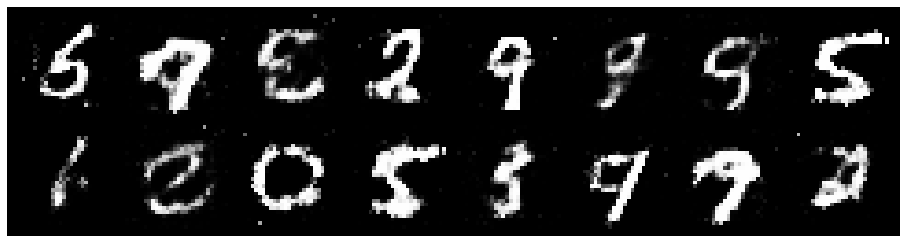

Epoch: [73/100], Batch Num: [400/700]
Discriminator Loss: 1.2413, Generator Loss: 0.8125
D(x): 0.5645, D(G(z)): 0.4355


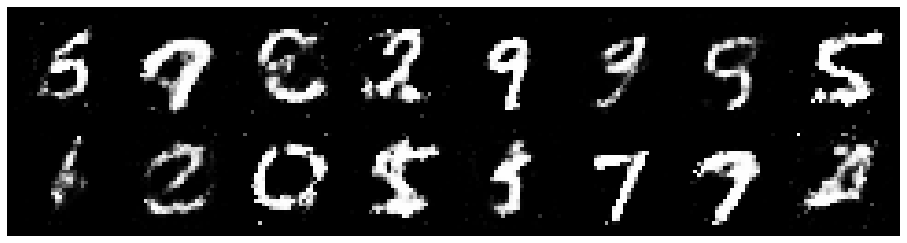

Epoch: [73/100], Batch Num: [500/700]
Discriminator Loss: 1.3464, Generator Loss: 0.8961
D(x): 0.5501, D(G(z)): 0.4683


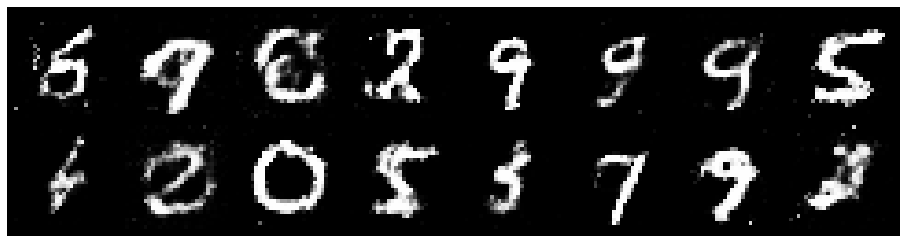

Epoch: [73/100], Batch Num: [600/700]
Discriminator Loss: 1.1366, Generator Loss: 0.8595
D(x): 0.5688, D(G(z)): 0.3994


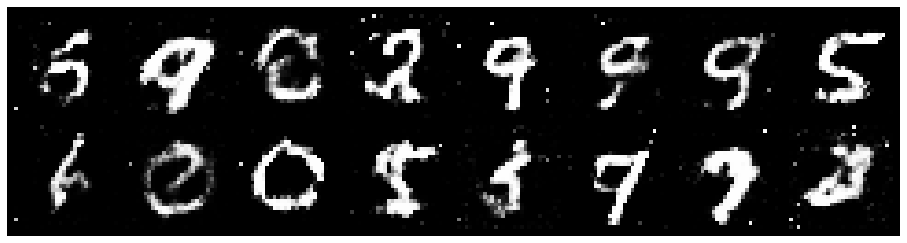

Epoch: [74/100], Batch Num: [0/700]
Discriminator Loss: 1.2299, Generator Loss: 0.9215
D(x): 0.6013, D(G(z)): 0.4608


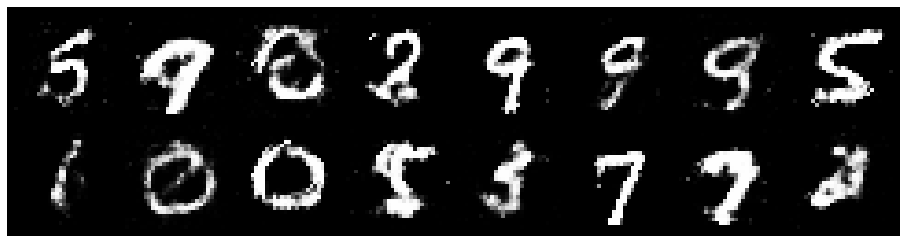

Epoch: [74/100], Batch Num: [100/700]
Discriminator Loss: 1.1505, Generator Loss: 1.0098
D(x): 0.5933, D(G(z)): 0.3904


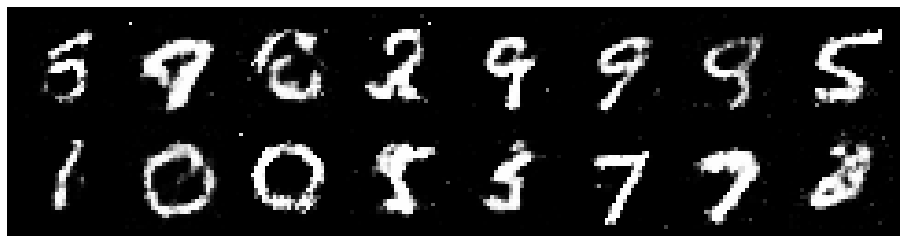

Epoch: [74/100], Batch Num: [200/700]
Discriminator Loss: 1.2105, Generator Loss: 0.9256
D(x): 0.5992, D(G(z)): 0.4468


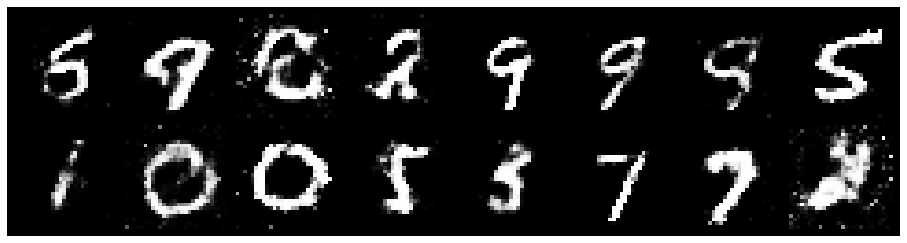

Epoch: [74/100], Batch Num: [300/700]
Discriminator Loss: 1.2335, Generator Loss: 0.9524
D(x): 0.5599, D(G(z)): 0.4304


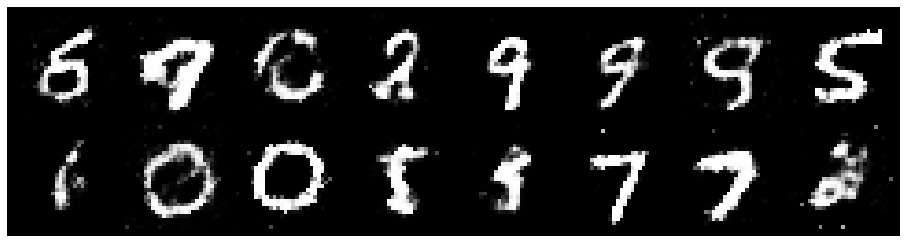

Epoch: [74/100], Batch Num: [400/700]
Discriminator Loss: 1.2327, Generator Loss: 0.9156
D(x): 0.5695, D(G(z)): 0.4416


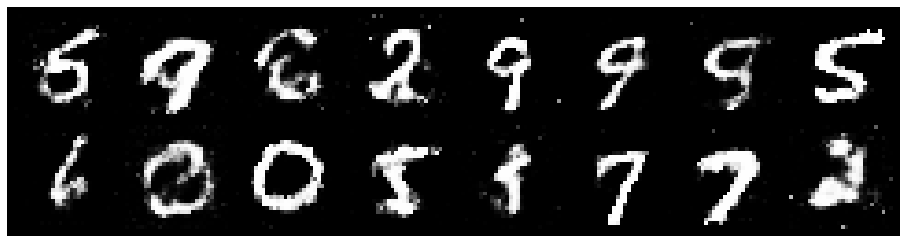

Epoch: [74/100], Batch Num: [500/700]
Discriminator Loss: 1.1923, Generator Loss: 0.8703
D(x): 0.6189, D(G(z)): 0.4554


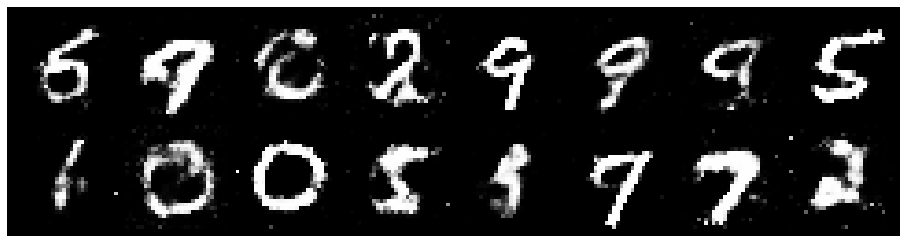

Epoch: [74/100], Batch Num: [600/700]
Discriminator Loss: 1.3943, Generator Loss: 0.8494
D(x): 0.5122, D(G(z)): 0.4695


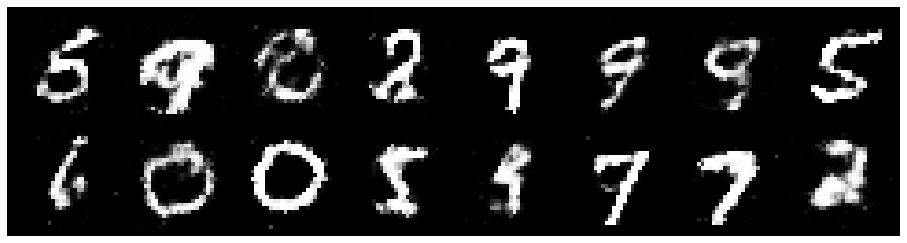

Epoch: [75/100], Batch Num: [0/700]
Discriminator Loss: 1.3232, Generator Loss: 0.8274
D(x): 0.5504, D(G(z)): 0.4520


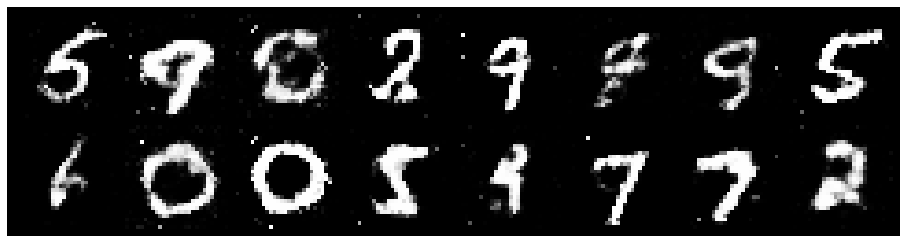

Epoch: [75/100], Batch Num: [100/700]
Discriminator Loss: 1.2871, Generator Loss: 0.8316
D(x): 0.5752, D(G(z)): 0.4704


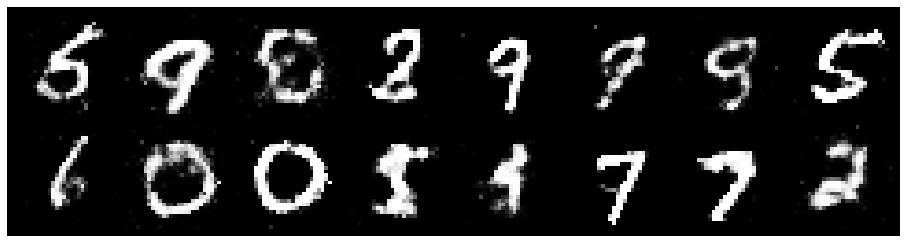

Epoch: [75/100], Batch Num: [200/700]
Discriminator Loss: 1.2066, Generator Loss: 1.0831
D(x): 0.5515, D(G(z)): 0.3842


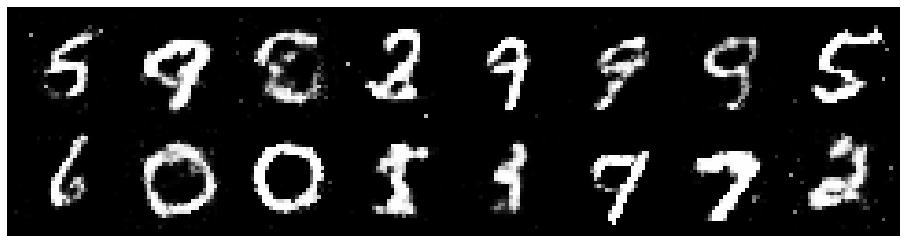

Epoch: [75/100], Batch Num: [300/700]
Discriminator Loss: 1.2542, Generator Loss: 1.1201
D(x): 0.5792, D(G(z)): 0.4250


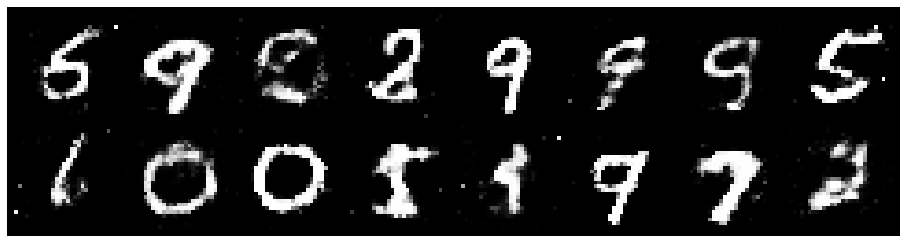

Epoch: [75/100], Batch Num: [400/700]
Discriminator Loss: 1.1986, Generator Loss: 1.0624
D(x): 0.5922, D(G(z)): 0.4311


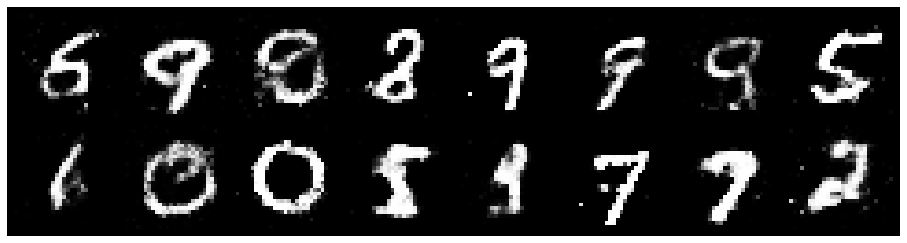

Epoch: [75/100], Batch Num: [500/700]
Discriminator Loss: 1.0858, Generator Loss: 1.1444
D(x): 0.6041, D(G(z)): 0.3809


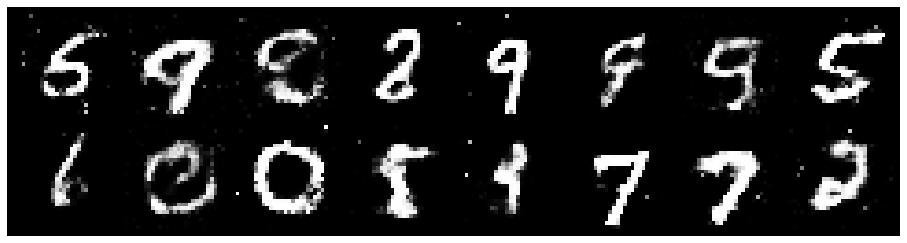

Epoch: [75/100], Batch Num: [600/700]
Discriminator Loss: 1.3021, Generator Loss: 0.7962
D(x): 0.5901, D(G(z)): 0.4842


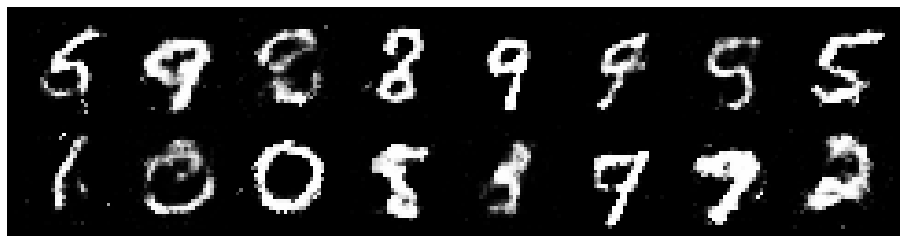

Epoch: [76/100], Batch Num: [0/700]
Discriminator Loss: 1.2139, Generator Loss: 0.9572
D(x): 0.5704, D(G(z)): 0.4253


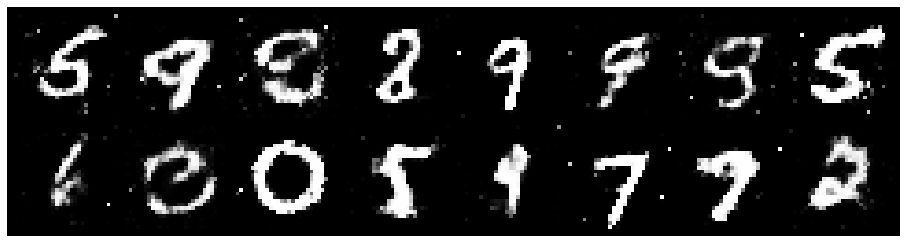

Epoch: [76/100], Batch Num: [100/700]
Discriminator Loss: 1.2669, Generator Loss: 1.0630
D(x): 0.5735, D(G(z)): 0.4167


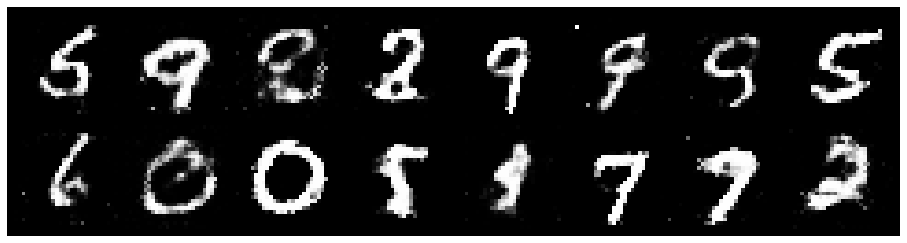

Epoch: [76/100], Batch Num: [200/700]
Discriminator Loss: 1.2940, Generator Loss: 0.9054
D(x): 0.5765, D(G(z)): 0.4587


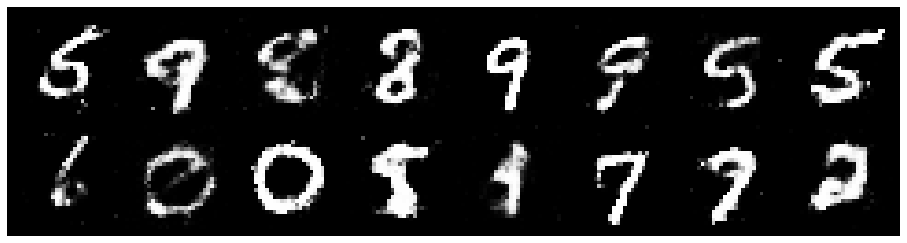

Epoch: [76/100], Batch Num: [300/700]
Discriminator Loss: 1.3150, Generator Loss: 0.8012
D(x): 0.5892, D(G(z)): 0.4909


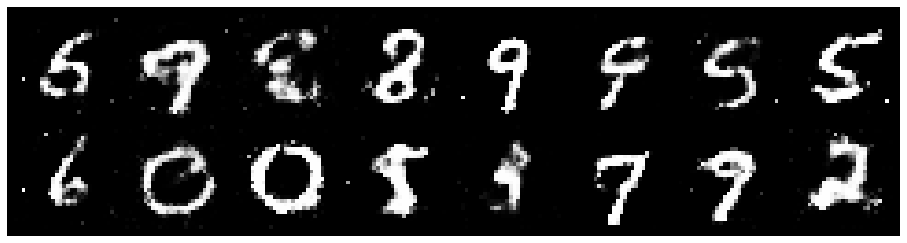

Epoch: [76/100], Batch Num: [400/700]
Discriminator Loss: 1.3425, Generator Loss: 1.0056
D(x): 0.5648, D(G(z)): 0.4571


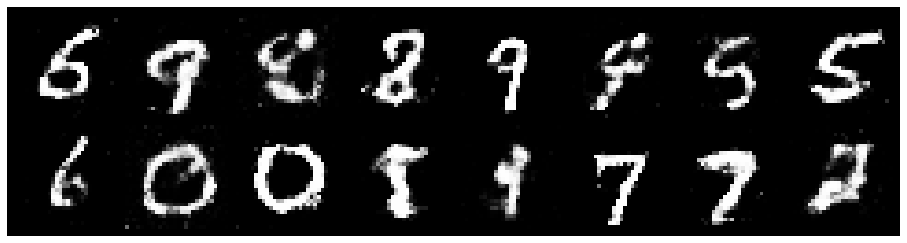

Epoch: [76/100], Batch Num: [500/700]
Discriminator Loss: 1.2071, Generator Loss: 0.9006
D(x): 0.5515, D(G(z)): 0.4003


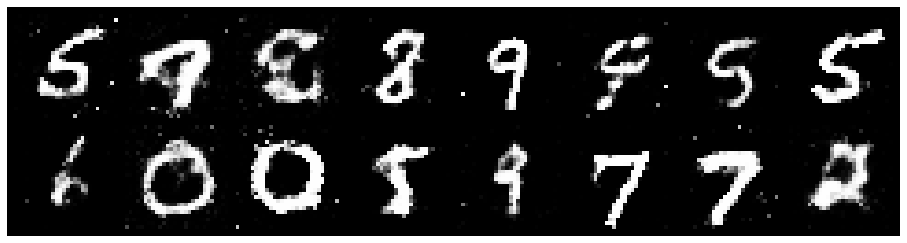

Epoch: [76/100], Batch Num: [600/700]
Discriminator Loss: 1.1149, Generator Loss: 1.1460
D(x): 0.6297, D(G(z)): 0.3949


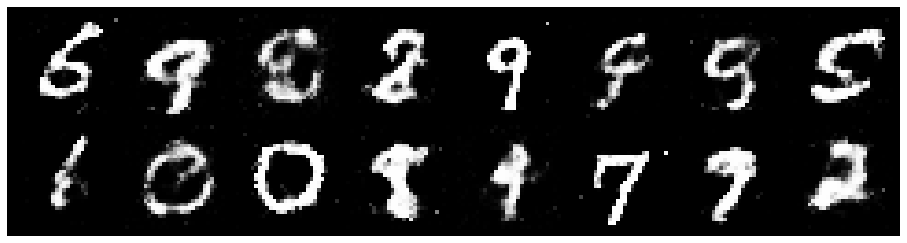

Epoch: [77/100], Batch Num: [0/700]
Discriminator Loss: 1.1423, Generator Loss: 0.9566
D(x): 0.5974, D(G(z)): 0.3996


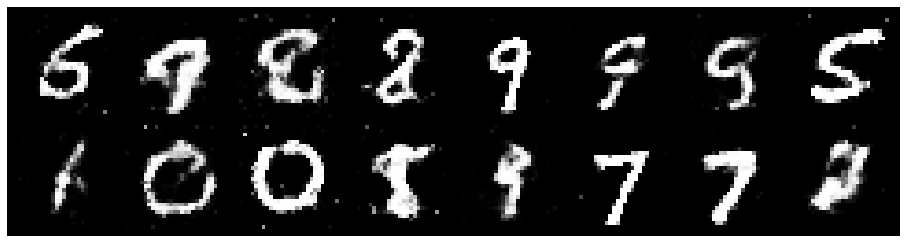

Epoch: [77/100], Batch Num: [100/700]
Discriminator Loss: 1.3001, Generator Loss: 0.8901
D(x): 0.5813, D(G(z)): 0.4735


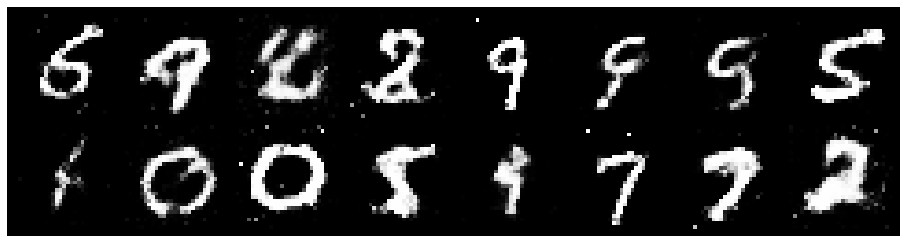

Epoch: [77/100], Batch Num: [200/700]
Discriminator Loss: 1.1906, Generator Loss: 0.8154
D(x): 0.5931, D(G(z)): 0.4174


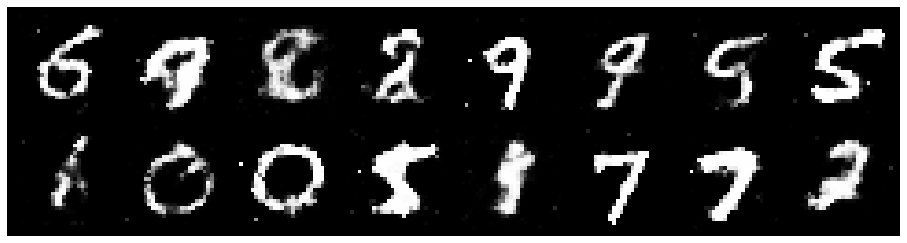

Epoch: [77/100], Batch Num: [300/700]
Discriminator Loss: 1.1946, Generator Loss: 0.9215
D(x): 0.6318, D(G(z)): 0.4354


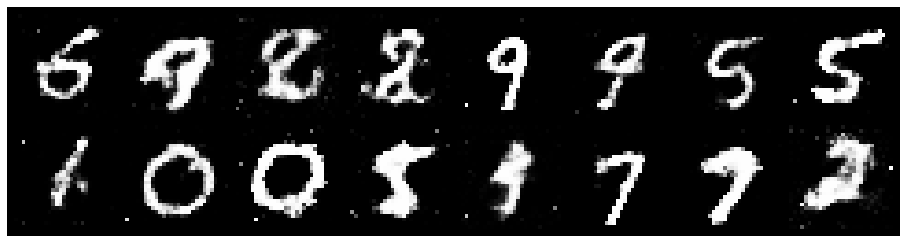

Epoch: [77/100], Batch Num: [400/700]
Discriminator Loss: 1.2729, Generator Loss: 0.9598
D(x): 0.5844, D(G(z)): 0.4449


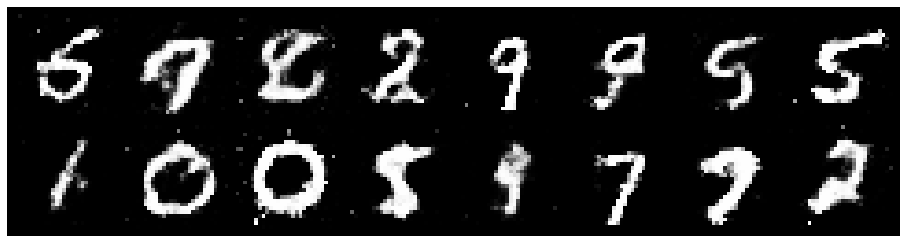

Epoch: [77/100], Batch Num: [500/700]
Discriminator Loss: 1.1351, Generator Loss: 1.0312
D(x): 0.6033, D(G(z)): 0.3967


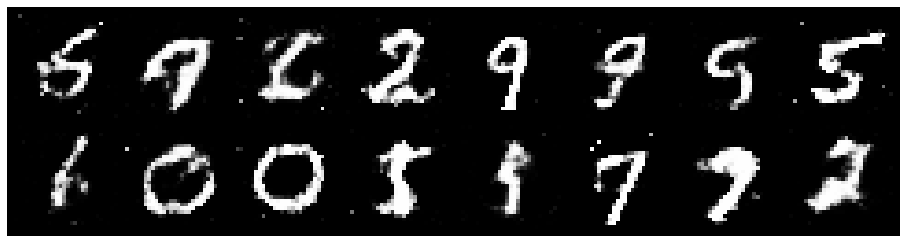

Epoch: [77/100], Batch Num: [600/700]
Discriminator Loss: 1.1890, Generator Loss: 1.0153
D(x): 0.5747, D(G(z)): 0.3891


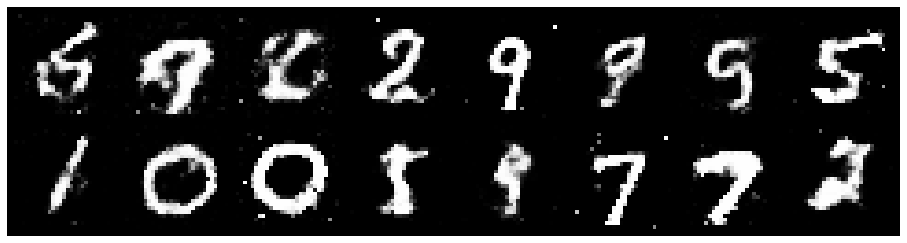

Epoch: [78/100], Batch Num: [0/700]
Discriminator Loss: 1.3062, Generator Loss: 0.9634
D(x): 0.5660, D(G(z)): 0.4545


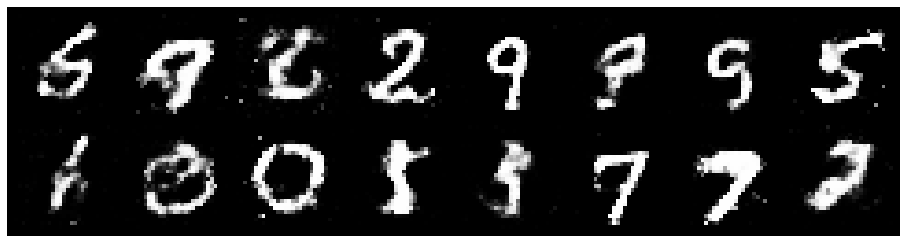

Epoch: [78/100], Batch Num: [100/700]
Discriminator Loss: 1.1642, Generator Loss: 1.0500
D(x): 0.6139, D(G(z)): 0.4242


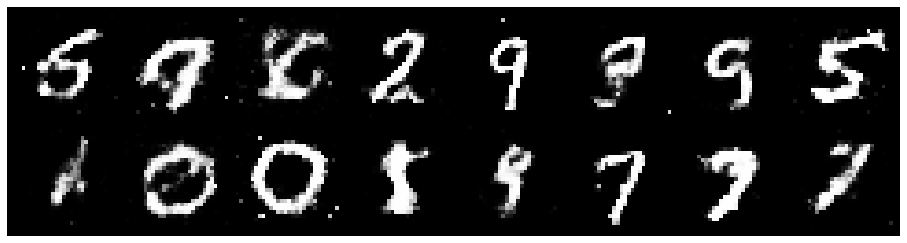

Epoch: [78/100], Batch Num: [200/700]
Discriminator Loss: 1.1349, Generator Loss: 1.1100
D(x): 0.5785, D(G(z)): 0.3884


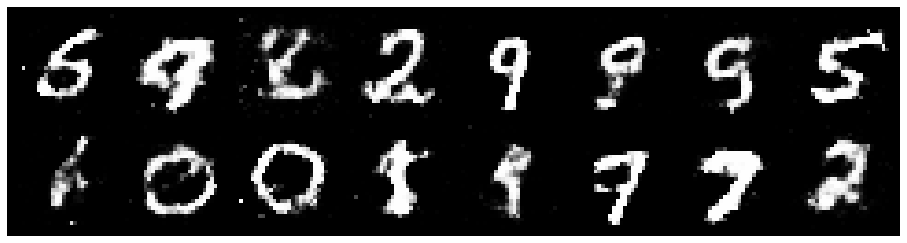

Epoch: [78/100], Batch Num: [300/700]
Discriminator Loss: 1.3261, Generator Loss: 0.8897
D(x): 0.5562, D(G(z)): 0.4623


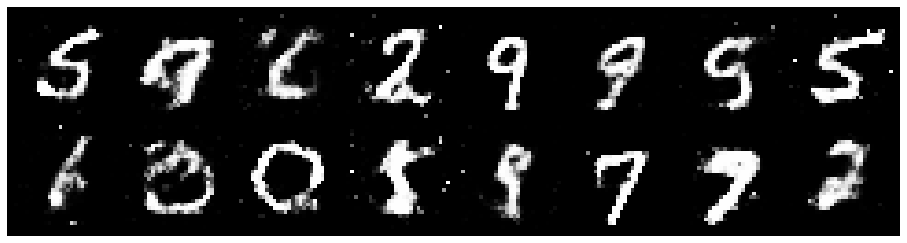

Epoch: [78/100], Batch Num: [400/700]
Discriminator Loss: 1.2647, Generator Loss: 0.8127
D(x): 0.5711, D(G(z)): 0.4619


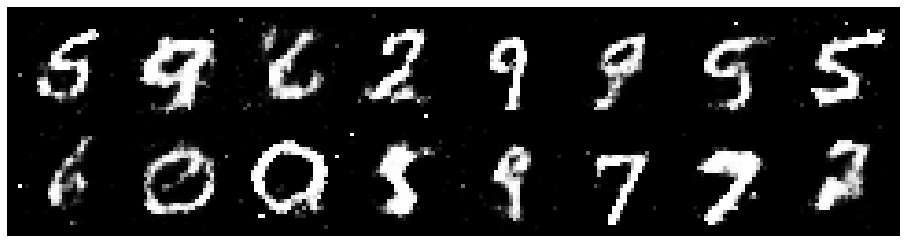

Epoch: [78/100], Batch Num: [500/700]
Discriminator Loss: 1.2493, Generator Loss: 1.0541
D(x): 0.5610, D(G(z)): 0.4087


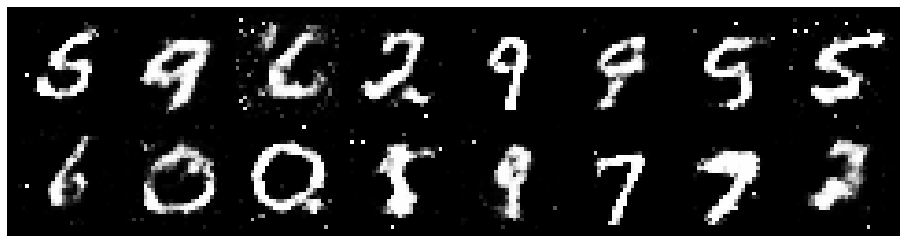

Epoch: [78/100], Batch Num: [600/700]
Discriminator Loss: 1.2619, Generator Loss: 0.9111
D(x): 0.5890, D(G(z)): 0.4735


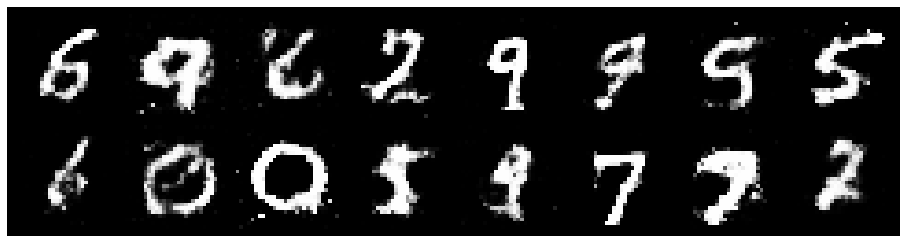

Epoch: [79/100], Batch Num: [0/700]
Discriminator Loss: 1.2808, Generator Loss: 0.8481
D(x): 0.5418, D(G(z)): 0.4506


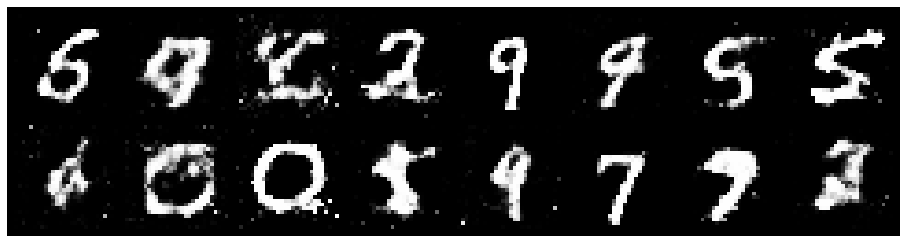

Epoch: [79/100], Batch Num: [100/700]
Discriminator Loss: 1.2662, Generator Loss: 0.8417
D(x): 0.5500, D(G(z)): 0.4530


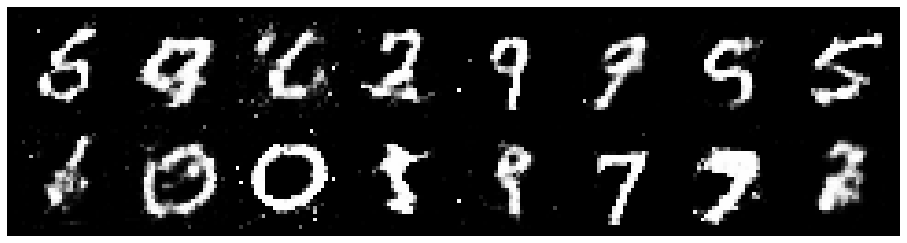

Epoch: [79/100], Batch Num: [200/700]
Discriminator Loss: 1.2495, Generator Loss: 0.9895
D(x): 0.5894, D(G(z)): 0.4548


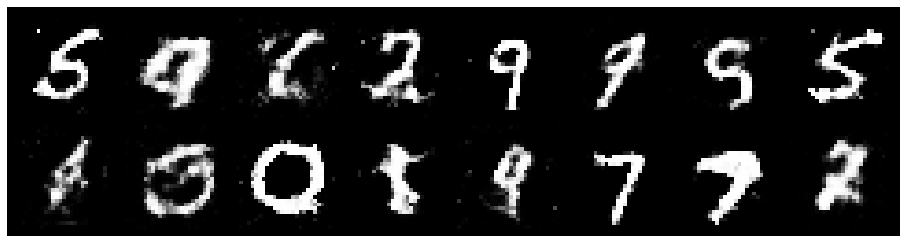

Epoch: [79/100], Batch Num: [300/700]
Discriminator Loss: 1.2749, Generator Loss: 0.9441
D(x): 0.5460, D(G(z)): 0.4392


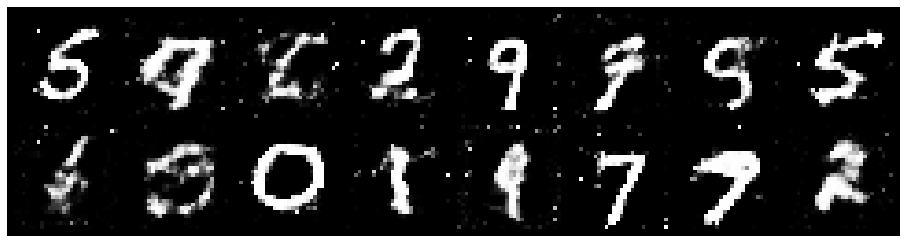

Epoch: [79/100], Batch Num: [400/700]
Discriminator Loss: 1.2074, Generator Loss: 1.0511
D(x): 0.5636, D(G(z)): 0.4092


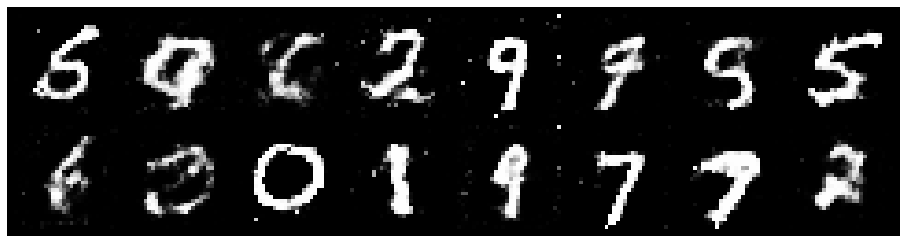

Epoch: [79/100], Batch Num: [500/700]
Discriminator Loss: 1.2163, Generator Loss: 1.1466
D(x): 0.5703, D(G(z)): 0.3932


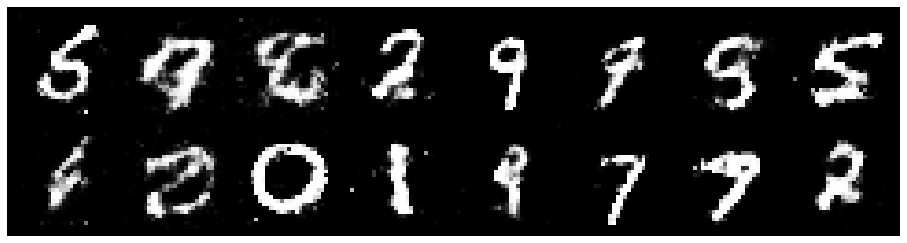

Epoch: [79/100], Batch Num: [600/700]
Discriminator Loss: 1.2361, Generator Loss: 0.8414
D(x): 0.5717, D(G(z)): 0.4585


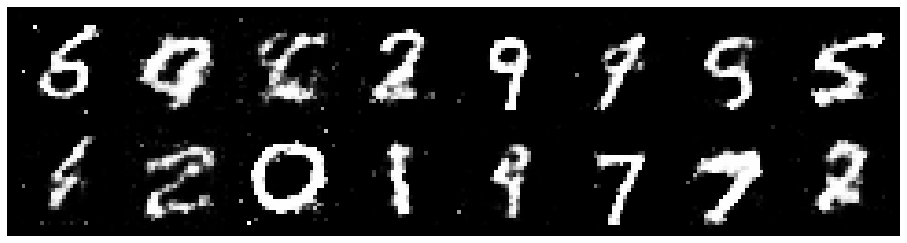

Epoch: [80/100], Batch Num: [0/700]
Discriminator Loss: 1.2896, Generator Loss: 0.9536
D(x): 0.5239, D(G(z)): 0.4024


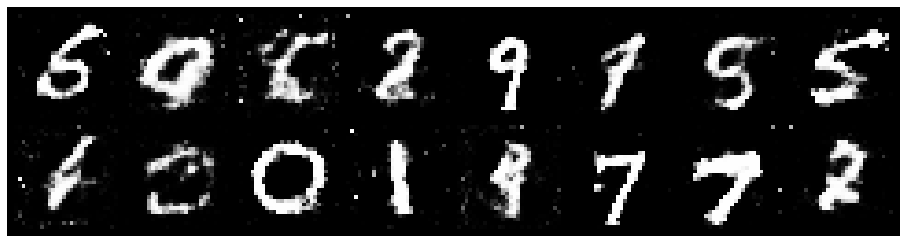

Epoch: [80/100], Batch Num: [100/700]
Discriminator Loss: 1.2932, Generator Loss: 0.9480
D(x): 0.5842, D(G(z)): 0.4668


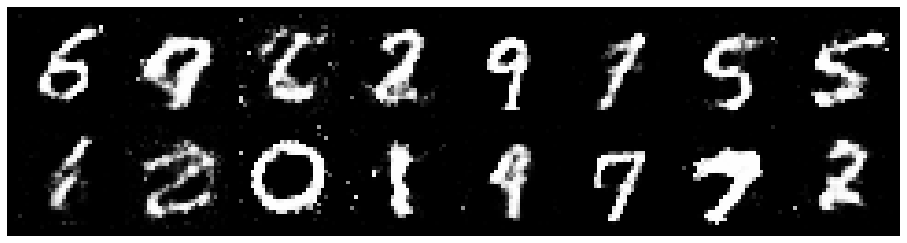

Epoch: [80/100], Batch Num: [200/700]
Discriminator Loss: 1.3097, Generator Loss: 0.8849
D(x): 0.5286, D(G(z)): 0.4431


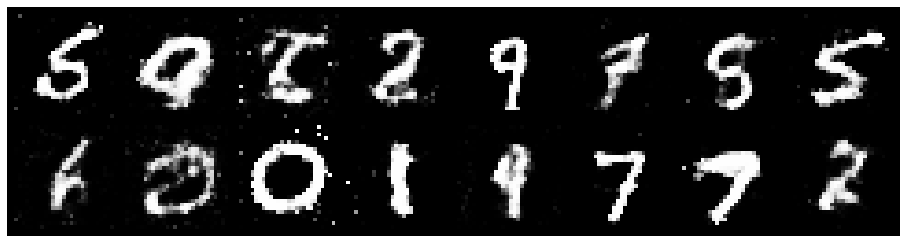

Epoch: [80/100], Batch Num: [300/700]
Discriminator Loss: 1.3753, Generator Loss: 0.9637
D(x): 0.5444, D(G(z)): 0.4713


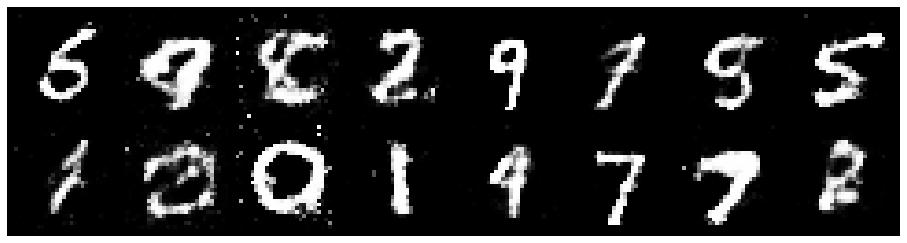

Epoch: [80/100], Batch Num: [400/700]
Discriminator Loss: 1.3478, Generator Loss: 0.8180
D(x): 0.5206, D(G(z)): 0.4502


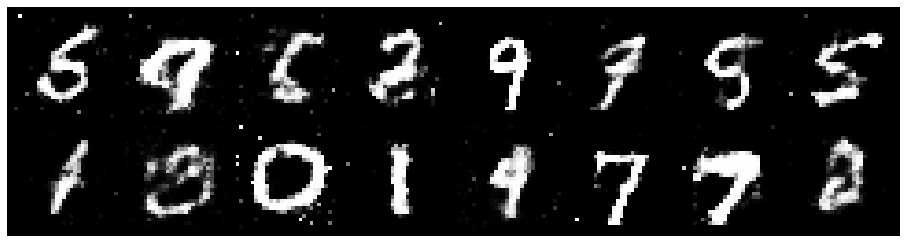

Epoch: [80/100], Batch Num: [500/700]
Discriminator Loss: 1.2426, Generator Loss: 0.9312
D(x): 0.5538, D(G(z)): 0.4082


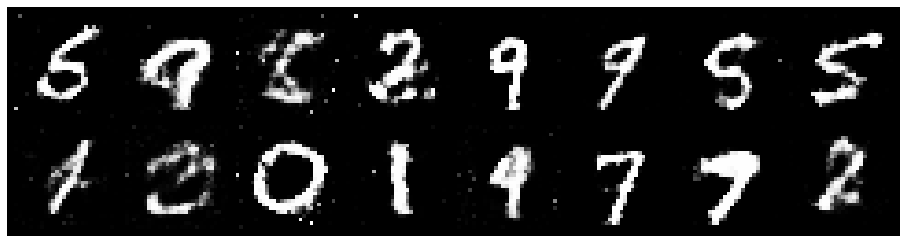

Epoch: [80/100], Batch Num: [600/700]
Discriminator Loss: 1.2377, Generator Loss: 0.7962
D(x): 0.6025, D(G(z)): 0.4590


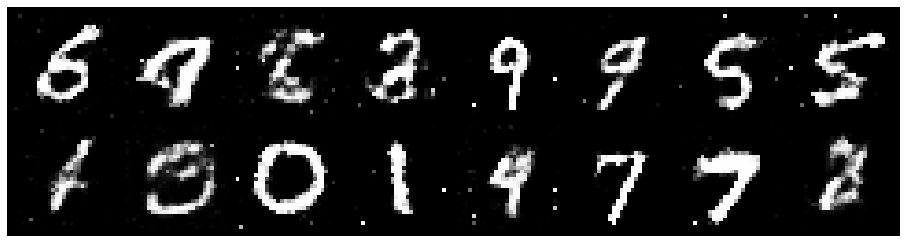

Epoch: [81/100], Batch Num: [0/700]
Discriminator Loss: 1.1876, Generator Loss: 0.9825
D(x): 0.5954, D(G(z)): 0.4371


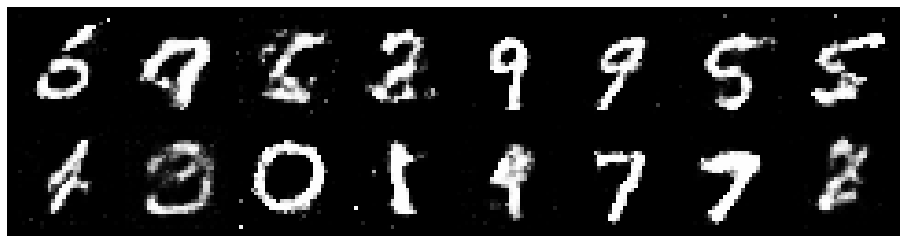

Epoch: [81/100], Batch Num: [100/700]
Discriminator Loss: 1.2368, Generator Loss: 0.9424
D(x): 0.5517, D(G(z)): 0.4059


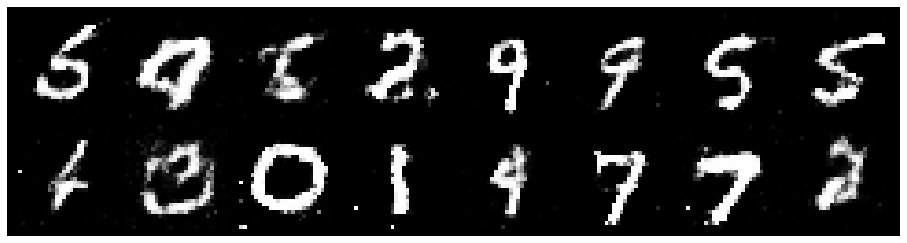

Epoch: [81/100], Batch Num: [200/700]
Discriminator Loss: 1.2401, Generator Loss: 1.0199
D(x): 0.5694, D(G(z)): 0.4225


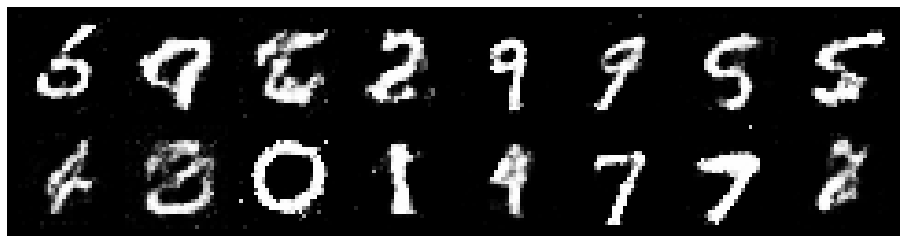

Epoch: [81/100], Batch Num: [300/700]
Discriminator Loss: 1.4202, Generator Loss: 1.0960
D(x): 0.5358, D(G(z)): 0.4426


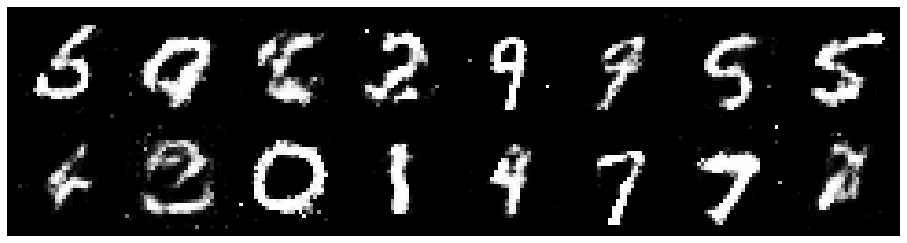

Epoch: [81/100], Batch Num: [400/700]
Discriminator Loss: 1.2531, Generator Loss: 1.0407
D(x): 0.5846, D(G(z)): 0.4319


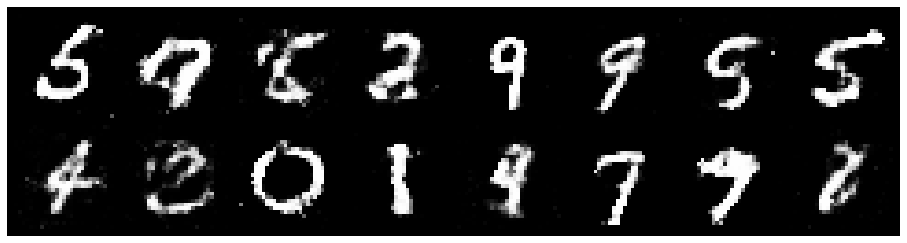

Epoch: [81/100], Batch Num: [500/700]
Discriminator Loss: 1.2737, Generator Loss: 1.3523
D(x): 0.5641, D(G(z)): 0.3976


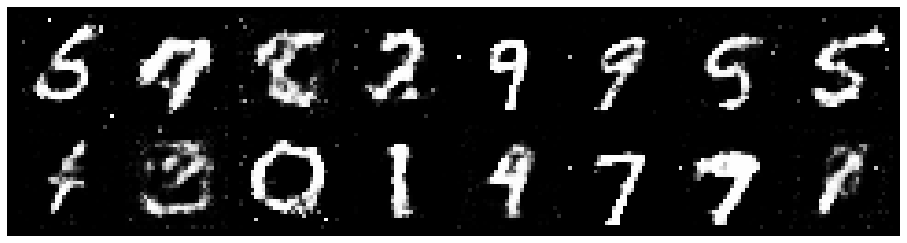

Epoch: [81/100], Batch Num: [600/700]
Discriminator Loss: 1.2418, Generator Loss: 0.9668
D(x): 0.6217, D(G(z)): 0.4697


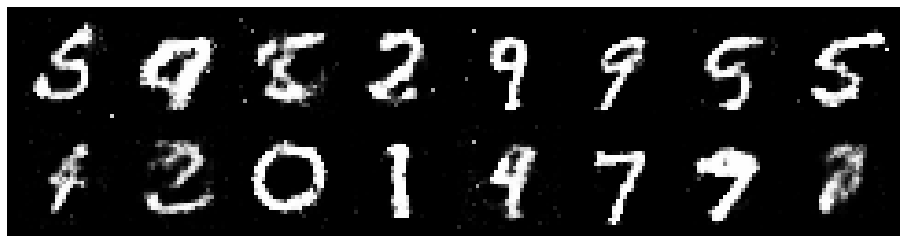

Epoch: [82/100], Batch Num: [0/700]
Discriminator Loss: 1.3613, Generator Loss: 0.8475
D(x): 0.5629, D(G(z)): 0.4975


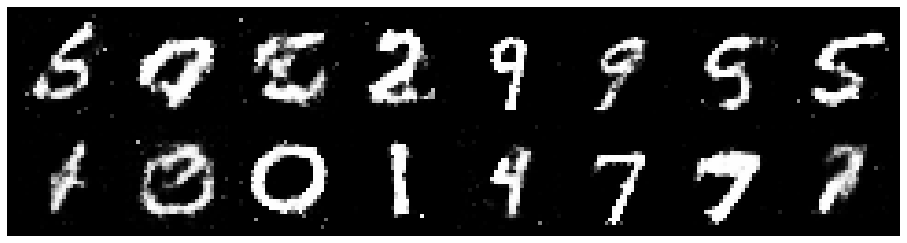

Epoch: [82/100], Batch Num: [100/700]
Discriminator Loss: 1.3193, Generator Loss: 0.9956
D(x): 0.5869, D(G(z)): 0.4558


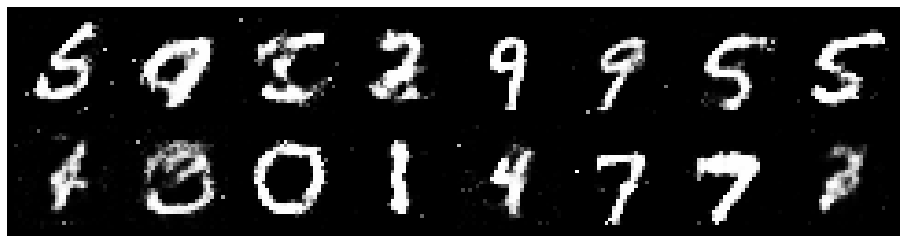

Epoch: [82/100], Batch Num: [200/700]
Discriminator Loss: 1.2751, Generator Loss: 0.9065
D(x): 0.5425, D(G(z)): 0.4163


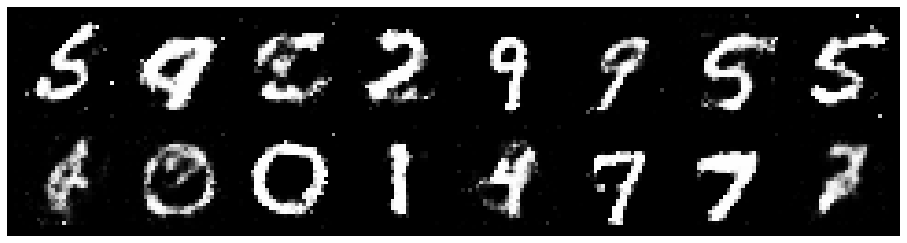

Epoch: [82/100], Batch Num: [300/700]
Discriminator Loss: 1.2578, Generator Loss: 0.9023
D(x): 0.5868, D(G(z)): 0.4549


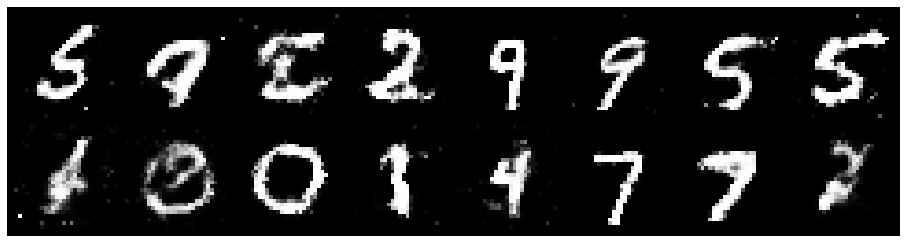

Epoch: [82/100], Batch Num: [400/700]
Discriminator Loss: 1.3577, Generator Loss: 0.8280
D(x): 0.4950, D(G(z)): 0.4483


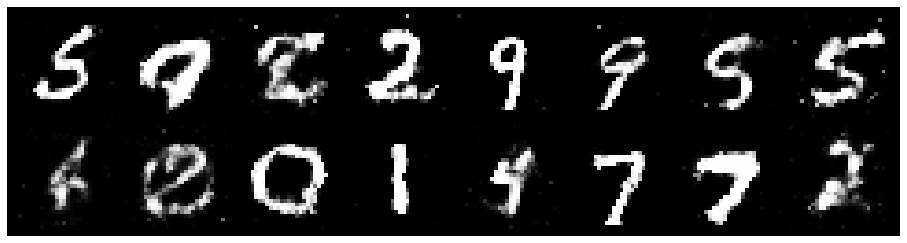

Epoch: [82/100], Batch Num: [500/700]
Discriminator Loss: 1.2991, Generator Loss: 0.8749
D(x): 0.5470, D(G(z)): 0.4386


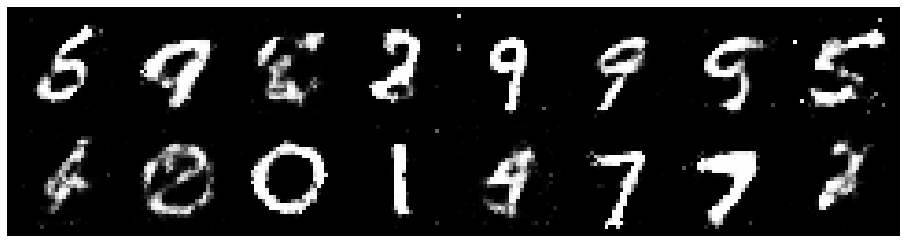

Epoch: [82/100], Batch Num: [600/700]
Discriminator Loss: 1.2273, Generator Loss: 0.9479
D(x): 0.5988, D(G(z)): 0.4444


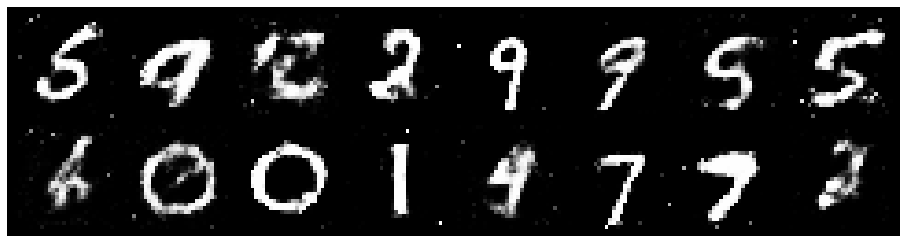

Epoch: [83/100], Batch Num: [0/700]
Discriminator Loss: 1.3232, Generator Loss: 1.0289
D(x): 0.5349, D(G(z)): 0.4186


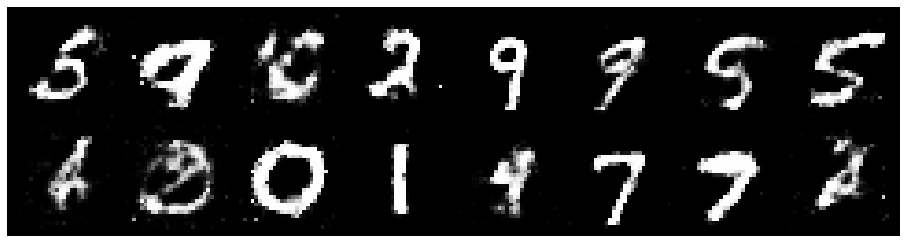

Epoch: [83/100], Batch Num: [100/700]
Discriminator Loss: 1.2212, Generator Loss: 0.9382
D(x): 0.5897, D(G(z)): 0.4476


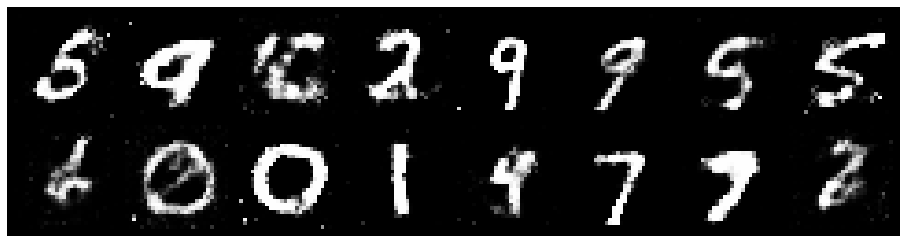

Epoch: [83/100], Batch Num: [200/700]
Discriminator Loss: 1.2889, Generator Loss: 1.0041
D(x): 0.5568, D(G(z)): 0.4439


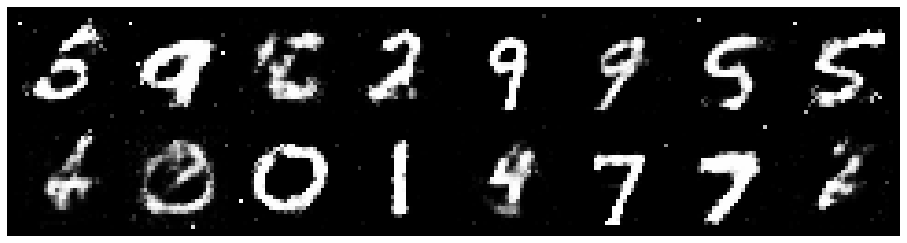

Epoch: [83/100], Batch Num: [300/700]
Discriminator Loss: 1.2599, Generator Loss: 1.0420
D(x): 0.5625, D(G(z)): 0.4268


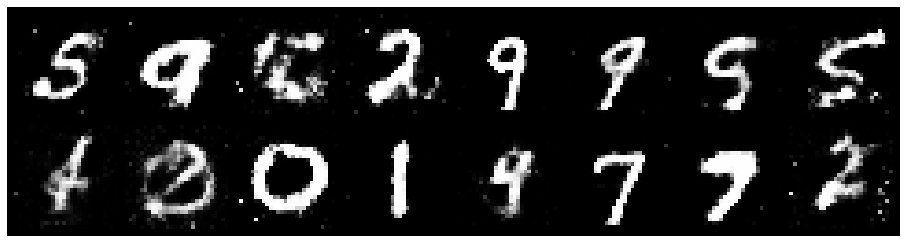

Epoch: [83/100], Batch Num: [400/700]
Discriminator Loss: 1.2292, Generator Loss: 0.9693
D(x): 0.5760, D(G(z)): 0.4111


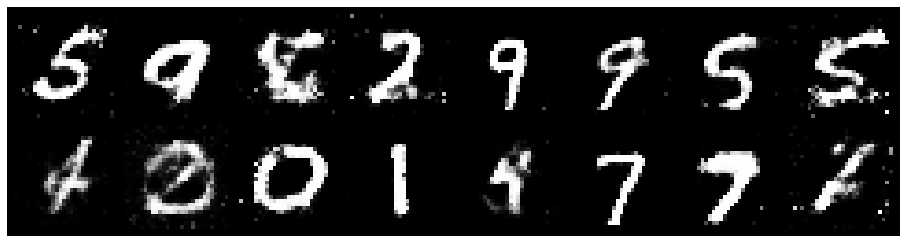

Epoch: [83/100], Batch Num: [500/700]
Discriminator Loss: 1.2283, Generator Loss: 1.0463
D(x): 0.5854, D(G(z)): 0.4240


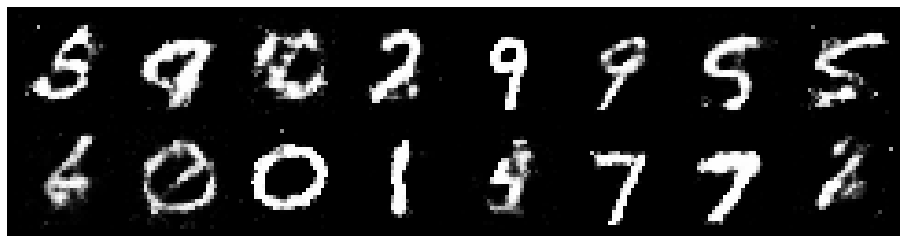

Epoch: [83/100], Batch Num: [600/700]
Discriminator Loss: 1.1601, Generator Loss: 1.0160
D(x): 0.6084, D(G(z)): 0.3998


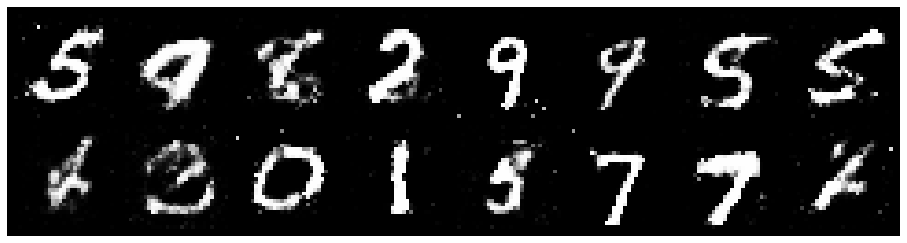

Epoch: [84/100], Batch Num: [0/700]
Discriminator Loss: 1.0842, Generator Loss: 1.1189
D(x): 0.6444, D(G(z)): 0.3996


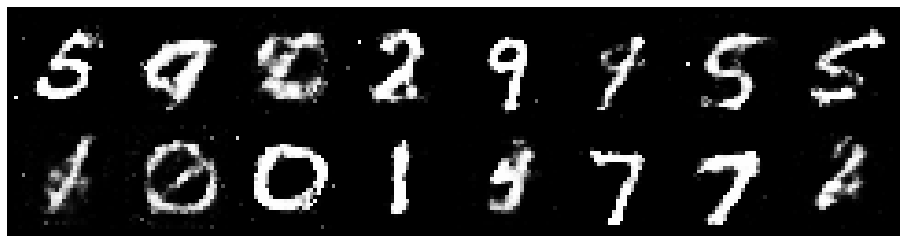

Epoch: [84/100], Batch Num: [100/700]
Discriminator Loss: 1.2603, Generator Loss: 0.8851
D(x): 0.5359, D(G(z)): 0.4256


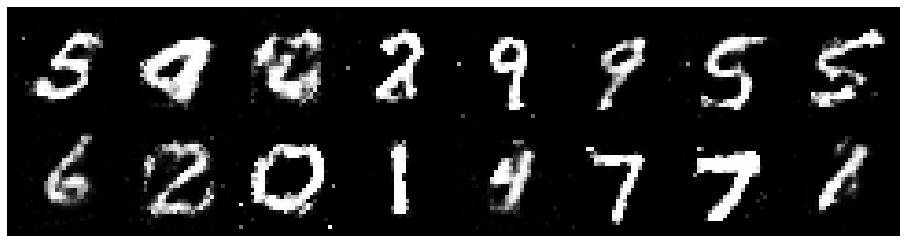

Epoch: [84/100], Batch Num: [200/700]
Discriminator Loss: 1.3109, Generator Loss: 0.7945
D(x): 0.5735, D(G(z)): 0.4723


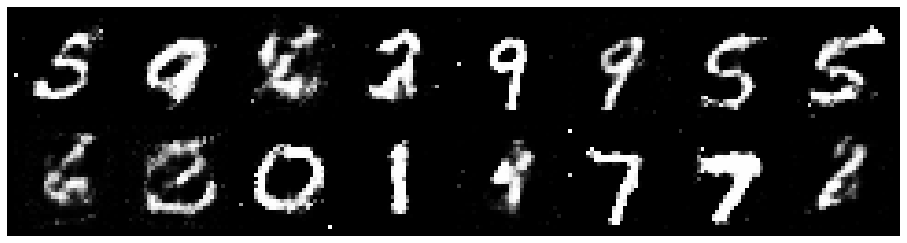

Epoch: [84/100], Batch Num: [300/700]
Discriminator Loss: 1.1770, Generator Loss: 1.0198
D(x): 0.5967, D(G(z)): 0.4116


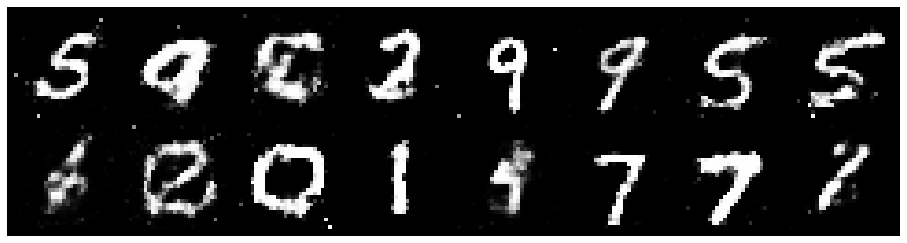

Epoch: [84/100], Batch Num: [400/700]
Discriminator Loss: 1.2422, Generator Loss: 0.9218
D(x): 0.5342, D(G(z)): 0.4176


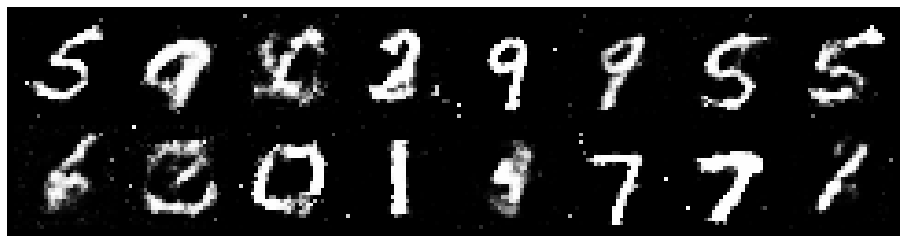

Epoch: [84/100], Batch Num: [500/700]
Discriminator Loss: 1.3340, Generator Loss: 0.9243
D(x): 0.5397, D(G(z)): 0.4440


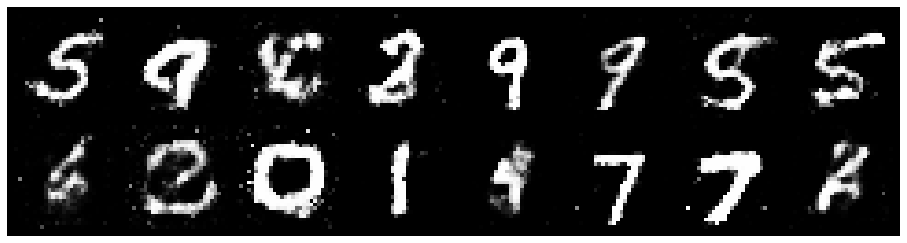

Epoch: [84/100], Batch Num: [600/700]
Discriminator Loss: 1.2223, Generator Loss: 1.0974
D(x): 0.5419, D(G(z)): 0.4013


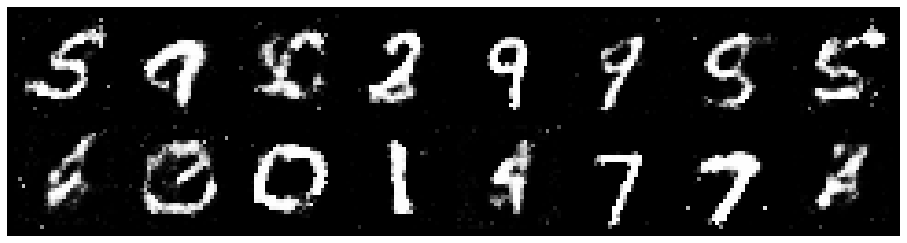

Epoch: [85/100], Batch Num: [0/700]
Discriminator Loss: 1.2023, Generator Loss: 1.0904
D(x): 0.5720, D(G(z)): 0.4099


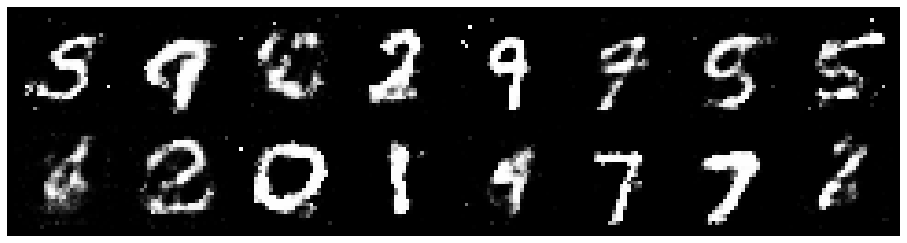

Epoch: [85/100], Batch Num: [100/700]
Discriminator Loss: 1.3109, Generator Loss: 0.8816
D(x): 0.5735, D(G(z)): 0.4552


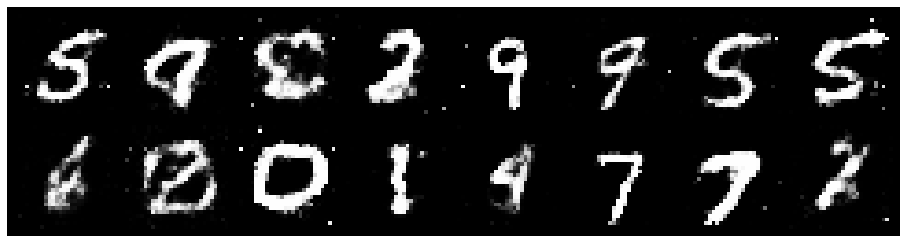

Epoch: [85/100], Batch Num: [200/700]
Discriminator Loss: 1.3352, Generator Loss: 0.8275
D(x): 0.5907, D(G(z)): 0.4953


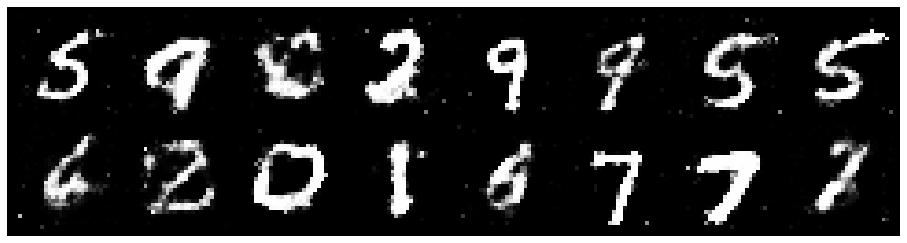

Epoch: [85/100], Batch Num: [300/700]
Discriminator Loss: 1.2323, Generator Loss: 0.9230
D(x): 0.5584, D(G(z)): 0.4271


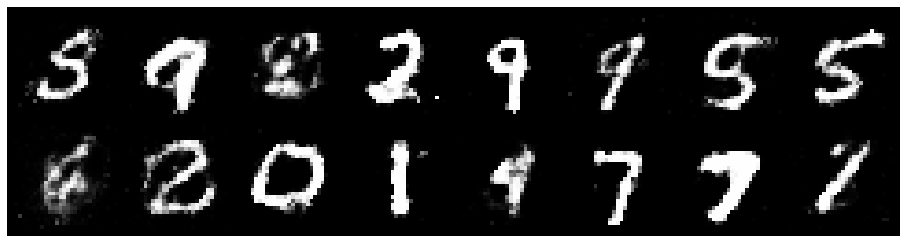

Epoch: [85/100], Batch Num: [400/700]
Discriminator Loss: 1.2385, Generator Loss: 1.1129
D(x): 0.5449, D(G(z)): 0.3989


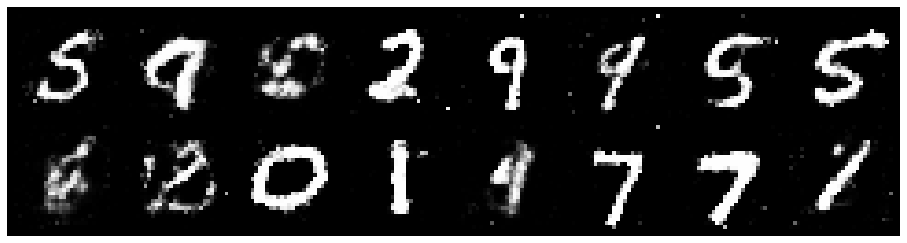

Epoch: [85/100], Batch Num: [500/700]
Discriminator Loss: 1.2188, Generator Loss: 0.9739
D(x): 0.5794, D(G(z)): 0.4319


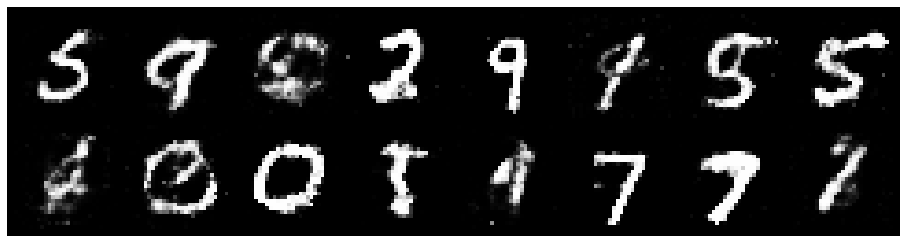

Epoch: [85/100], Batch Num: [600/700]
Discriminator Loss: 1.1901, Generator Loss: 0.9080
D(x): 0.5748, D(G(z)): 0.4264


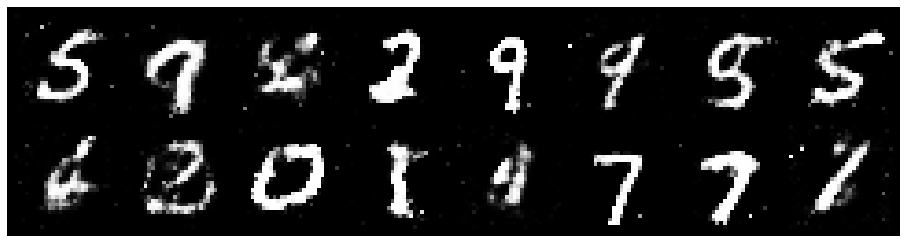

Epoch: [86/100], Batch Num: [0/700]
Discriminator Loss: 1.1847, Generator Loss: 1.0016
D(x): 0.5805, D(G(z)): 0.4137


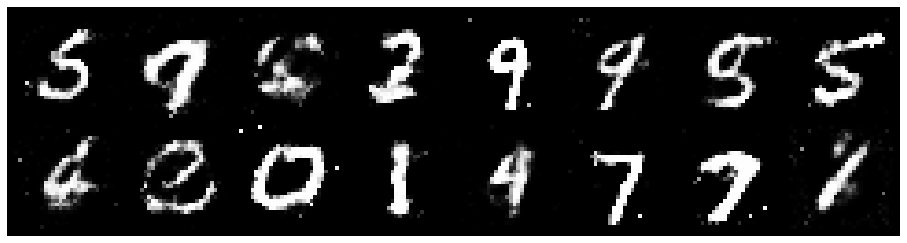

Epoch: [86/100], Batch Num: [100/700]
Discriminator Loss: 1.2624, Generator Loss: 1.0076
D(x): 0.6136, D(G(z)): 0.4671


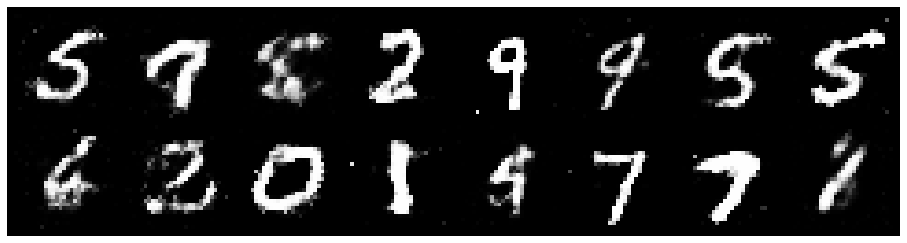

Epoch: [86/100], Batch Num: [200/700]
Discriminator Loss: 1.1057, Generator Loss: 1.0295
D(x): 0.6021, D(G(z)): 0.3958


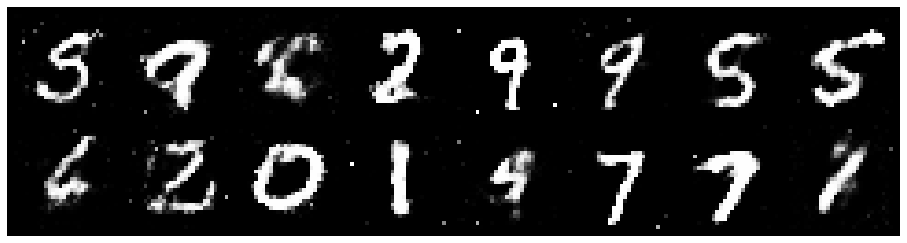

Epoch: [86/100], Batch Num: [300/700]
Discriminator Loss: 1.2729, Generator Loss: 1.0357
D(x): 0.5619, D(G(z)): 0.4396


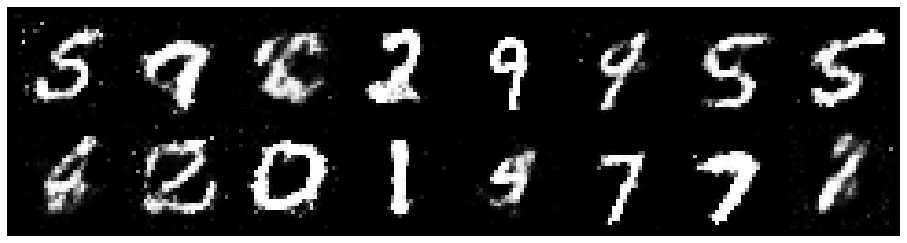

Epoch: [86/100], Batch Num: [400/700]
Discriminator Loss: 1.4388, Generator Loss: 0.9431
D(x): 0.5445, D(G(z)): 0.4734


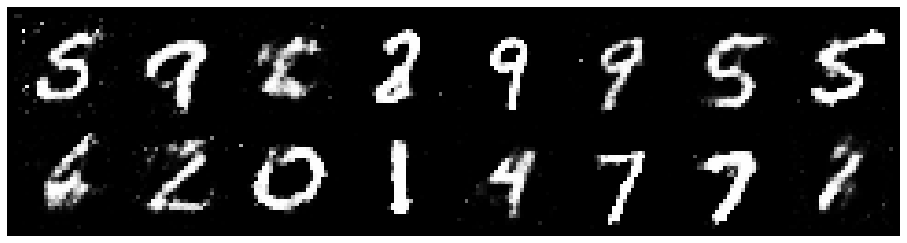

Epoch: [86/100], Batch Num: [500/700]
Discriminator Loss: 1.1952, Generator Loss: 1.2372
D(x): 0.5660, D(G(z)): 0.3982


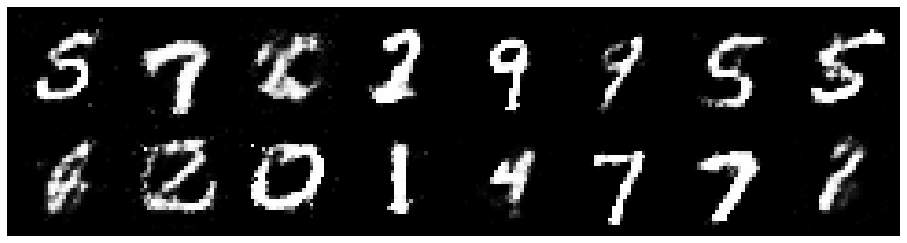

Epoch: [86/100], Batch Num: [600/700]
Discriminator Loss: 1.1514, Generator Loss: 1.0486
D(x): 0.6421, D(G(z)): 0.4368


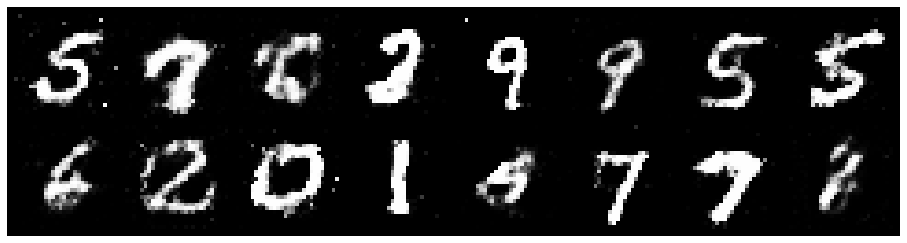

Epoch: [87/100], Batch Num: [0/700]
Discriminator Loss: 1.2576, Generator Loss: 0.9305
D(x): 0.5587, D(G(z)): 0.4363


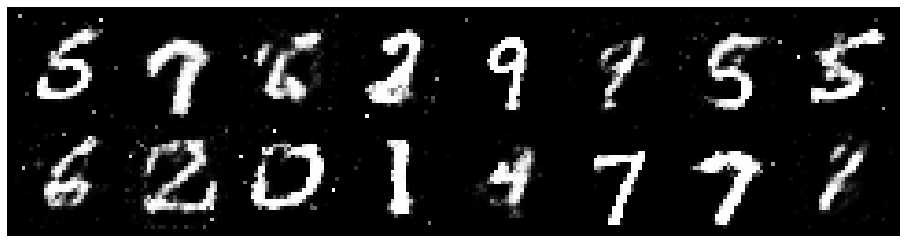

Epoch: [87/100], Batch Num: [100/700]
Discriminator Loss: 1.2590, Generator Loss: 1.0124
D(x): 0.5172, D(G(z)): 0.3705


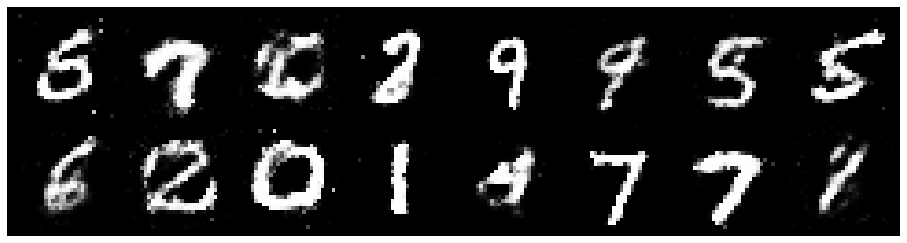

Epoch: [87/100], Batch Num: [200/700]
Discriminator Loss: 1.2059, Generator Loss: 1.0474
D(x): 0.5769, D(G(z)): 0.4195


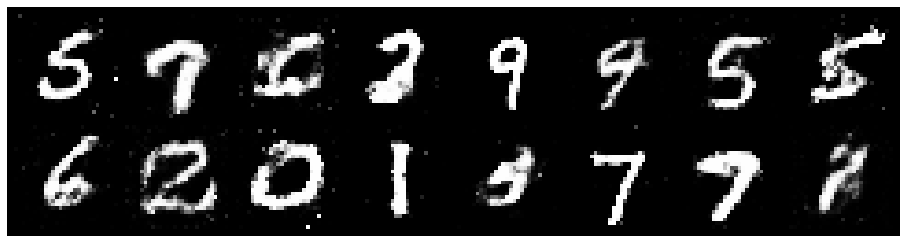

Epoch: [87/100], Batch Num: [300/700]
Discriminator Loss: 1.2917, Generator Loss: 0.8290
D(x): 0.5336, D(G(z)): 0.4666


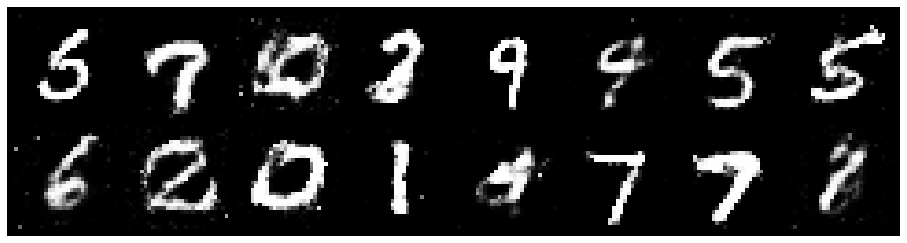

Epoch: [87/100], Batch Num: [400/700]
Discriminator Loss: 1.3189, Generator Loss: 1.0981
D(x): 0.5962, D(G(z)): 0.4495


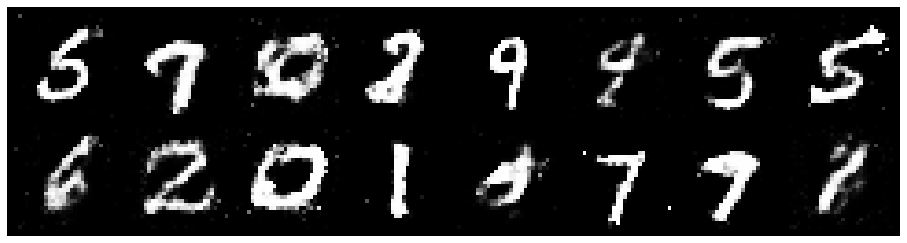

Epoch: [87/100], Batch Num: [500/700]
Discriminator Loss: 1.0823, Generator Loss: 1.1143
D(x): 0.5846, D(G(z)): 0.3649


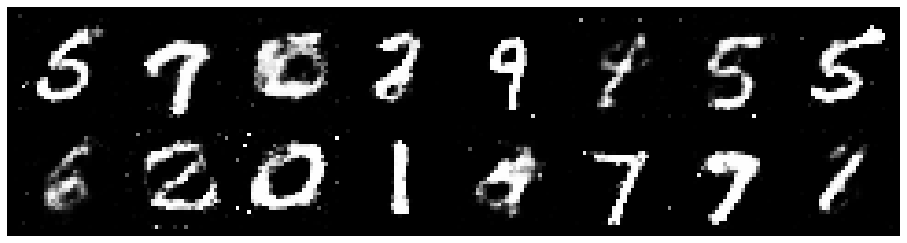

Epoch: [87/100], Batch Num: [600/700]
Discriminator Loss: 1.2820, Generator Loss: 0.8305
D(x): 0.5440, D(G(z)): 0.4446


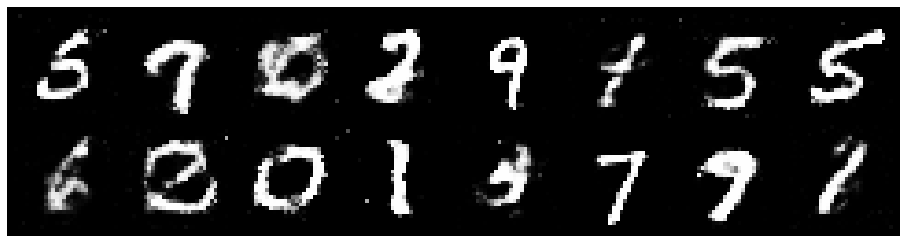

Epoch: [88/100], Batch Num: [0/700]
Discriminator Loss: 1.2859, Generator Loss: 1.0208
D(x): 0.5548, D(G(z)): 0.4494


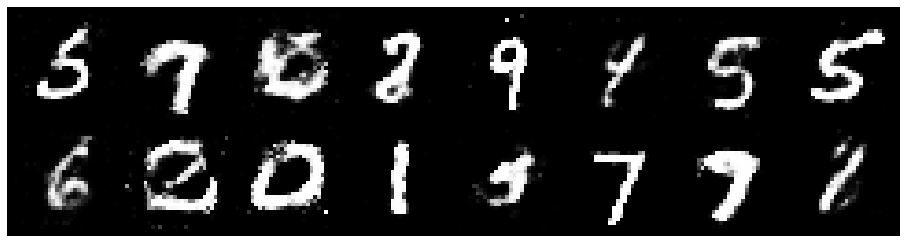

Epoch: [88/100], Batch Num: [100/700]
Discriminator Loss: 1.3001, Generator Loss: 0.9284
D(x): 0.5498, D(G(z)): 0.4572


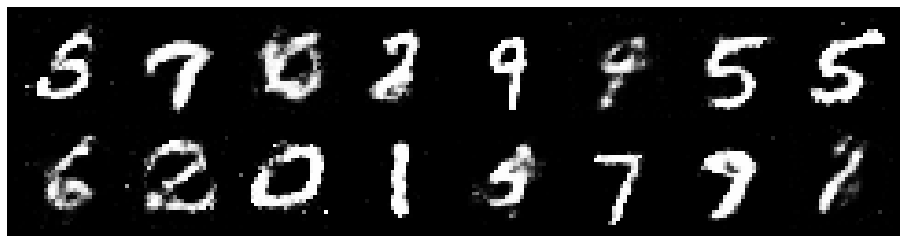

Epoch: [88/100], Batch Num: [200/700]
Discriminator Loss: 1.2355, Generator Loss: 0.8513
D(x): 0.5727, D(G(z)): 0.4457


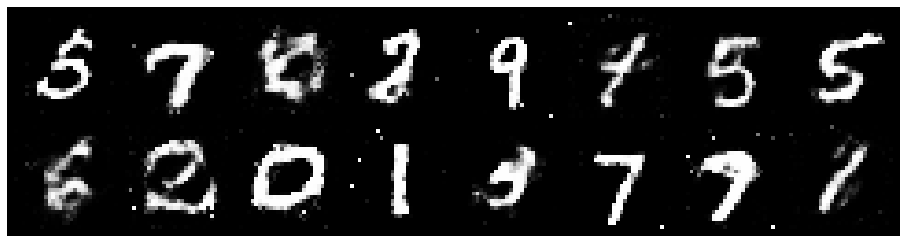

Epoch: [88/100], Batch Num: [300/700]
Discriminator Loss: 1.3543, Generator Loss: 0.9641
D(x): 0.5379, D(G(z)): 0.4405


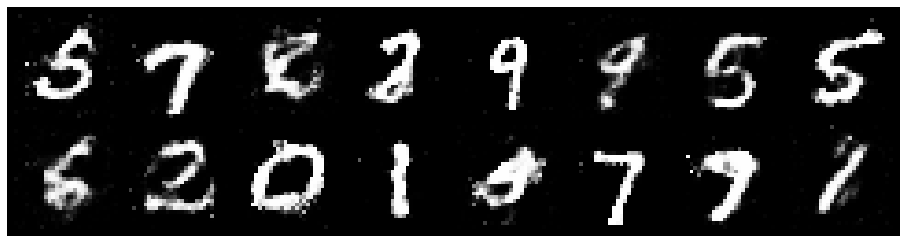

Epoch: [88/100], Batch Num: [400/700]
Discriminator Loss: 1.3503, Generator Loss: 0.7838
D(x): 0.5802, D(G(z)): 0.5039


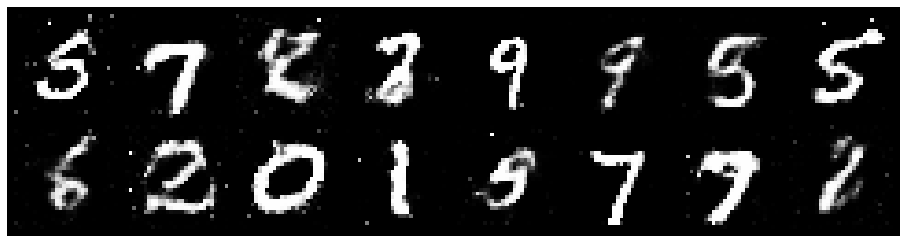

Epoch: [88/100], Batch Num: [500/700]
Discriminator Loss: 1.1978, Generator Loss: 0.8350
D(x): 0.5694, D(G(z)): 0.4220


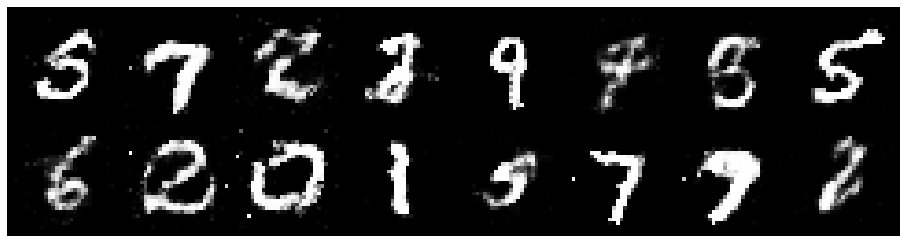

Epoch: [88/100], Batch Num: [600/700]
Discriminator Loss: 1.2087, Generator Loss: 0.8637
D(x): 0.5414, D(G(z)): 0.3882


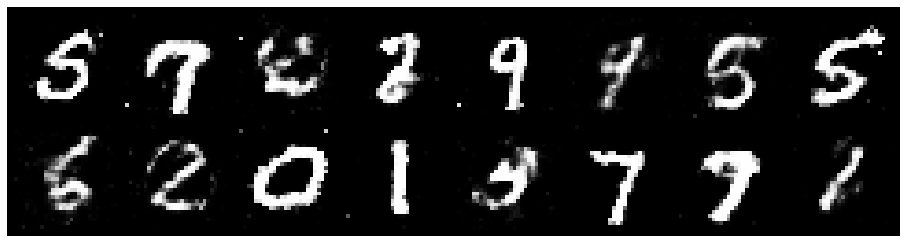

Epoch: [89/100], Batch Num: [0/700]
Discriminator Loss: 1.3036, Generator Loss: 1.1361
D(x): 0.5372, D(G(z)): 0.4082


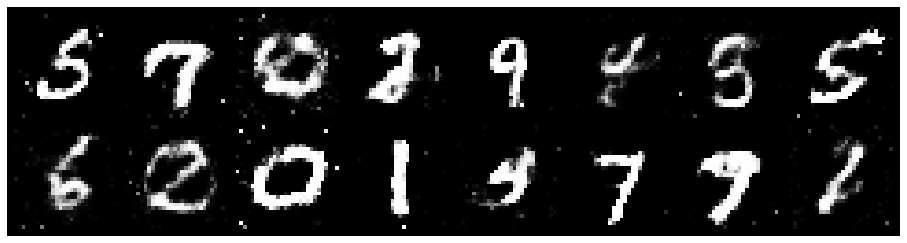

Epoch: [89/100], Batch Num: [100/700]
Discriminator Loss: 1.1597, Generator Loss: 0.9887
D(x): 0.5710, D(G(z)): 0.4005


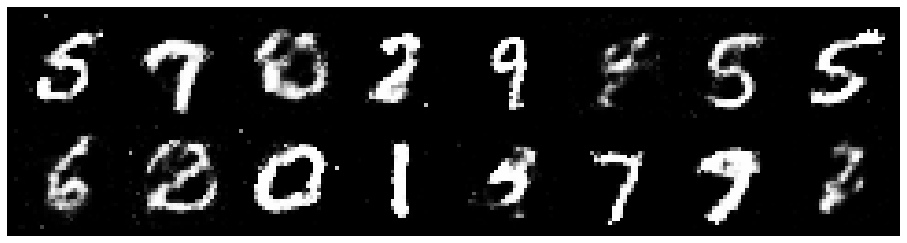

Epoch: [89/100], Batch Num: [200/700]
Discriminator Loss: 1.1975, Generator Loss: 0.9379
D(x): 0.5520, D(G(z)): 0.4106


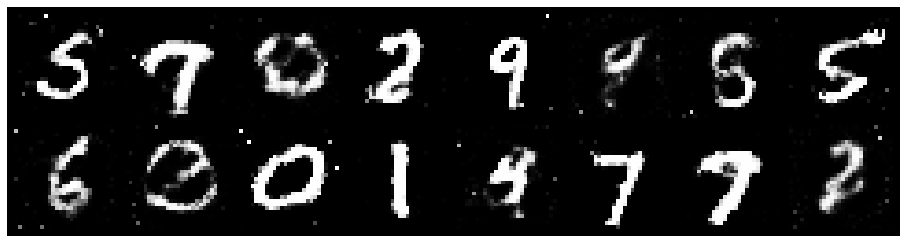

Epoch: [89/100], Batch Num: [300/700]
Discriminator Loss: 1.2745, Generator Loss: 0.8615
D(x): 0.5655, D(G(z)): 0.4582


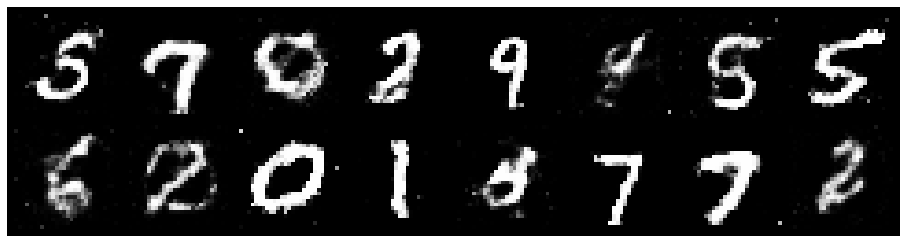

Epoch: [89/100], Batch Num: [400/700]
Discriminator Loss: 1.3806, Generator Loss: 0.9192
D(x): 0.5021, D(G(z)): 0.4337


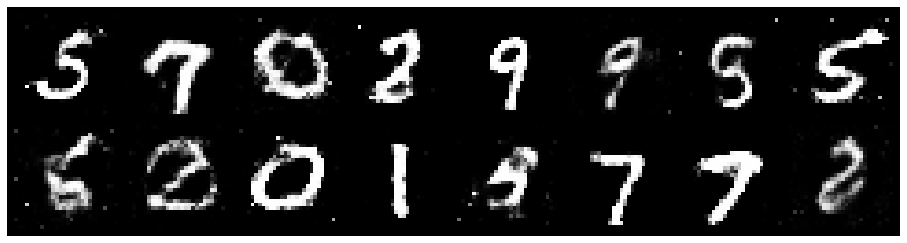

Epoch: [89/100], Batch Num: [500/700]
Discriminator Loss: 1.2451, Generator Loss: 0.9296
D(x): 0.5276, D(G(z)): 0.4040


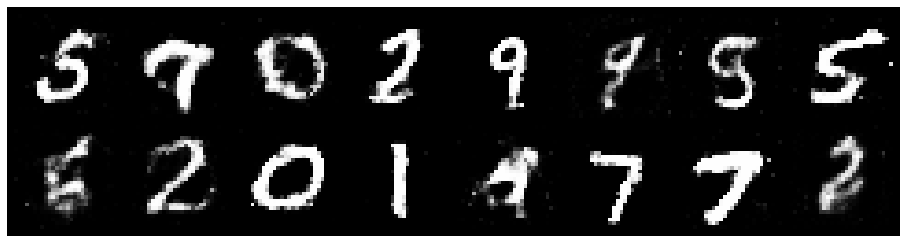

Epoch: [89/100], Batch Num: [600/700]
Discriminator Loss: 1.2174, Generator Loss: 0.8842
D(x): 0.5485, D(G(z)): 0.4175


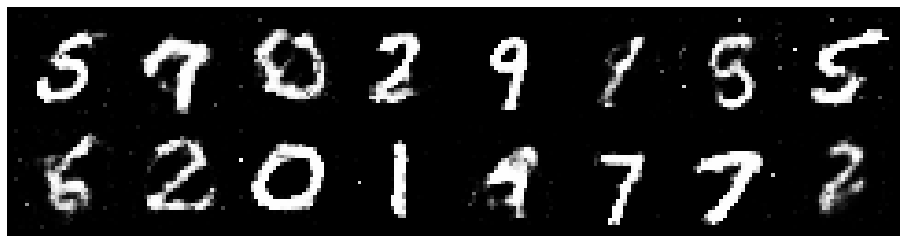

Epoch: [90/100], Batch Num: [0/700]
Discriminator Loss: 1.3428, Generator Loss: 0.9634
D(x): 0.5117, D(G(z)): 0.4341


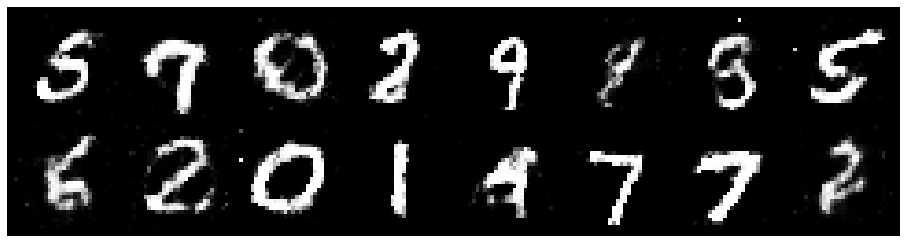

Epoch: [90/100], Batch Num: [100/700]
Discriminator Loss: 1.2006, Generator Loss: 0.9257
D(x): 0.5989, D(G(z)): 0.4376


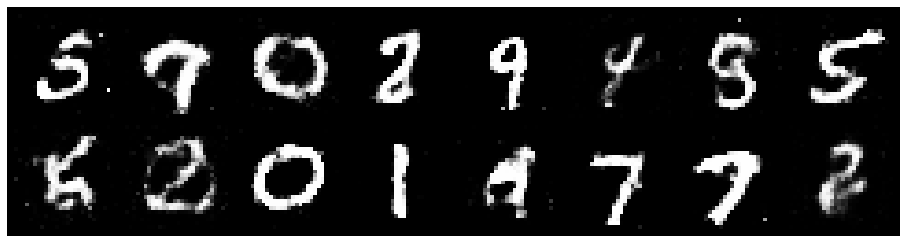

Epoch: [90/100], Batch Num: [200/700]
Discriminator Loss: 1.2703, Generator Loss: 0.9135
D(x): 0.5880, D(G(z)): 0.4549


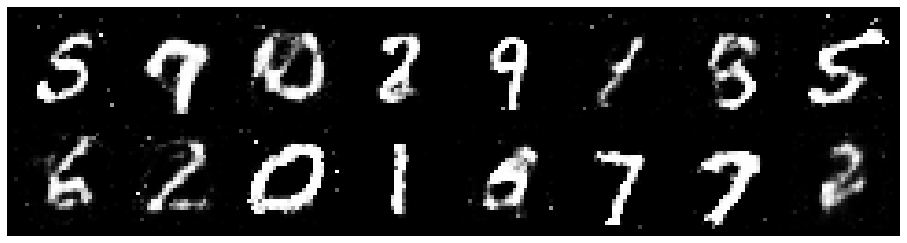

Epoch: [90/100], Batch Num: [300/700]
Discriminator Loss: 1.2091, Generator Loss: 1.0216
D(x): 0.5608, D(G(z)): 0.4082


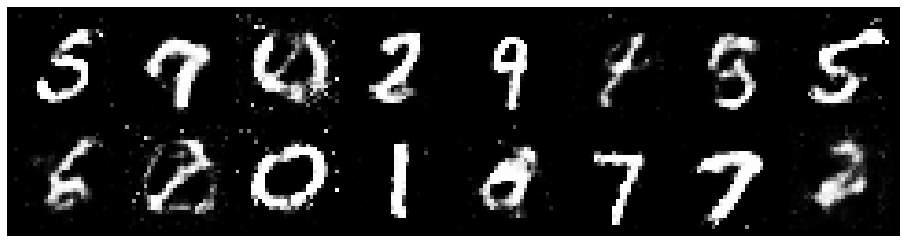

Epoch: [90/100], Batch Num: [400/700]
Discriminator Loss: 1.1705, Generator Loss: 1.0179
D(x): 0.5952, D(G(z)): 0.4201


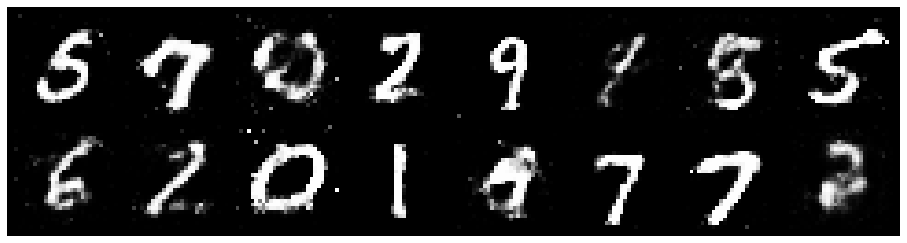

Epoch: [90/100], Batch Num: [500/700]
Discriminator Loss: 1.3760, Generator Loss: 0.7745
D(x): 0.6035, D(G(z)): 0.5101


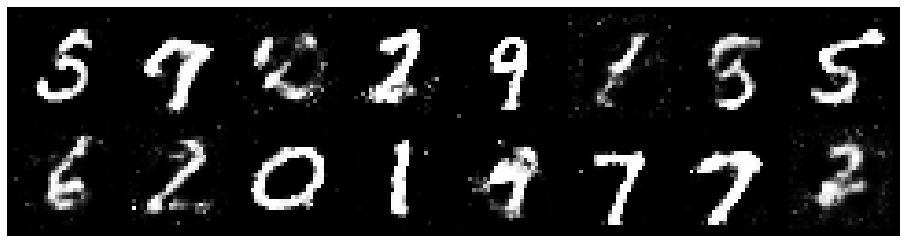

Epoch: [90/100], Batch Num: [600/700]
Discriminator Loss: 1.3951, Generator Loss: 0.9249
D(x): 0.5083, D(G(z)): 0.4605


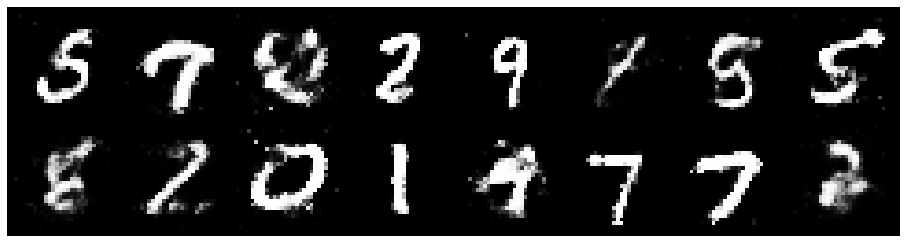

Epoch: [91/100], Batch Num: [0/700]
Discriminator Loss: 1.2547, Generator Loss: 0.8455
D(x): 0.5447, D(G(z)): 0.4431


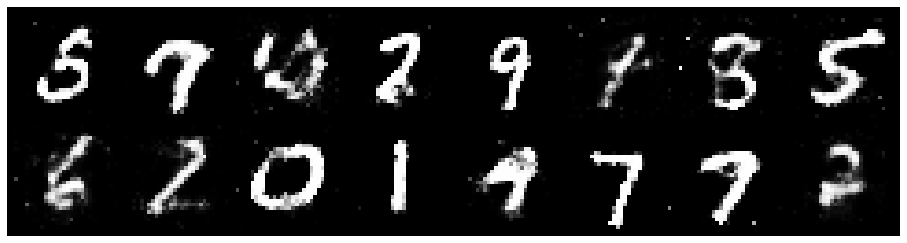

Epoch: [91/100], Batch Num: [100/700]
Discriminator Loss: 1.3456, Generator Loss: 0.9296
D(x): 0.5654, D(G(z)): 0.4846


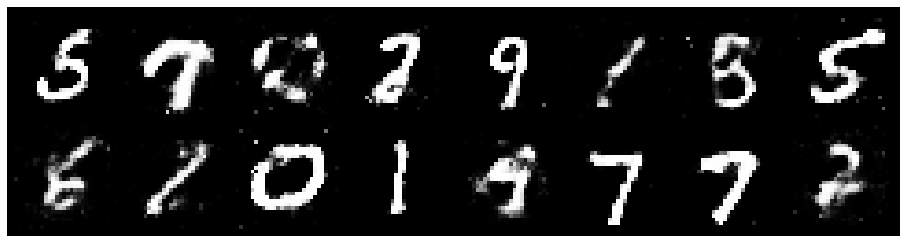

Epoch: [91/100], Batch Num: [200/700]
Discriminator Loss: 1.2861, Generator Loss: 0.8696
D(x): 0.5484, D(G(z)): 0.4477


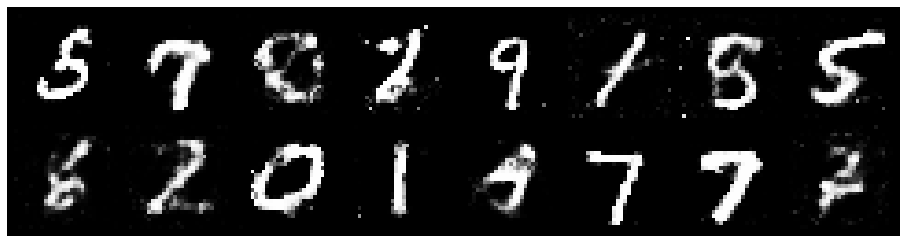

Epoch: [91/100], Batch Num: [300/700]
Discriminator Loss: 1.2750, Generator Loss: 0.8140
D(x): 0.5666, D(G(z)): 0.4655


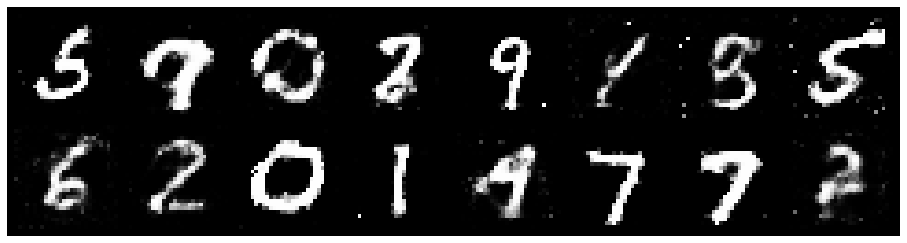

Epoch: [91/100], Batch Num: [400/700]
Discriminator Loss: 1.2845, Generator Loss: 1.0303
D(x): 0.6109, D(G(z)): 0.4619


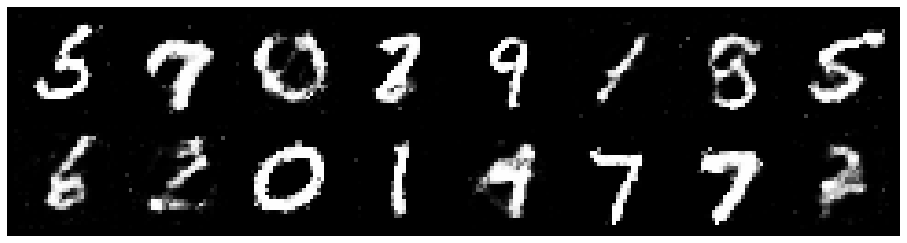

Epoch: [91/100], Batch Num: [500/700]
Discriminator Loss: 1.3576, Generator Loss: 1.0063
D(x): 0.5116, D(G(z)): 0.4105


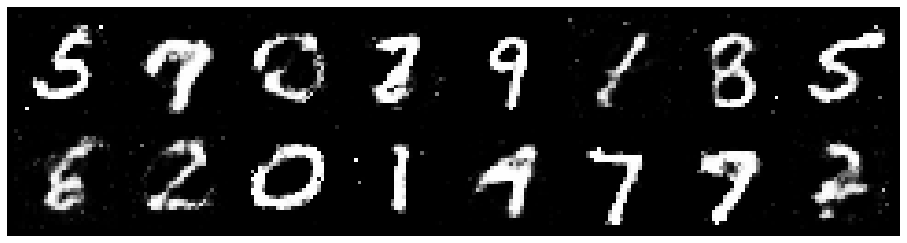

Epoch: [91/100], Batch Num: [600/700]
Discriminator Loss: 1.1715, Generator Loss: 1.0515
D(x): 0.5864, D(G(z)): 0.3991


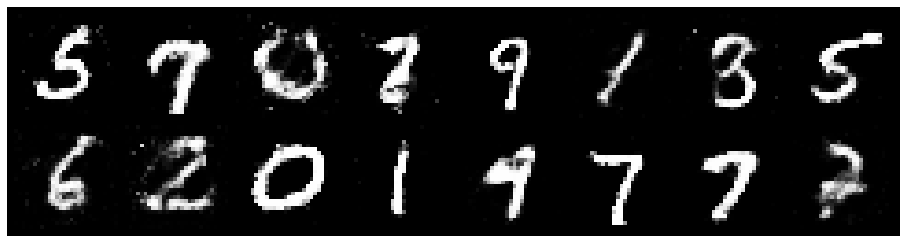

Epoch: [92/100], Batch Num: [0/700]
Discriminator Loss: 1.1354, Generator Loss: 0.8863
D(x): 0.6039, D(G(z)): 0.4020


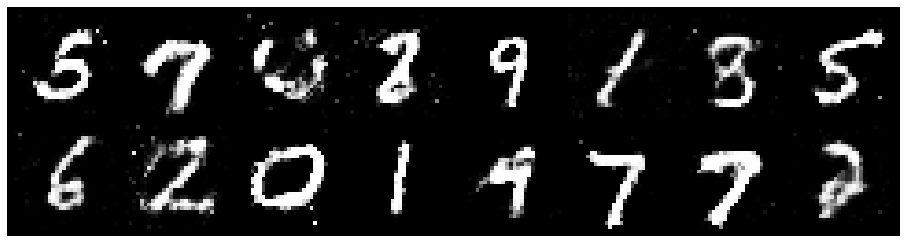

Epoch: [92/100], Batch Num: [100/700]
Discriminator Loss: 1.2758, Generator Loss: 0.8679
D(x): 0.6029, D(G(z)): 0.4932


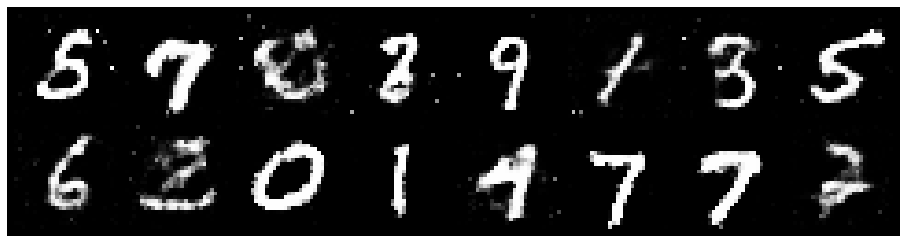

Epoch: [92/100], Batch Num: [200/700]
Discriminator Loss: 1.2430, Generator Loss: 0.9565
D(x): 0.5585, D(G(z)): 0.3975


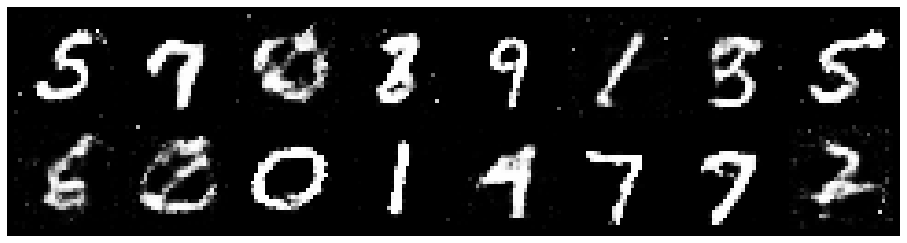

Epoch: [92/100], Batch Num: [300/700]
Discriminator Loss: 1.2543, Generator Loss: 0.9431
D(x): 0.5963, D(G(z)): 0.4382


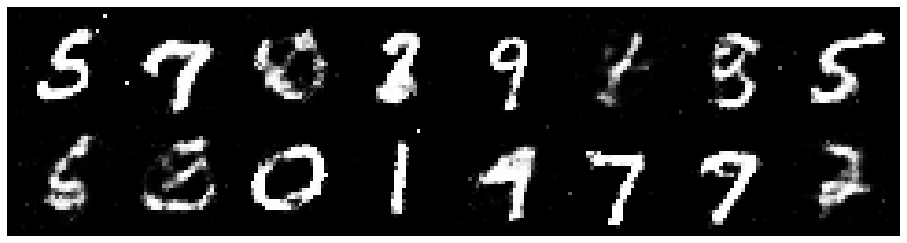

Epoch: [92/100], Batch Num: [400/700]
Discriminator Loss: 1.2945, Generator Loss: 1.1118
D(x): 0.5487, D(G(z)): 0.4257


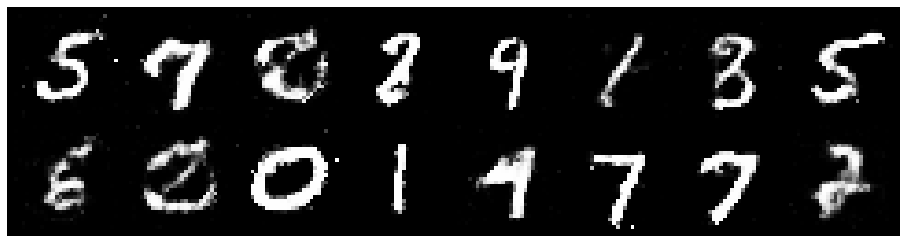

Epoch: [92/100], Batch Num: [500/700]
Discriminator Loss: 1.2751, Generator Loss: 0.8263
D(x): 0.5715, D(G(z)): 0.4772


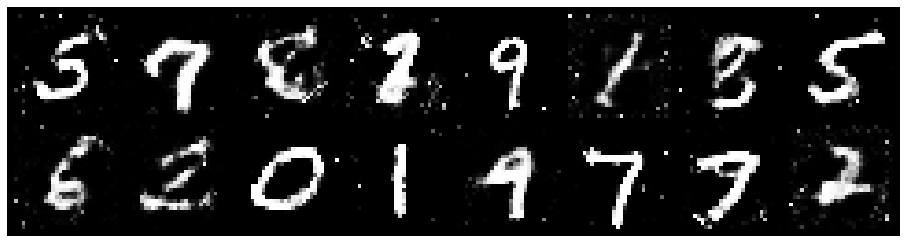

Epoch: [92/100], Batch Num: [600/700]
Discriminator Loss: 1.3143, Generator Loss: 0.8643
D(x): 0.5625, D(G(z)): 0.4743


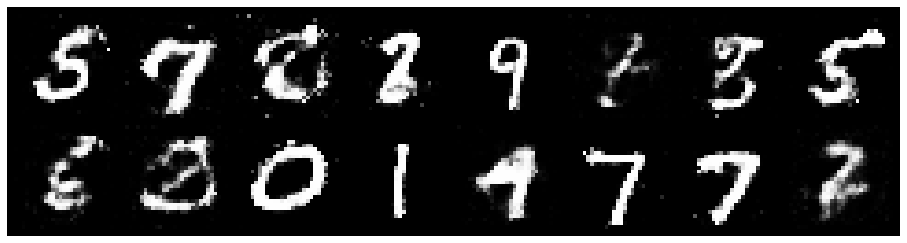

Epoch: [93/100], Batch Num: [0/700]
Discriminator Loss: 1.2098, Generator Loss: 0.8725
D(x): 0.5650, D(G(z)): 0.4213


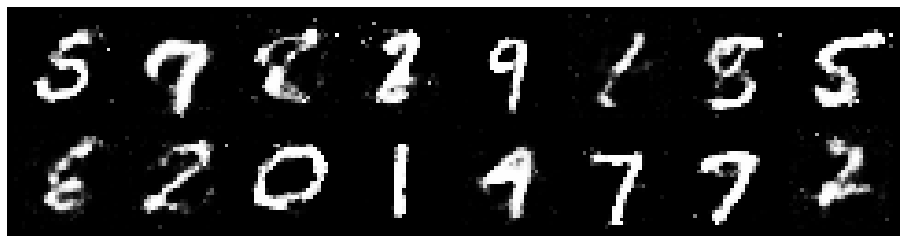

Epoch: [93/100], Batch Num: [100/700]
Discriminator Loss: 1.2911, Generator Loss: 0.9009
D(x): 0.5397, D(G(z)): 0.4443


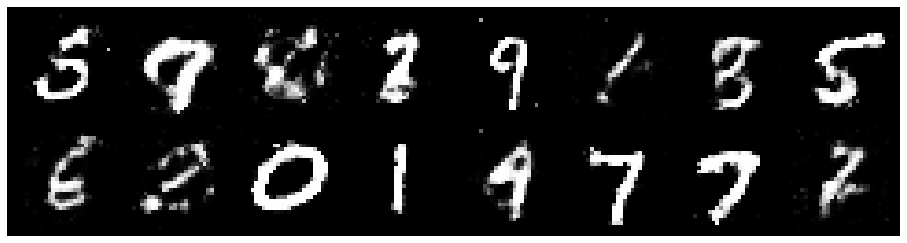

Epoch: [93/100], Batch Num: [200/700]
Discriminator Loss: 1.2133, Generator Loss: 1.1090
D(x): 0.5604, D(G(z)): 0.3805


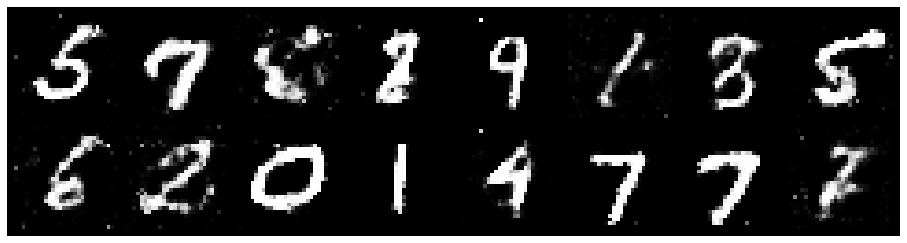

Epoch: [93/100], Batch Num: [300/700]
Discriminator Loss: 1.2408, Generator Loss: 1.0188
D(x): 0.5824, D(G(z)): 0.4419


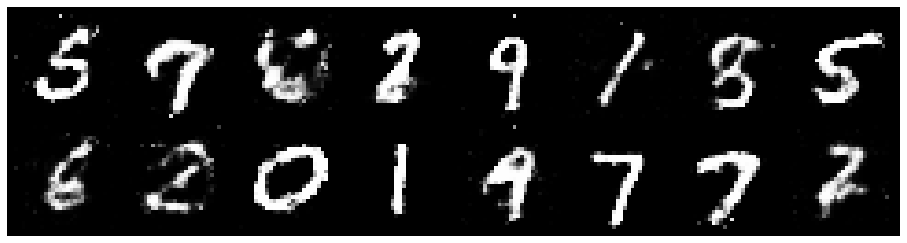

Epoch: [93/100], Batch Num: [400/700]
Discriminator Loss: 1.2683, Generator Loss: 0.9045
D(x): 0.5801, D(G(z)): 0.4577


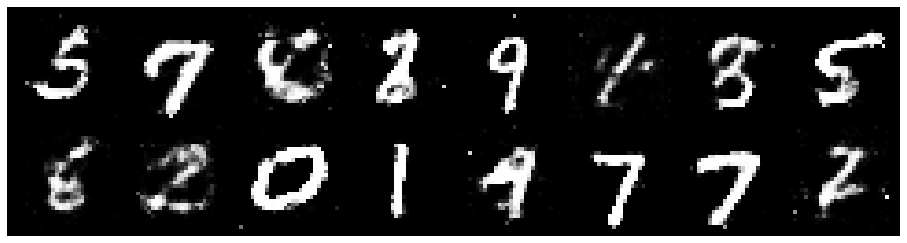

Epoch: [93/100], Batch Num: [500/700]
Discriminator Loss: 1.1659, Generator Loss: 1.0733
D(x): 0.5874, D(G(z)): 0.4030


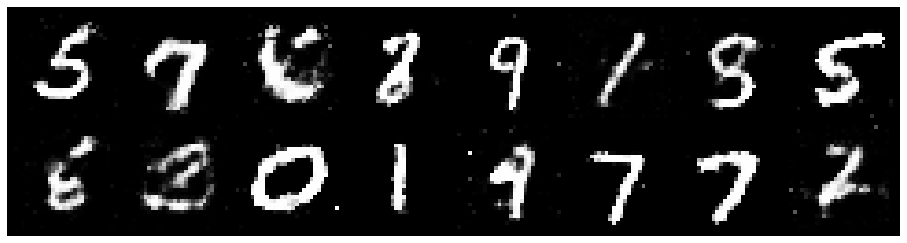

Epoch: [93/100], Batch Num: [600/700]
Discriminator Loss: 1.0661, Generator Loss: 1.1903
D(x): 0.6430, D(G(z)): 0.4059


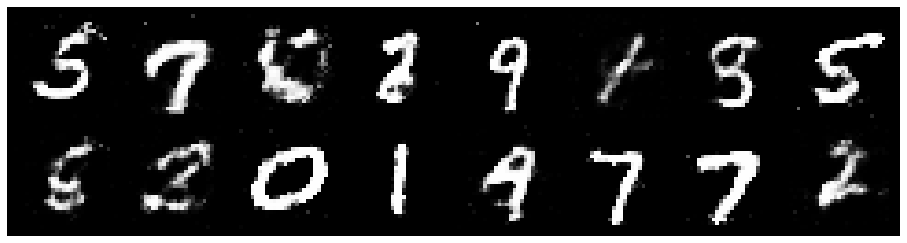

Epoch: [94/100], Batch Num: [0/700]
Discriminator Loss: 1.1802, Generator Loss: 0.9156
D(x): 0.5725, D(G(z)): 0.4087


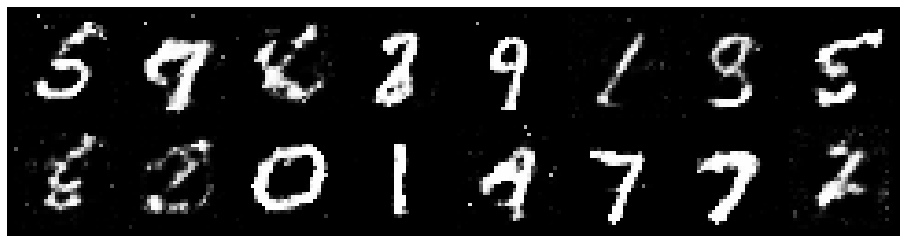

Epoch: [94/100], Batch Num: [100/700]
Discriminator Loss: 1.2231, Generator Loss: 0.8586
D(x): 0.5668, D(G(z)): 0.4374


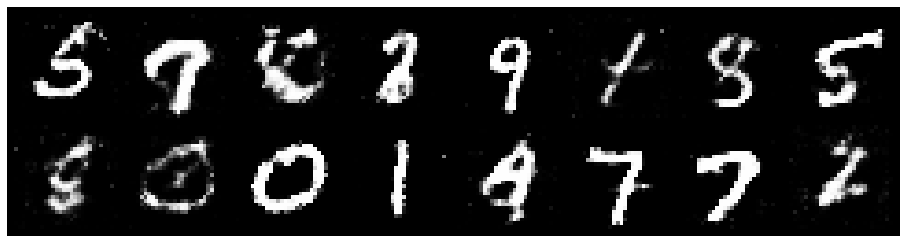

Epoch: [94/100], Batch Num: [200/700]
Discriminator Loss: 1.1462, Generator Loss: 0.9151
D(x): 0.6109, D(G(z)): 0.4211


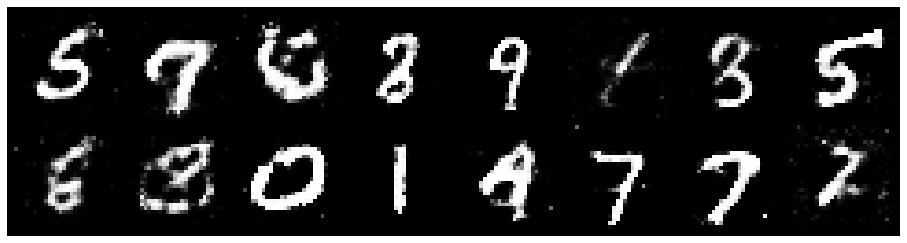

Epoch: [94/100], Batch Num: [300/700]
Discriminator Loss: 1.2769, Generator Loss: 0.8645
D(x): 0.5441, D(G(z)): 0.4498


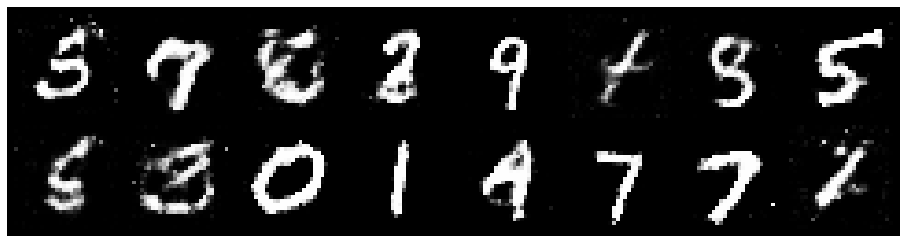

Epoch: [94/100], Batch Num: [400/700]
Discriminator Loss: 1.3644, Generator Loss: 0.7365
D(x): 0.5151, D(G(z)): 0.4792


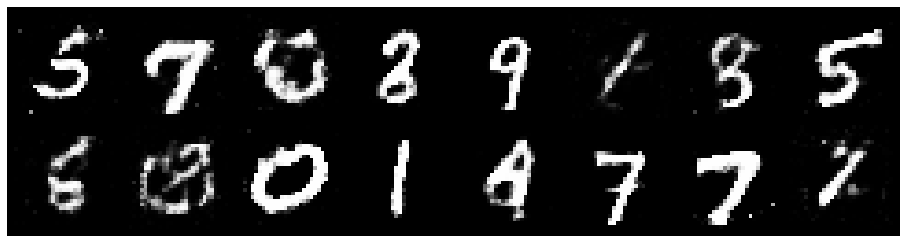

Epoch: [94/100], Batch Num: [500/700]
Discriminator Loss: 1.3681, Generator Loss: 0.7813
D(x): 0.5569, D(G(z)): 0.4806


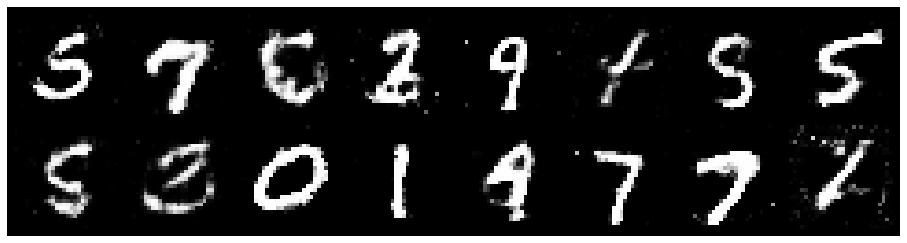

Epoch: [94/100], Batch Num: [600/700]
Discriminator Loss: 1.1979, Generator Loss: 0.8809
D(x): 0.6097, D(G(z)): 0.4448


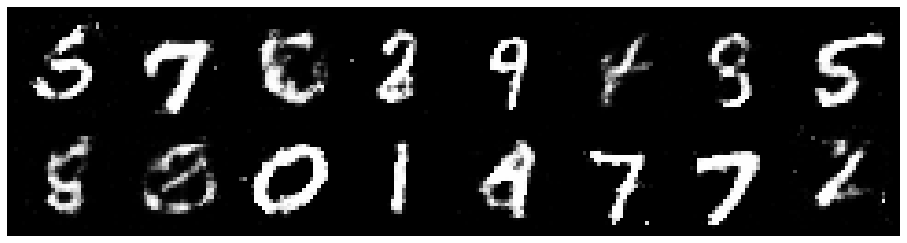

Epoch: [95/100], Batch Num: [0/700]
Discriminator Loss: 1.2003, Generator Loss: 0.8832
D(x): 0.5911, D(G(z)): 0.4355


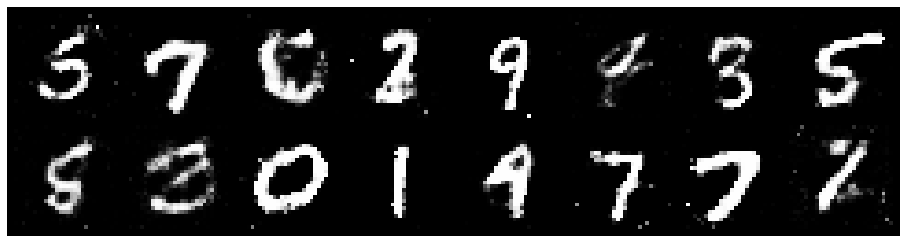

Epoch: [95/100], Batch Num: [100/700]
Discriminator Loss: 1.3037, Generator Loss: 0.8045
D(x): 0.5201, D(G(z)): 0.4480


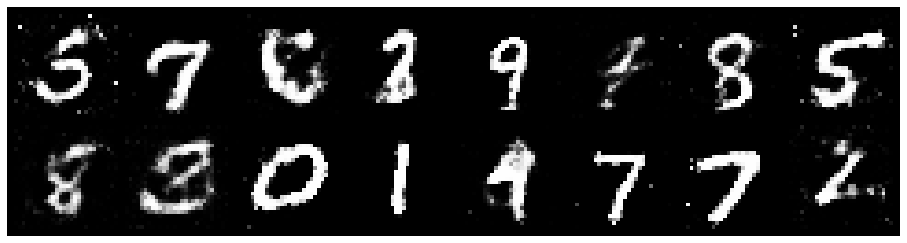

Epoch: [95/100], Batch Num: [200/700]
Discriminator Loss: 1.1812, Generator Loss: 0.8788
D(x): 0.5798, D(G(z)): 0.4182


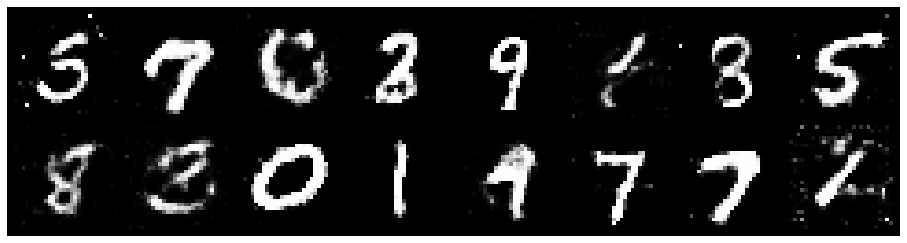

Epoch: [95/100], Batch Num: [300/700]
Discriminator Loss: 1.2250, Generator Loss: 0.9342
D(x): 0.5691, D(G(z)): 0.4236


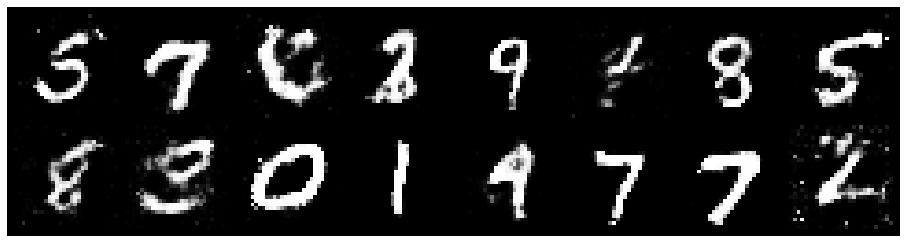

Epoch: [95/100], Batch Num: [400/700]
Discriminator Loss: 1.2243, Generator Loss: 0.9645
D(x): 0.5780, D(G(z)): 0.4400


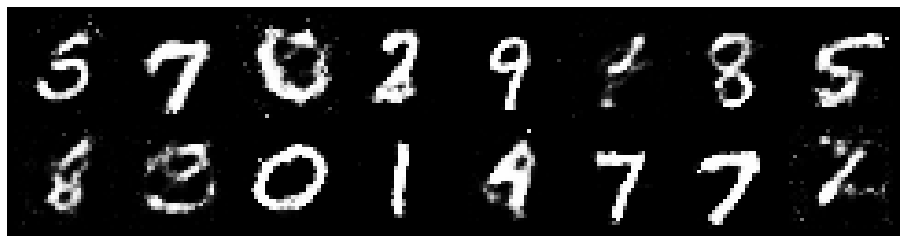

Epoch: [95/100], Batch Num: [500/700]
Discriminator Loss: 1.2994, Generator Loss: 0.8488
D(x): 0.5627, D(G(z)): 0.4637


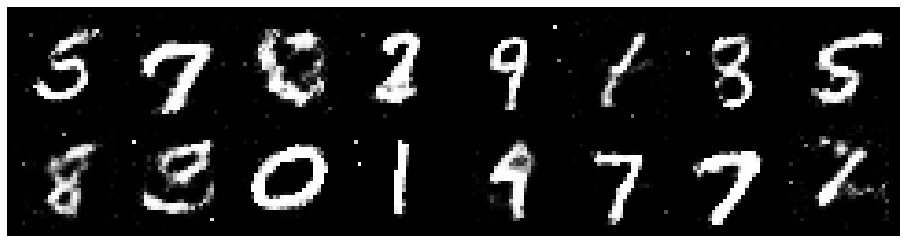

Epoch: [95/100], Batch Num: [600/700]
Discriminator Loss: 1.2353, Generator Loss: 0.8210
D(x): 0.5490, D(G(z)): 0.4234


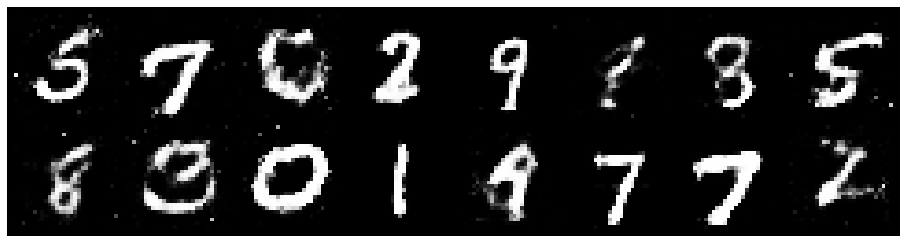

Epoch: [96/100], Batch Num: [0/700]
Discriminator Loss: 1.1570, Generator Loss: 1.0195
D(x): 0.6052, D(G(z)): 0.4073


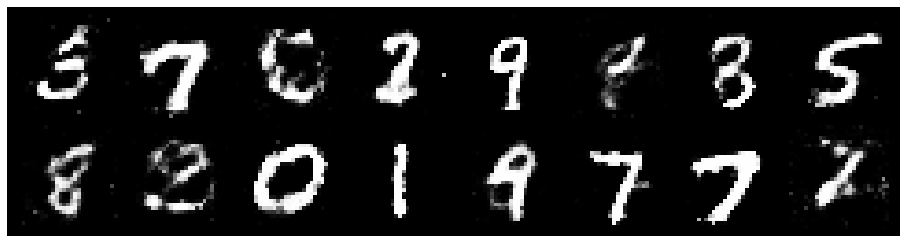

Epoch: [96/100], Batch Num: [100/700]
Discriminator Loss: 1.3006, Generator Loss: 0.9823
D(x): 0.5549, D(G(z)): 0.4575


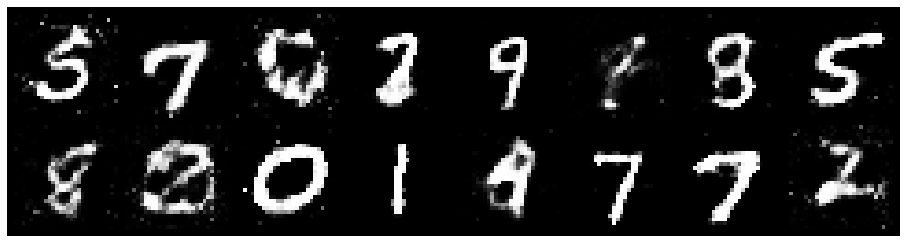

Epoch: [96/100], Batch Num: [200/700]
Discriminator Loss: 1.1780, Generator Loss: 0.8368
D(x): 0.6112, D(G(z)): 0.4442


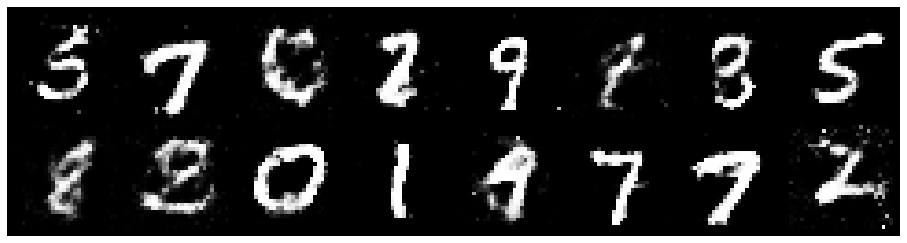

Epoch: [96/100], Batch Num: [300/700]
Discriminator Loss: 1.2333, Generator Loss: 0.8437
D(x): 0.5662, D(G(z)): 0.4350


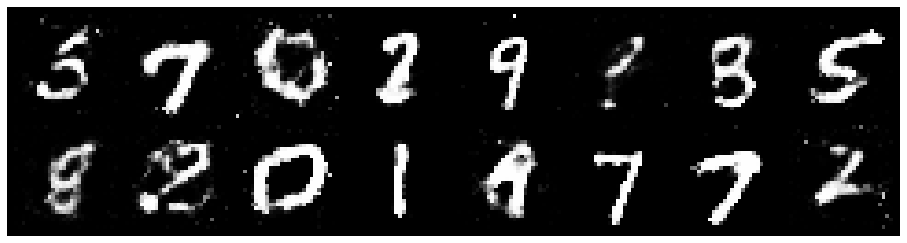

Epoch: [96/100], Batch Num: [400/700]
Discriminator Loss: 1.2128, Generator Loss: 0.8414
D(x): 0.5872, D(G(z)): 0.4423


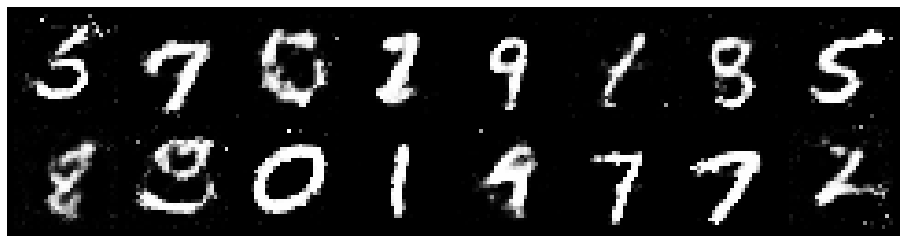

Epoch: [96/100], Batch Num: [500/700]
Discriminator Loss: 1.3093, Generator Loss: 0.8336
D(x): 0.5673, D(G(z)): 0.4780


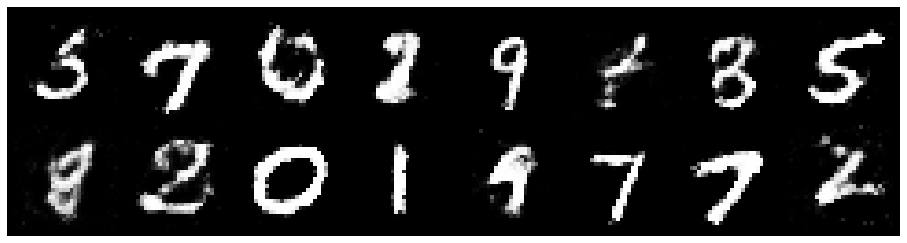

Epoch: [96/100], Batch Num: [600/700]
Discriminator Loss: 1.3470, Generator Loss: 0.7957
D(x): 0.5538, D(G(z)): 0.4720


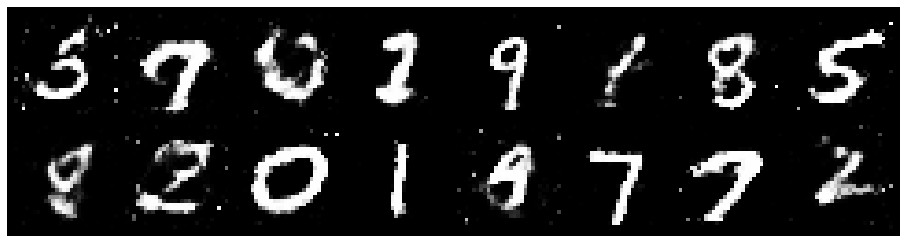

Epoch: [97/100], Batch Num: [0/700]
Discriminator Loss: 1.3621, Generator Loss: 0.9118
D(x): 0.5235, D(G(z)): 0.4566


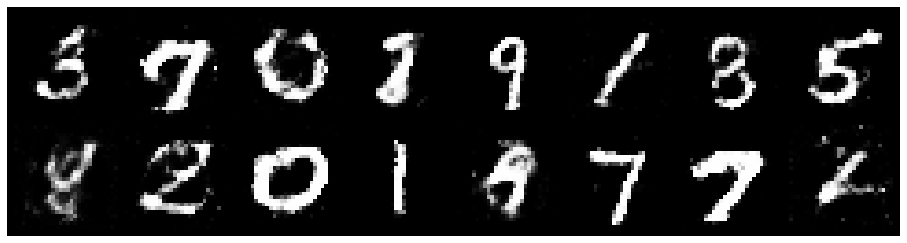

Epoch: [97/100], Batch Num: [100/700]
Discriminator Loss: 1.2502, Generator Loss: 0.9347
D(x): 0.5759, D(G(z)): 0.4428


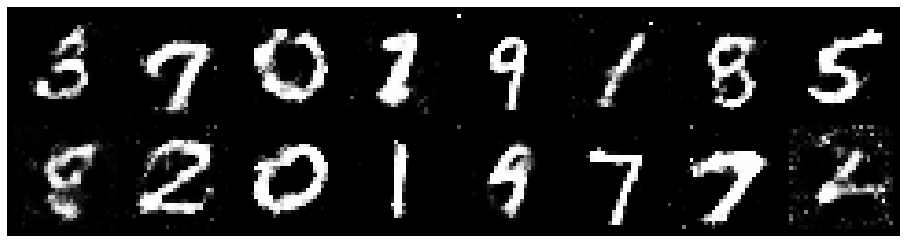

Epoch: [97/100], Batch Num: [200/700]
Discriminator Loss: 1.3472, Generator Loss: 0.8360
D(x): 0.5518, D(G(z)): 0.4712


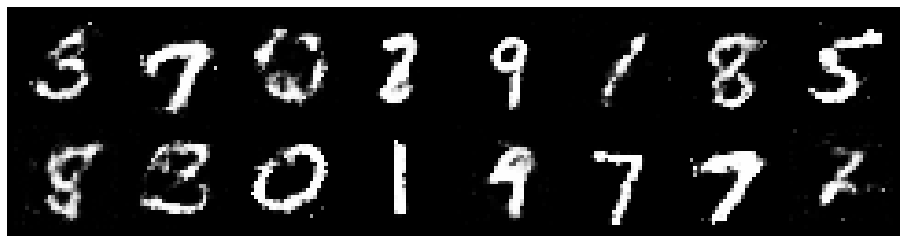

Epoch: [97/100], Batch Num: [300/700]
Discriminator Loss: 1.3458, Generator Loss: 0.8249
D(x): 0.5199, D(G(z)): 0.4421


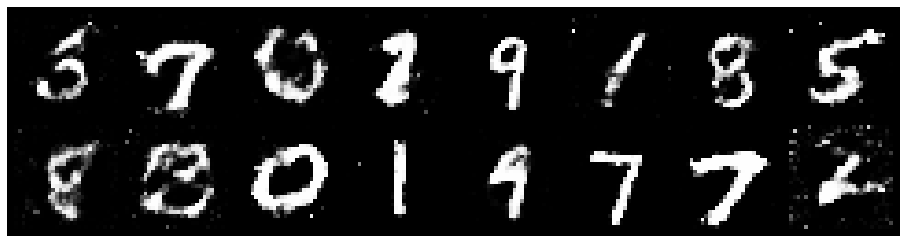

Epoch: [97/100], Batch Num: [400/700]
Discriminator Loss: 1.1540, Generator Loss: 1.0186
D(x): 0.5701, D(G(z)): 0.3975


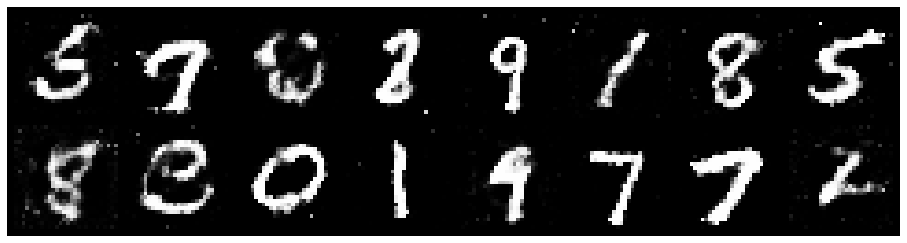

Epoch: [97/100], Batch Num: [500/700]
Discriminator Loss: 1.1828, Generator Loss: 0.9104
D(x): 0.6173, D(G(z)): 0.4414


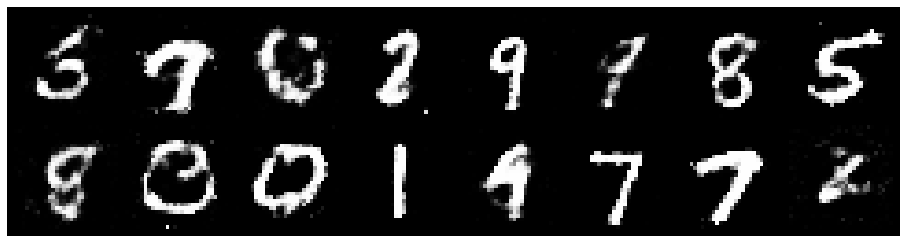

Epoch: [97/100], Batch Num: [600/700]
Discriminator Loss: 1.2581, Generator Loss: 0.9508
D(x): 0.5549, D(G(z)): 0.4354


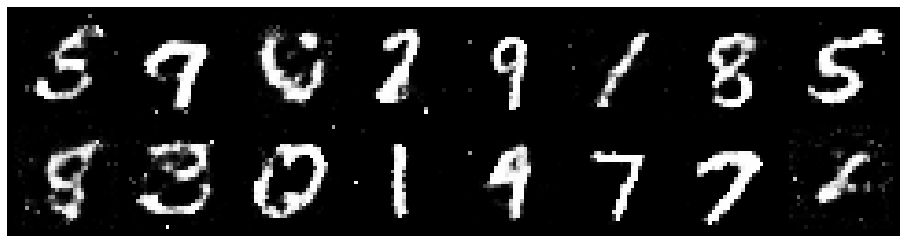

Epoch: [98/100], Batch Num: [0/700]
Discriminator Loss: 1.3327, Generator Loss: 0.9857
D(x): 0.5712, D(G(z)): 0.4620


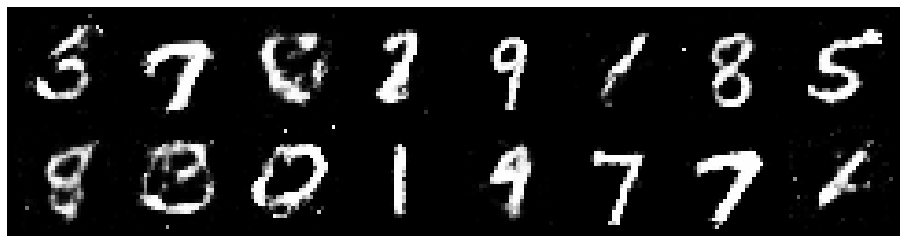

Epoch: [98/100], Batch Num: [100/700]
Discriminator Loss: 1.2927, Generator Loss: 0.7988
D(x): 0.5740, D(G(z)): 0.4609


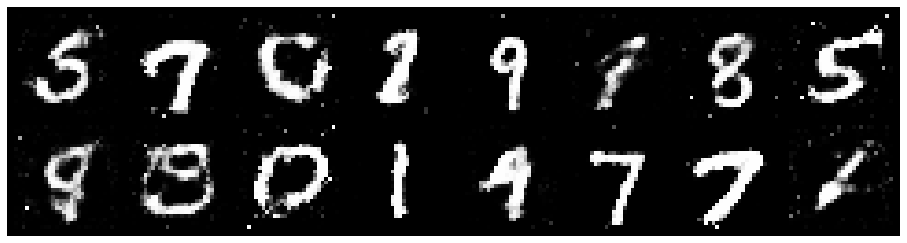

Epoch: [98/100], Batch Num: [200/700]
Discriminator Loss: 1.2405, Generator Loss: 0.9408
D(x): 0.5704, D(G(z)): 0.4396


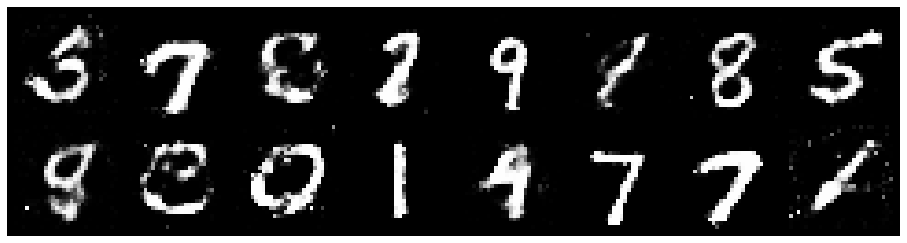

Epoch: [98/100], Batch Num: [300/700]
Discriminator Loss: 1.2303, Generator Loss: 0.9030
D(x): 0.5511, D(G(z)): 0.4344


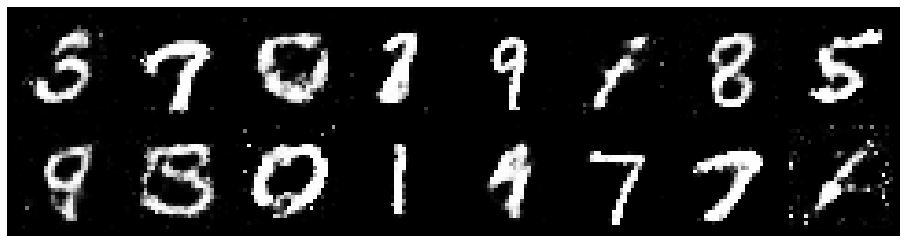

Epoch: [98/100], Batch Num: [400/700]
Discriminator Loss: 1.2543, Generator Loss: 0.7987
D(x): 0.5995, D(G(z)): 0.4950


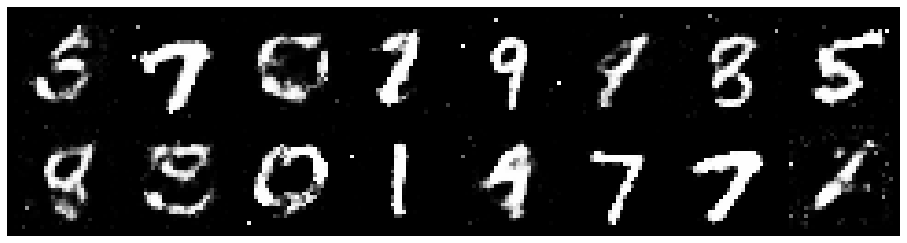

Epoch: [98/100], Batch Num: [500/700]
Discriminator Loss: 1.2870, Generator Loss: 0.7759
D(x): 0.5577, D(G(z)): 0.4610


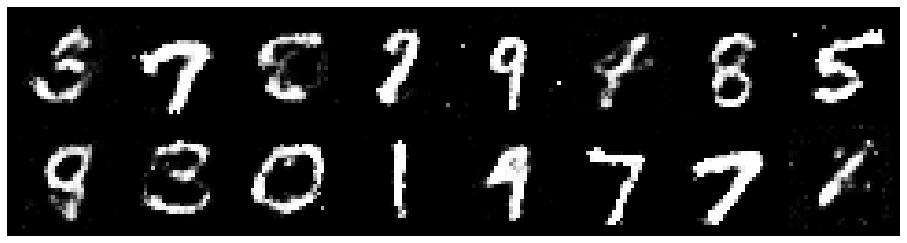

Epoch: [98/100], Batch Num: [600/700]
Discriminator Loss: 1.3369, Generator Loss: 0.8274
D(x): 0.5371, D(G(z)): 0.4566


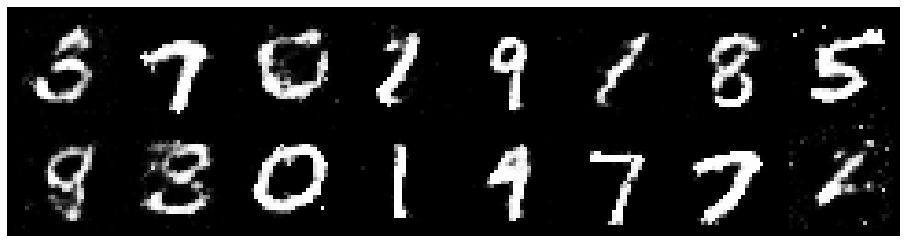

Epoch: [99/100], Batch Num: [0/700]
Discriminator Loss: 1.2438, Generator Loss: 1.0527
D(x): 0.5732, D(G(z)): 0.4255


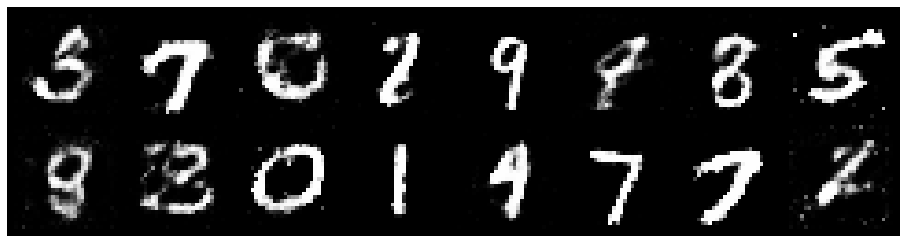

Epoch: [99/100], Batch Num: [100/700]
Discriminator Loss: 1.1893, Generator Loss: 0.9831
D(x): 0.5593, D(G(z)): 0.3901


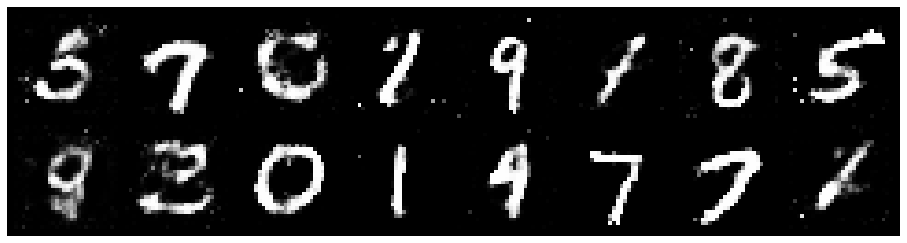

Epoch: [99/100], Batch Num: [200/700]
Discriminator Loss: 1.1610, Generator Loss: 0.9399
D(x): 0.5919, D(G(z)): 0.4151


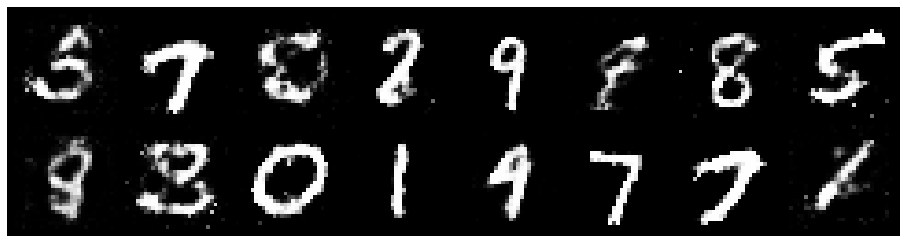

Epoch: [99/100], Batch Num: [300/700]
Discriminator Loss: 1.4131, Generator Loss: 0.8462
D(x): 0.5719, D(G(z)): 0.5110


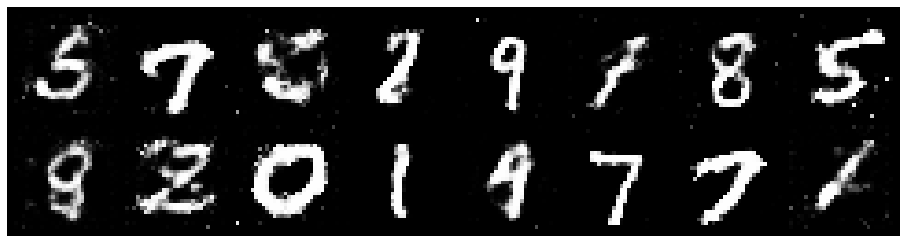

Epoch: [99/100], Batch Num: [400/700]
Discriminator Loss: 1.3851, Generator Loss: 0.8167
D(x): 0.5333, D(G(z)): 0.4935


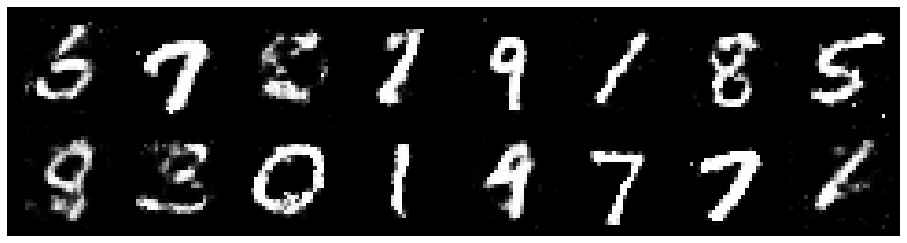

Epoch: [99/100], Batch Num: [500/700]
Discriminator Loss: 1.3077, Generator Loss: 0.8309
D(x): 0.5945, D(G(z)): 0.4920


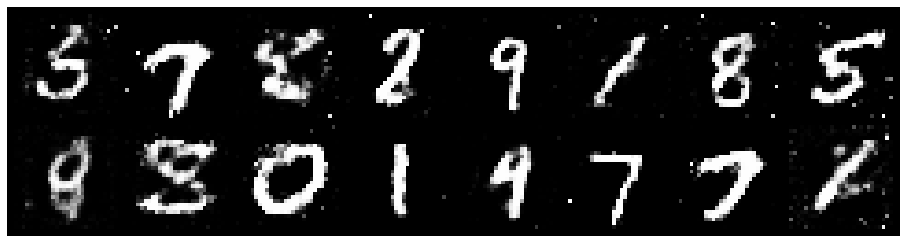

Epoch: [99/100], Batch Num: [600/700]
Discriminator Loss: 1.1937, Generator Loss: 0.9703
D(x): 0.5806, D(G(z)): 0.3958


In [26]:
logger = Logger(model_name = 'MNIST_GANS', data_name = 'MNIST')
epochs = 100
num_batches = len(dataloader)

for epoch in range(epochs):
  for batch, (real_batch, _) in enumerate(dataloader):
    N = real_batch.size(0)

    #Training discriminator
    real_data = Variable(images_to_vector(real_batch))

    #Generating fake data
    fake_data = generator(noise(N)).detach()

    dis_error, dis_real, dis_fake = train_discriminator(dis_optimizer, real_data, fake_data)

    #Training generator
    fake_data = generator(noise(N))
    gen_error = train_generator(gen_optimizer, fake_data)

    # Log batch error
    logger.log(dis_error, gen_error, epoch, batch, num_batches)

    ## Progress of batches 
    if(batch % 100 == 0):
      test_images = vector_to_image(generator(test_noise))
      test_images = test_images.data

      logger.log_images(test_images, test_samples, epoch, batch, num_batches)
      #display images
      logger.display_status(epoch, epochs, batch, num_batches, dis_error, gen_error, dis_real, dis_fake) 
